# Week 3 - Classification

## Ying Sun

This week, we shift from gathering human textual classifications through crowdsourcing, to using machine learning models and algorithms that train on those human classifications and extend them to documents far too numerous to read. If you recall, *clustering* allows us to stably partition text data (e.g., documents, turns of conversation) according to all patterns of covariation among available text features. *Classification*, by contrast, partitions text data according to only those features and their variation that enable us to mimic and extrapolate human annotations.

In this notebook, we will show how to use a variety of classification methods, including Naïve Bayes, Logistic regression, K-nearest neighbor, decision trees and random forests, support vector machines and even a simple neural network, the perceptron. We will also demonstrate ensemble techniques that can link several such methods into a single, more accurate, classification pipeline. We will finally learn to use conventions and metrics to evaluate classifier performance on out-of-sample data. 

For this notebook we will be using the following packages.

In [1]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
import lucem_illud_2020 #pip install -U git+git://github.com/Computational-Content-Analysis-2020/lucem_illud_2020.git

#All these packages need to be installed from pip
#For ML
import sklearn
import sklearn.naive_bayes
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
import sklearn.decomposition

import nltk #For tokenizing and normalizing
import numpy as np #arrays
import matplotlib.pyplot as plt #Plots
import matplotlib.colors # For nice colours
import seaborn #Makes plots look nice, also heatmaps
import scipy as sp #for interp

#These are from the standard library
import collections
import os
import os.path
import random
import re
import glob
import pandas
import requests
import json
import math

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

# Simple Simulated Examples

Here we create a sandbox for you to explore different types of classified data and how different statistical classifiers perform on each type.

## Generating example data

We start by loading one of the "cartoon" or simplified data sets and then dividing it into training and testing sets. To maximize our ability to visualize, each dataset involves two classes, colored yellow and blue, arrayed along two two dimensions (`x` and `y`). 

The four data patterns include: 
+ `random` in which the two classes are randomly distributed across both dimensions
+ `andSplit` in which the two classes are linearly split along one of two dimensions (e.g., men like Adidas)
+ `xorSplit` in which the two classes are split, oppositely, along each dimension (e.g., old ladies and young men like Nikes)
+ `targetSplit` in which one class is nested within the other in two dimensions (e.g., middle aged, middle income people like vintage Mustangs)
+ `multiBlobs` in which 5 classes are placed as bivariate Gaussians at random locations

`noise` is a variable [0-1] that ranges from no noise in the prescribed pattern [0] to complete noise/randomness [1].

Uncomment (remove the # in front of) each dataset, one at a time, and then run the cell and subsequent cells to examine how each machine learning approach captures each pattern.

In [2]:
noise = .2

#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.random())
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.andSplit(noise))
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.xorSplit(noise)) #Please try this one
dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.targetSplit(noise))
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.multiBlobs(noise))

We can easily visualize the rendered datasets because they are generated in two dimensions.

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


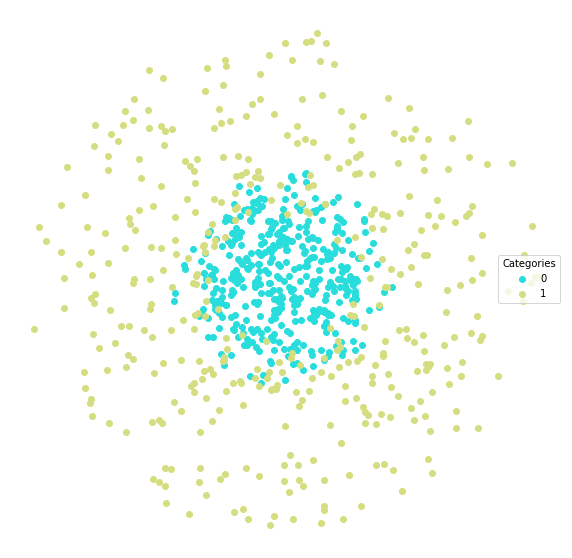

In [3]:
lucem_illud_2020.plotter(dfTrain)

## Training a Machine Learning algorithm

We can now pick a model, there are many more options in `scikit-learn`. These are just a few examples, which array along the machine learning "tribes" described in Pedro Domingos _The Master Algorithm_.

Uncomment (remove the # in front of) each algorithm one at a time, then run the cell and subsequent cells to evaluate how it learns to understand the data.

In [4]:
#Bayes
#clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
#clf = sklearn.linear_model.LogisticRegression()

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

Now we fit the model by giving it our training data

In [5]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='distance')

## Algorithm evaluation

We can look at few measurements of each classifier's performance by using the testing set

In [6]:
lucem_illud_2020.evaluateClassifier(clf, dfTest)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.115,0.884654,0.894737,0.841047,0.867347
1,0.115,0.884654,0.876190,0.840289,0.901961


This lets us look at which classes do better:

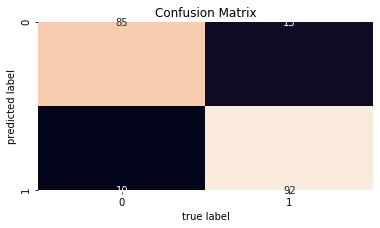

In [7]:
lucem_illud_2020.plotConfusionMatrix(clf, dfTest)

The greater the area under the curve the better.

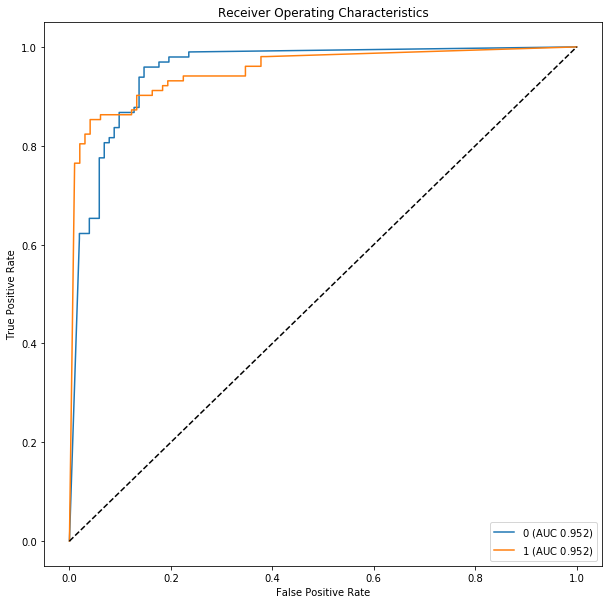

In [8]:
lucem_illud_2020.plotMultiROC(clf, dfTest)

We can also look at the regions the classifer identifies as one class or the other:

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


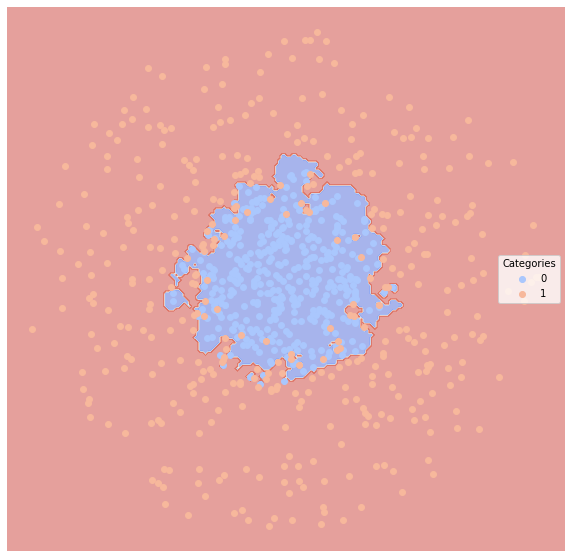

In [9]:
lucem_illud_2020.plotregions(clf, dfTrain)

## Now we do the same for real data

Available data sets include:
+ Reddit threads "classified" by thread topic
+ 20 newsgroups "classified" by group topic
+ Senate press releases "classified" by Senator (2 senators)
+ Senate press releases "classified" by Senator (5 senators)
+ Emails classified as Spam or Ham

In [10]:
dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadReddit())
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadNewsGroups())
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadSenateSmall())
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadSenateLarge())
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadSpam())

Loading Reddit data
Converting to vectors


In [11]:
#Bayes
clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up, but lose ROC
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
#clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
#clf = sklearn.linear_model.LogisticRegression()

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

In [12]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

GaussianNB(priors=None, var_smoothing=1e-09)

In [13]:
lucem_illud_2020.evaluateClassifier(clf, dfTest)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
Tales From Tech Support,0.047022,0.911452,0.969697,0.846734,0.831169
Relationships,0.181818,0.713362,0.763636,0.509718,0.482759
Bad Roommates,0.153605,0.771212,0.750000,0.561157,0.614458
Weeaboo Tales,0.206897,0.846716,0.523077,0.506556,0.944444


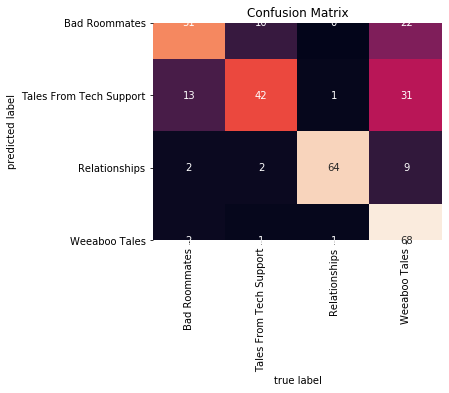

In [14]:
lucem_illud_2020.plotConfusionMatrix(clf, dfTest)

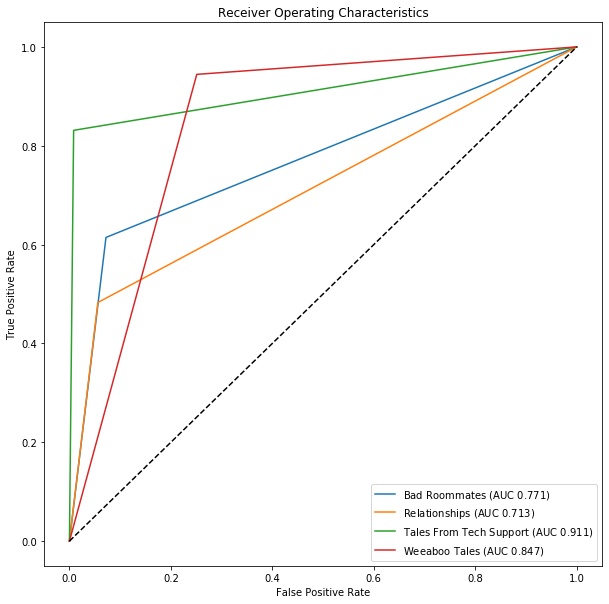

In [15]:
lucem_illud_2020.plotMultiROC(clf, dfTest)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

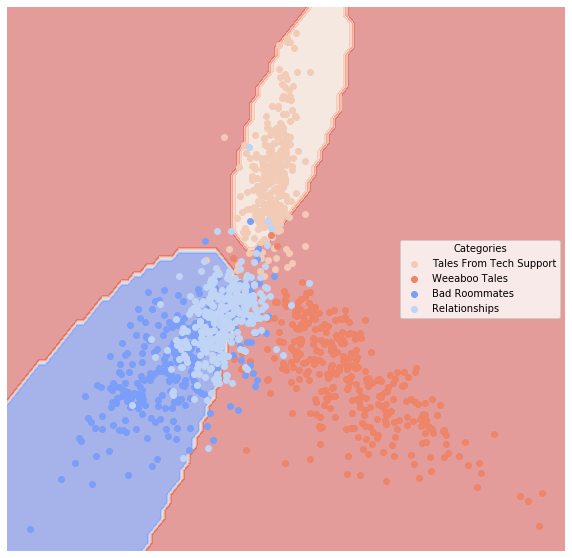

In [16]:
lucem_illud_2020.plotregions(clf, dfTrain)

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Go back through all of the cells above and generate 10 distinct artificial datasets and classify them with all of the available methods. Add a cell immediately below and describe which classifier(s) worked best with which artificially constructed data source and why. Then go through all of the empirical datasets (i.e., Newsgroups, Senate Small, Senate Large, Email Spam) and classify them with all available methods. Add a second cell immediately below and describe which classifier(s) worked best with which data set and why.

<span style="color:red">***Stretch*** (but also required) Wander through the SKLearn documentation available [here](http://scikit-learn.org/stable/), particularly perusing the classifiers. In cells following, identify and implement a new classifier that we have not yet used (e.g., AdaBoost, CART) on one artificial dataset and one real dataset (used above). Then, in the next cell describe the classifier, detail how it compares with the approaches above, and why it performed better or worse than others.

In [95]:
# generate 10 distinct artificial datasets

# generate 5 distinct datasets with noise1=0.3
noise1 = .3
# Random
dfTrain0, dfTest0 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.random())
# andSplit
dfTrain1, dfTest1 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.andSplit(noise1))
# xorSplit
dfTrain2, dfTest2 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.xorSplit(noise1))
# targetSplit
dfTrain3, dfTest3 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.targetSplit(noise1))
# multiBlobs
dfTrain4, dfTest4 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.multiBlobs(noise1))

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


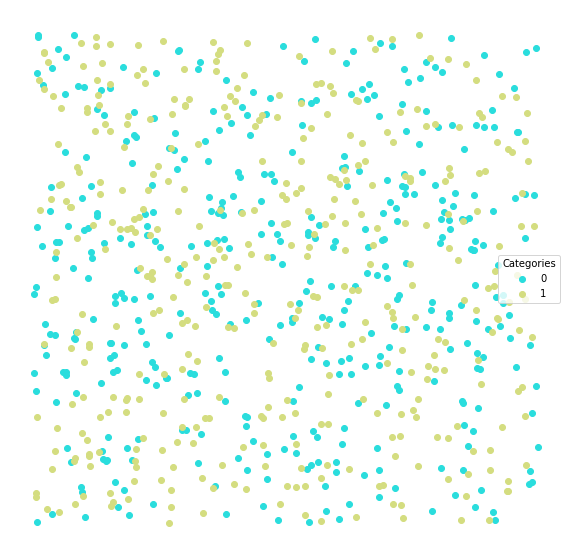

In [96]:
# visualize the random samples
lucem_illud_2020.plotter(dfTrain0)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


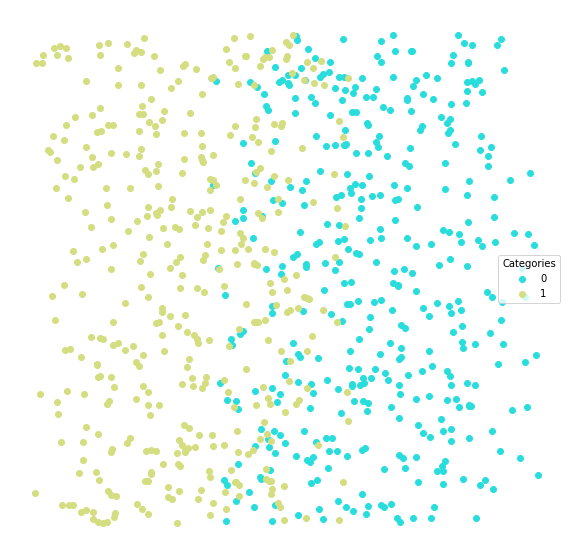

In [97]:
# visualize the andSplit samples
lucem_illud_2020.plotter(dfTrain1)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


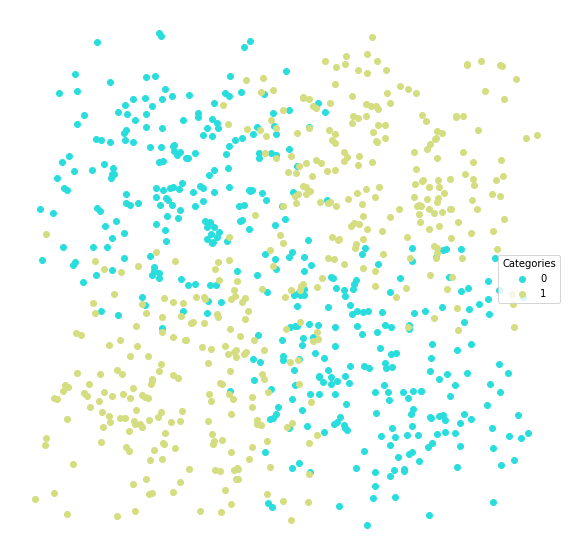

In [98]:
# visualize the xorSplit samples
lucem_illud_2020.plotter(dfTrain2)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


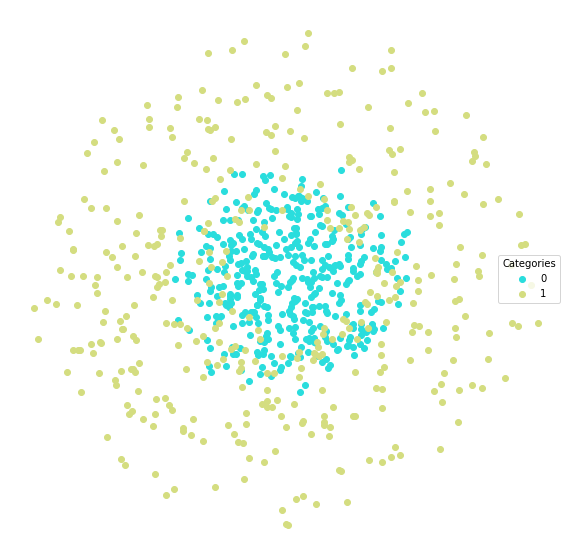

In [99]:
# visualize the targetSplit samples
lucem_illud_2020.plotter(dfTrain3)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

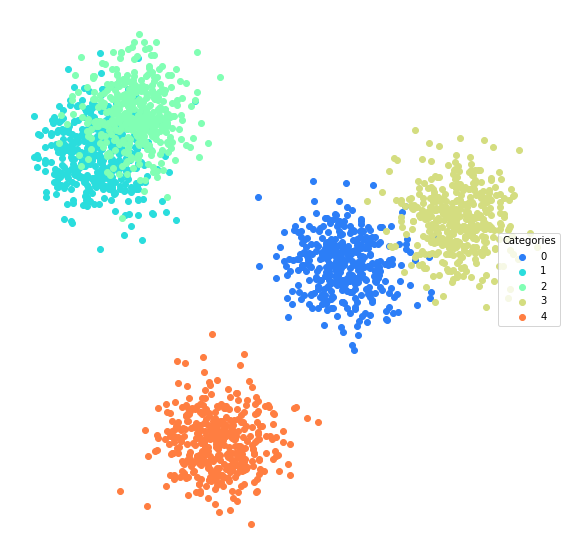

In [100]:
# visualize the multiBlobs samples
lucem_illud_2020.plotter(dfTrain4)

In [101]:
# generate the other 5 distinct artificial datasets with noise2 = 0.5
noise2 = .5
# Random
dfTrain5, dfTest5 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.random())
# andSplit
dfTrain6, dfTest6 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.andSplit(noise2))
# xorSplit
dfTrain7, dfTest7 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.xorSplit(noise2))
# targetSplit
dfTrain8, dfTest8 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.targetSplit(noise2))
# multiBlobs
dfTrain9, dfTest9 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.multiBlobs(noise2))

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


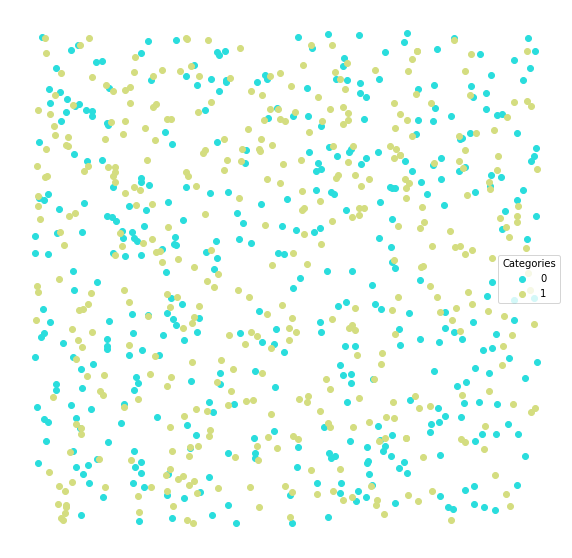

In [102]:
# visualization
lucem_illud_2020.plotter(dfTrain5)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


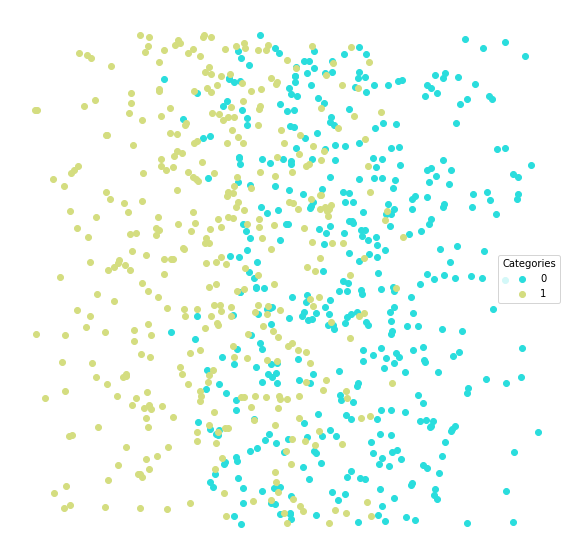

In [103]:
lucem_illud_2020.plotter(dfTrain6)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


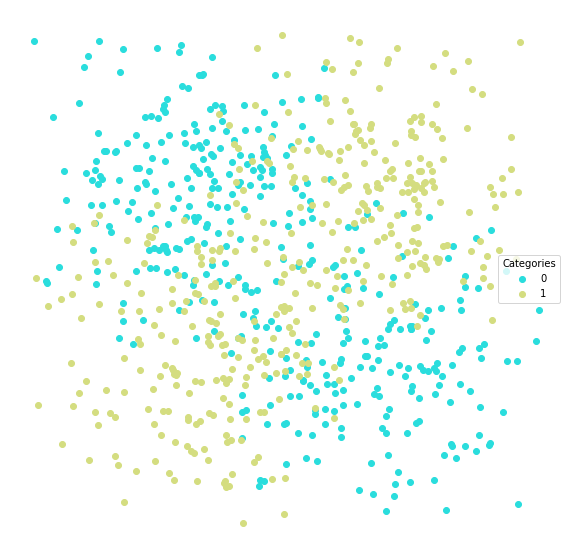

In [104]:
lucem_illud_2020.plotter(dfTrain7)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


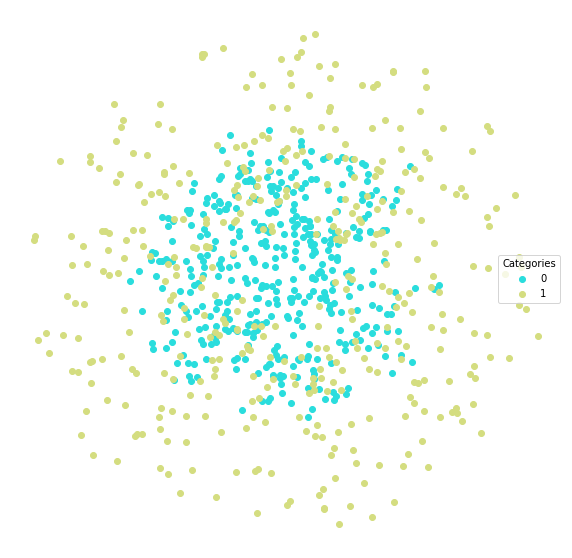

In [105]:
lucem_illud_2020.plotter(dfTrain8)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

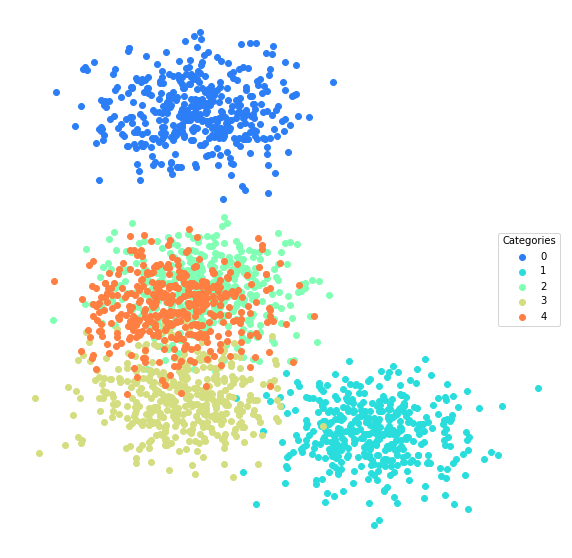

In [106]:
lucem_illud_2020.plotter(dfTrain9)

Implemented classification with all or the available methonds.

In [107]:
# single model
def single_model(method, dfTrain, dfTest):
    # Bayes
    if method == 'bayes':
        clf = sklearn.naive_bayes.GaussianNB()
    # Analigizes
    elif method == 'svm_linear':
        clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up
    elif method == 'svm_poly':
        clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
    elif method == 'knn':
        clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'
    elif method == 'classical_reg':
        clf = sklearn.linear_model.LogisticRegression()
    # Symbolists
    elif method == 'decision_tree':
        clf = sklearn.tree.DecisionTreeClassifier()
    elif method == 'random_forest':
        clf = sklearn.ensemble.RandomForestClassifier()
    # Connectionists
    elif method == 'neural_network':
        clf = sklearn.neural_network.MLPClassifier()
    # Ensemble
    elif method == 'boosting':
        clf = sklearn.ensemble.GradientBoostingClassifier()
    
    
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    
    # Evaluation
    eval_df = lucem_illud_2020.evaluateClassifier(clf, dfTest)
    print(method, ' Evaluation:')
    print(eval_df)
    print(method, ' Confusion Matrix:')
    lucem_illud_2020.plotConfusionMatrix(clf, dfTest)
    print(method, ' ROC:')
    lucem_illud_2020.plotMultiROC(clf, dfTest)
    print(method, ' Regions:')
    lucem_illud_2020.plotregions(clf, dfTrain)
    
    return eval_df

In [108]:
# all models
def all_model(dfTrain, dfTest):
    eval_lst = []
    
    eval_bayes = single_model('bayes', dfTrain, dfTest)
    eval_svm_linear = single_model('svm_linear', dfTrain, dfTest)
    eval_svm_poly = single_model('svm_poly', dfTrain, dfTest)
    eval_knn = single_model('knn', dfTrain, dfTest)
    eval_classical_reg = single_model('classical_reg', dfTrain, dfTest)
    eval_dt = single_model('decision_tree', dfTrain, dfTest)
    eval_rf = single_model('random_forest', dfTrain, dfTest)
    eval_neural_network = single_model('neural_network', dfTrain, dfTest)
    eval_boosting = single_model('boosting', dfTrain, dfTest)
    
    eval_lst.append(eval_bayes)
    eval_lst.append(eval_svm_linear)
    eval_lst.append(eval_svm_poly)
    eval_lst.append(eval_knn)
    eval_lst.append(eval_classical_reg)
    eval_lst.append(eval_dt)
    eval_lst.append(eval_rf)
    eval_lst.append(eval_neural_network)
    eval_lst.append(eval_boosting)
    
    return eval_lst

bayes  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.45  0.548955   0.556962           0.522539  0.444444
1               0.45  0.548955   0.545455           0.531436  0.653465
bayes  Confusion Matrix:


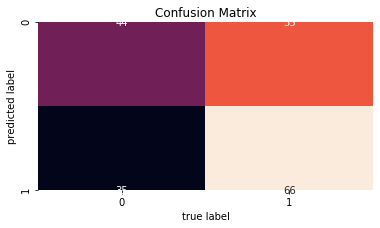

bayes  ROC:


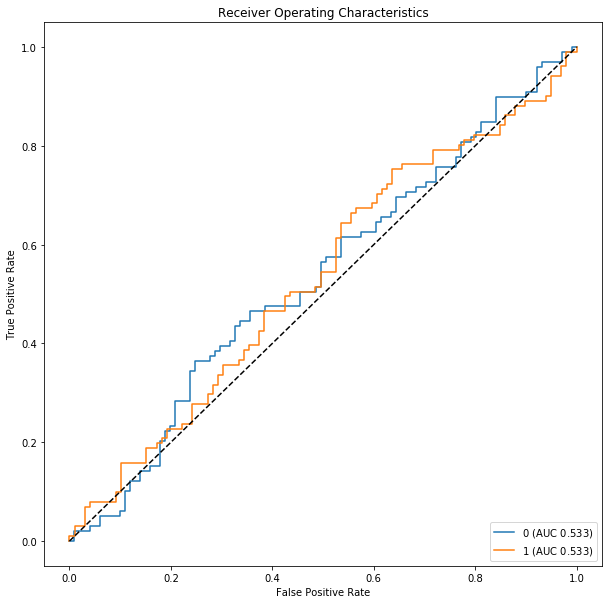

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


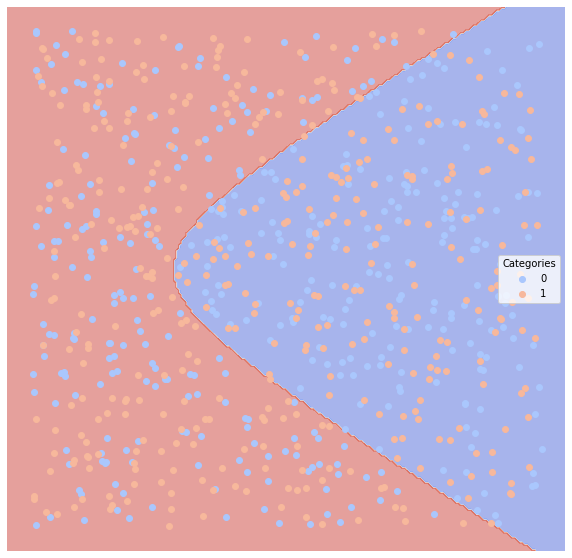

svm_linear  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.465  0.534403   0.534091           0.513558  0.474747
1              0.465  0.534403   0.535714           0.523246  0.594059
svm_linear  Confusion Matrix:


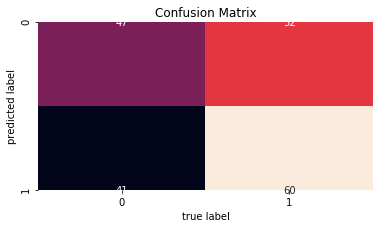

svm_linear  ROC:


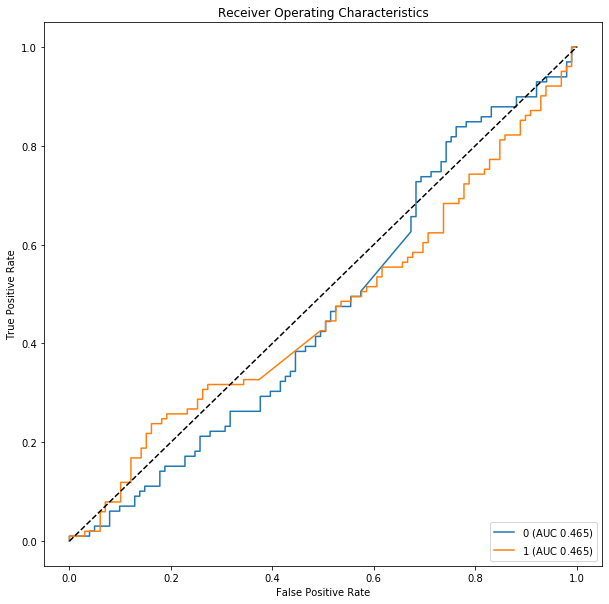

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


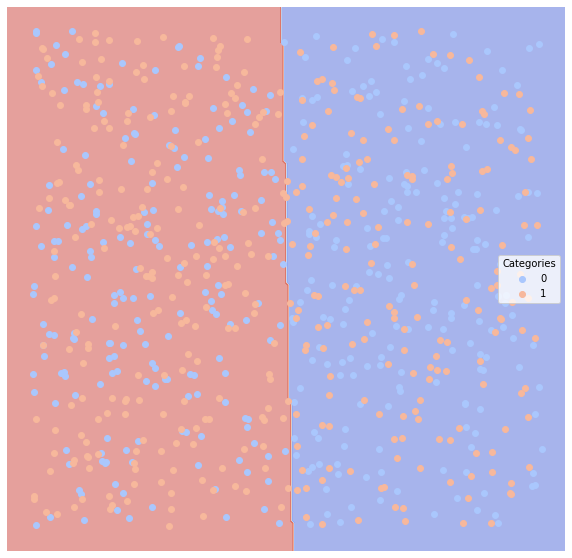

svm_poly  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.49  0.511751   0.503704           0.500978  0.686869
1               0.49  0.511751   0.523077           0.511085  0.336634
svm_poly  Confusion Matrix:


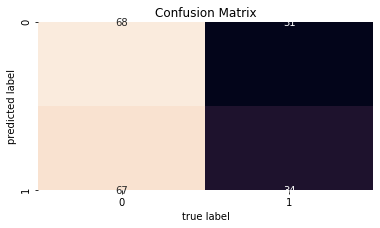

svm_poly  ROC:


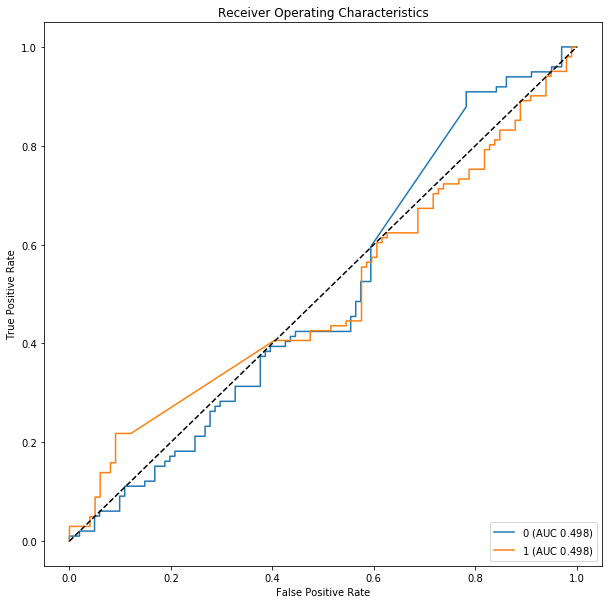

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


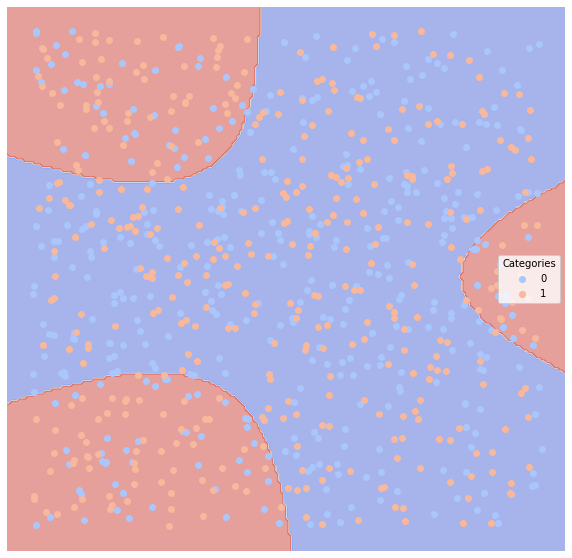

knn  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.525  0.474697   0.468085           0.483038  0.444444
1              0.525  0.474697   0.481132           0.492948  0.504950
knn  Confusion Matrix:


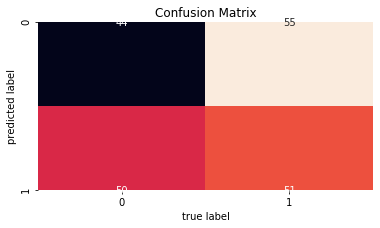

knn  ROC:


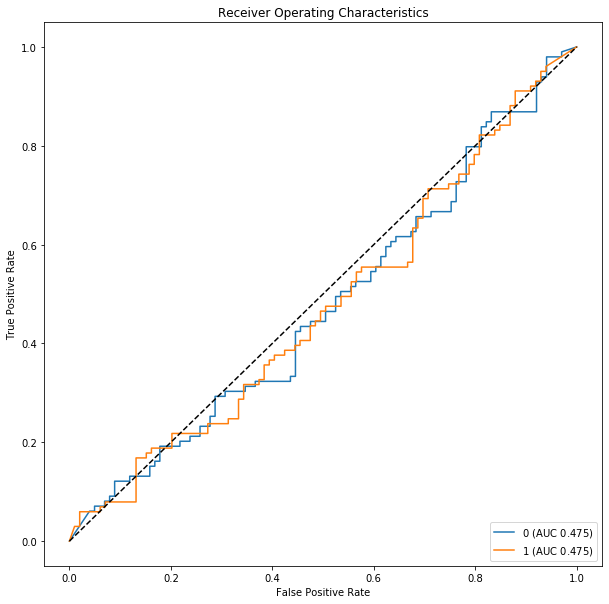

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


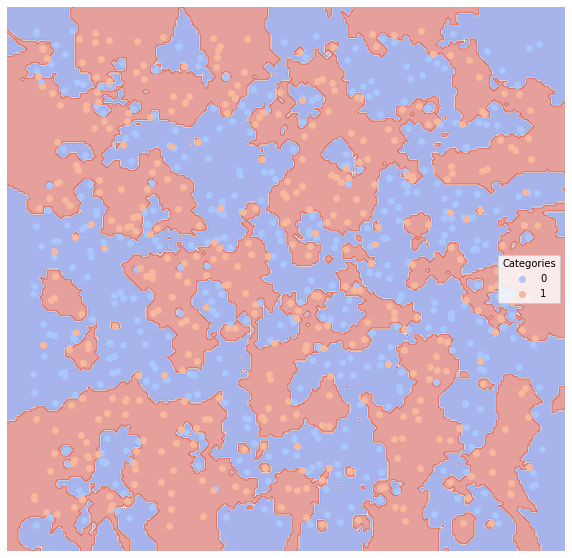

classical_reg  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.48  0.519652   0.516129           0.505244  0.484848
1               0.48  0.519652   0.523364           0.515182  0.554455
classical_reg  Confusion Matrix:


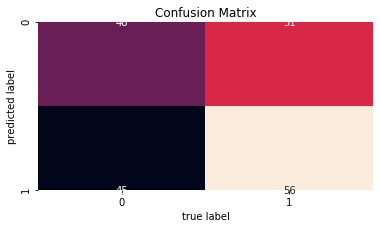

classical_reg  ROC:


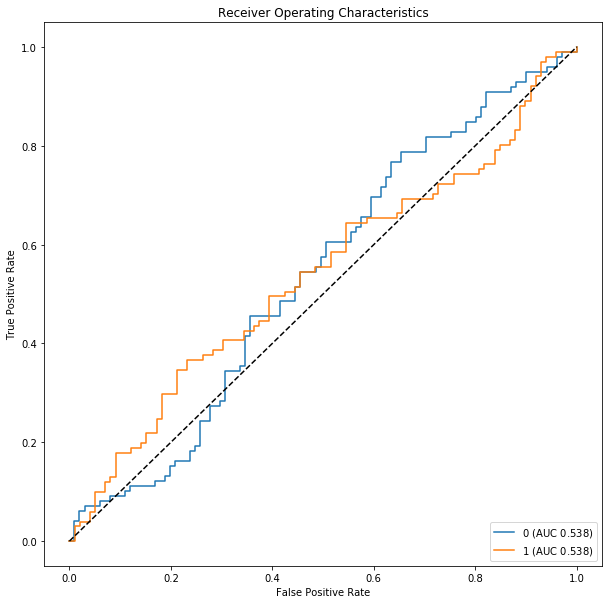

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


classical_reg  Regions:


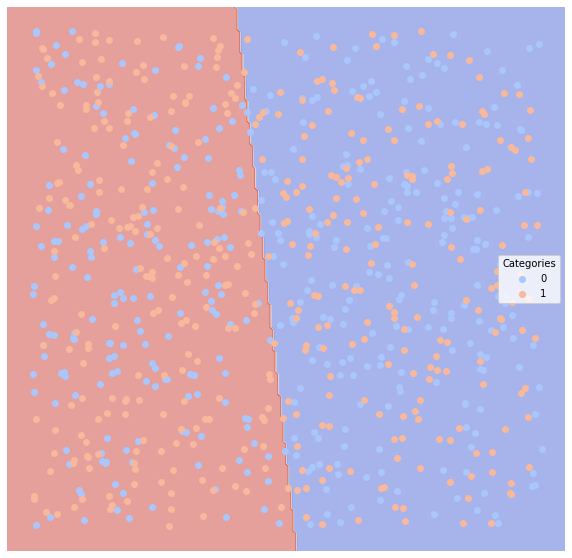

decision_tree  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.53  0.469647   0.462366           0.480825  0.434343
1               0.53  0.469647   0.476636           0.490677  0.504950
decision_tree  Confusion Matrix:


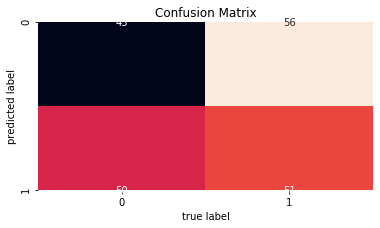

decision_tree  ROC:


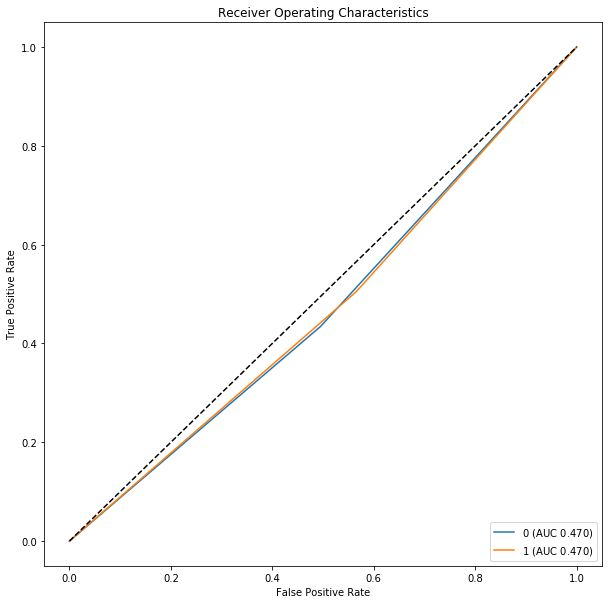

decision_tree  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


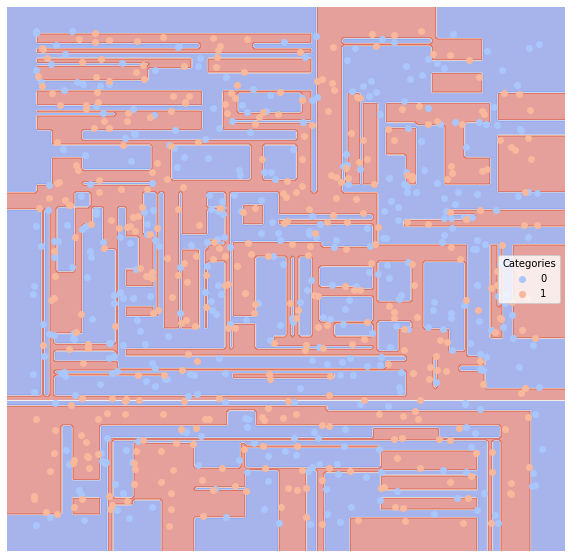

random_forest  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.56  0.440544   0.441441           0.468491  0.494949
1               0.56  0.440544   0.438202           0.479207  0.386139
random_forest  Confusion Matrix:


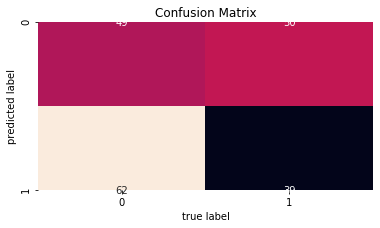

random_forest  ROC:


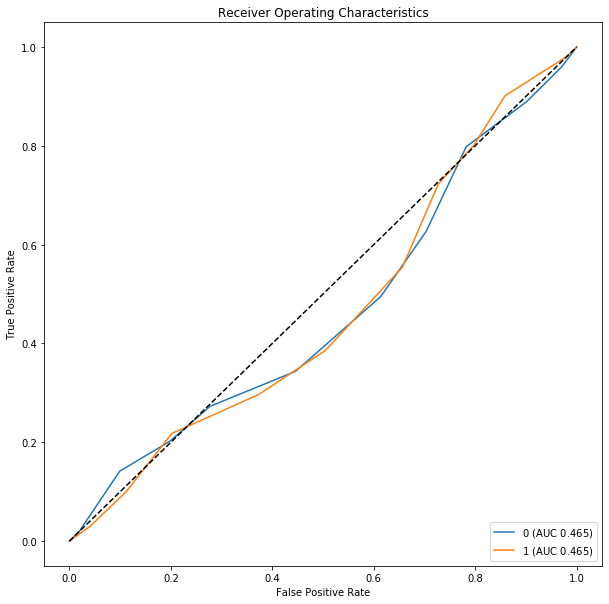

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


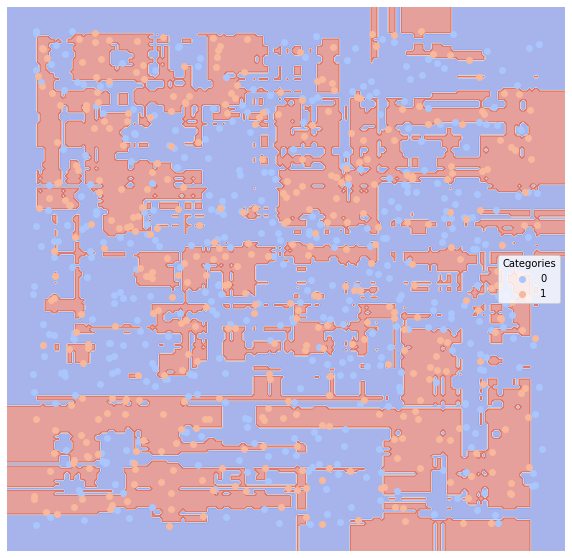

neural_network  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.465  0.534703   0.531915           0.513644  0.505051
1              0.465  0.534703   0.537736           0.523475  0.564356
neural_network  Confusion Matrix:


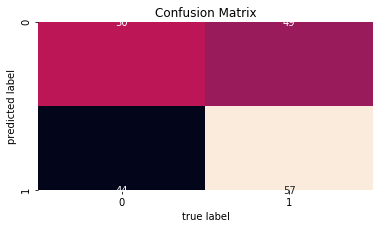

neural_network  ROC:


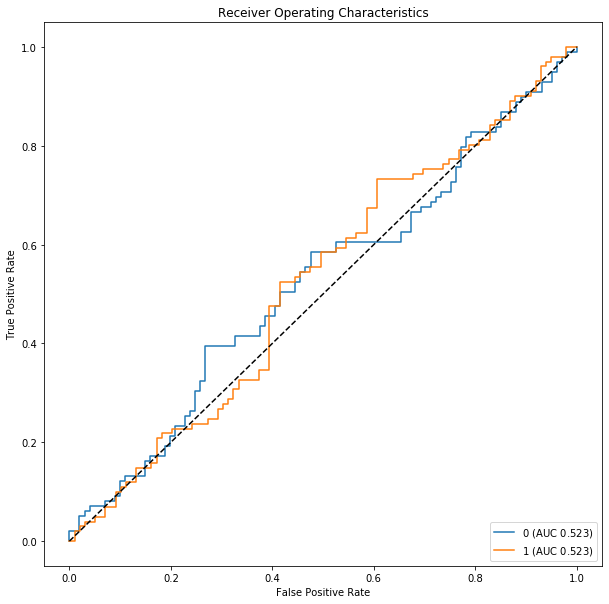

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


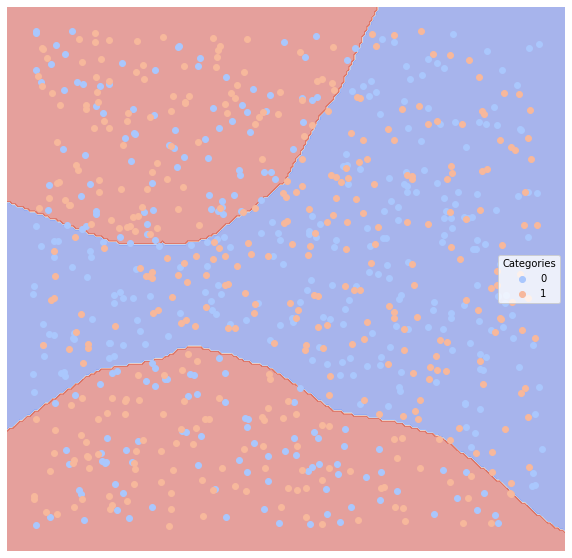

boosting  Evaluation:
          Error_Rate     AUC  Precision  Average_Precision    Recall
Category                                                            
0              0.495  0.5048   0.500000           0.497424  0.484848
1              0.495  0.5048   0.509615           0.507422  0.524752
boosting  Confusion Matrix:


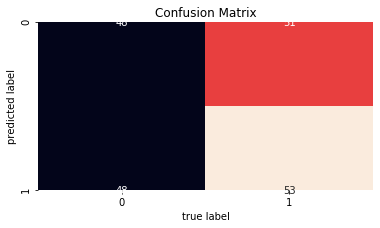

boosting  ROC:


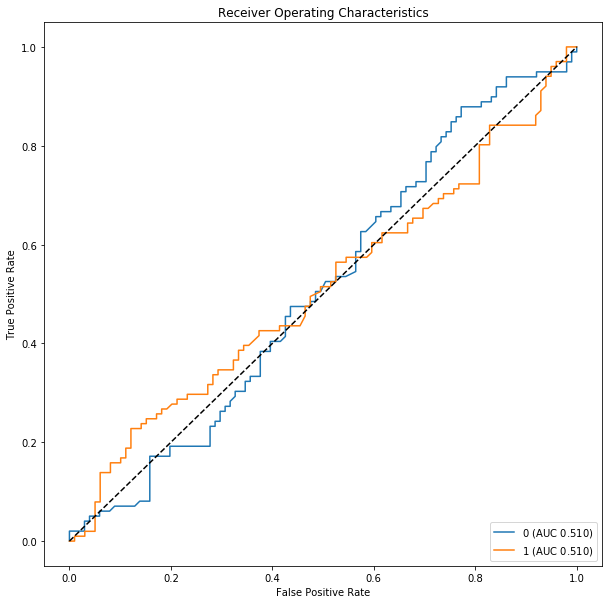

boosting  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


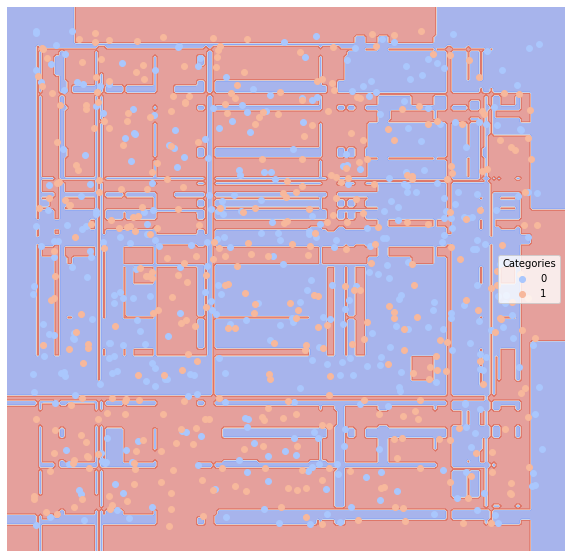

In [109]:
eval0 = all_model(dfTrain0, dfTest0)

bayes  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.13  0.870548   0.895833           0.835310  0.843137
1               0.13  0.870548   0.846154           0.809812  0.897959
bayes  Confusion Matrix:


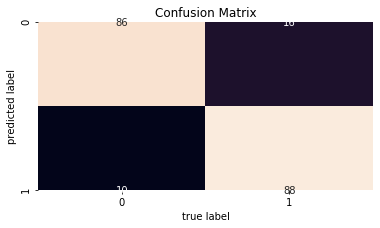

bayes  ROC:


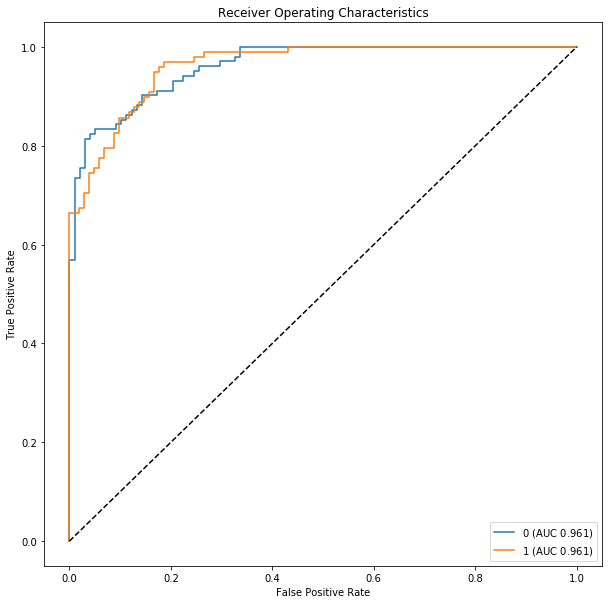

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


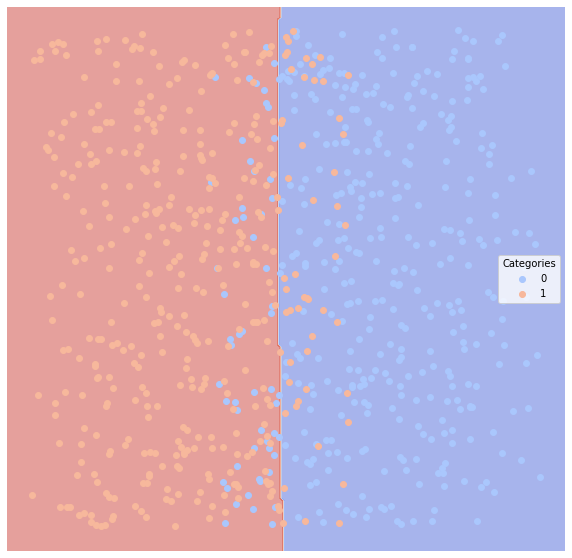

svm_linear  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.115  0.886255   0.943820           0.867264  0.823529
1              0.115  0.886255   0.837838           0.820091  0.948980
svm_linear  Confusion Matrix:


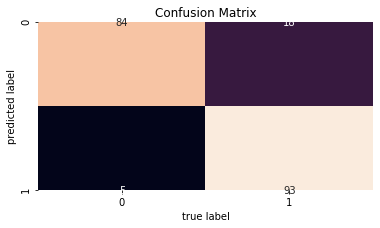

svm_linear  ROC:


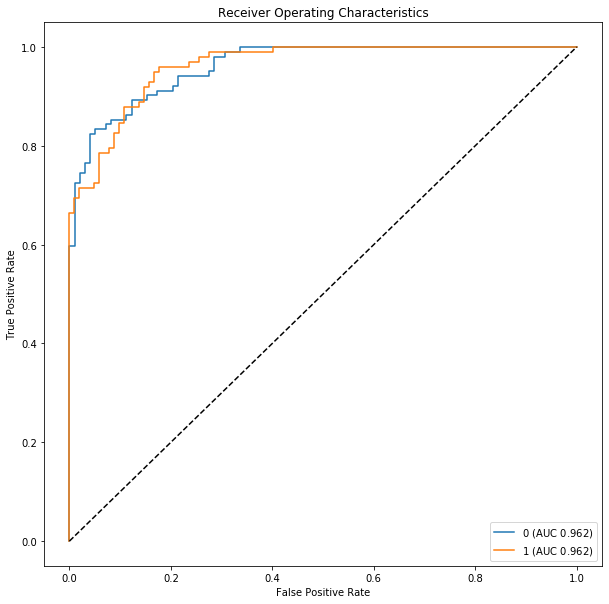

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


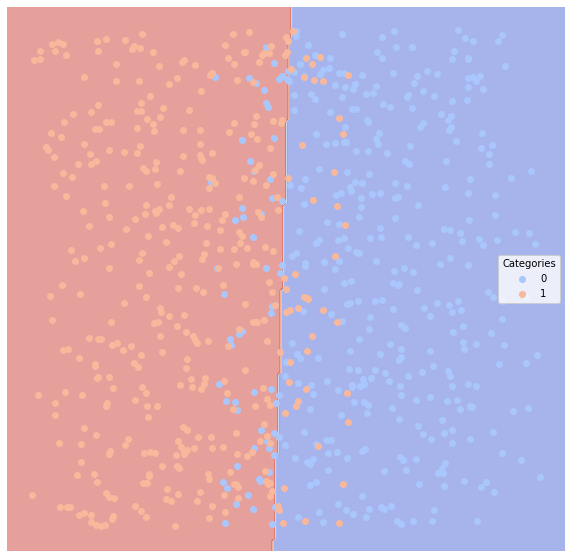

svm_poly  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.155  0.844438   0.831776           0.790765  0.872549
1              0.155  0.844438   0.860215           0.792216  0.816327
svm_poly  Confusion Matrix:


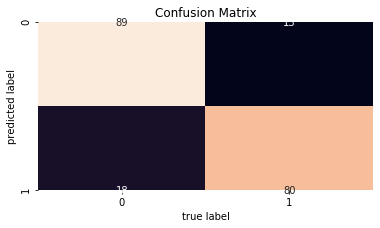

svm_poly  ROC:


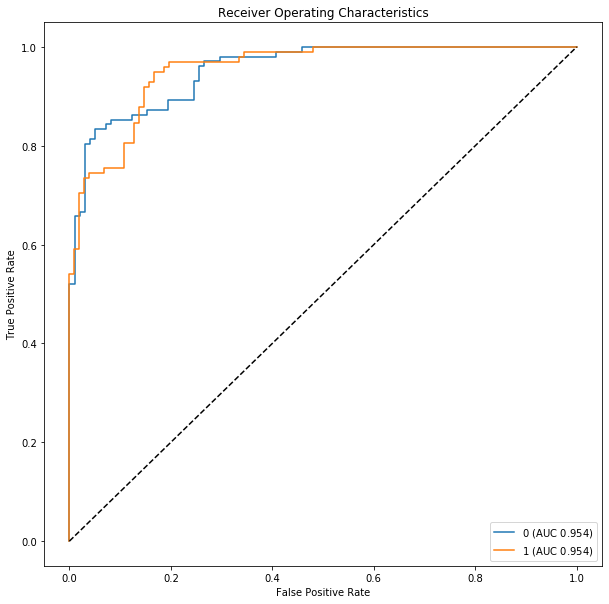

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


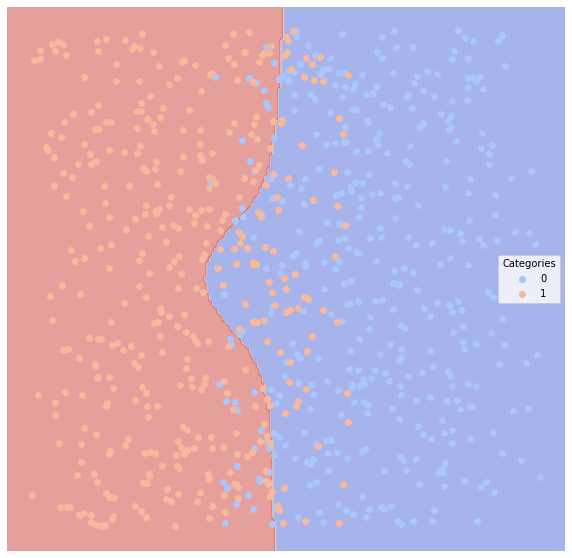

knn  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.16  0.840536   0.864583           0.798533  0.813725
1               0.16  0.840536   0.817308           0.773889  0.867347
knn  Confusion Matrix:


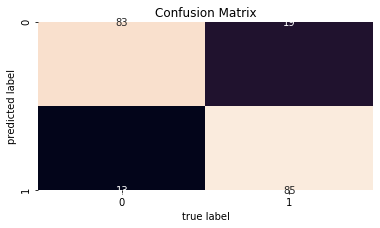

knn  ROC:


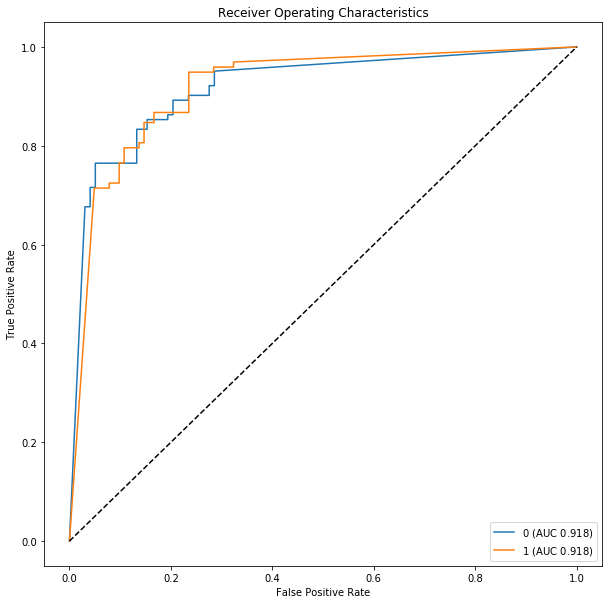

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


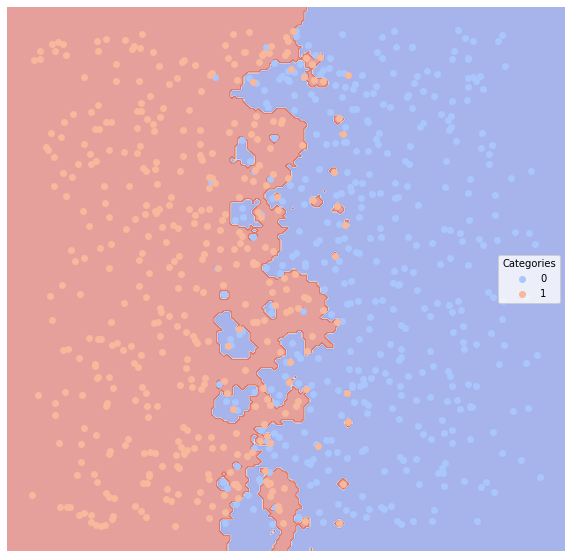

classical_reg  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.12  0.880752   0.914894           0.851381  0.843137
1               0.12  0.880752   0.849057           0.819746  0.918367
classical_reg  Confusion Matrix:


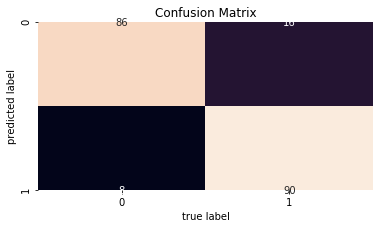

classical_reg  ROC:


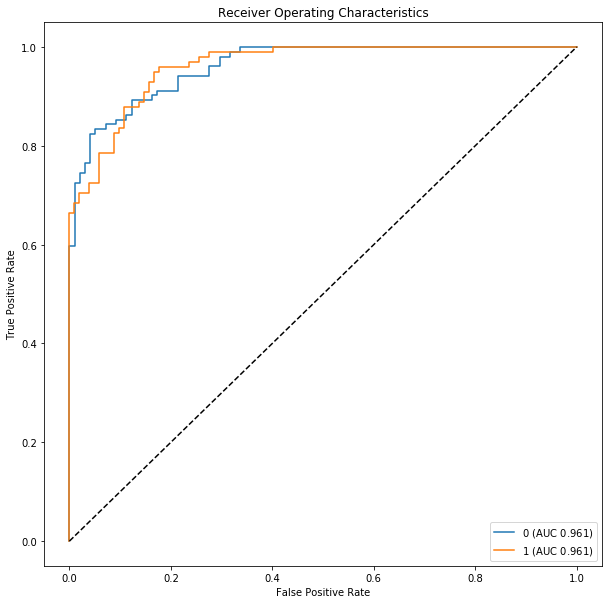

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


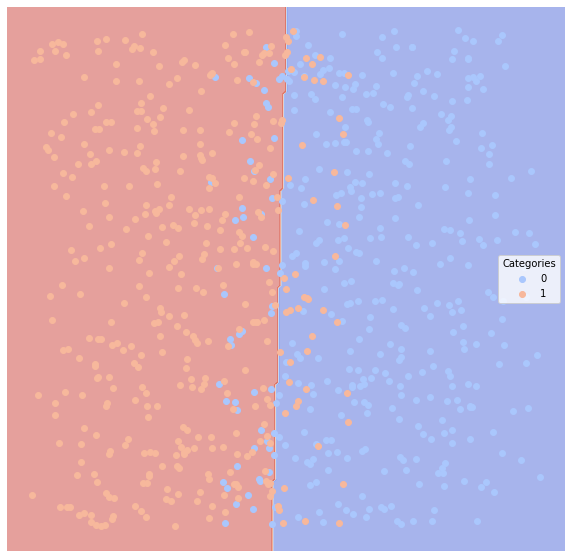

decision_tree  Evaluation:
          Error_Rate      AUC  Precision  Average_Precision    Recall
Category                                                             
0              0.175  0.82563   0.852632           0.782090  0.794118
1              0.175  0.82563   0.800000           0.755714  0.857143
decision_tree  Confusion Matrix:


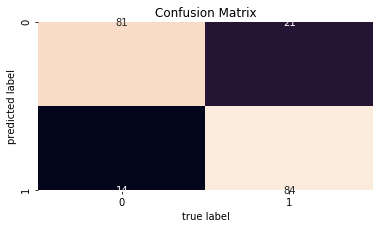

decision_tree  ROC:


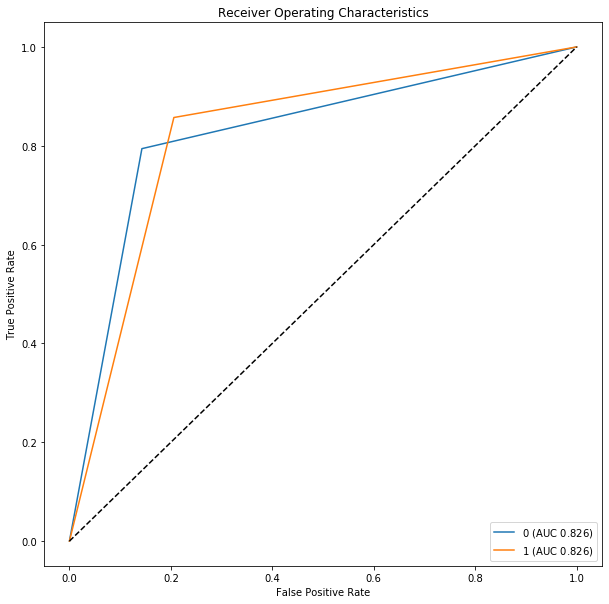

decision_tree  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


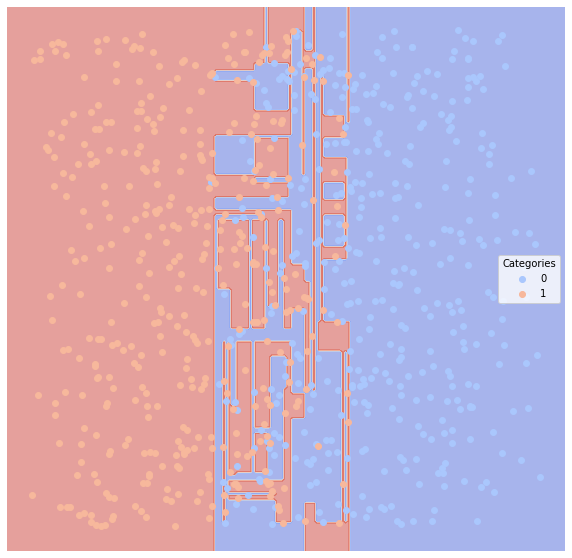

random_forest  Evaluation:
          Error_Rate      AUC  Precision  Average_Precision    Recall
Category                                                             
0               0.15  0.85054   0.875000           0.810588  0.823529
1               0.15  0.85054   0.826923           0.785667  0.877551
random_forest  Confusion Matrix:


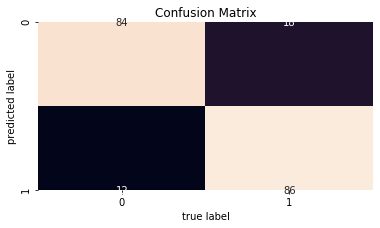

random_forest  ROC:


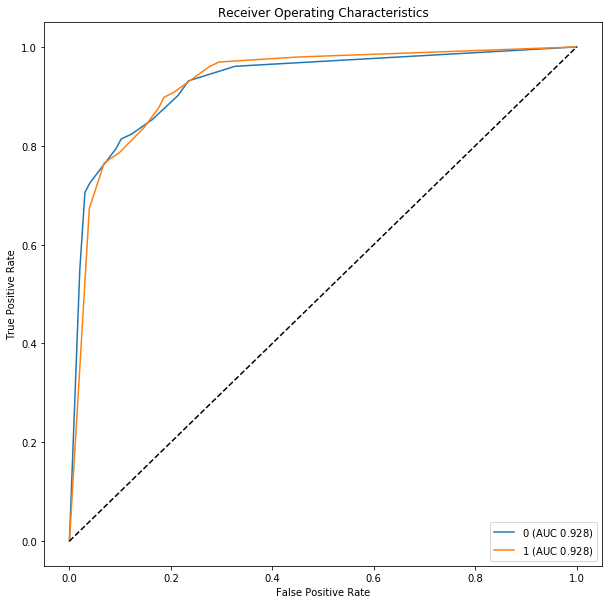

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


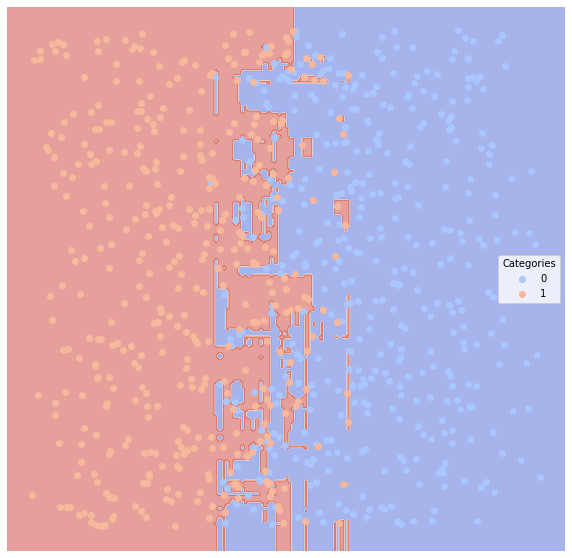

neural_network  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.115  0.885854   0.924731           0.859675  0.843137
1              0.115  0.885854   0.850467           0.824720  0.928571
neural_network  Confusion Matrix:


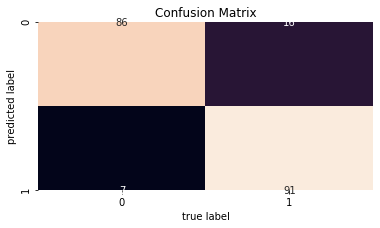

neural_network  ROC:


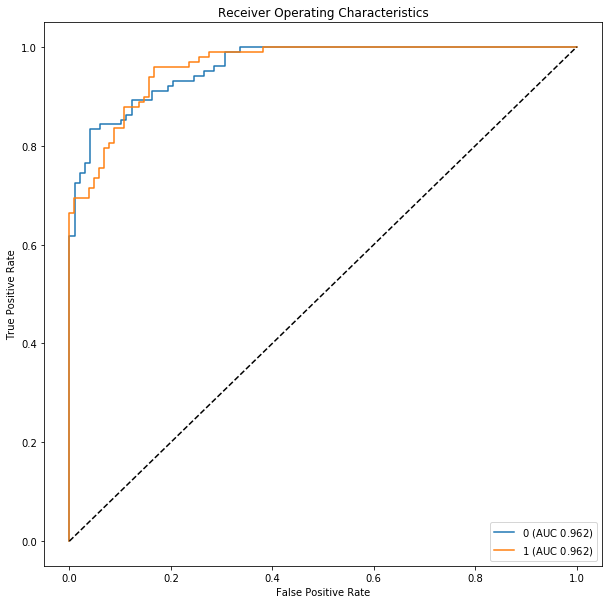

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


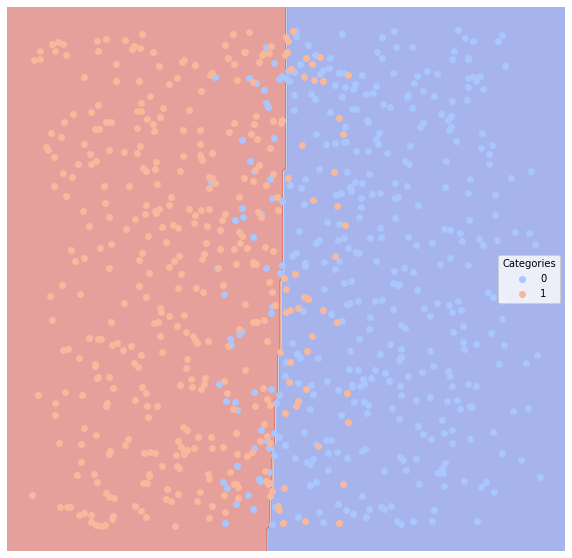

boosting  Evaluation:
          Error_Rate      AUC  Precision  Average_Precision    Recall
Category                                                             
0              0.125  0.87605   0.923077           0.850181  0.823529
1              0.125  0.87605   0.834862           0.810229  0.928571
boosting  Confusion Matrix:


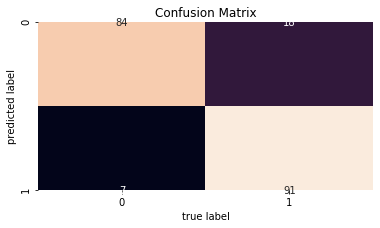

boosting  ROC:


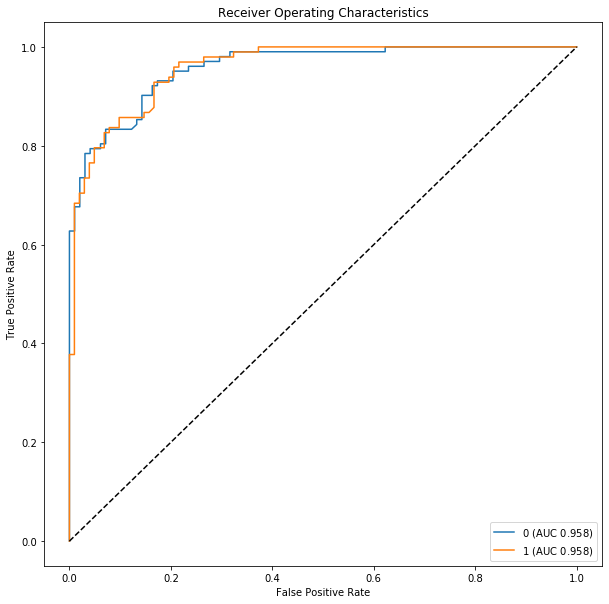

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


boosting  Regions:


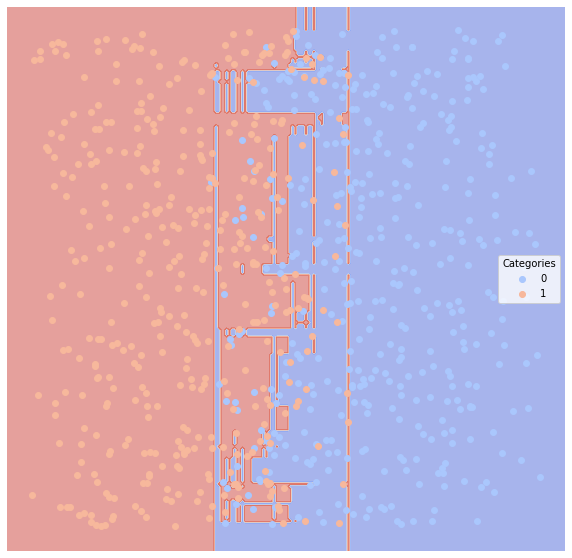

In [110]:
eval1 = all_model(dfTrain1, dfTest1)

bayes  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.48  0.521234   0.542553           0.531060  0.490385
1               0.48  0.521234   0.500000           0.491042  0.552083
bayes  Confusion Matrix:


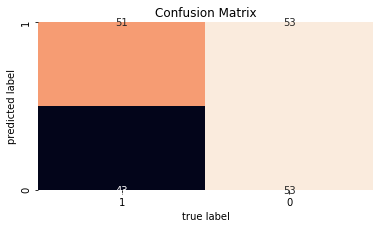

bayes  ROC:


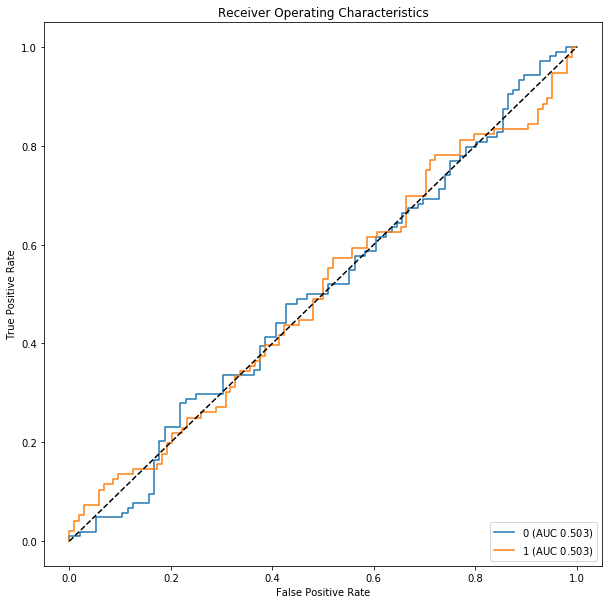

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


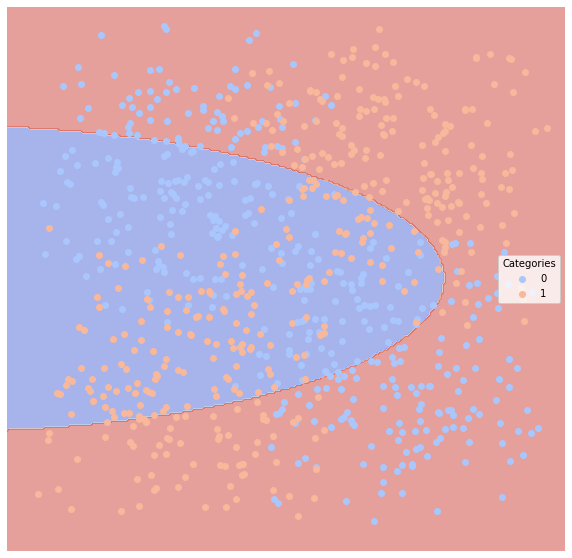

svm_linear  Evaluation:
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0               0.52  0.5       0.00               0.52     0.0
1               0.52  0.5       0.48               0.48     1.0
svm_linear  Confusion Matrix:


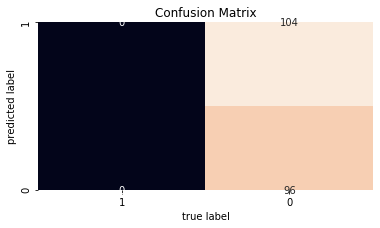

svm_linear  ROC:


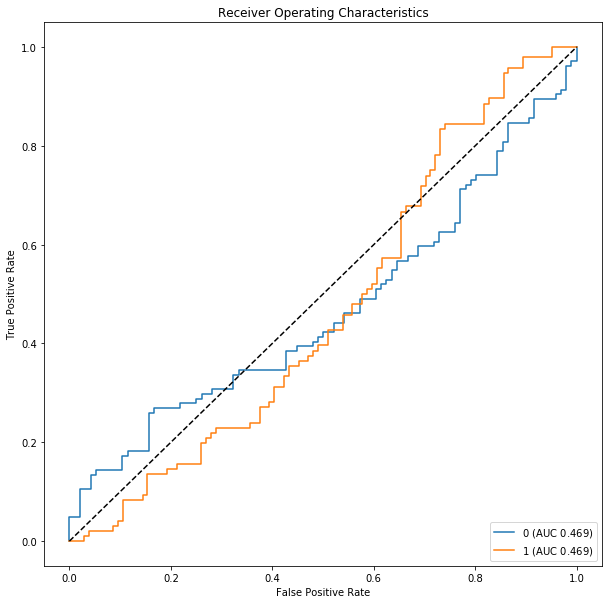

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


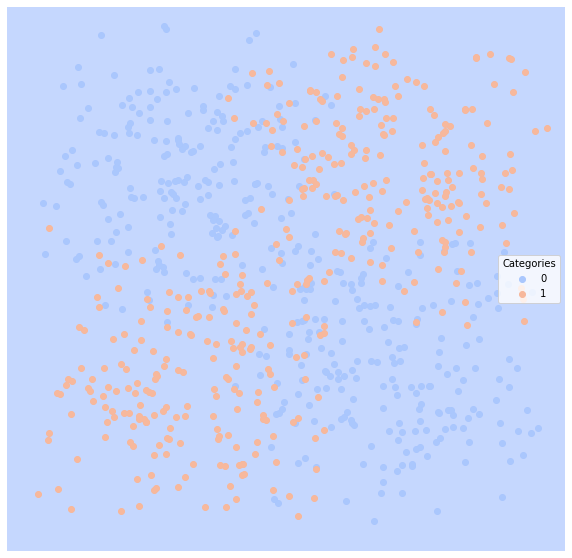

svm_poly  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision   Recall
Category                                                             
0              0.305  0.703125   0.852459           0.686230  0.50000
1              0.305  0.703125   0.625899           0.612221  0.90625
svm_poly  Confusion Matrix:


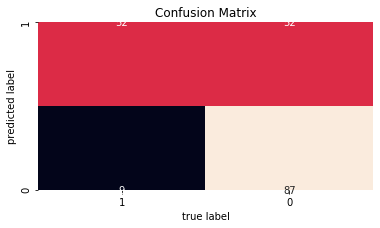

svm_poly  ROC:


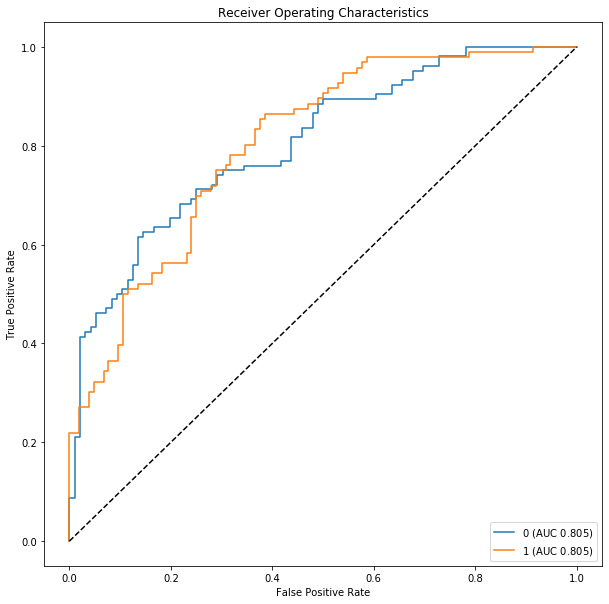

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


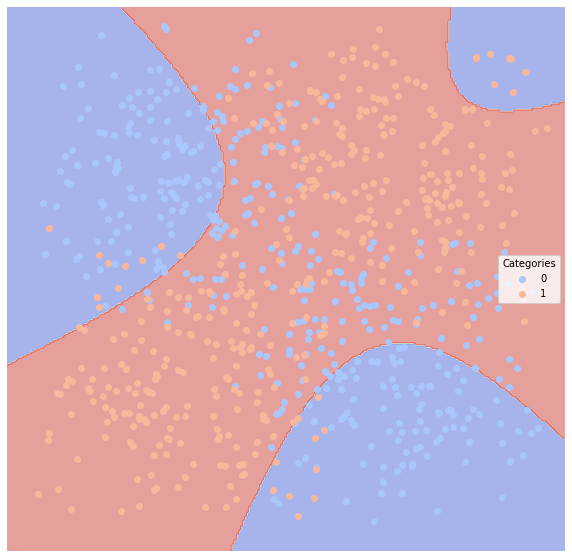

knn  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.18  0.821715   0.861702           0.786133  0.778846
1               0.18  0.821715   0.783019           0.741985  0.864583
knn  Confusion Matrix:


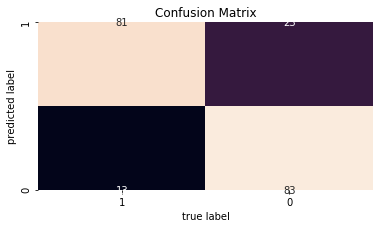

knn  ROC:


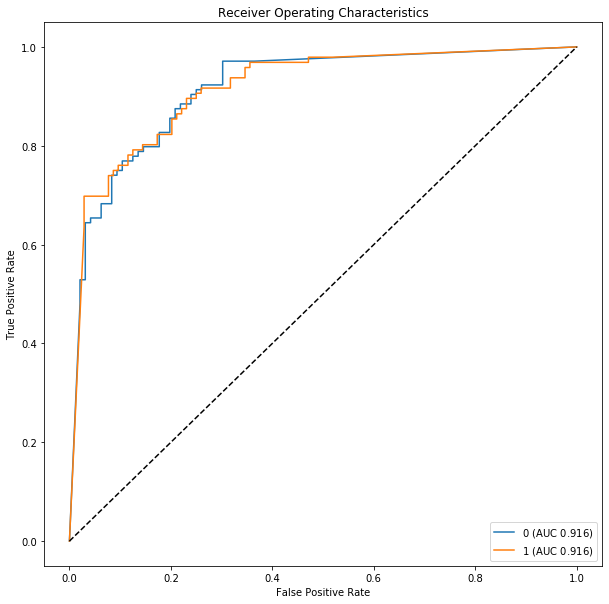

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


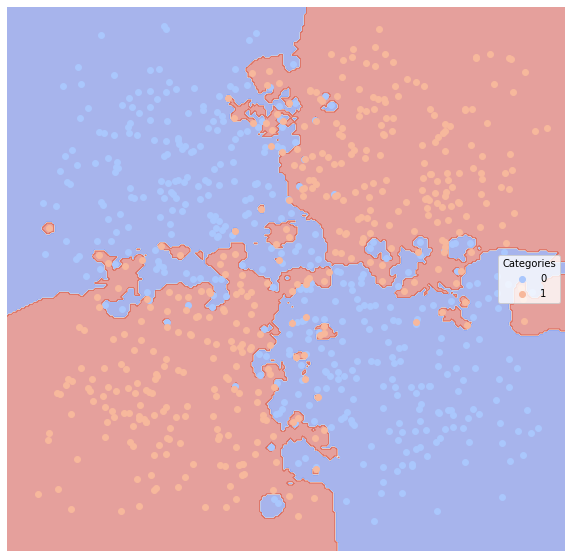

classical_reg  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.56  0.444311   0.448718           0.496011  0.336538
1               0.56  0.444311   0.434426           0.454839  0.552083
classical_reg  Confusion Matrix:


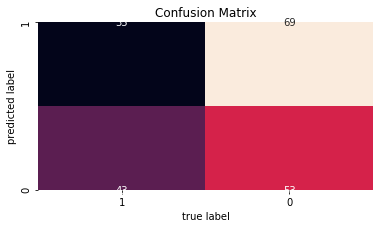

classical_reg  ROC:


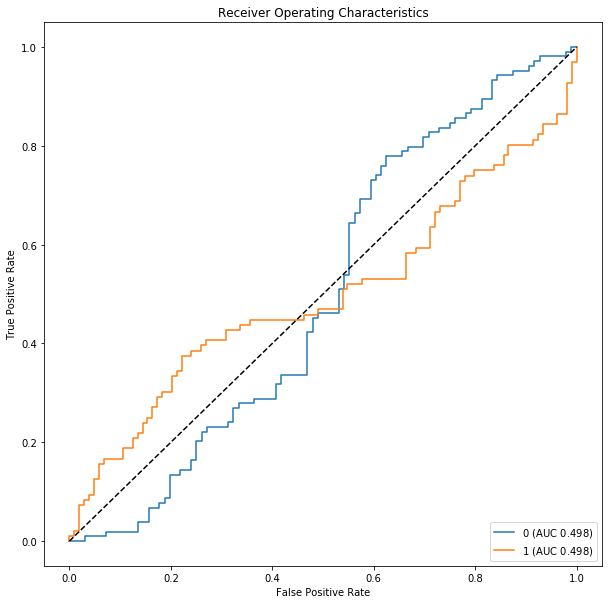

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


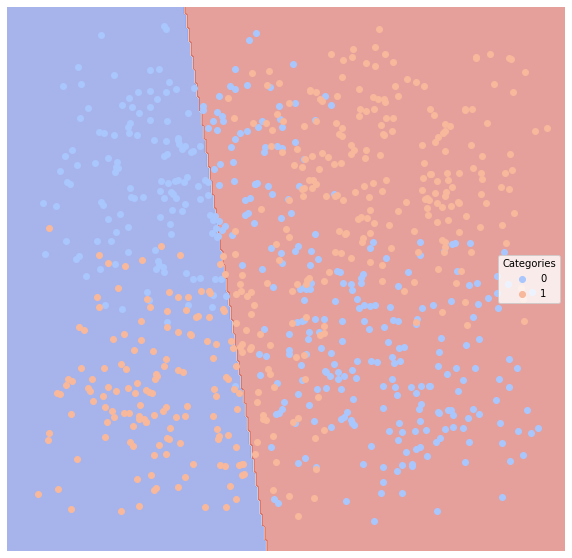

decision_tree  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.18  0.820913   0.846939           0.780922  0.798077
1               0.18  0.820913   0.794118           0.745037  0.843750
decision_tree  Confusion Matrix:


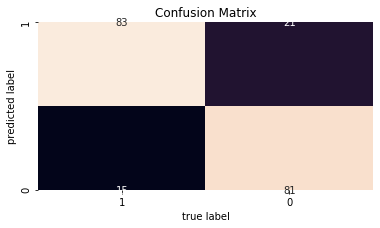

decision_tree  ROC:


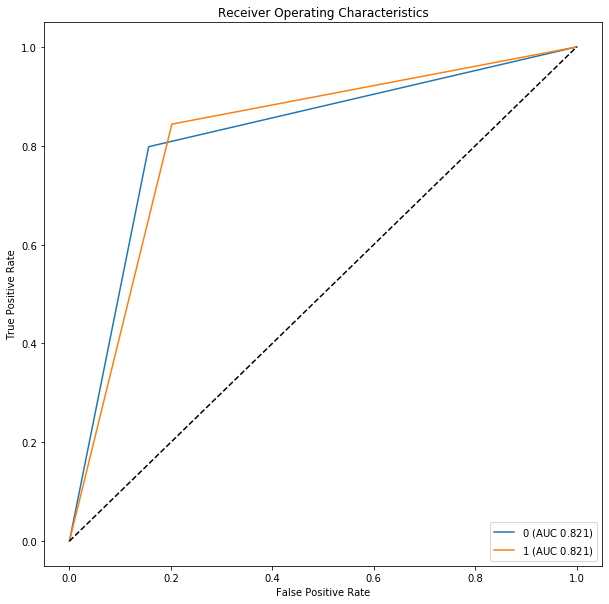

decision_tree  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


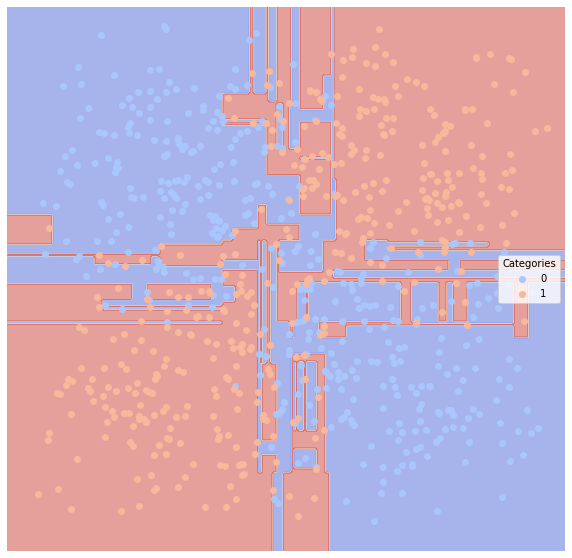

random_forest  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.18  0.820112   0.833333           0.776090  0.817308
1               0.18  0.820112   0.806122           0.748372  0.822917
random_forest  Confusion Matrix:


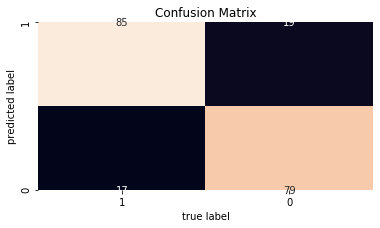

random_forest  ROC:


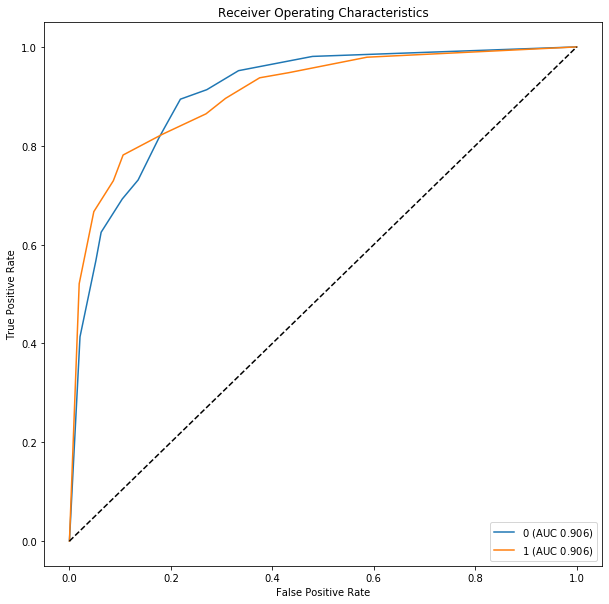

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


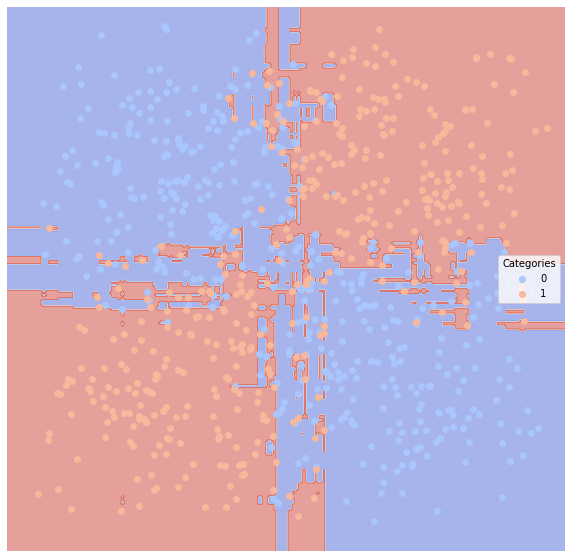

neural_network  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.135  0.865385   0.881188           0.829094  0.855769
1              0.135  0.865385   0.848485           0.802424  0.875000
neural_network  Confusion Matrix:


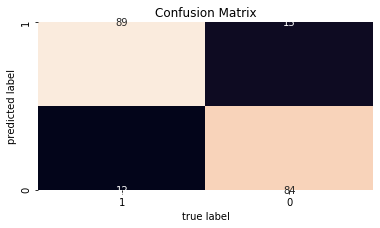

neural_network  ROC:


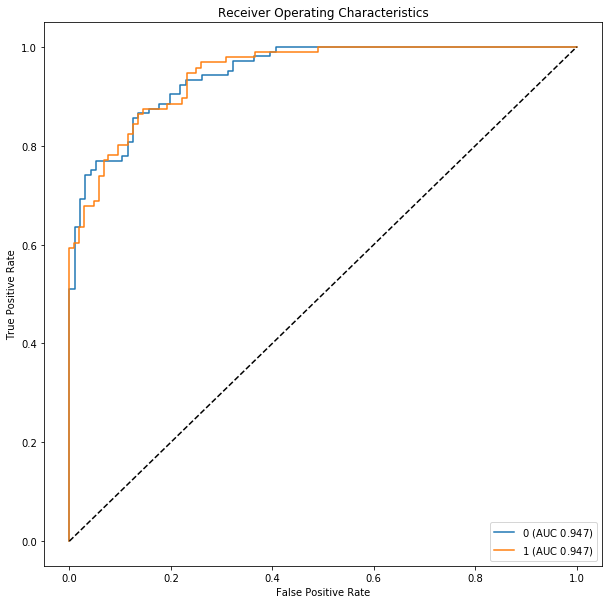

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


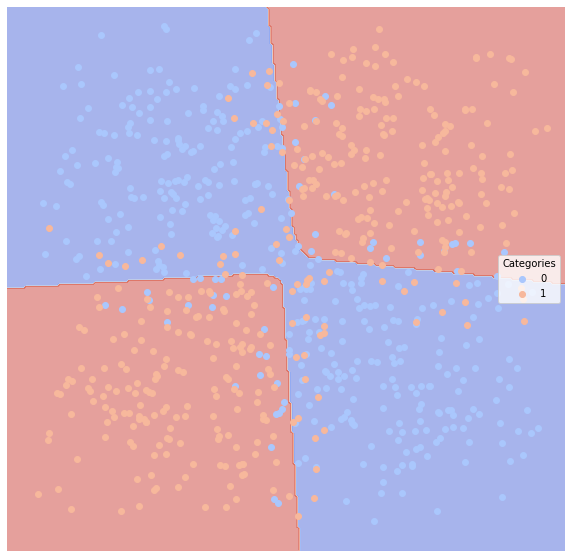

boosting  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.165  0.834535   0.838095           0.789158  0.846154
1              0.165  0.834535   0.831579           0.769320  0.822917
boosting  Confusion Matrix:


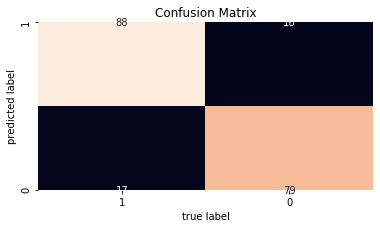

boosting  ROC:


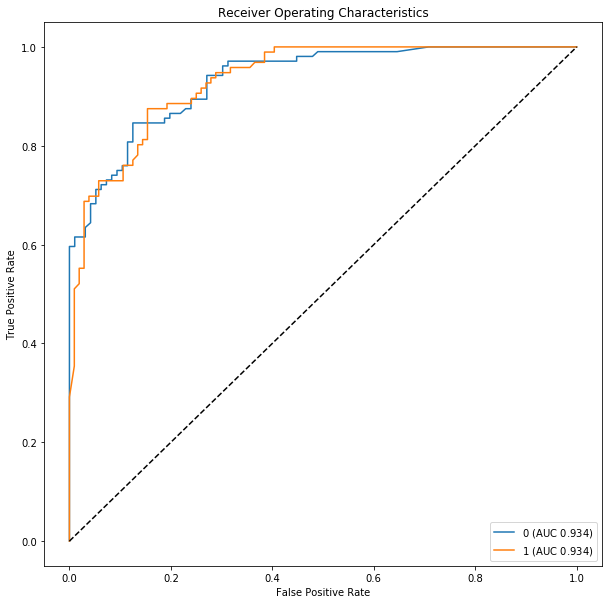

boosting  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


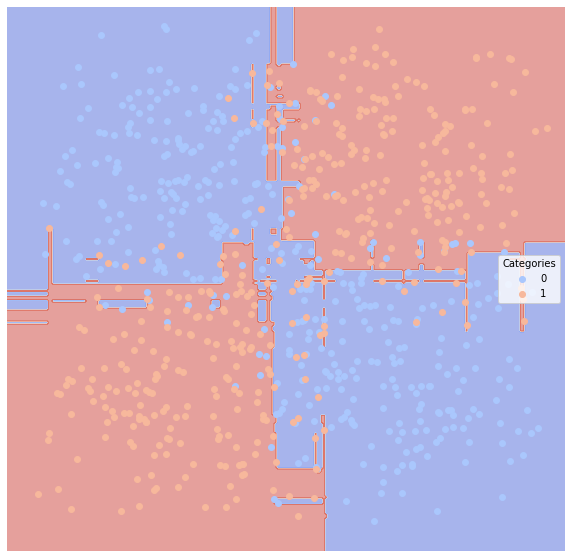

In [111]:
eval2 = all_model(dfTrain2, dfTest2)

bayes  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.16  0.842859   0.777778           0.759668  0.938144
1               0.16  0.842859   0.927711           0.823531  0.747573
bayes  Confusion Matrix:


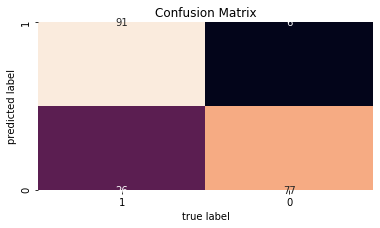

bayes  ROC:


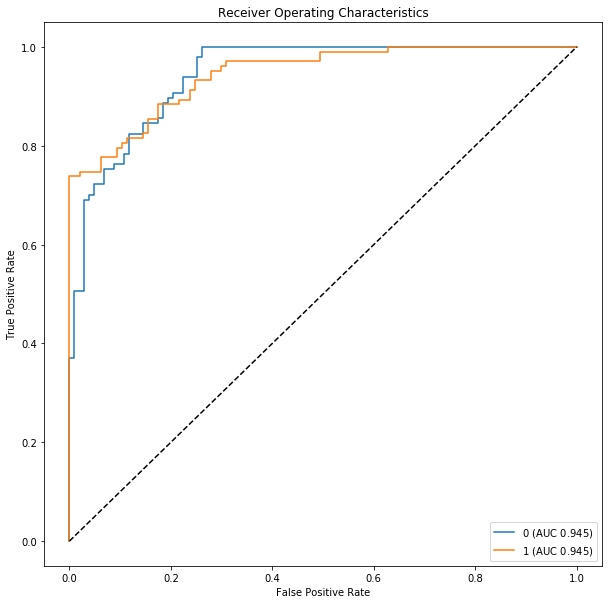

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


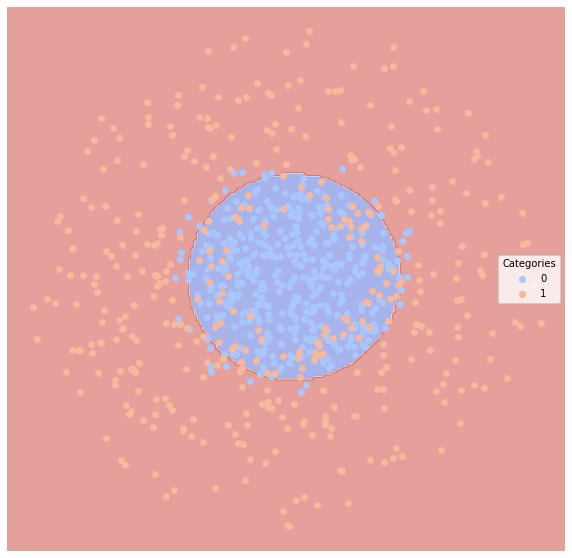

svm_linear  Evaluation:
          Error_Rate      AUC  Precision  Average_Precision    Recall
Category                                                             
0              0.375  0.63382   0.569620           0.563514  0.927835
1              0.375  0.63382   0.833333           0.623172  0.339806
svm_linear  Confusion Matrix:


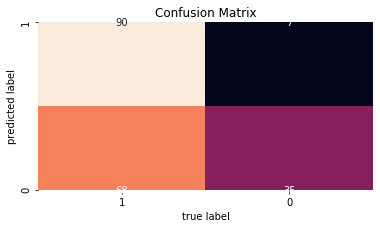

svm_linear  ROC:


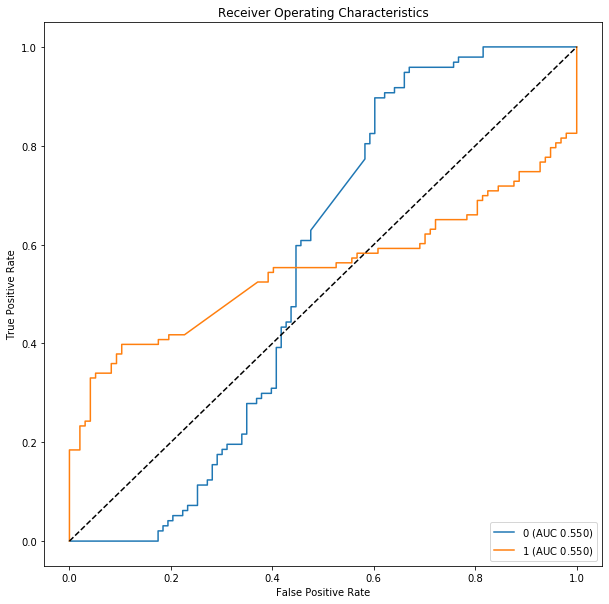

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


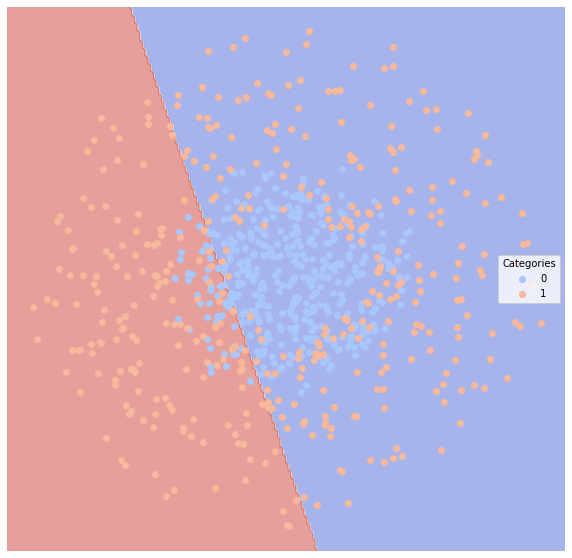

svm_poly  Evaluation:
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0              0.515  0.5      0.485              0.485     1.0
1              0.515  0.5      0.000              0.515     0.0
svm_poly  Confusion Matrix:


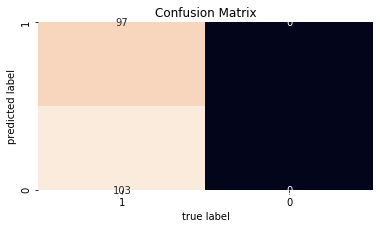

svm_poly  ROC:


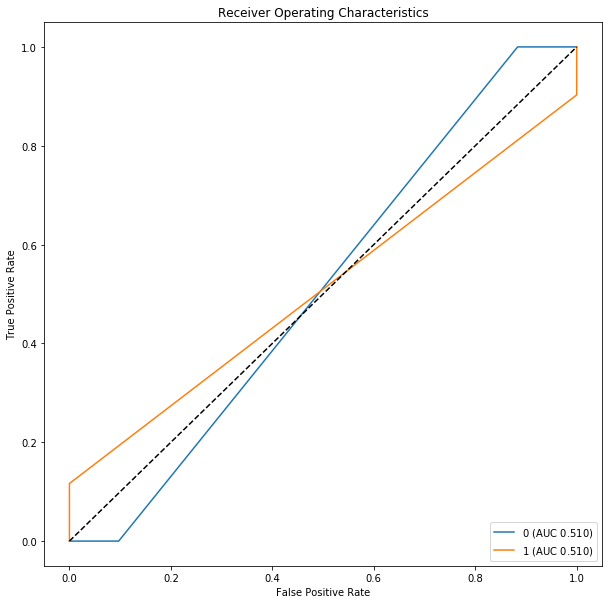

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


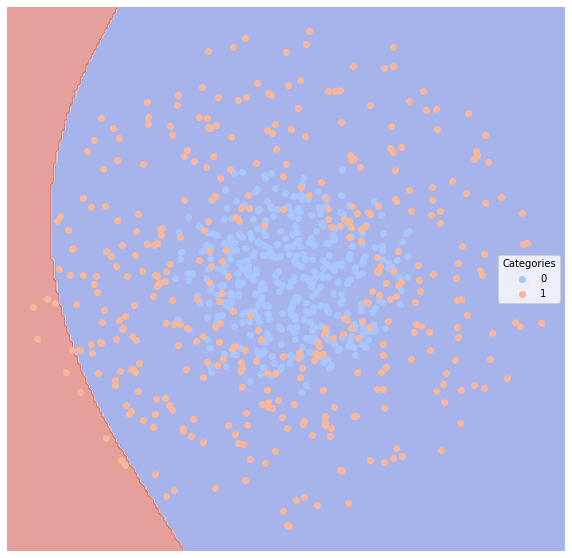

knn  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.15  0.851066   0.819048           0.781166  0.886598
1               0.15  0.851066   0.884211           0.816104  0.815534
knn  Confusion Matrix:


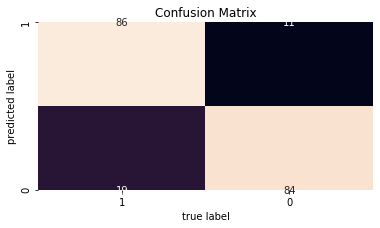

knn  ROC:


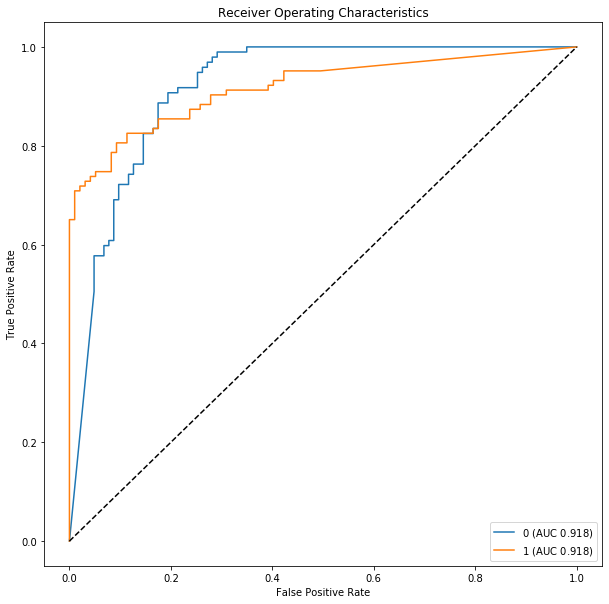

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


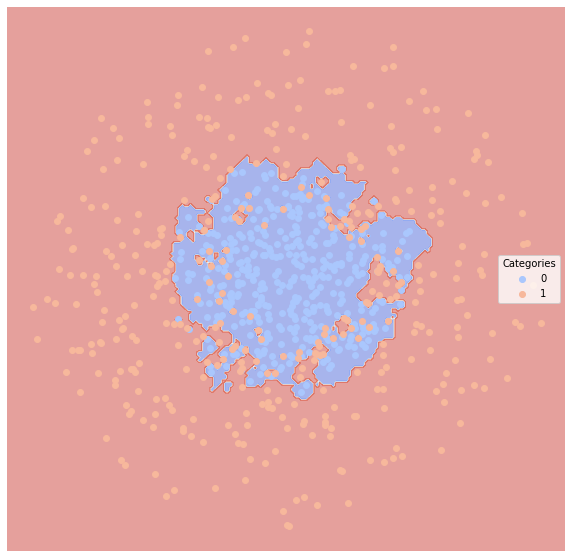

classical_reg  Evaluation:
          Error_Rate      AUC  Precision  Average_Precision    Recall
Category                                                             
0              0.425  0.57777   0.550847           0.529125  0.670103
1              0.425  0.57777   0.609756           0.560998  0.485437
classical_reg  Confusion Matrix:


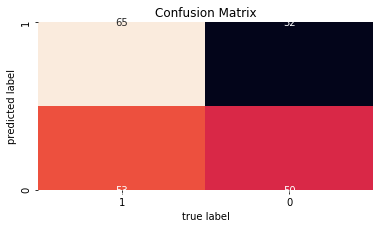

classical_reg  ROC:


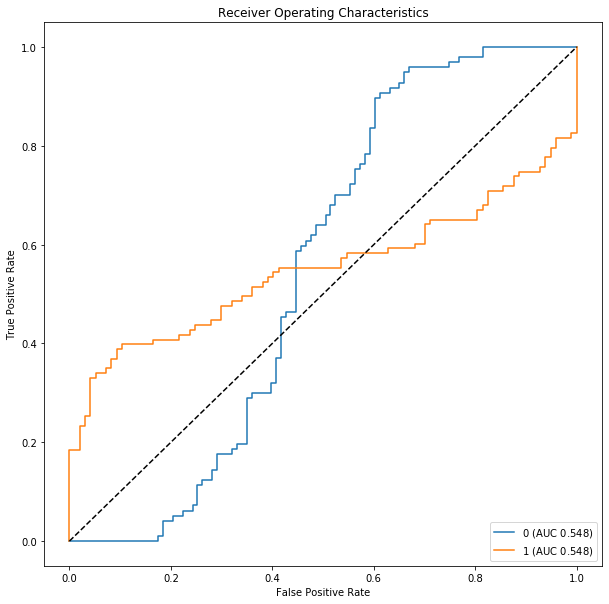

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


classical_reg  Regions:


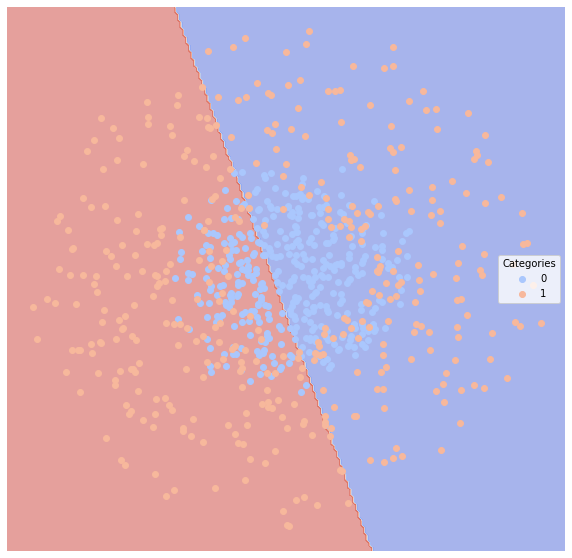

decision_tree  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.18  0.819838   0.814433           0.753301  0.814433
1               0.18  0.819838   0.825243           0.771026  0.825243
decision_tree  Confusion Matrix:


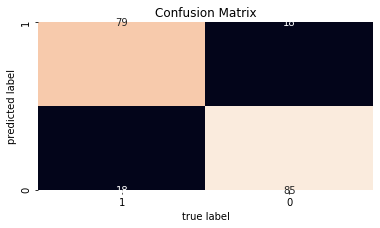

decision_tree  ROC:


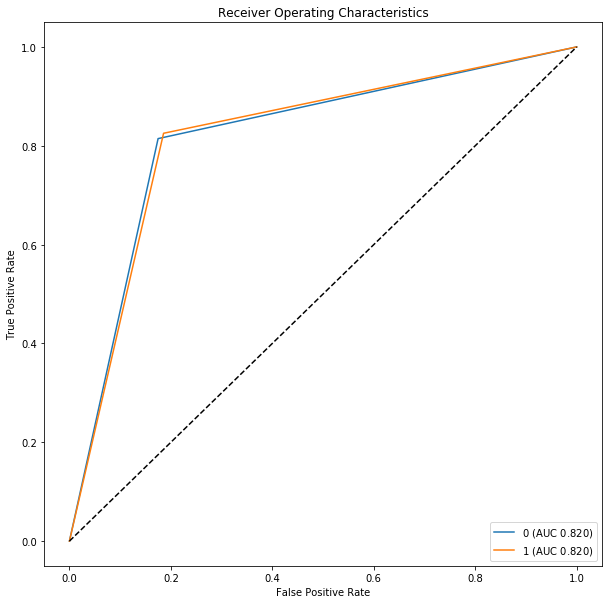

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


decision_tree  Regions:


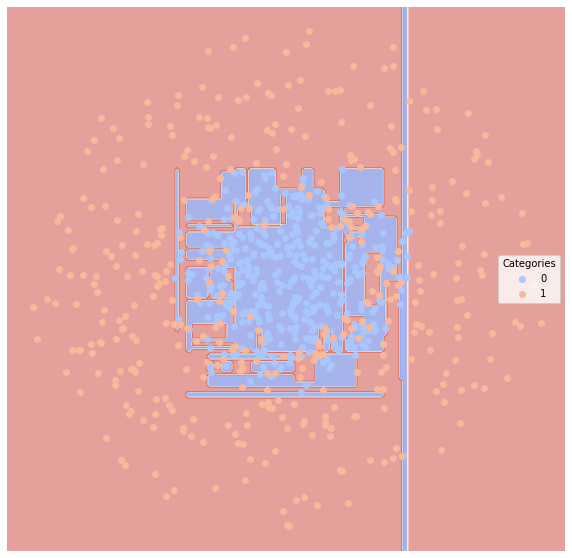

random_forest  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.14  0.861676   0.816514           0.789172  0.917526
1               0.14  0.861676   0.912088           0.834983  0.805825
random_forest  Confusion Matrix:


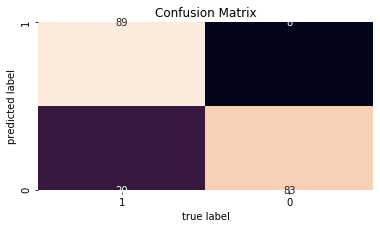

random_forest  ROC:


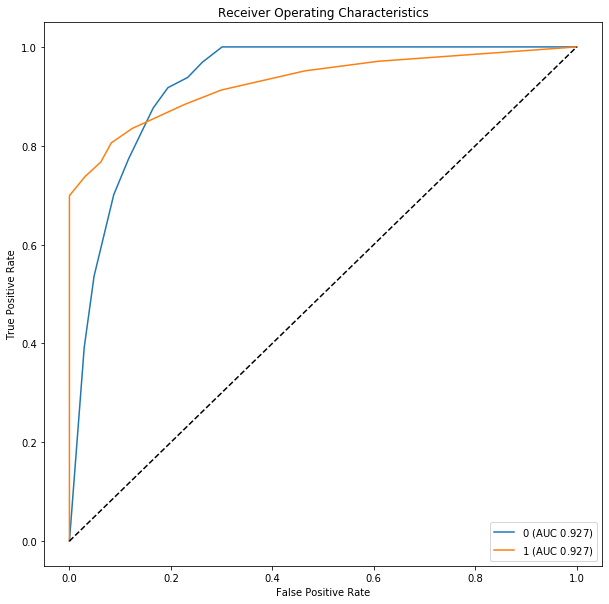

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


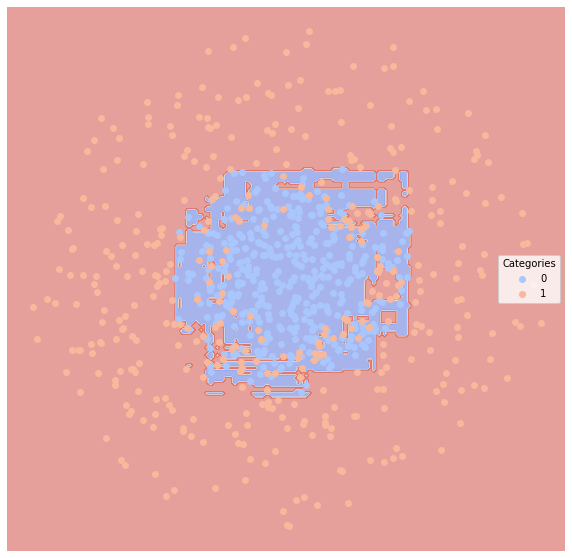

neural_network  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.155  0.847713   0.784483           0.765958  0.938144
1              0.155  0.847713   0.928571           0.828190  0.757282
neural_network  Confusion Matrix:


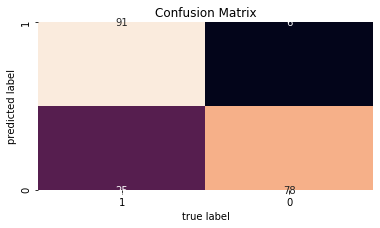

neural_network  ROC:


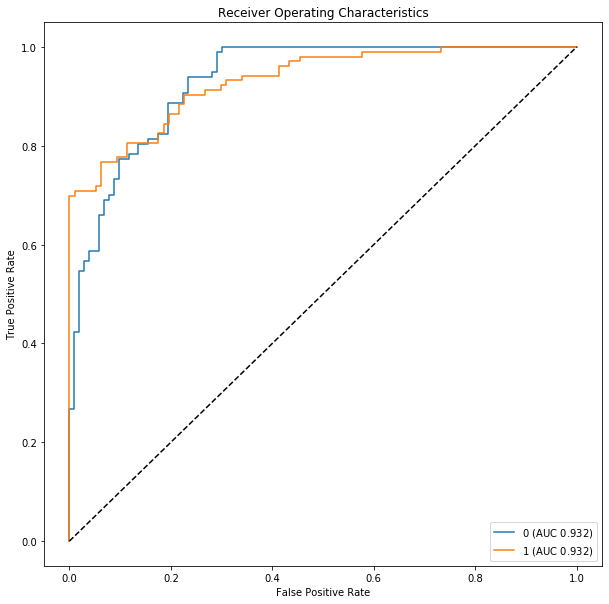

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


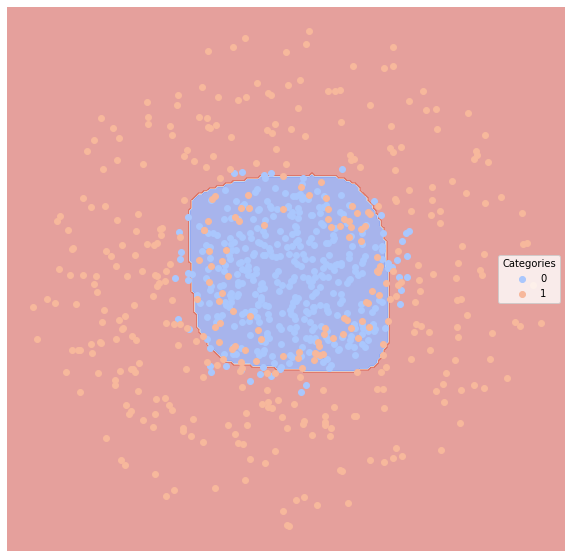

boosting  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.145  0.857722   0.793103           0.777222  0.948454
1              0.145  0.857722   0.940476           0.841336  0.766990
boosting  Confusion Matrix:


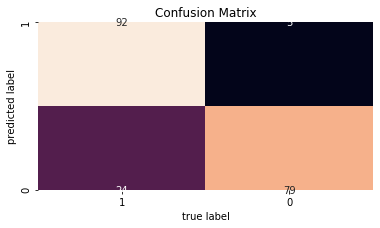

boosting  ROC:


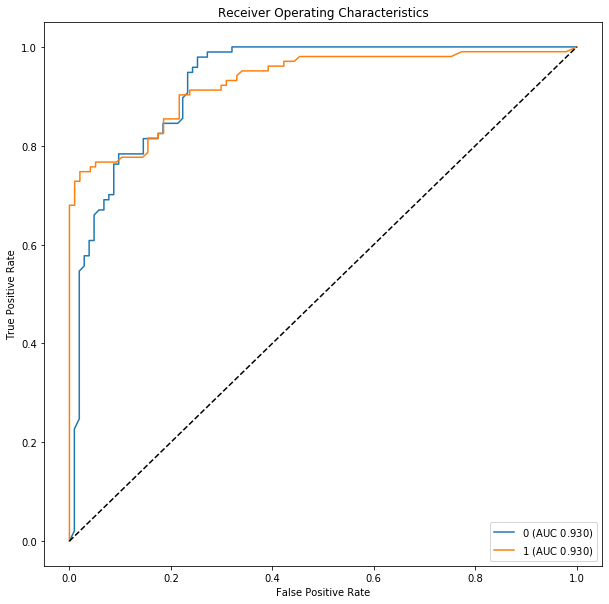

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


boosting  Regions:


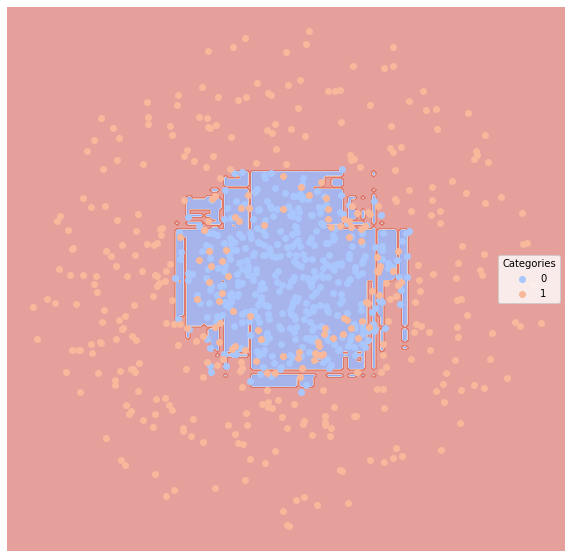

In [112]:
eval3 = all_model(dfTrain3, dfTest3)

bayes  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.006  0.993023   0.982609           0.975989  0.991228
1              0.060  0.901740   0.840426           0.736315  0.840426
2              0.060  0.900096   0.836957           0.730496  0.836957
3              0.006  0.989210   0.990385           0.975520  0.980952
4              0.000  1.000000   1.000000           1.000000  1.000000
bayes  Confusion Matrix:


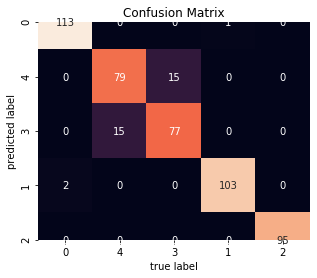

bayes  ROC:


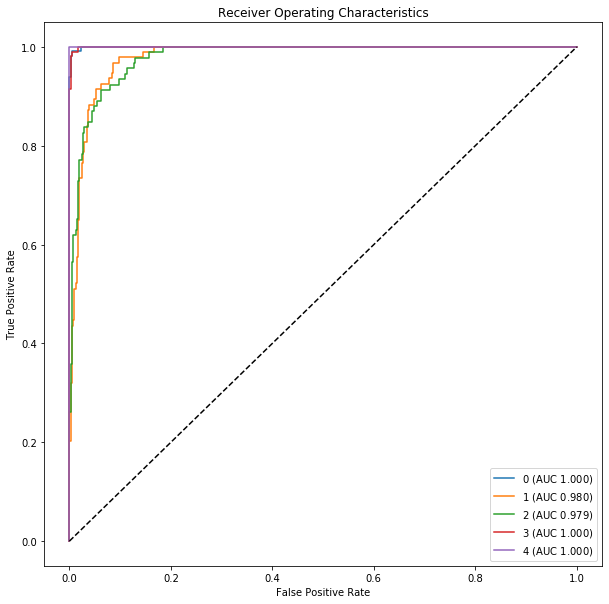

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

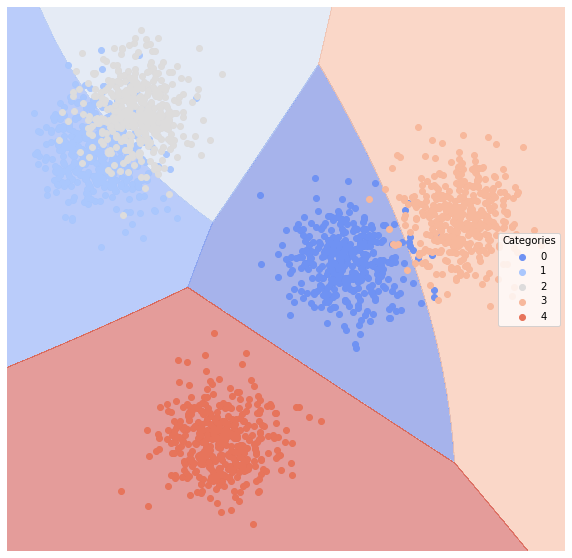

svm_linear  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.008  0.988637   0.982456           0.969220  0.982456
1              0.058  0.907059   0.842105           0.744685  0.851064
2              0.058  0.901321   0.846154           0.738194  0.836957
3              0.008  0.987945   0.980952           0.966268  0.980952
4              0.000  1.000000   1.000000           1.000000  1.000000
svm_linear  Confusion Matrix:


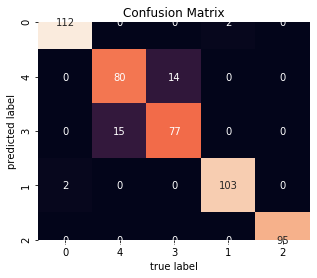

svm_linear  ROC:


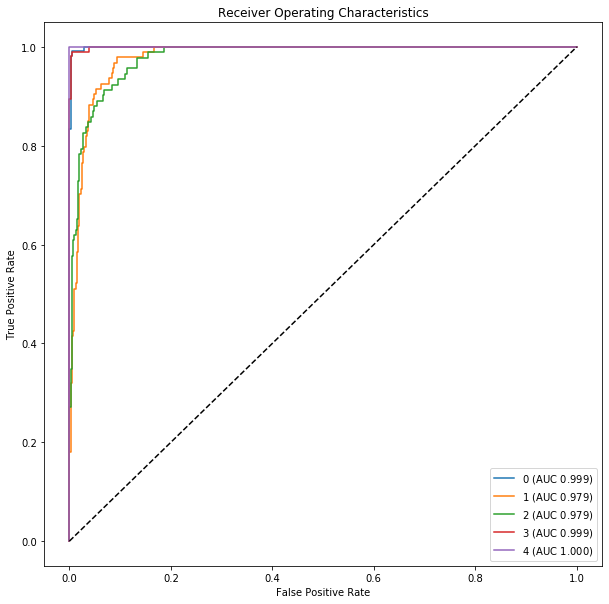

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

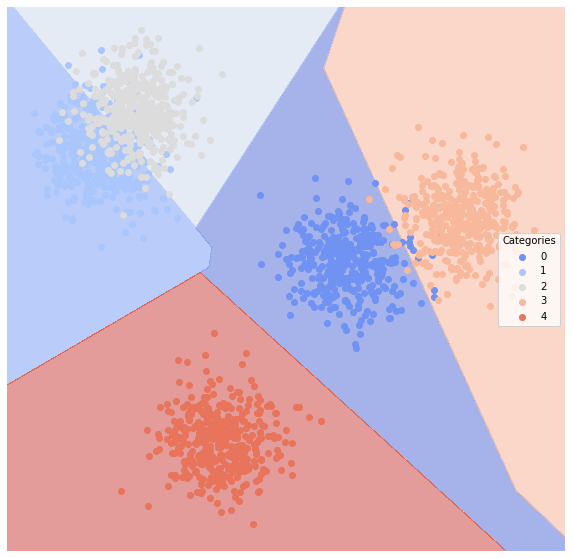

svm_poly  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.008  0.991728   0.974138           0.967593  0.991228
1              0.062  0.888245   0.853933           0.726414  0.808511
2              0.062  0.907289   0.814433           0.725350  0.858696
3              0.008  0.984448   0.990291           0.967997  0.971429
4              0.000  1.000000   1.000000           1.000000  1.000000
svm_poly  Confusion Matrix:


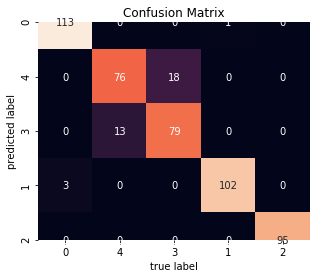

svm_poly  ROC:


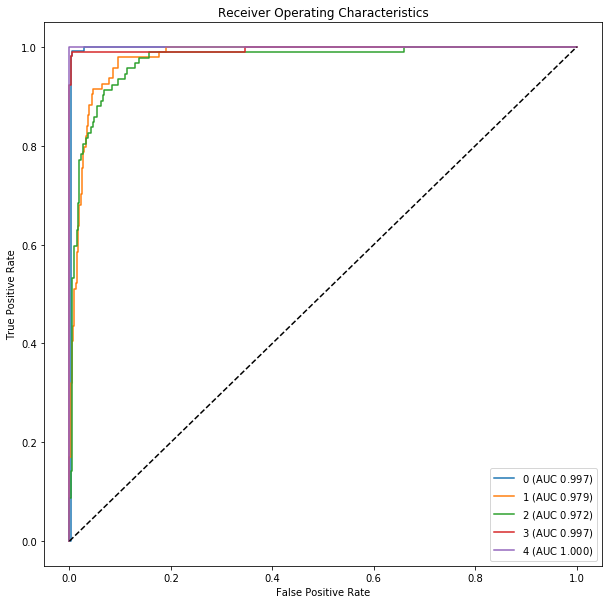

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

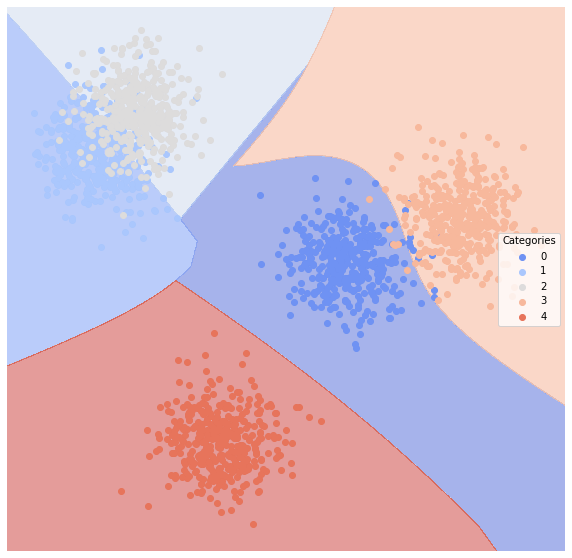

knn  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.006  0.993023   0.982609           0.975989  0.991228
1              0.062  0.896421   0.838710           0.727951  0.829787
2              0.062  0.898870   0.827957           0.722964  0.836957
3              0.006  0.989210   0.990385           0.975520  0.980952
4              0.000  1.000000   1.000000           1.000000  1.000000
knn  Confusion Matrix:


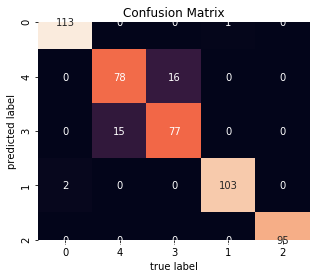

knn  ROC:


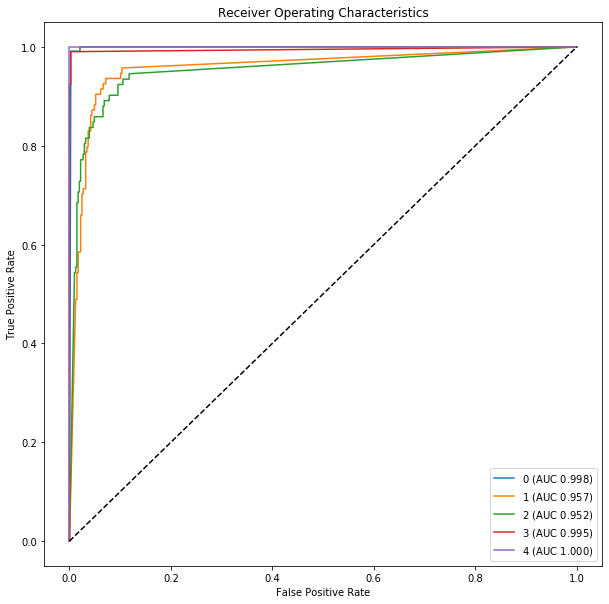

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

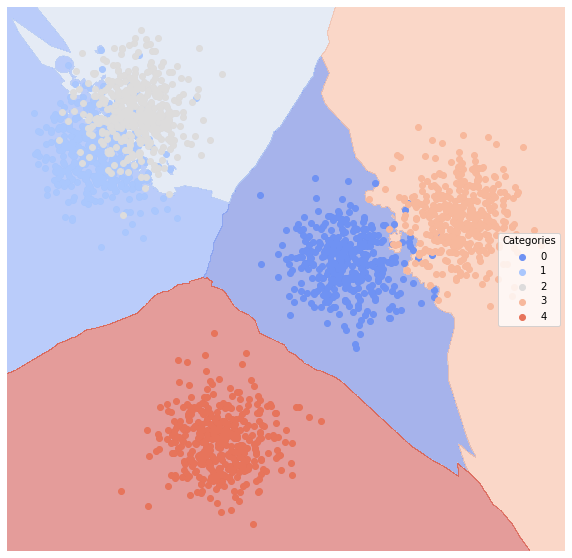

classical_reg  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.010  0.981161   0.990991           0.964219  0.964912
1              0.052  0.914841   0.861702           0.768531  0.861702
2              0.052  0.913416   0.858696           0.763358  0.858696
3              0.010  0.990175   0.962963           0.955792  0.990476
4              0.000  1.000000   1.000000           1.000000  1.000000
classical_reg  Confusion Matrix:


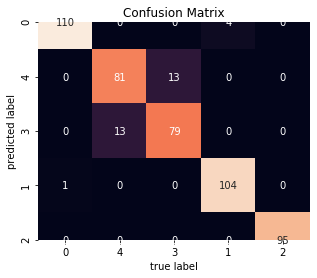

classical_reg  ROC:


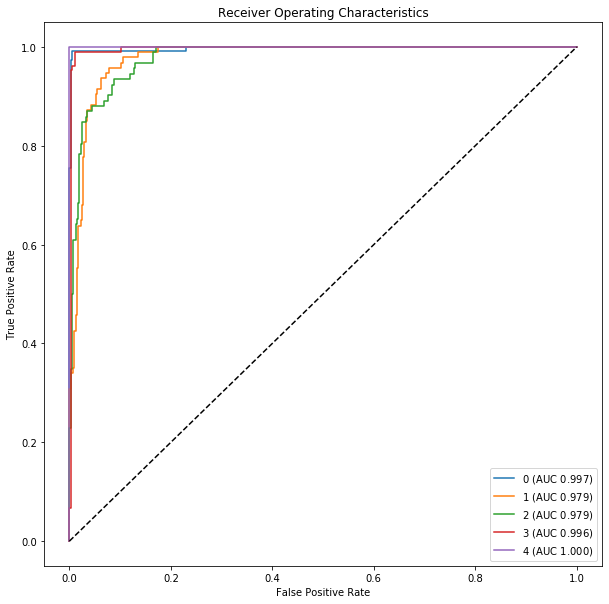

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

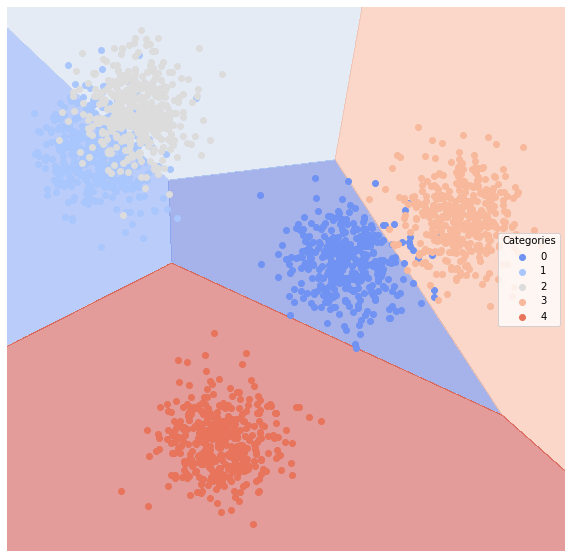

decision_tree  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.016  0.980365   0.956897           0.937715  0.973684
1              0.088  0.851798   0.771739           0.628909  0.755319
2              0.088  0.857683   0.755319           0.624909  0.771739
3              0.016  0.972393   0.970874           0.934642  0.952381
4              0.000  1.000000   1.000000           1.000000  1.000000
decision_tree  Confusion Matrix:


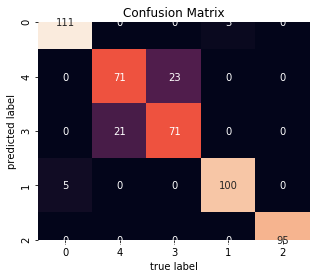

decision_tree  ROC:


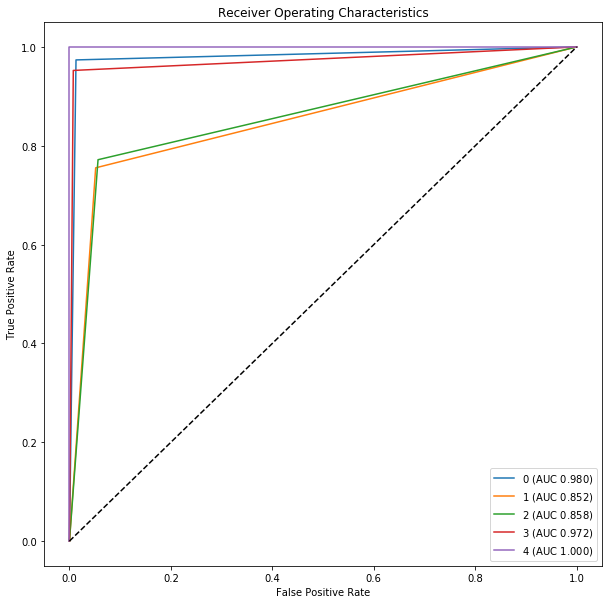

decision_tree  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

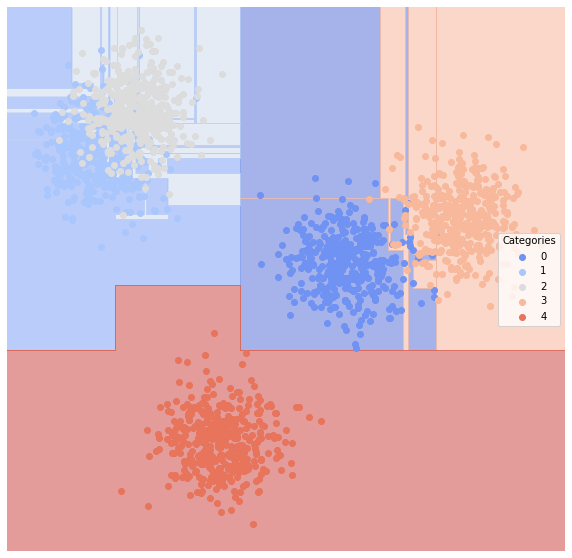

random_forest  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.008  0.991728   0.974138           0.967593  0.991228
1              0.062  0.904596   0.824742           0.729908  0.851064
2              0.062  0.890452   0.842697           0.720981  0.815217
3              0.008  0.984448   0.990291           0.967997  0.971429
4              0.000  1.000000   1.000000           1.000000  1.000000
random_forest  Confusion Matrix:


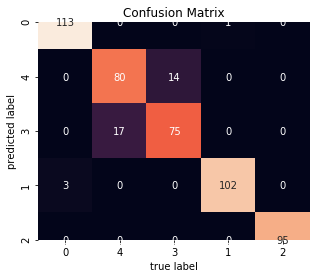

random_forest  ROC:


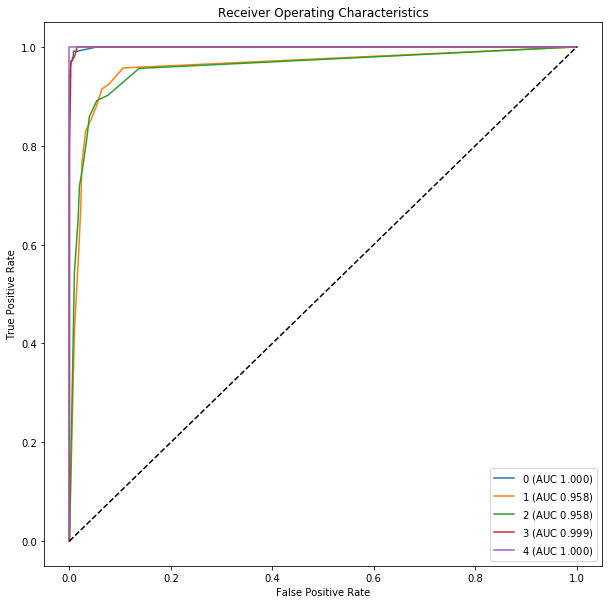

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

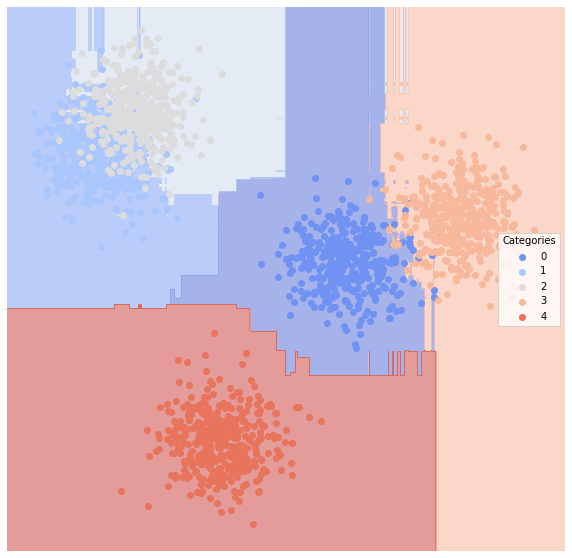

neural_network  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.006  0.993023   0.982609           0.975989  0.991228
1              0.052  0.918929   0.854167           0.769124  0.872340
2              0.052  0.909207   0.866667           0.762783  0.847826
3              0.006  0.989210   0.990385           0.975520  0.980952
4              0.000  1.000000   1.000000           1.000000  1.000000
neural_network  Confusion Matrix:


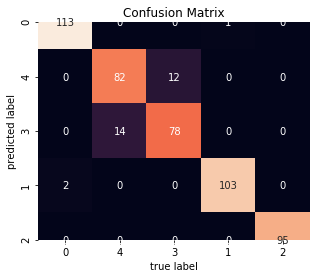

neural_network  ROC:


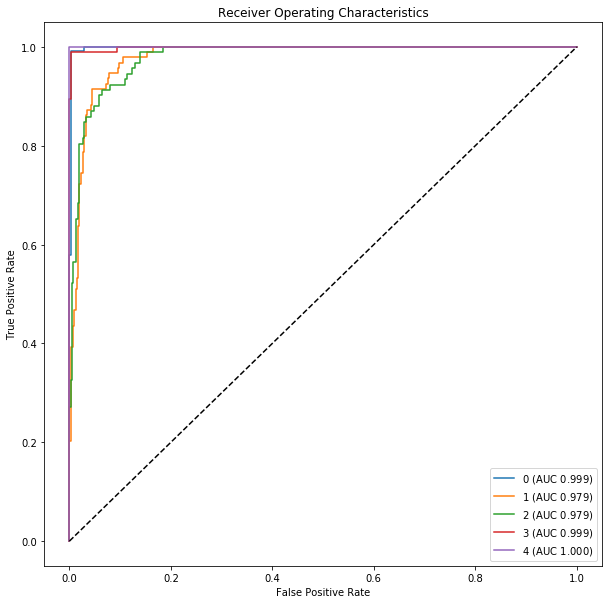

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

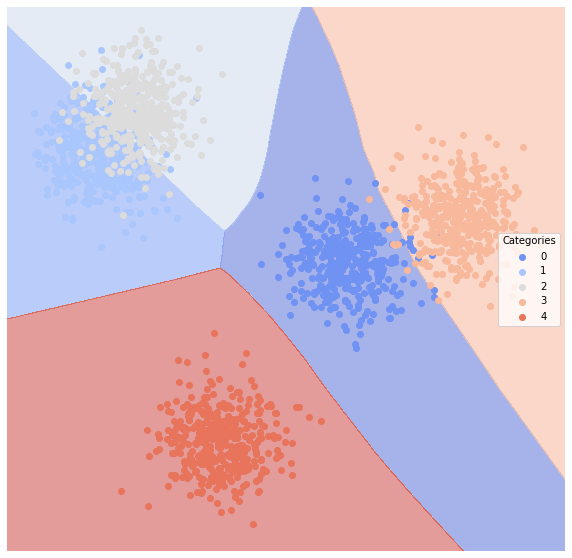

boosting  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.014  0.978570   0.973451           0.947295  0.964912
1              0.056  0.912378   0.843750           0.753061  0.861702
2              0.054  0.907982   0.857143           0.754708  0.847826
3              0.012  0.981917   0.971429           0.949673  0.971429
4              0.000  1.000000   1.000000           1.000000  1.000000
boosting  Confusion Matrix:


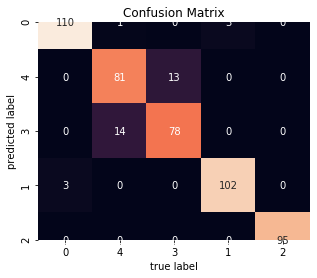

boosting  ROC:


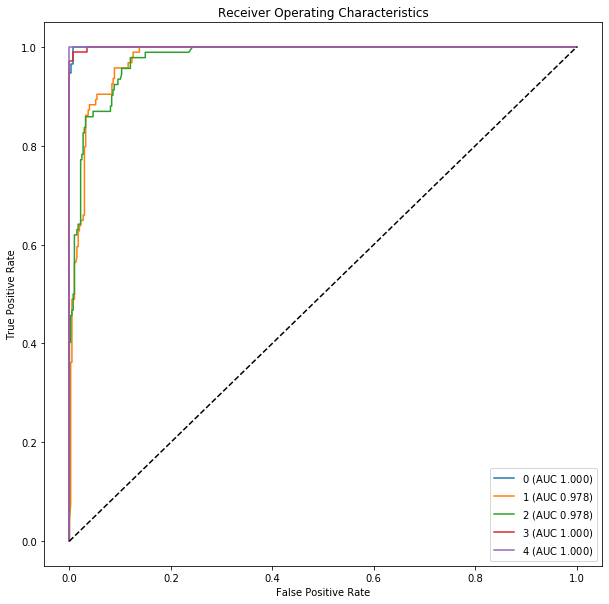

boosting  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

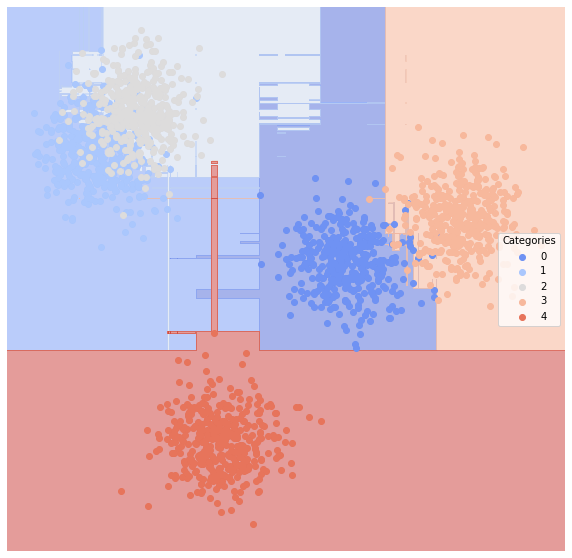

In [113]:
eval4 = all_model(dfTrain4, dfTest4)

bayes  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.515  0.490476   0.512821           0.520360  0.380952
1              0.515  0.490476   0.467213           0.470328  0.600000
bayes  Confusion Matrix:


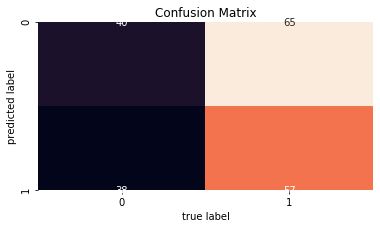

bayes  ROC:


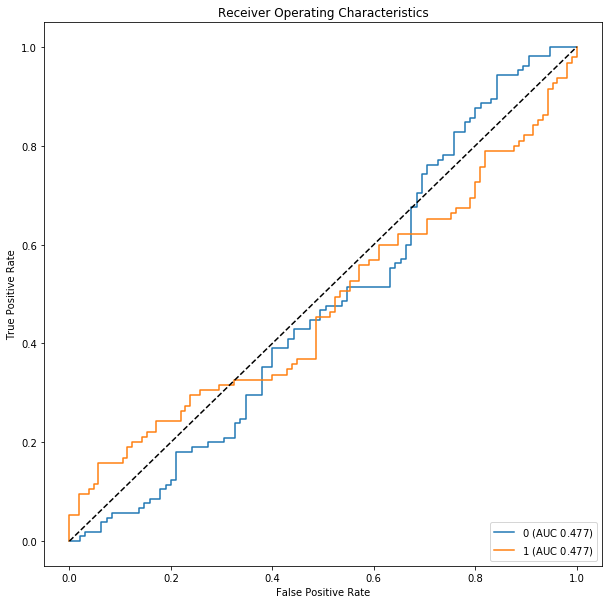

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


bayes  Regions:


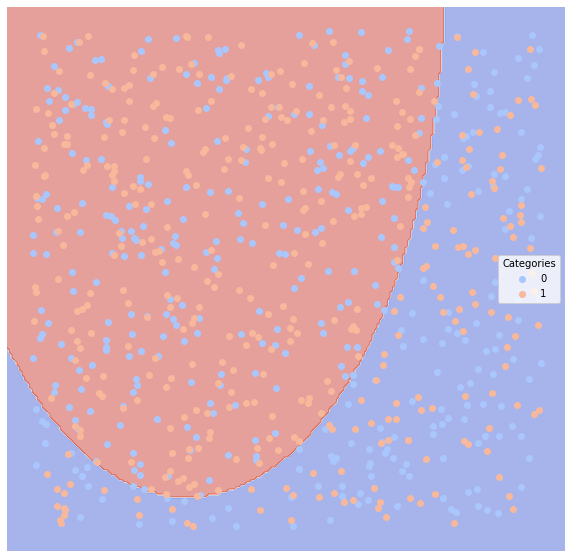

svm_linear  Evaluation:
          Error_Rate      AUC  Precision  Average_Precision    Recall
Category                                                             
0              0.545  0.45589   0.479167           0.504921  0.438095
1              0.545  0.45589   0.432692           0.454960  0.473684
svm_linear  Confusion Matrix:


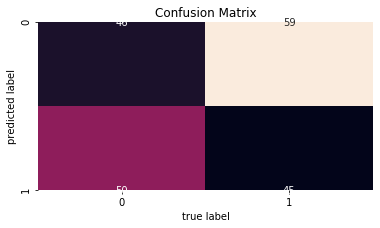

svm_linear  ROC:


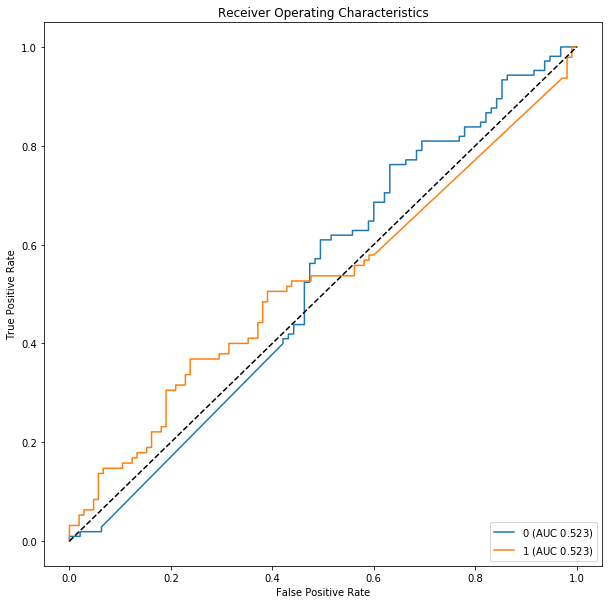

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


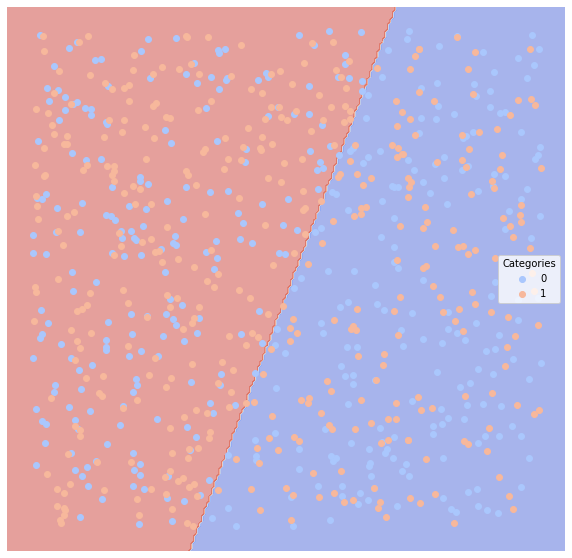

svm_poly  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.535  0.476441   0.481481           0.514224  0.247619
1              0.535  0.476441   0.458904           0.463648  0.705263
svm_poly  Confusion Matrix:


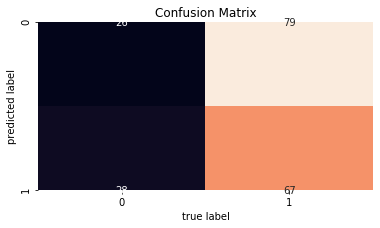

svm_poly  ROC:


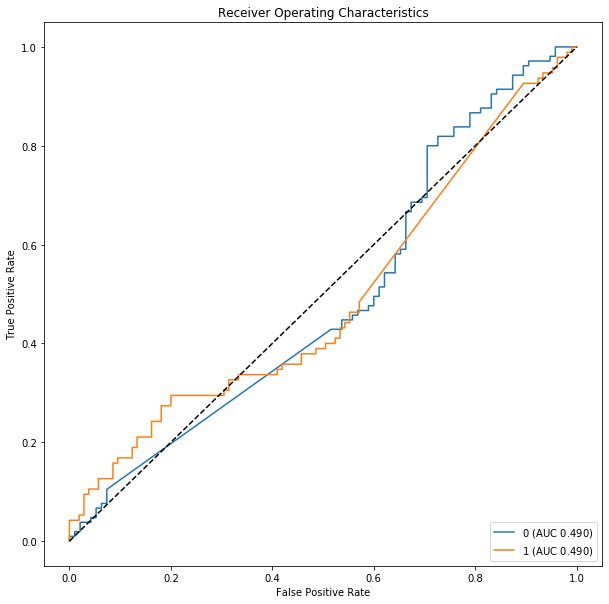

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


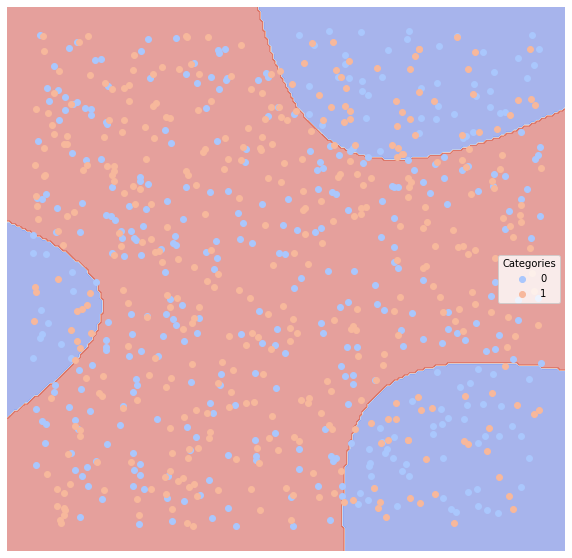

knn  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.52  0.480702   0.505155           0.515739  0.466667
1               0.52  0.480702   0.456311           0.465754  0.494737
knn  Confusion Matrix:


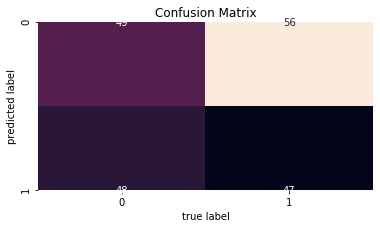

knn  ROC:


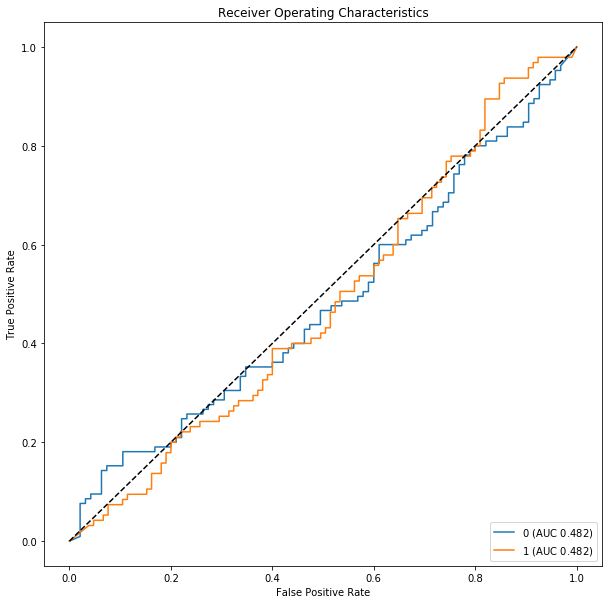

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


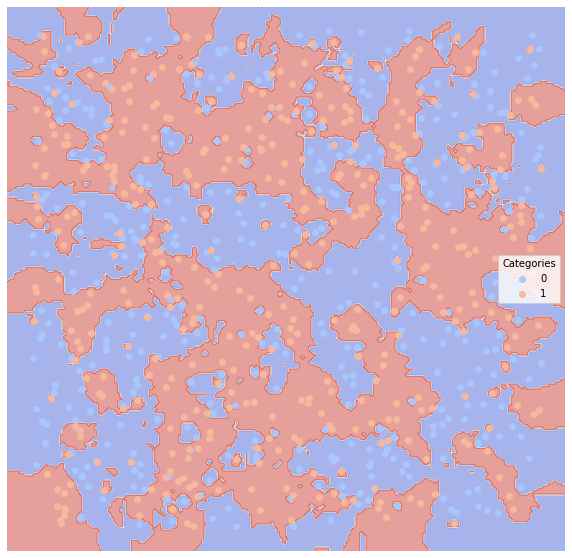

classical_reg  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.52  0.483208   0.505747           0.516932  0.419048
1               0.52  0.483208   0.460177           0.466886  0.547368
classical_reg  Confusion Matrix:


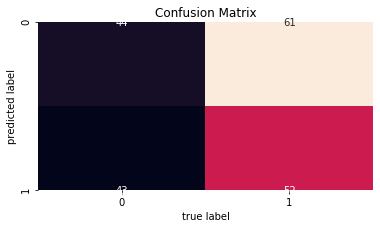

classical_reg  ROC:


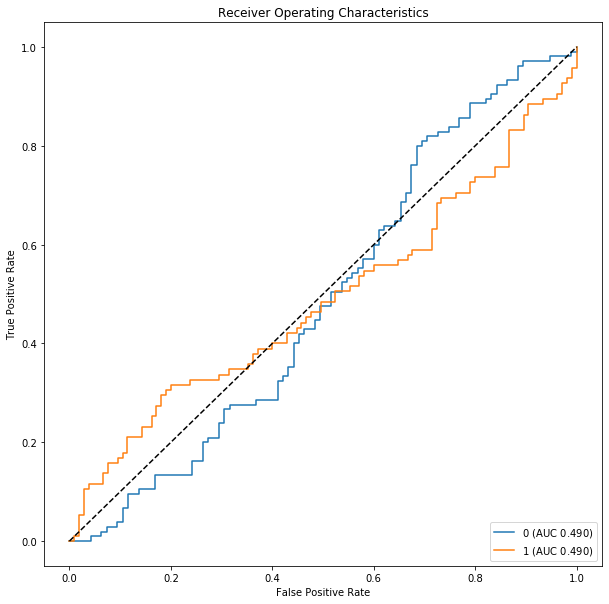

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


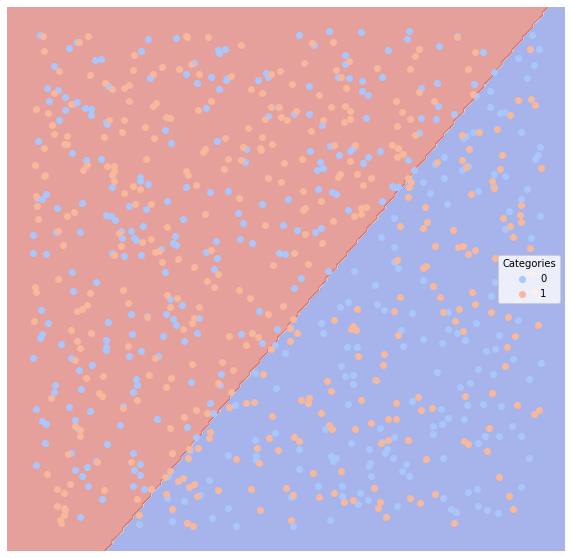

decision_tree  Evaluation:
          Error_Rate      AUC  Precision  Average_Precision    Recall
Category                                                             
0              0.525  0.47594   0.500000           0.513571  0.457143
1              0.525  0.47594   0.451923           0.463583  0.494737
decision_tree  Confusion Matrix:


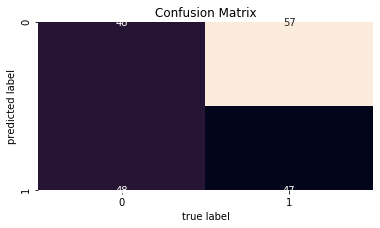

decision_tree  ROC:


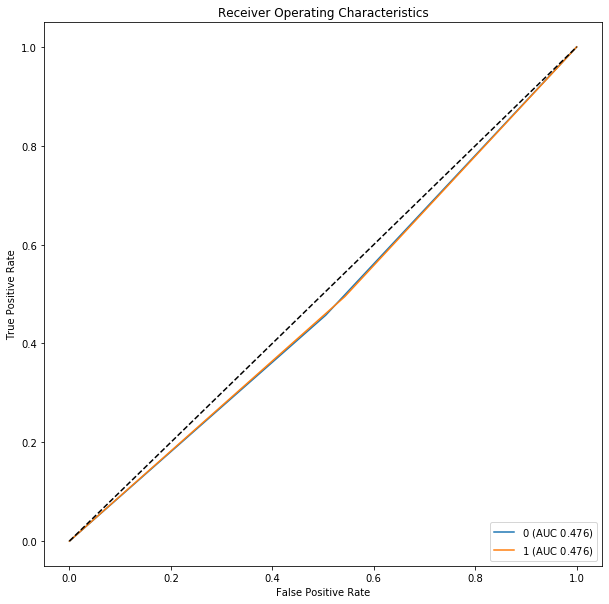

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


decision_tree  Regions:


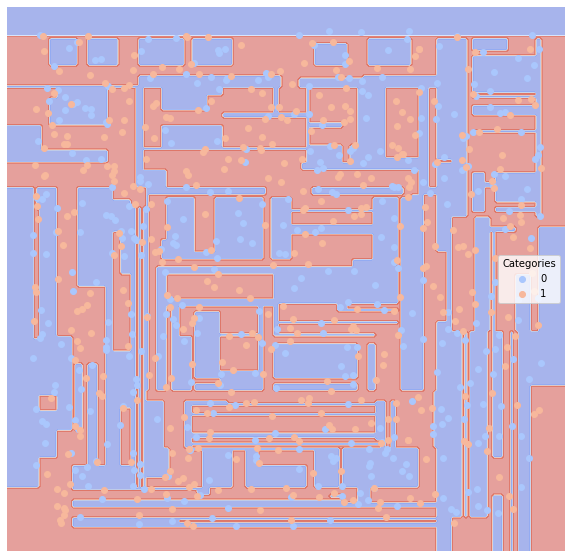

random_forest  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.535  0.460401   0.491525           0.506509  0.552381
1              0.535  0.460401   0.426829           0.457253  0.368421
random_forest  Confusion Matrix:


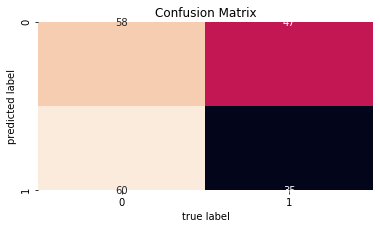

random_forest  ROC:


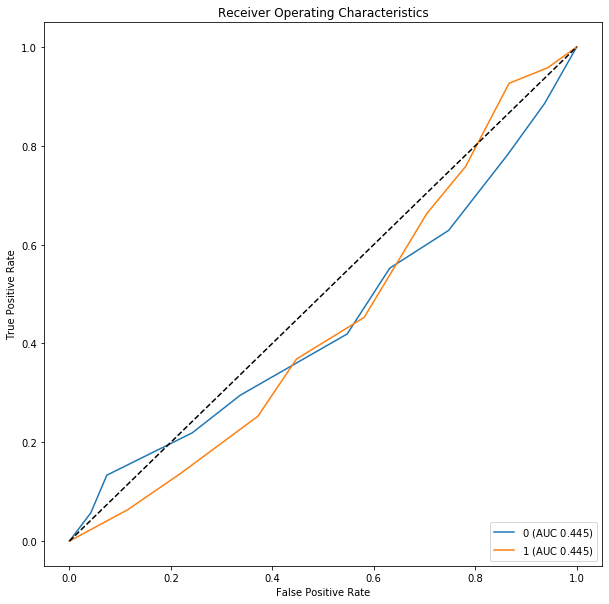

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


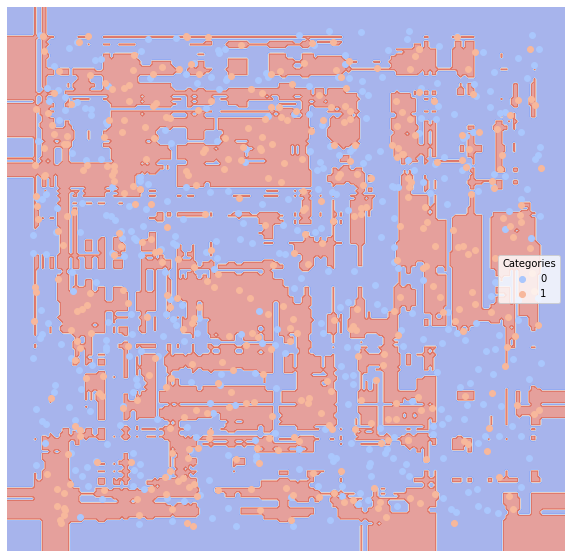

neural_network  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.56  0.444612   0.456790           0.500964  0.352381
1               0.56  0.444612   0.428571           0.450075  0.536842
neural_network  Confusion Matrix:


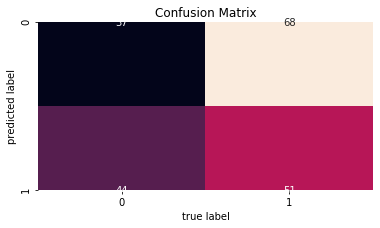

neural_network  ROC:


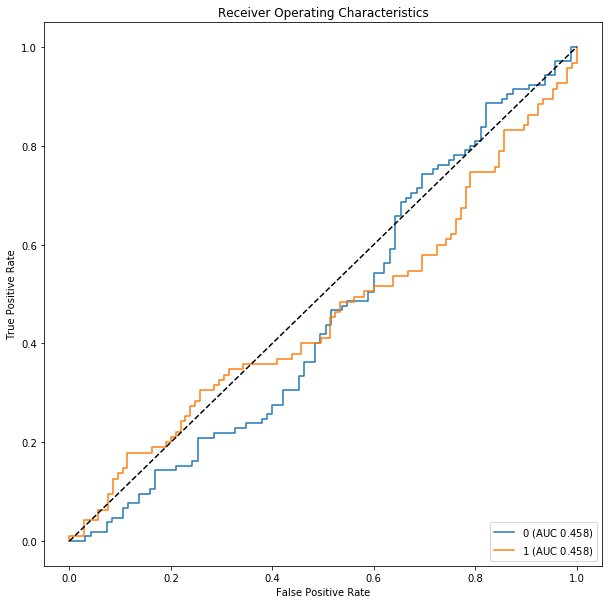

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


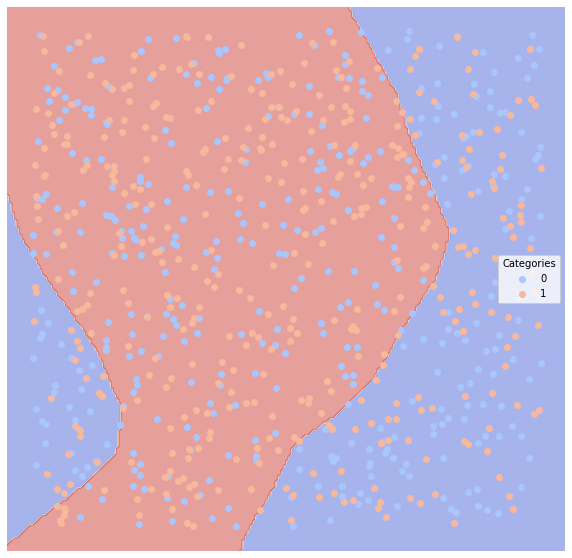

boosting  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.51  0.488221   0.514019           0.519248  0.523810
1               0.51  0.488221   0.462366           0.469281  0.452632
boosting  Confusion Matrix:


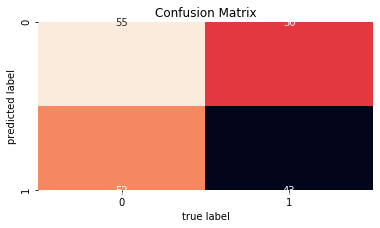

boosting  ROC:


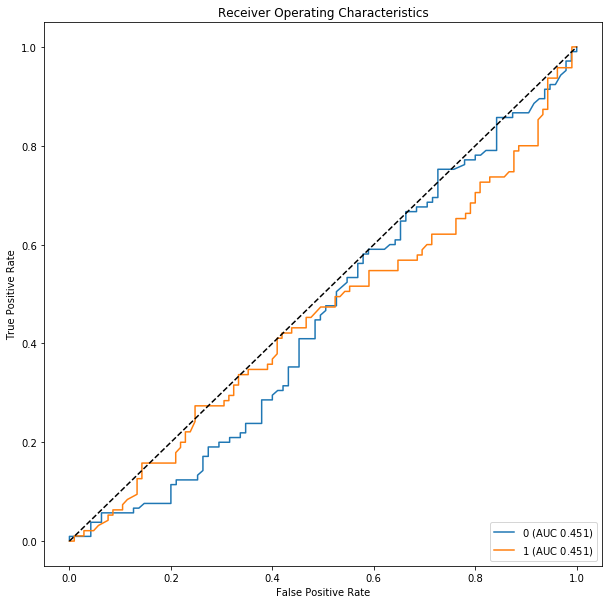

boosting  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


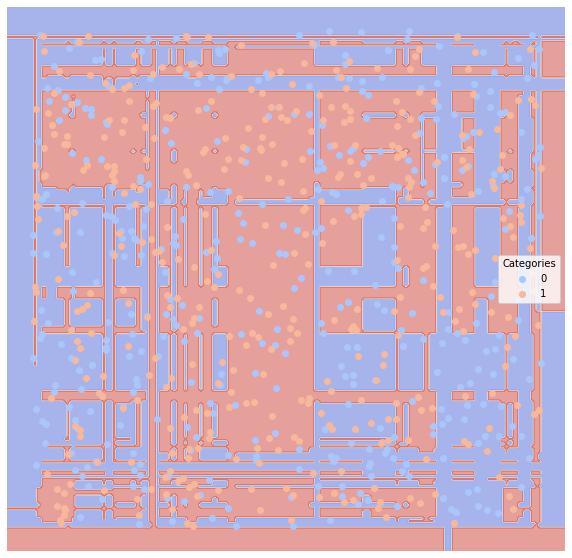

In [114]:
eval5 = all_model(dfTrain5, dfTest5)

bayes  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.235  0.772943   0.676768           0.627969  0.817073
1              0.235  0.772943   0.851485           0.780574  0.728814
bayes  Confusion Matrix:


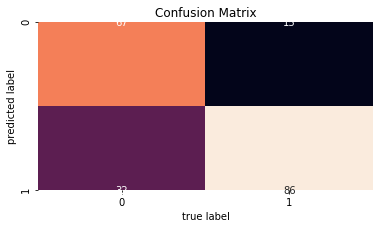

bayes  ROC:


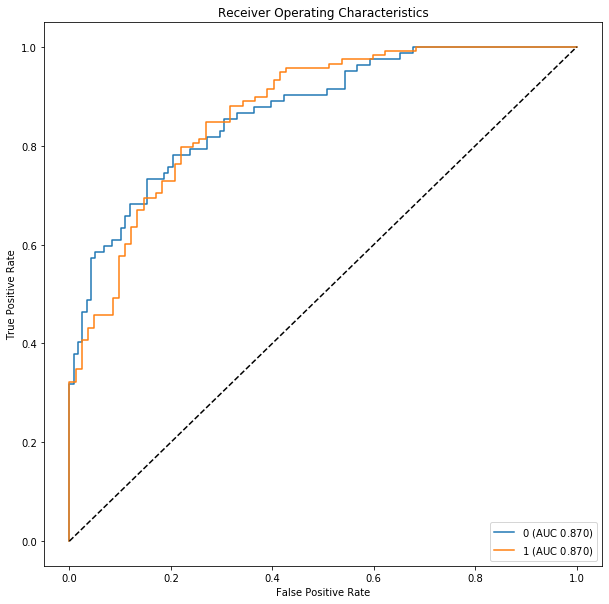

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


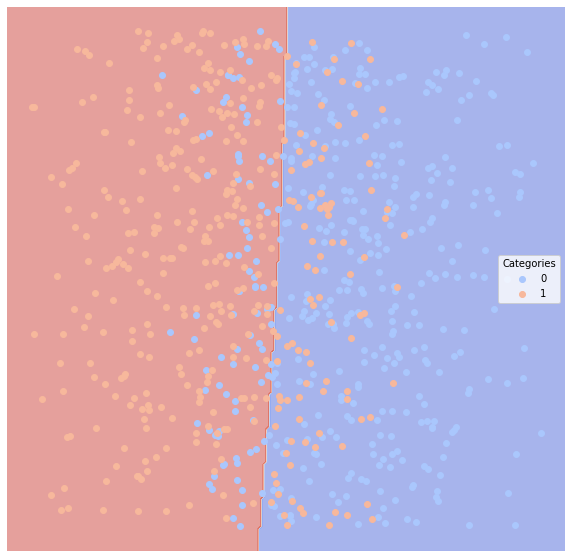

svm_linear  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.24  0.768706       0.67           0.622439  0.817073
1               0.24  0.768706       0.85           0.777288  0.720339
svm_linear  Confusion Matrix:


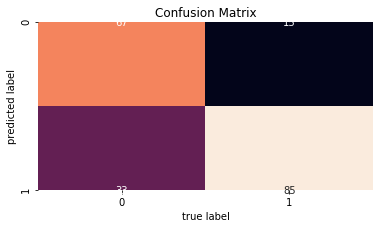

svm_linear  ROC:


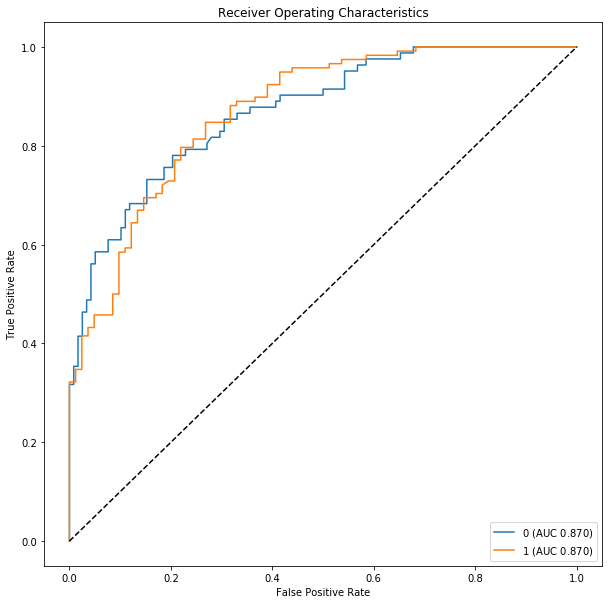

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


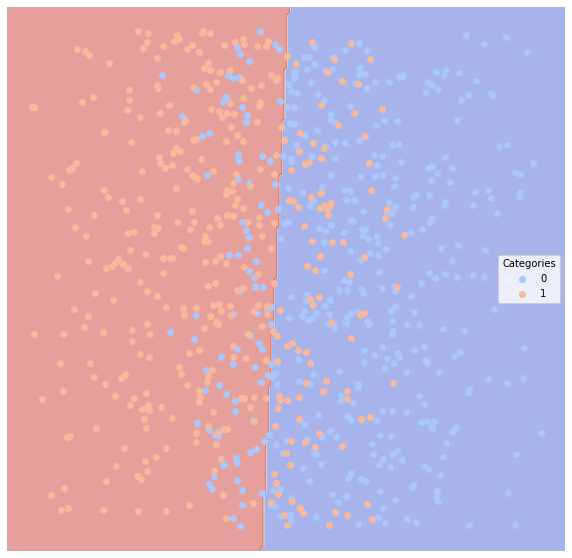

svm_poly  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.265  0.760542   0.621849           0.601181  0.902439
1              0.265  0.760542   0.901235           0.782543  0.618644
svm_poly  Confusion Matrix:


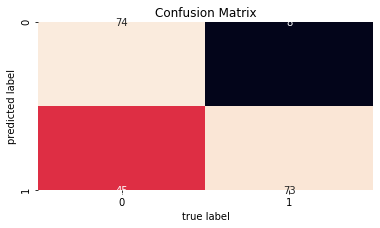

svm_poly  ROC:


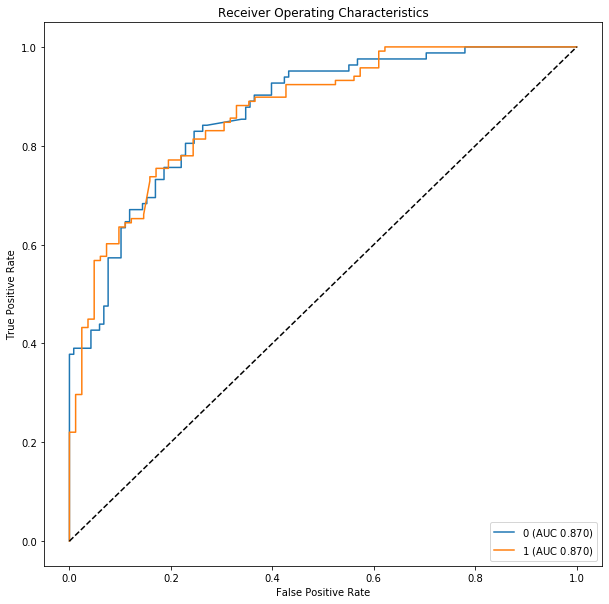

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


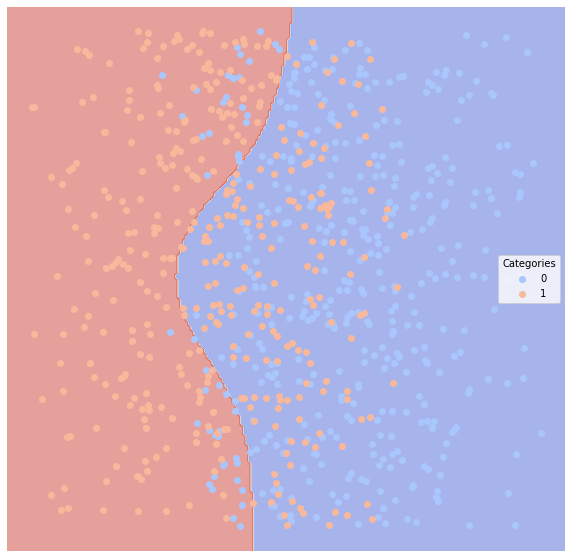

knn  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.35  0.658743   0.557692           0.514465  0.707317
1               0.35  0.658743   0.750000           0.687627  0.610169
knn  Confusion Matrix:


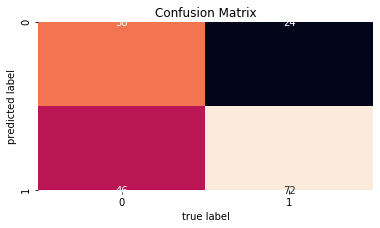

knn  ROC:


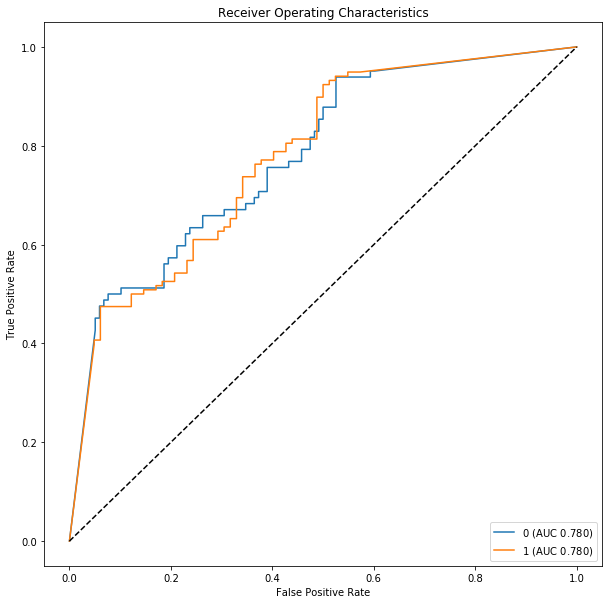

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


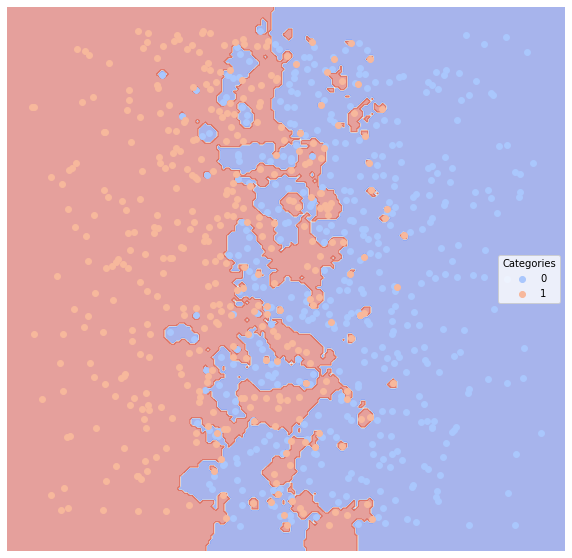

classical_reg  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.24  0.768706       0.67           0.622439  0.817073
1               0.24  0.768706       0.85           0.777288  0.720339
classical_reg  Confusion Matrix:


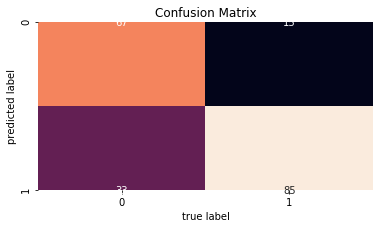

classical_reg  ROC:


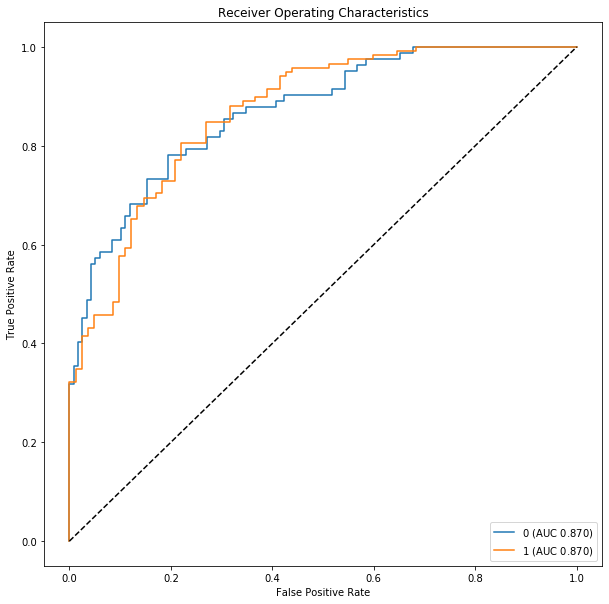

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


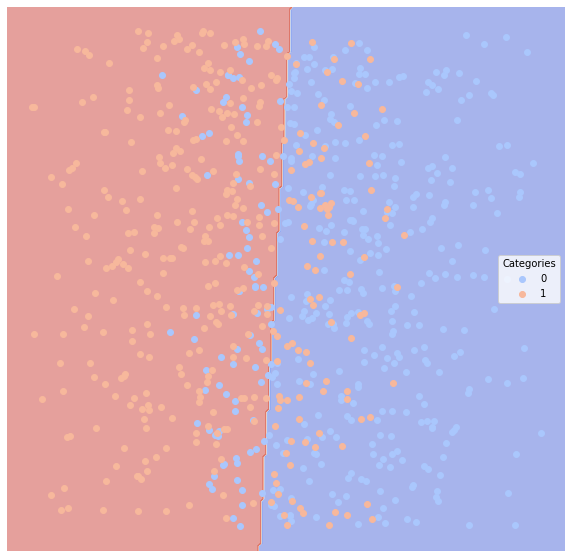

decision_tree  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.255  0.748553   0.663158           0.604499  0.768293
1              0.255  0.748553   0.819048           0.756933  0.728814
decision_tree  Confusion Matrix:


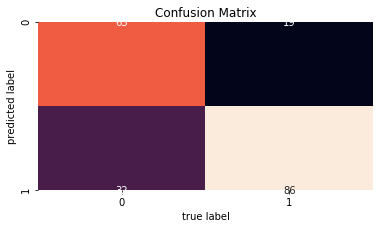

decision_tree  ROC:


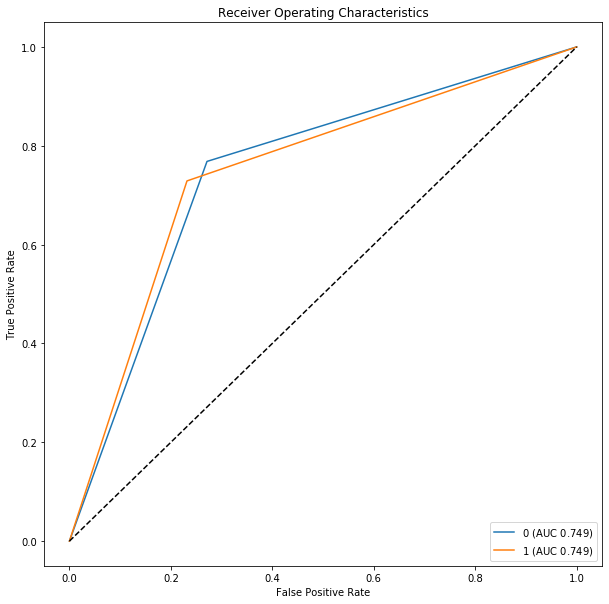

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


decision_tree  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


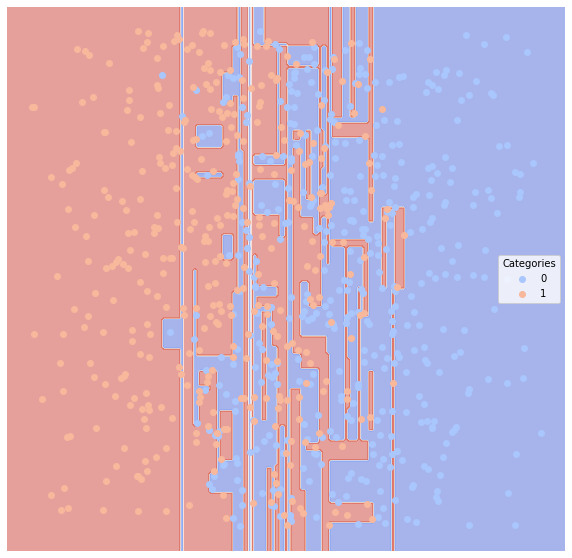

random_forest  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.335  0.678896   0.568807           0.530074  0.756098
1              0.335  0.678896   0.780220           0.704454  0.601695
random_forest  Confusion Matrix:


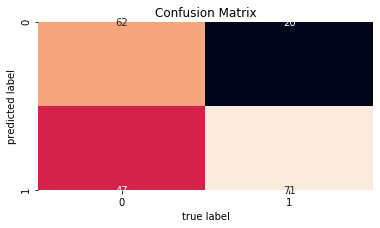

random_forest  ROC:


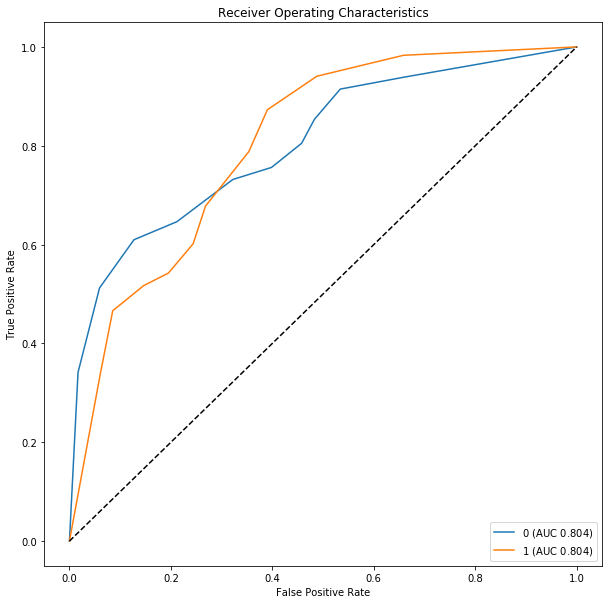

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


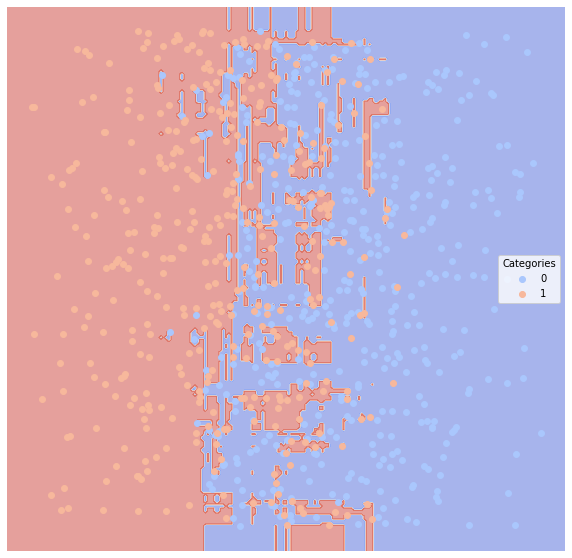

neural_network  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.25  0.758371       0.66           0.611220  0.804878
1               0.25  0.758371       0.84           0.767966  0.711864
neural_network  Confusion Matrix:


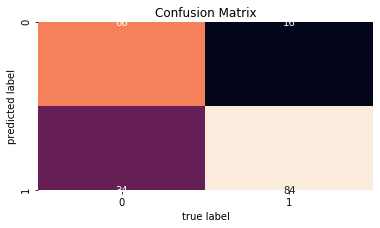

neural_network  ROC:


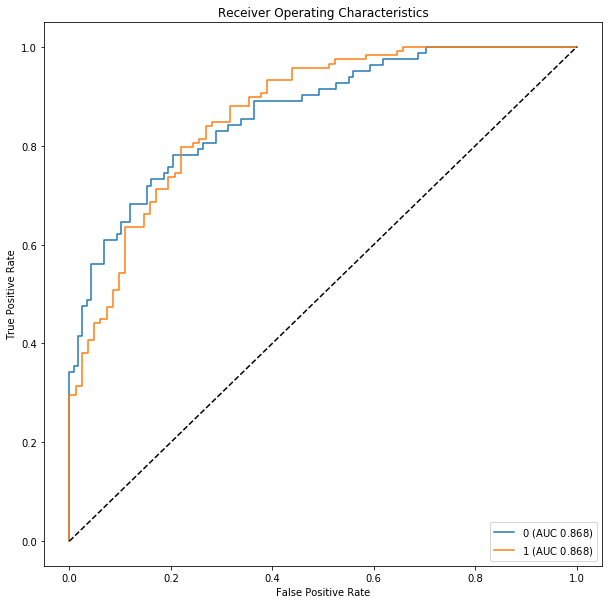

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


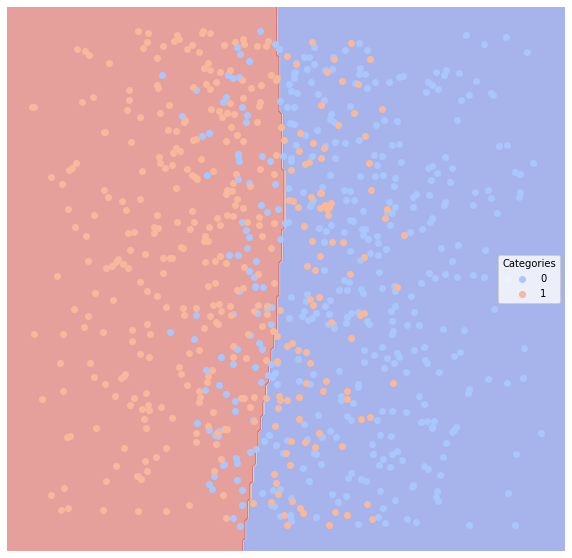

boosting  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.255  0.759715   0.644860           0.607626  0.841463
1              0.255  0.759715   0.860215           0.773197  0.677966
boosting  Confusion Matrix:


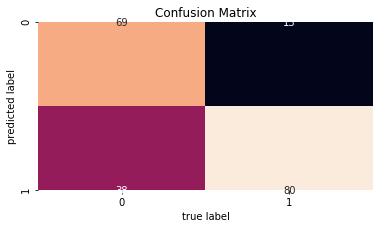

boosting  ROC:


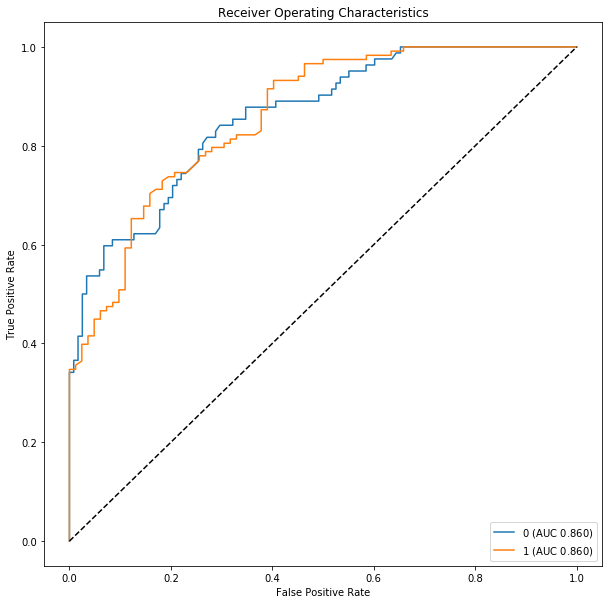

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


boosting  Regions:


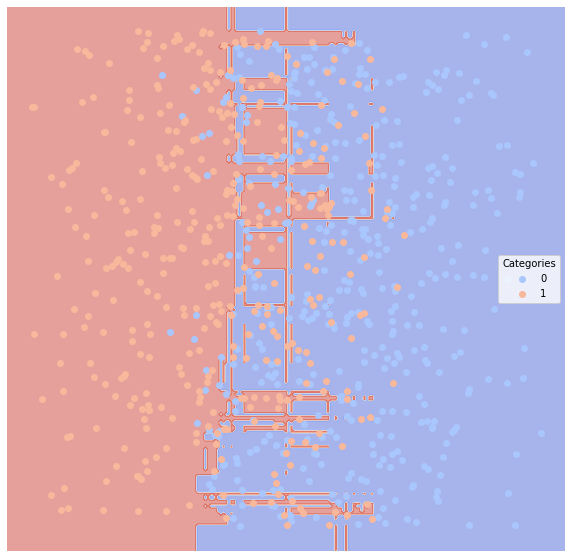

In [115]:
eval6 = all_model(dfTrain6, dfTest6)

bayes  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.47  0.531053   0.544304           0.521733  0.425743
1               0.47  0.531053   0.520661           0.511330  0.636364
bayes  Confusion Matrix:


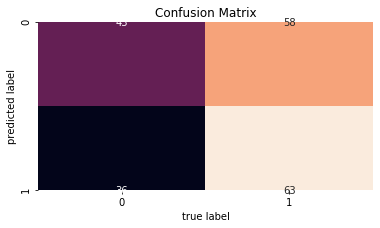

bayes  ROC:


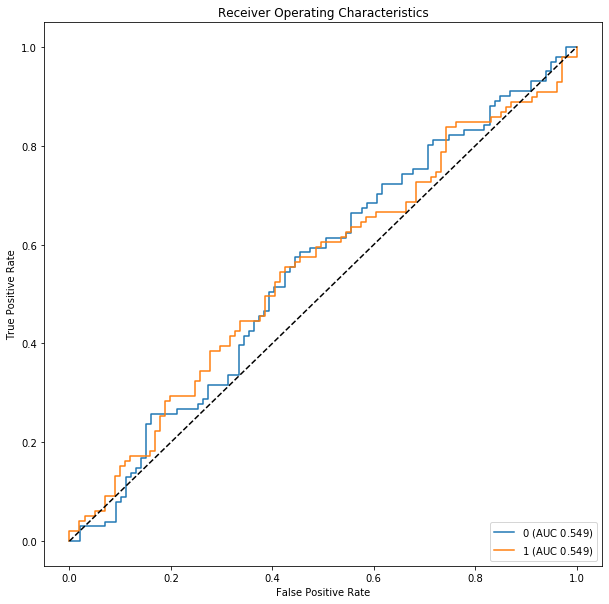

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


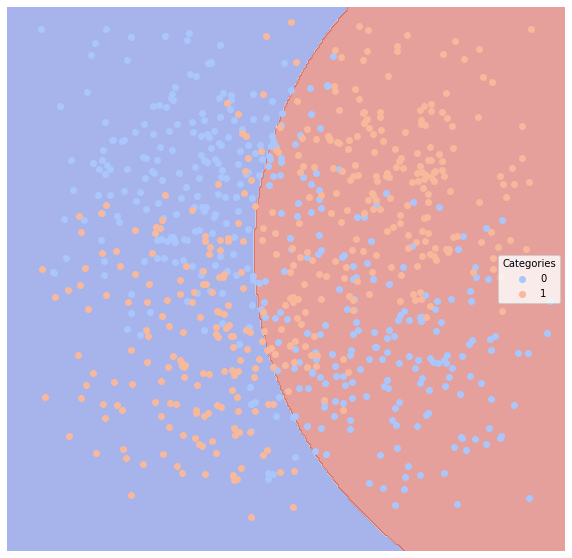

svm_linear  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.465  0.535504   0.544444           0.524136  0.485149
1              0.465  0.535504   0.527273           0.513907  0.585859
svm_linear  Confusion Matrix:


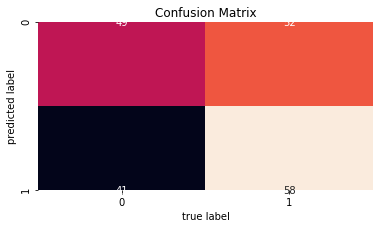

svm_linear  ROC:


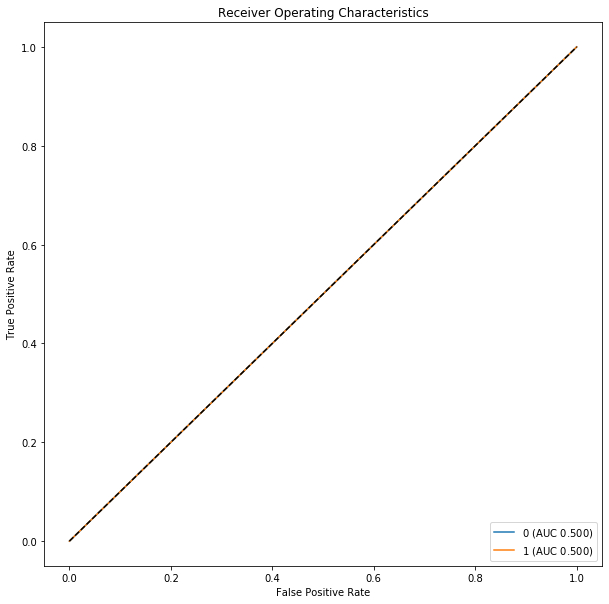

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


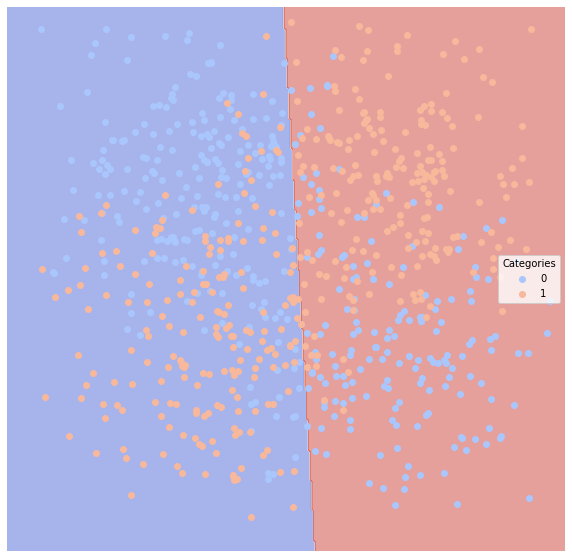

svm_poly  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.29  0.712471   0.921569           0.698849  0.465347
1               0.29  0.712471   0.637584           0.631823  0.959596
svm_poly  Confusion Matrix:


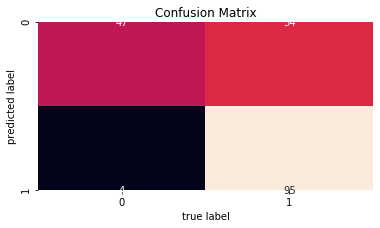

svm_poly  ROC:


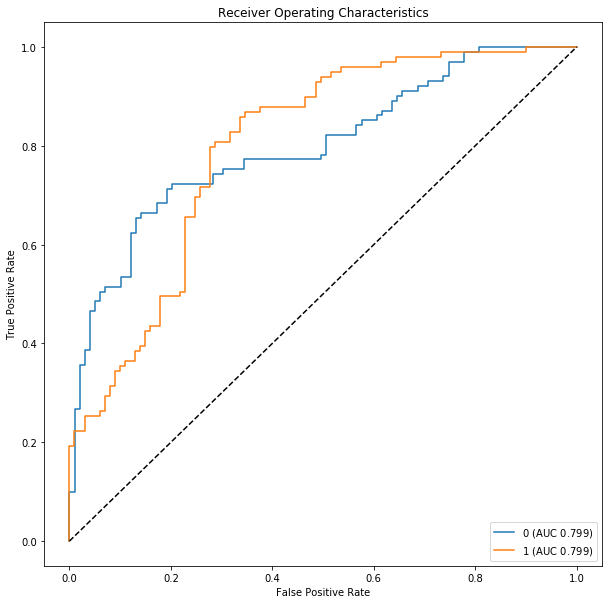

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


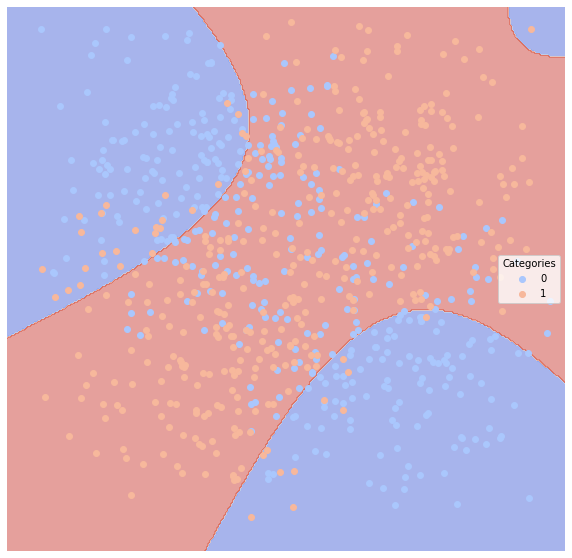

knn  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.28  0.720372   0.741935           0.666867  0.683168
1               0.28  0.720372   0.700935           0.651011  0.757576
knn  Confusion Matrix:


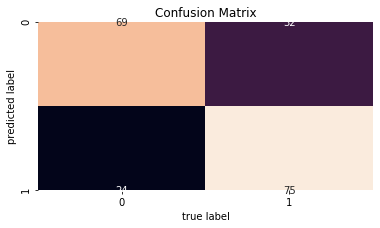

knn  ROC:


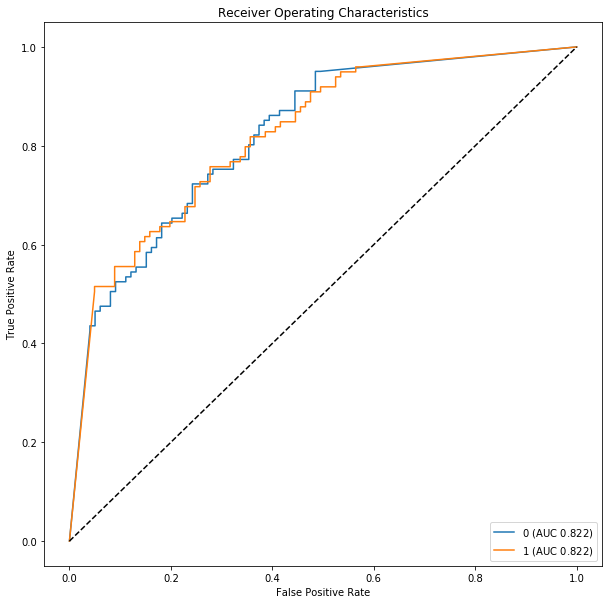

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


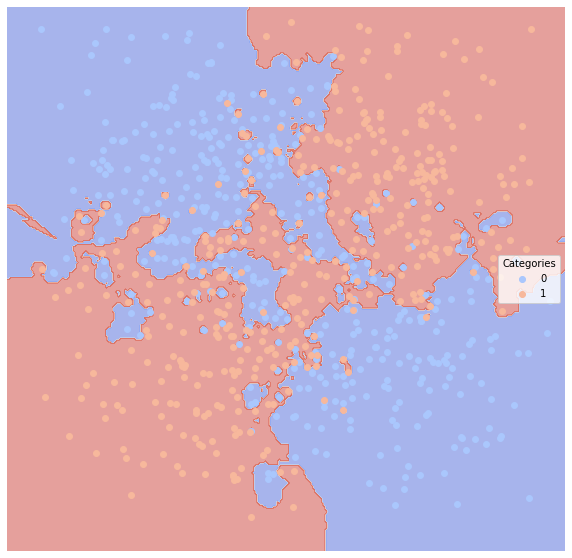

classical_reg  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.455  0.545605   0.556818           0.530140  0.485149
1              0.455  0.545605   0.535714           0.519675  0.606061
classical_reg  Confusion Matrix:


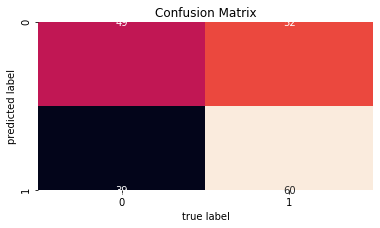

classical_reg  ROC:


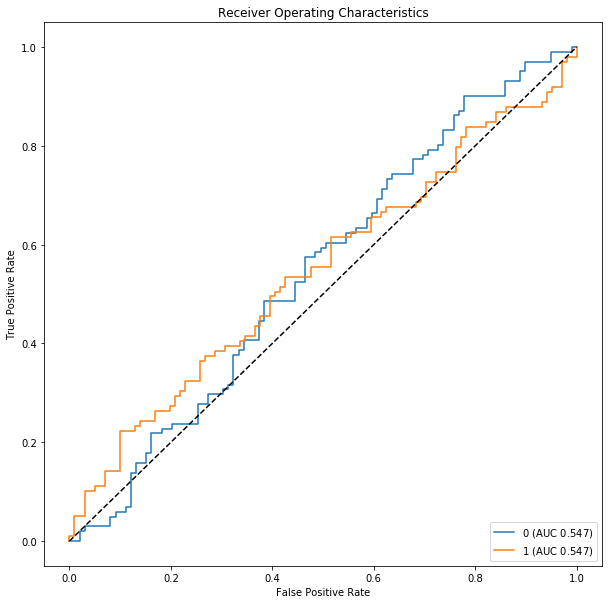

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


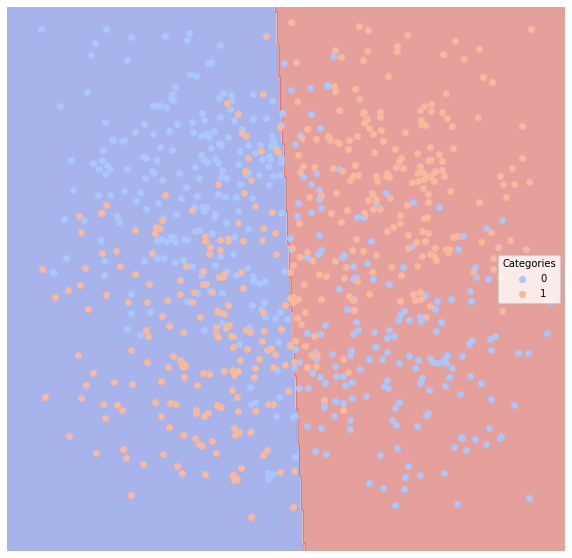

decision_tree  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.315  0.684818   0.682692           0.629912  0.702970
1              0.315  0.684818   0.687500           0.623333  0.666667
decision_tree  Confusion Matrix:


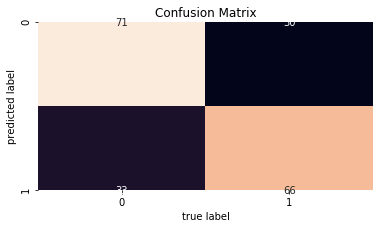

decision_tree  ROC:


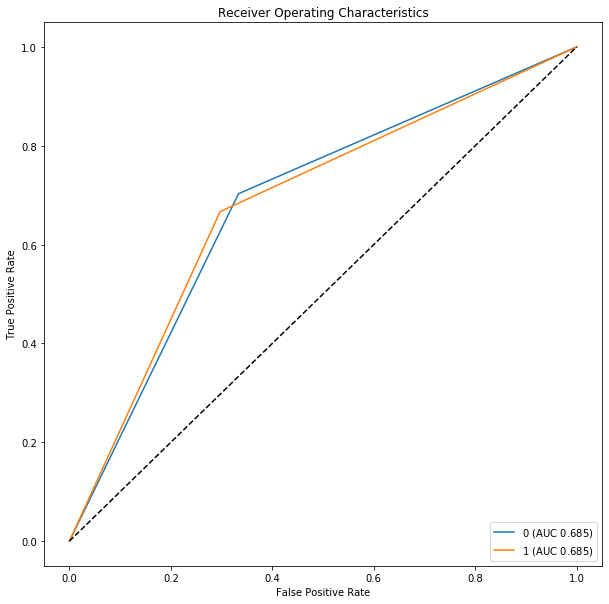

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


decision_tree  Regions:


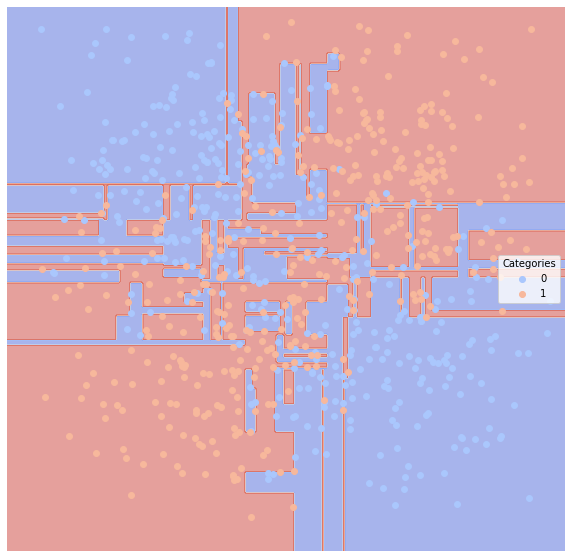

random_forest  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.25  0.750175   0.762887           0.693947  0.732673
1               0.25  0.750175   0.737864           0.681441  0.767677
random_forest  Confusion Matrix:


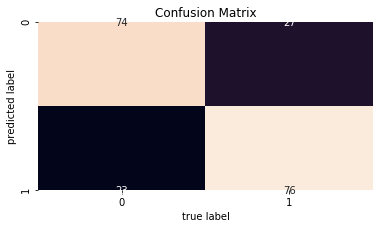

random_forest  ROC:


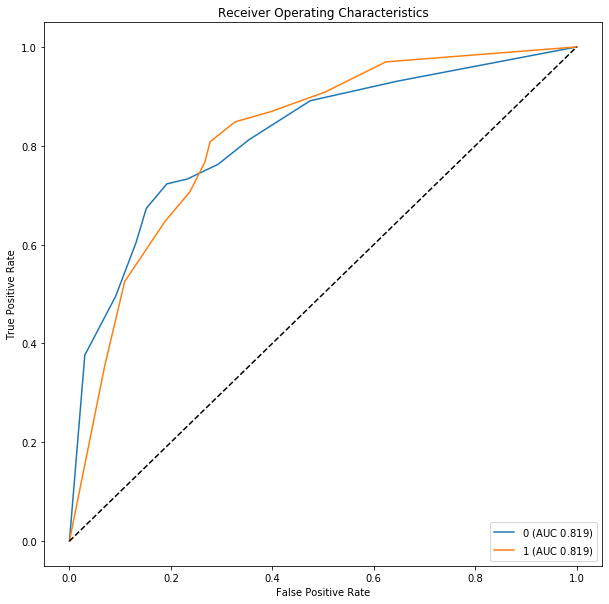

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


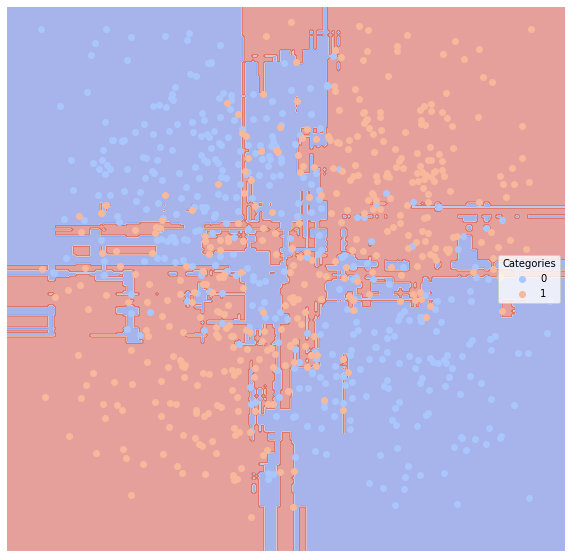

neural_network  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.23  0.770577   0.808989           0.721705  0.712871
1               0.23  0.770577   0.738739           0.696885  0.828283
neural_network  Confusion Matrix:


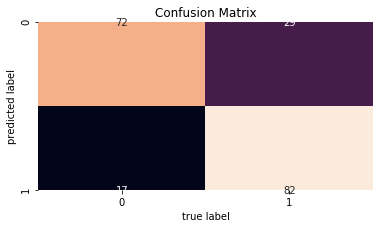

neural_network  ROC:


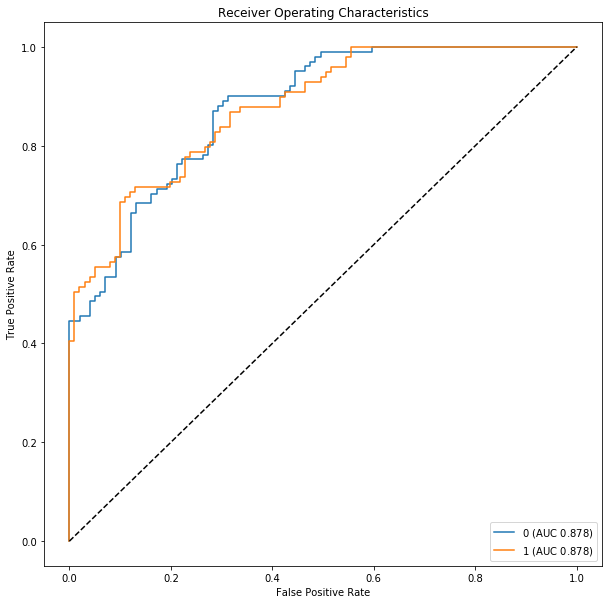

neural_network

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


  Regions:


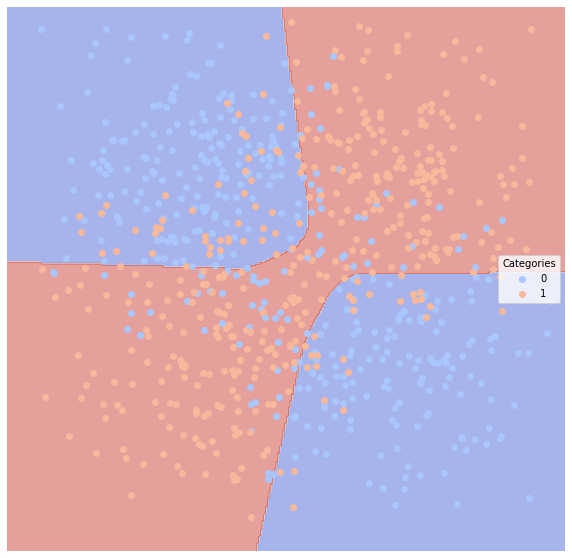

boosting  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.255  0.745625   0.784091           0.695666  0.683168
1              0.255  0.745625   0.714286           0.672201  0.808081
boosting  Confusion Matrix:


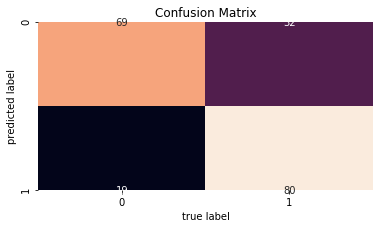

boosting  ROC:


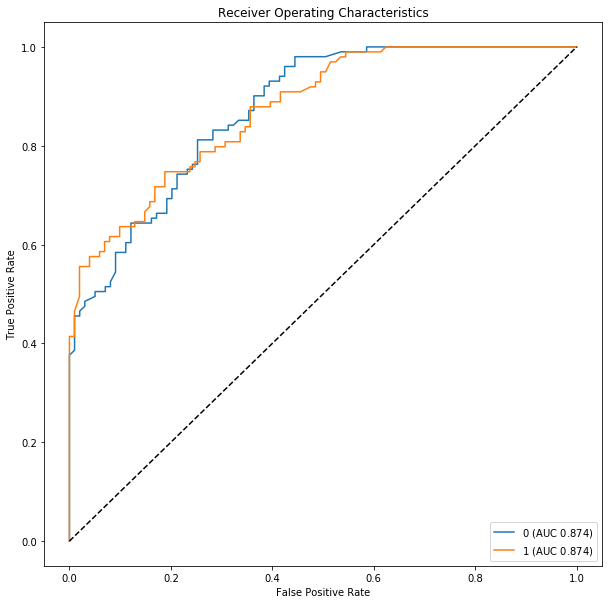

boosting  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


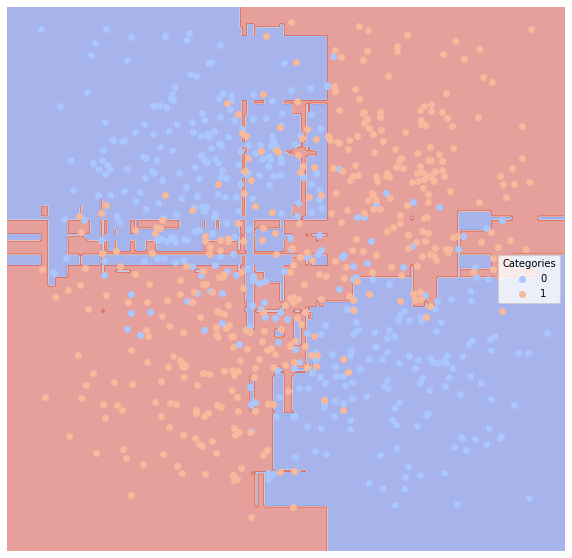

In [116]:
eval7 = all_model(dfTrain7, dfTest7)

bayes  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.23  0.771509   0.728070           0.691631  0.846939
1               0.23  0.771509   0.825581           0.729669  0.696078
bayes  Confusion Matrix:


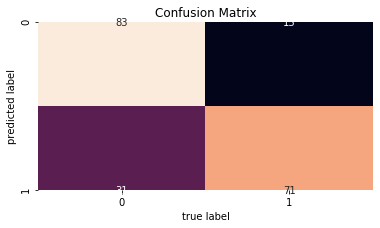

bayes  ROC:


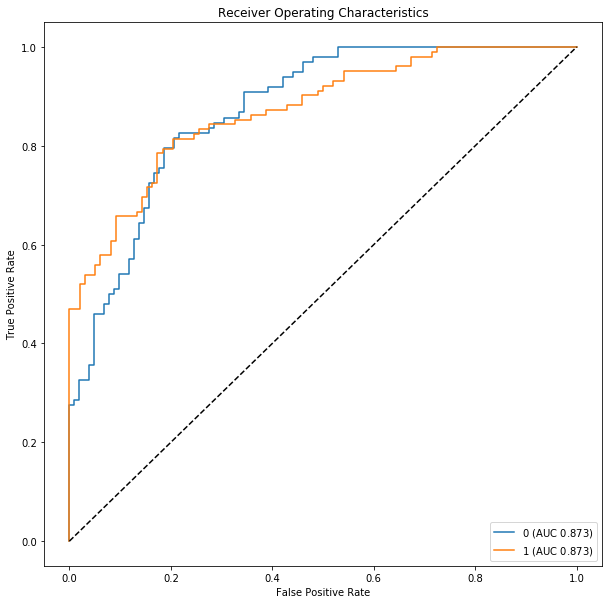

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


bayes  Regions:


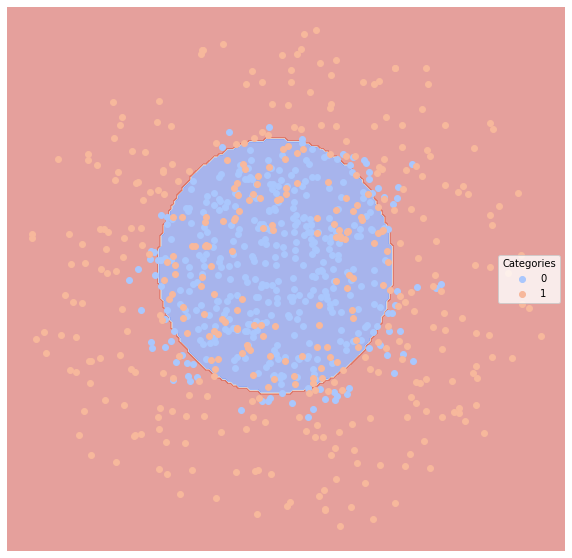

svm_linear  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.425  0.579532   0.544828           0.534198  0.806122
1              0.425  0.579532   0.654545           0.561016  0.352941
svm_linear  Confusion Matrix:


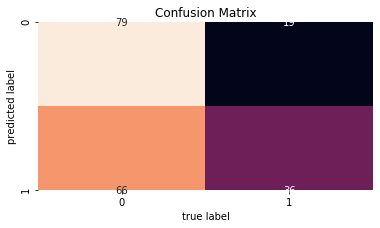

svm_linear  ROC:


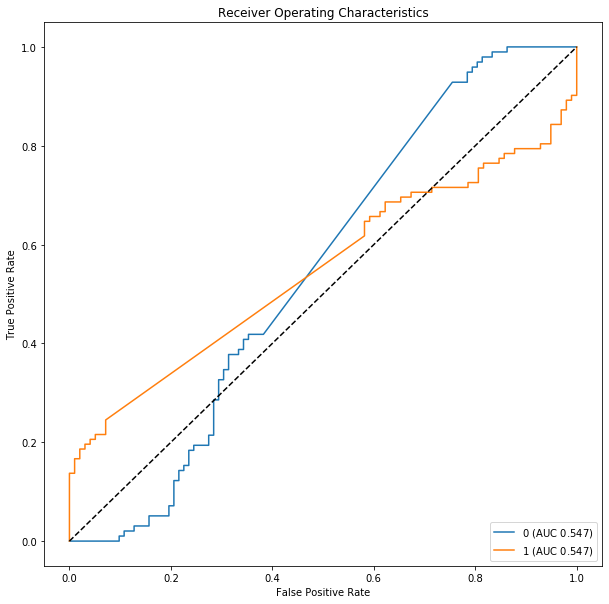

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


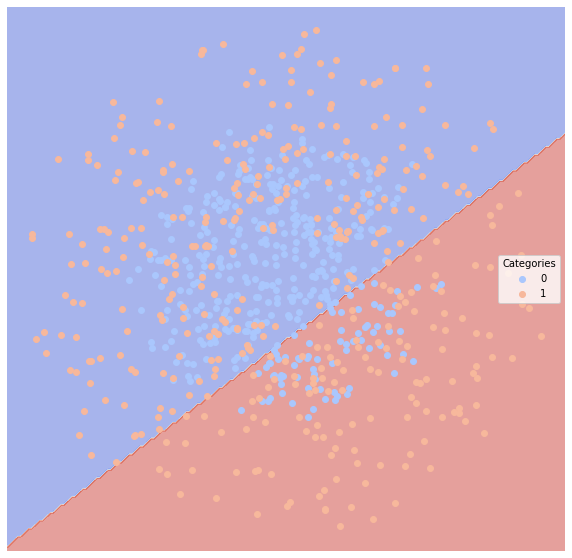

svm_poly  Evaluation:
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0               0.51  0.5       0.49               0.49     1.0
1               0.51  0.5       0.00               0.51     0.0
svm_poly  Confusion Matrix:


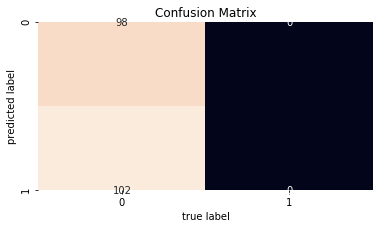

svm_poly  ROC:


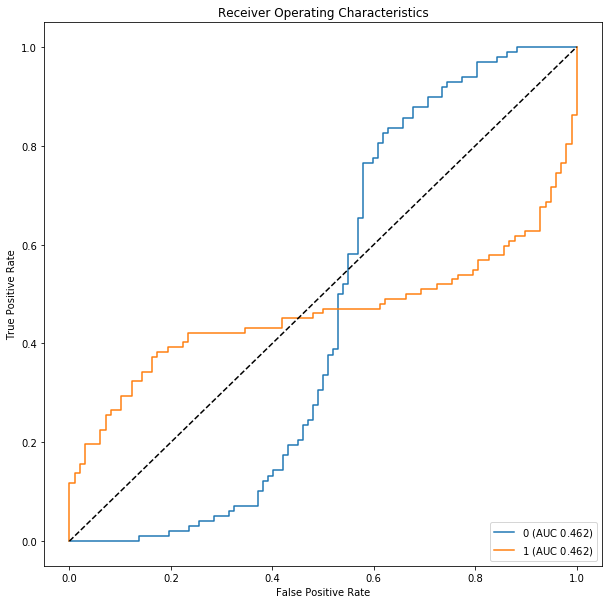

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


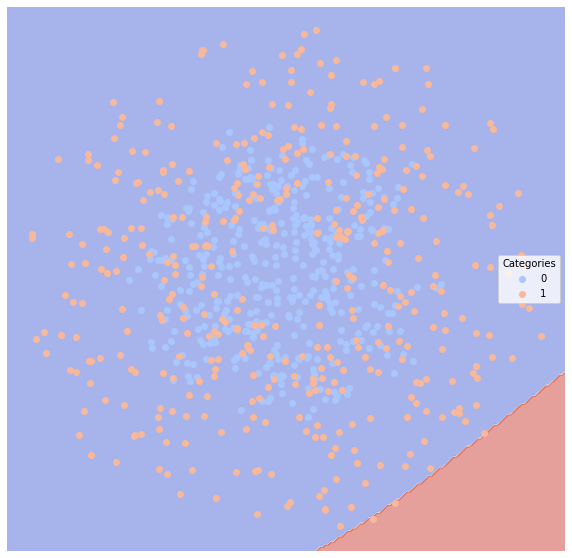

knn  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.28  0.720688   0.698113           0.647147  0.755102
1               0.28  0.720688   0.744681           0.671055  0.686275
knn  Confusion Matrix:


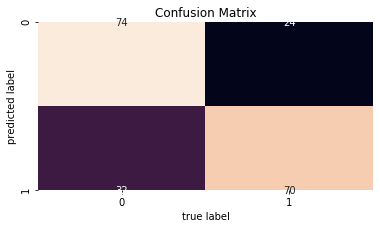

knn  ROC:


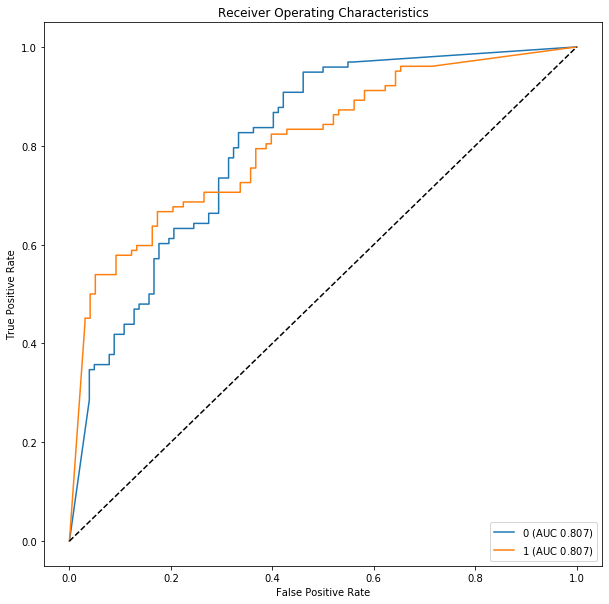

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


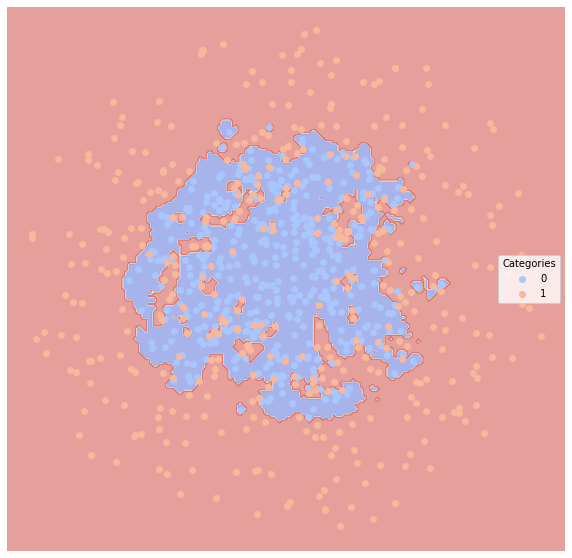

classical_reg  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.435  0.565726   0.551402           0.526966  0.602041
1              0.435  0.565726   0.580645           0.547400  0.529412
classical_reg  Confusion Matrix:


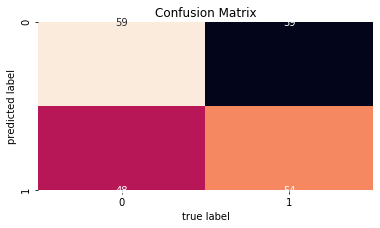

classical_reg  ROC:


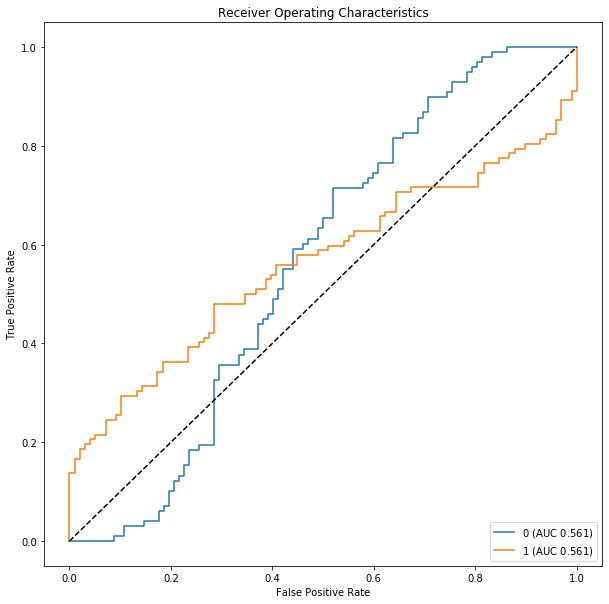

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


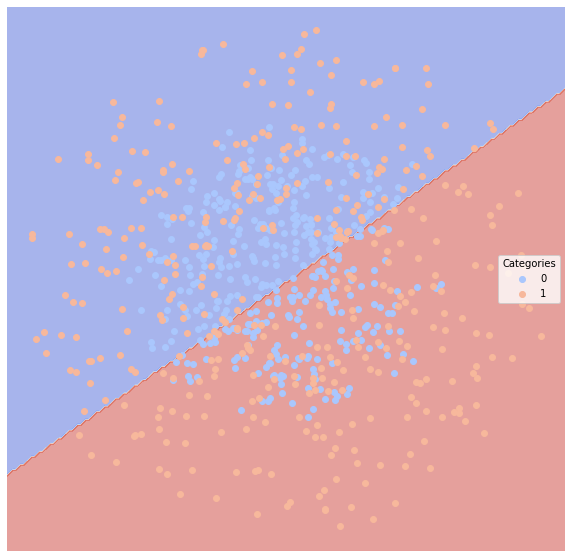

decision_tree  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.32  0.679272   0.684783           0.615217  0.642857
1               0.32  0.679272   0.675926           0.628751  0.715686
decision_tree  Confusion Matrix:


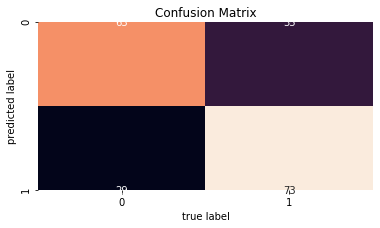

decision_tree  ROC:


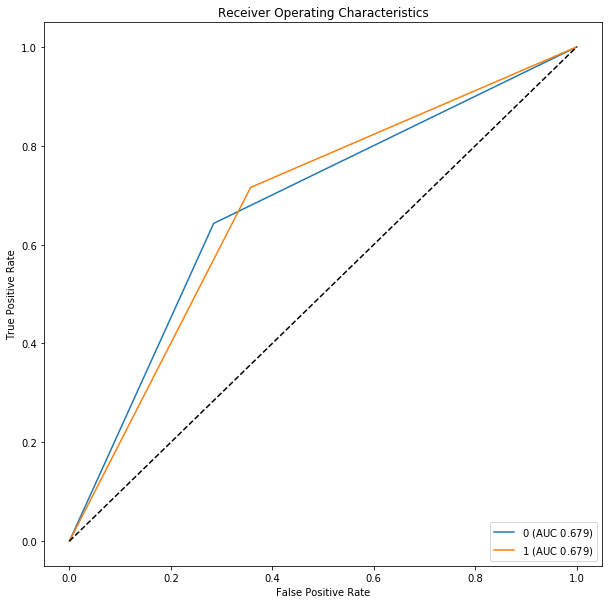

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


decision_tree  Regions:


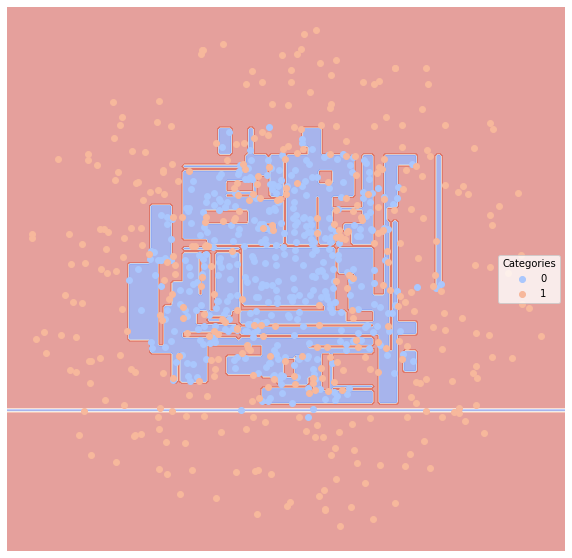

random_forest  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.27  0.731693   0.689655           0.652984  0.816327
1               0.27  0.731693   0.785714           0.688403  0.647059
random_forest  Confusion Matrix:


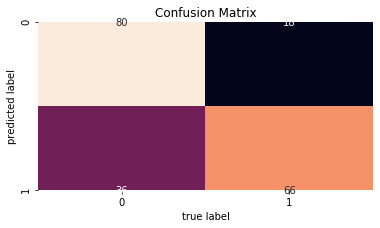

random_forest  ROC:


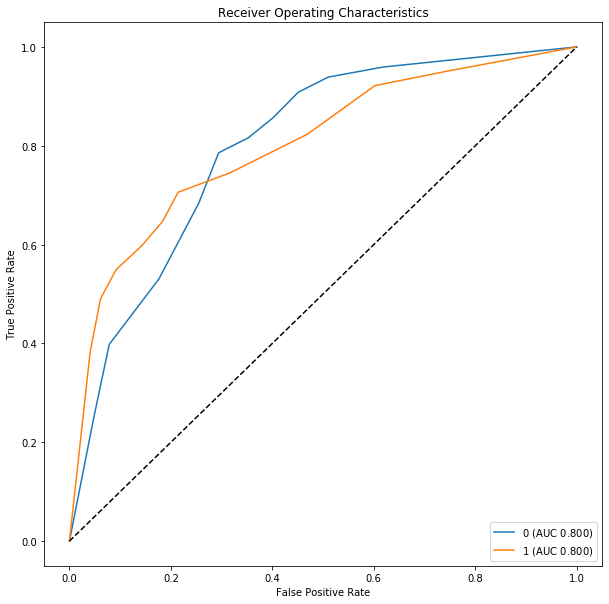

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


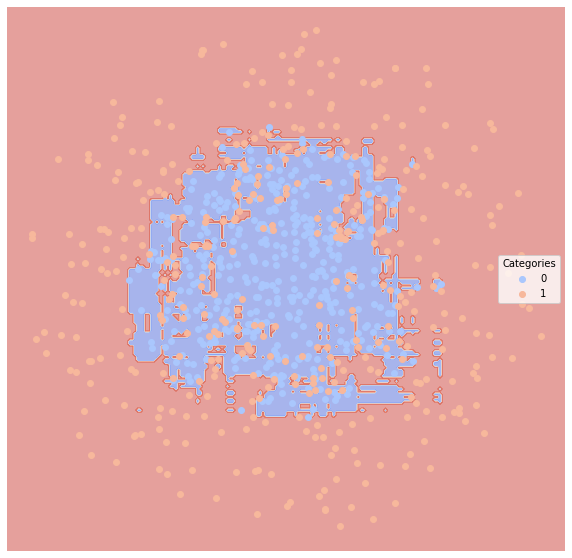

neural_network  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.22  0.780912   0.750000           0.704898  0.826531
1               0.22  0.780912   0.815217           0.734425  0.735294
neural_network  Confusion Matrix:


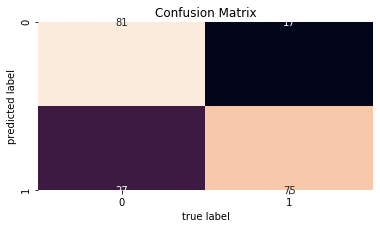

neural_network  ROC:


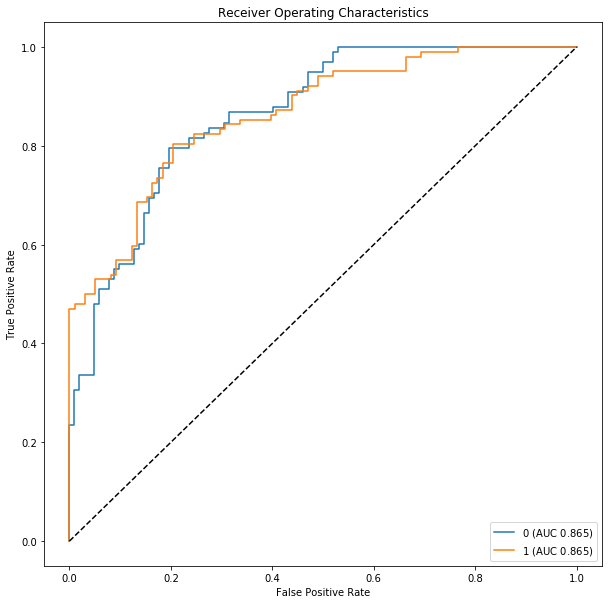

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


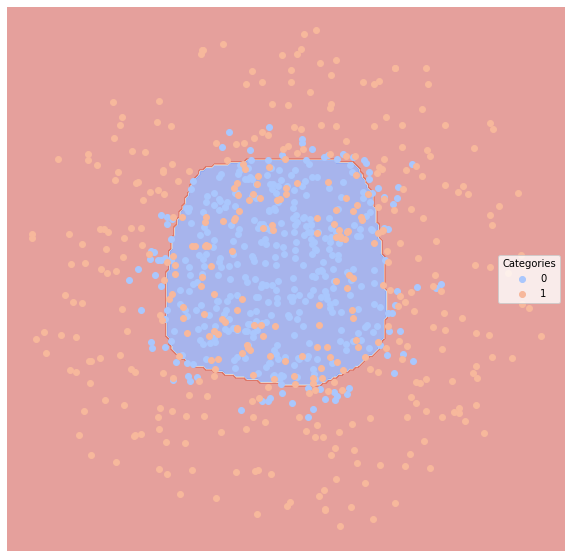

boosting  Evaluation:
          Error_Rate      AUC  Precision  Average_Precision    Recall
Category                                                             
0              0.275  0.72619   0.693694           0.650045  0.785714
1              0.275  0.72619   0.764045           0.679363  0.666667
boosting  Confusion Matrix:


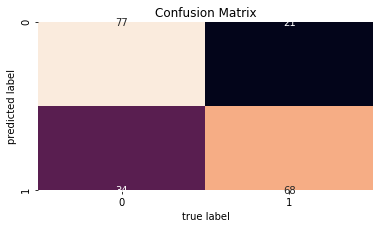

boosting  ROC:


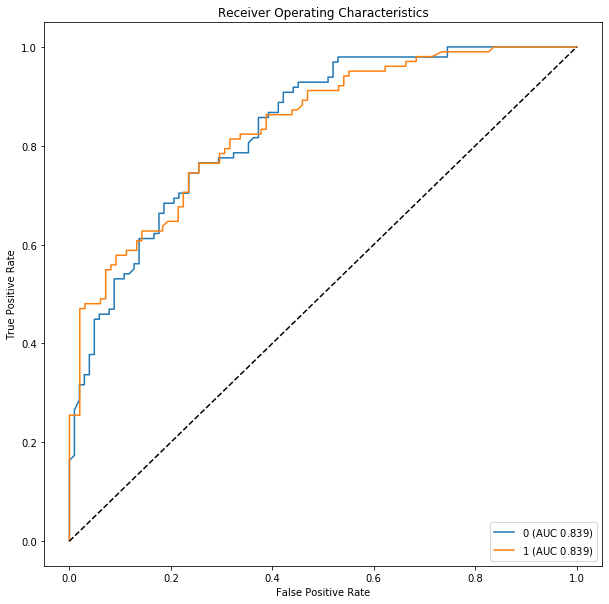

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


boosting  Regions:


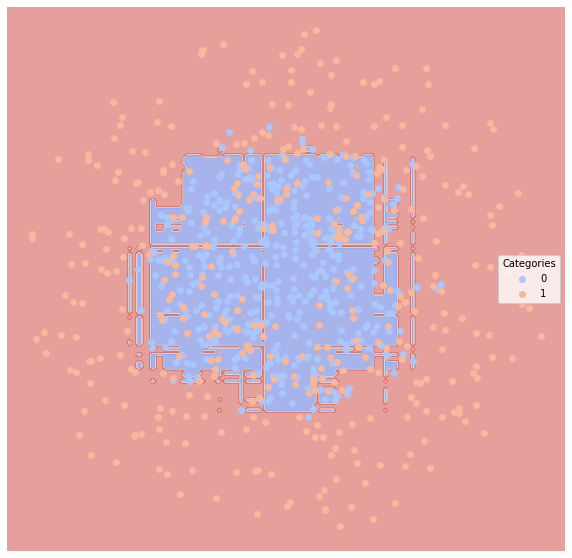

In [117]:
eval8 = all_model(dfTrain8, dfTest8)

bayes  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.004  0.997573   0.977778           0.977778  1.000000
1              0.014  0.983301   0.948980           0.933001  0.978947
2              0.154  0.780052   0.581818           0.453962  0.673684
3              0.030  0.952425   0.945455           0.888153  0.920354
4              0.166  0.728443   0.641304           0.447128  0.541284
bayes  Confusion Matrix:


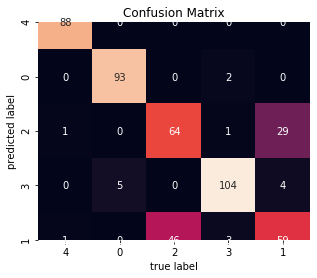

bayes  ROC:


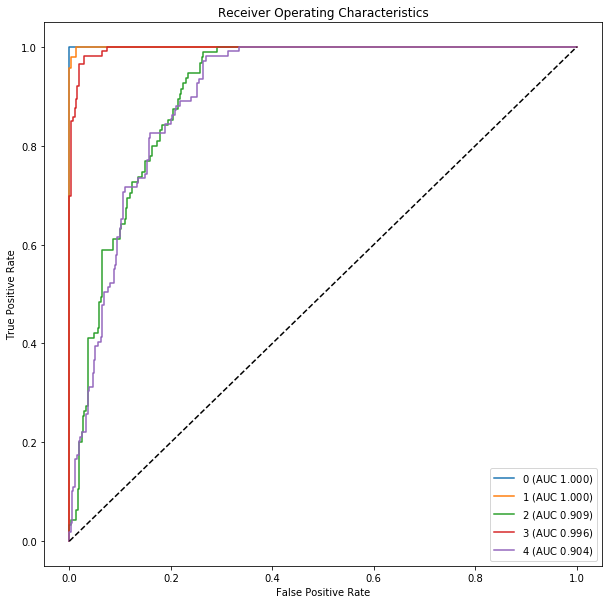

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

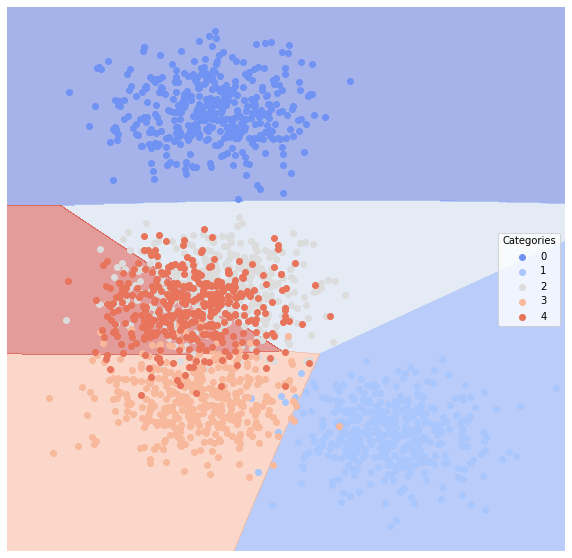

svm_linear  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.004  0.997573   0.977778           0.977778  1.000000
1              0.014  0.983301   0.948980           0.933001  0.978947
2              0.156  0.778817   0.576577           0.450431  0.673684
3              0.030  0.952425   0.945455           0.888153  0.920354
4              0.168  0.723856   0.637363           0.441147  0.532110
svm_linear  Confusion Matrix:


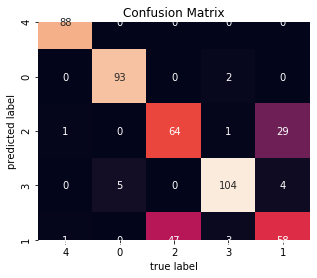

svm_linear  ROC:


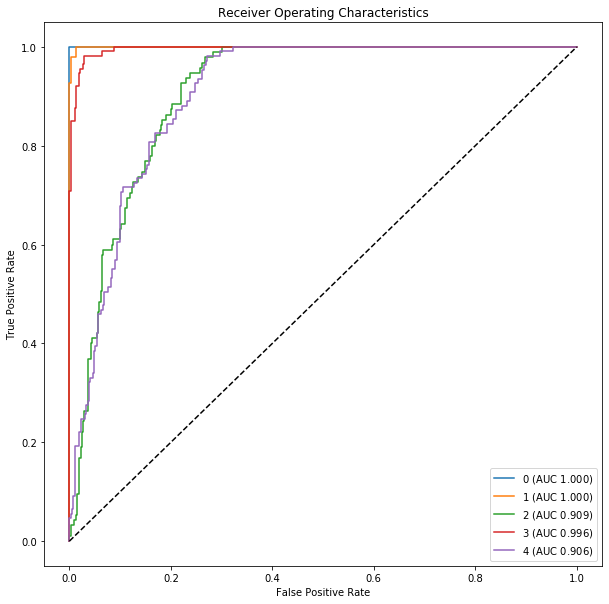

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

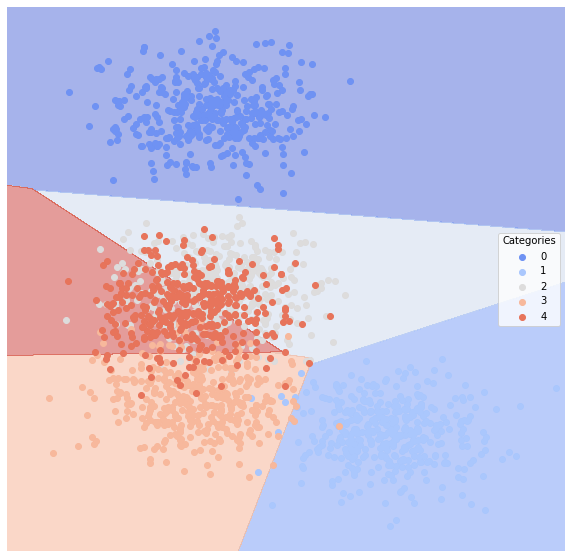

svm_poly  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.004  0.997573   0.977778           0.977778  1.000000
1              0.014  0.983301   0.948980           0.933001  0.978947
2              0.164  0.802079   0.550388           0.459342  0.747368
3              0.028  0.953717   0.954128           0.896136  0.920354
4              0.174  0.686935   0.648649           0.407643  0.440367
svm_poly  Confusion Matrix:


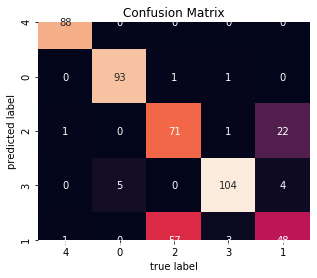

svm_poly  ROC:


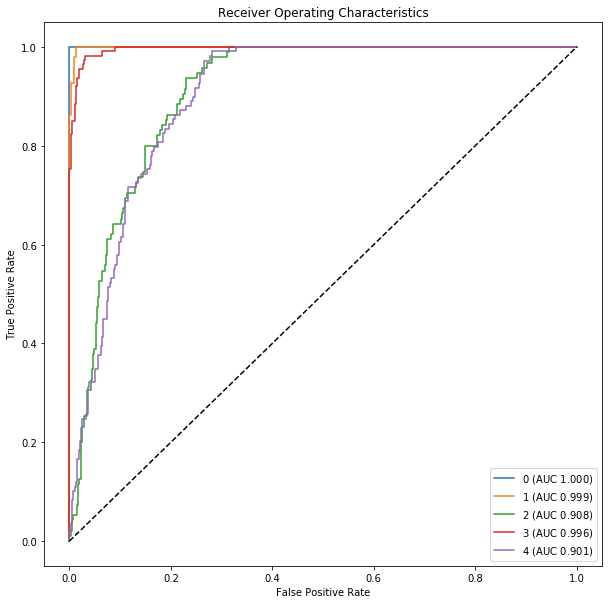

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

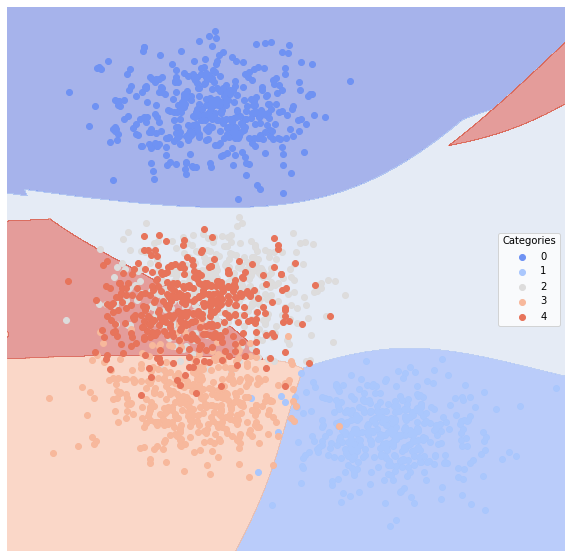

knn  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.004  0.997573   0.977778           0.977778  1.000000
1              0.010  0.989799   0.959184           0.951087  0.989474
2              0.188  0.730864   0.504425           0.378655  0.600000
3              0.044  0.937116   0.902655           0.836786  0.902655
4              0.198  0.671590   0.558140           0.367786  0.440367
knn  Confusion Matrix:


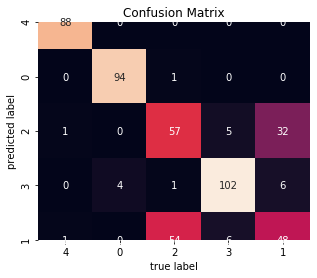

knn  ROC:


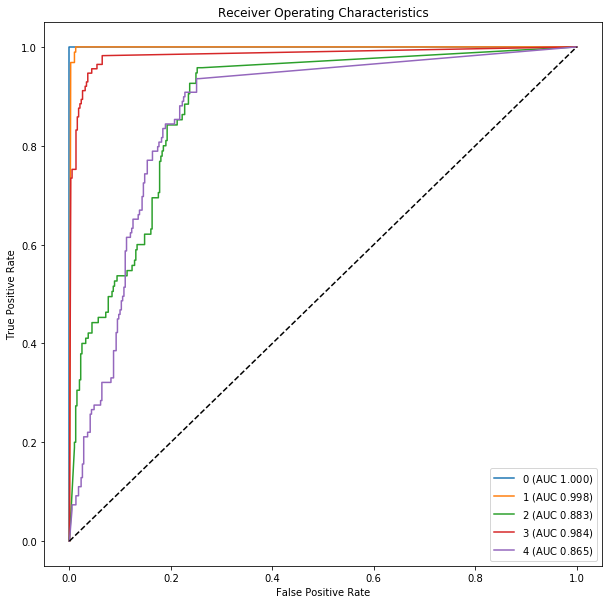

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

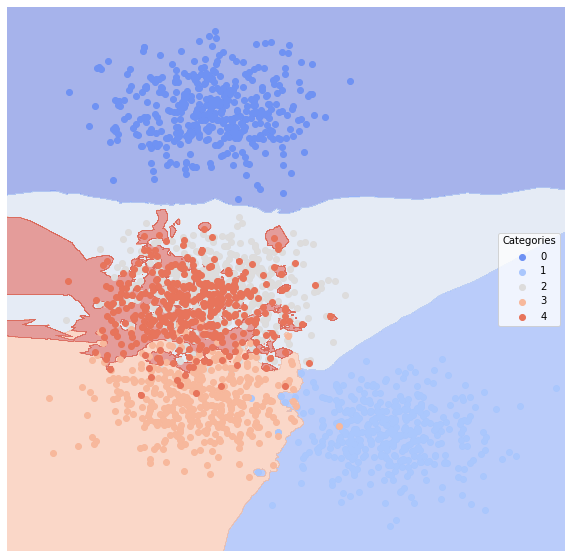

classical_reg  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.004  0.997573   0.977778           0.977778  1.000000
1              0.014  0.983301   0.948980           0.933001  0.978947
2              0.160  0.740091   0.578947           0.415180  0.578947
3              0.054  0.933788   0.858333           0.802375  0.911504
4              0.176  0.722049   0.608247           0.429235  0.541284
classical_reg  Confusion Matrix:


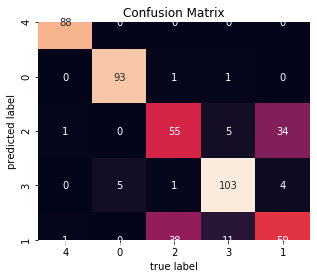

classical_reg  ROC:


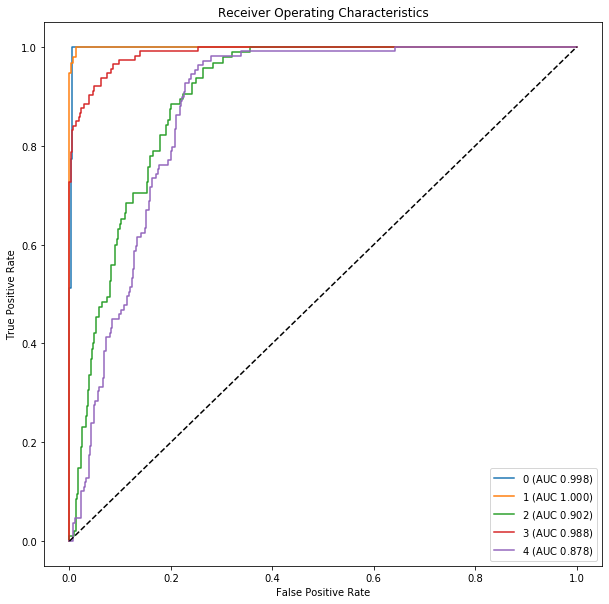

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

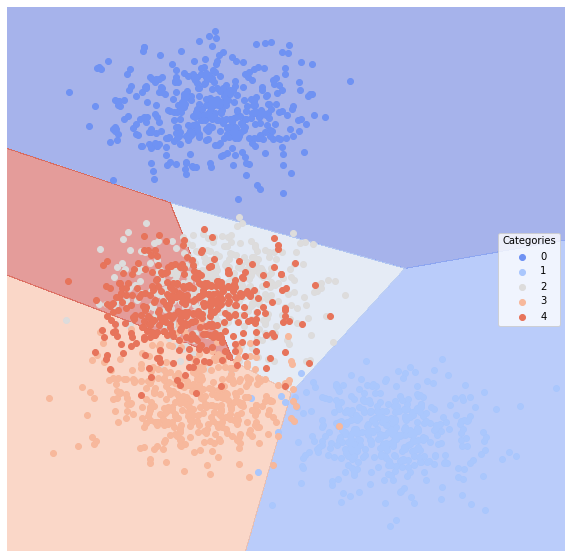

decision_tree  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.004  0.997573   0.977778           0.977778  1.000000
1              0.018  0.976803   0.938776           0.915130  0.968421
2              0.186  0.732099   0.508929           0.381357  0.600000
3              0.054  0.914992   0.898148           0.802977  0.858407
4              0.210  0.663918   0.521739           0.351757  0.440367
decision_tree  Confusion Matrix:


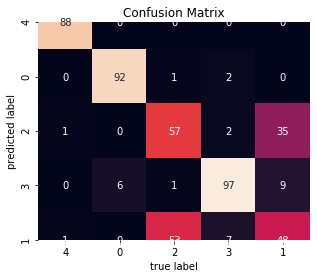

decision_tree  ROC:


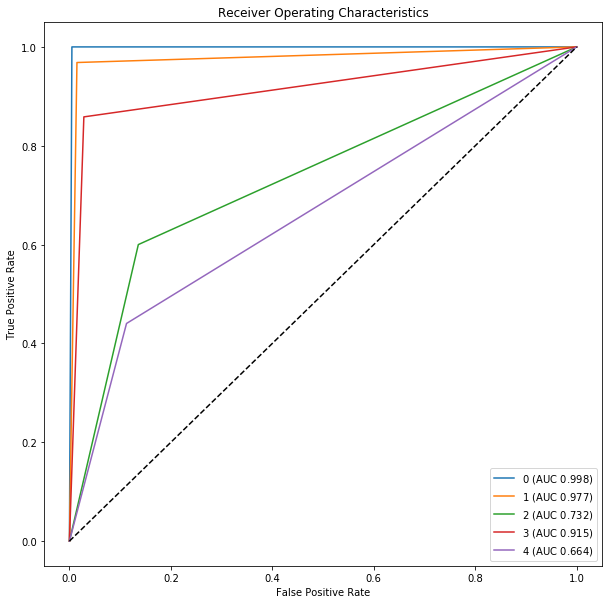

decision_tree  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

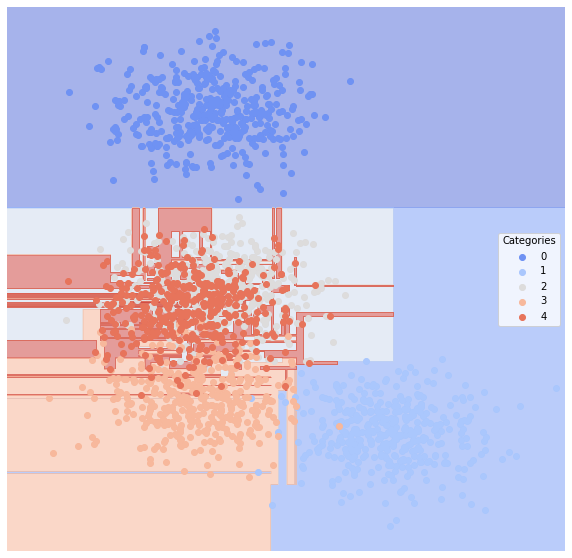

random_forest  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.004  0.997573   0.977778           0.977778  1.000000
1              0.012  0.984535   0.958763           0.942578  0.978947
2              0.172  0.768941   0.537815           0.424318  0.673684
3              0.048  0.940797   0.873950           0.822343  0.920354
4              0.188  0.668059   0.600000           0.375706  0.412844
random_forest  Confusion Matrix:


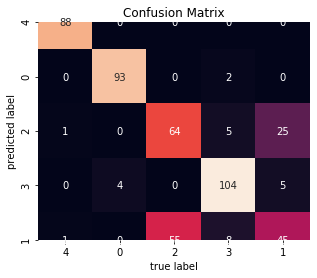

random_forest  ROC:


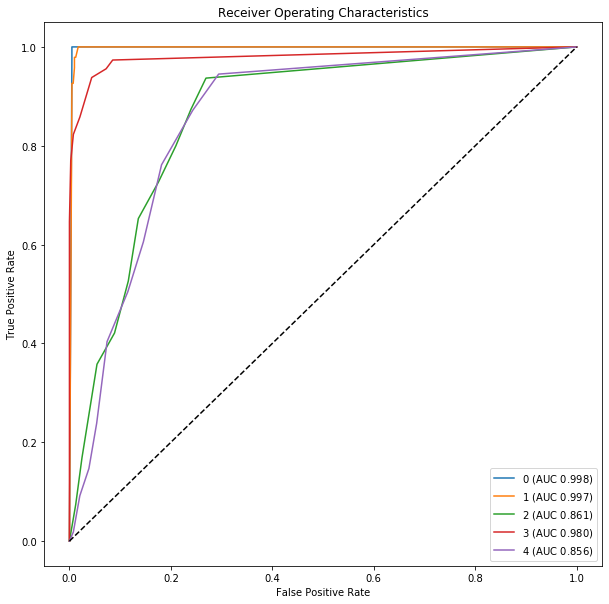

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

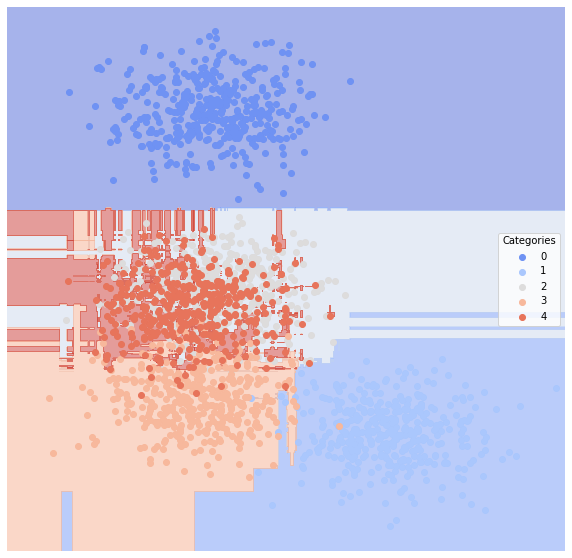

neural_network  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.004  0.997573   0.977778           0.977778  1.000000
1              0.014  0.983301   0.948980           0.933001  0.978947
2              0.146  0.772904   0.610000           0.459684  0.642105
3              0.028  0.956850   0.945946           0.894976  0.929204
4              0.156  0.757995   0.653465           0.481676  0.605505
neural_network  Confusion Matrix:


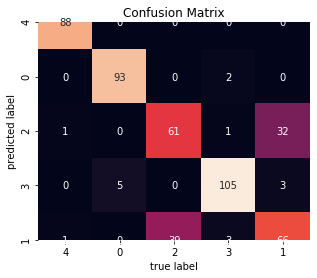

neural_network  ROC:


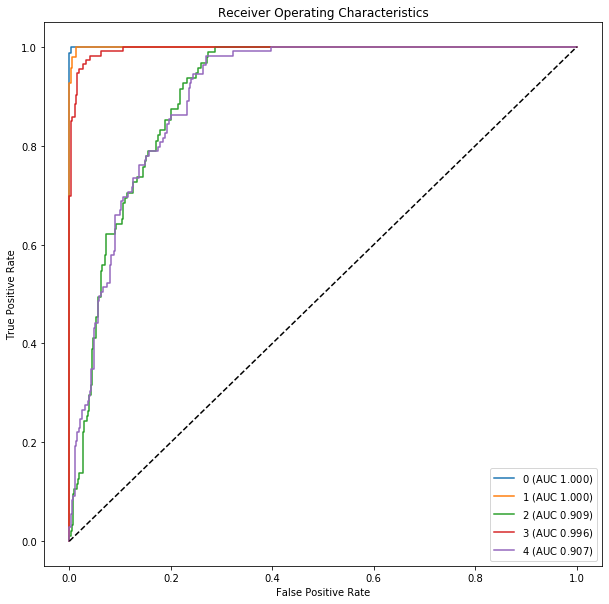

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

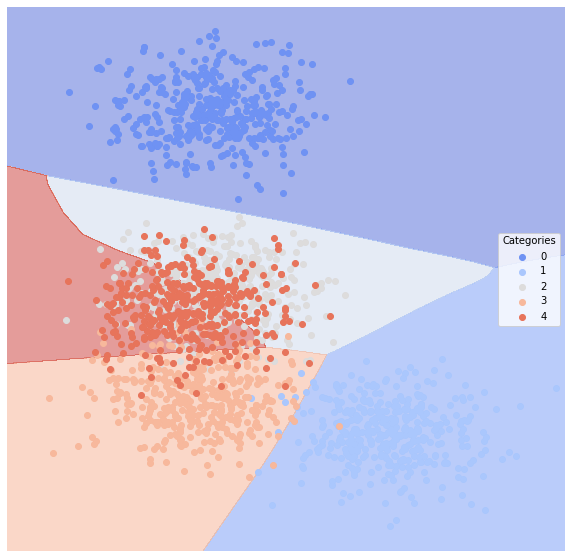

boosting  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.004  0.997573   0.977778           0.977778  1.000000
1              0.014  0.979272   0.958333           0.934070  0.968421
2              0.162  0.779142   0.560345           0.443394  0.684211
3              0.040  0.936567   0.926606           0.852205  0.893805
4              0.184  0.697083   0.595506           0.401558  0.486239
boosting  Confusion Matrix:


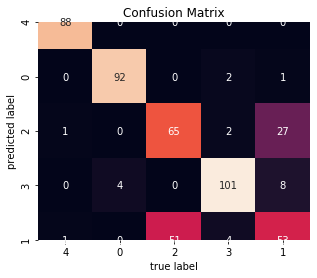

boosting  ROC:


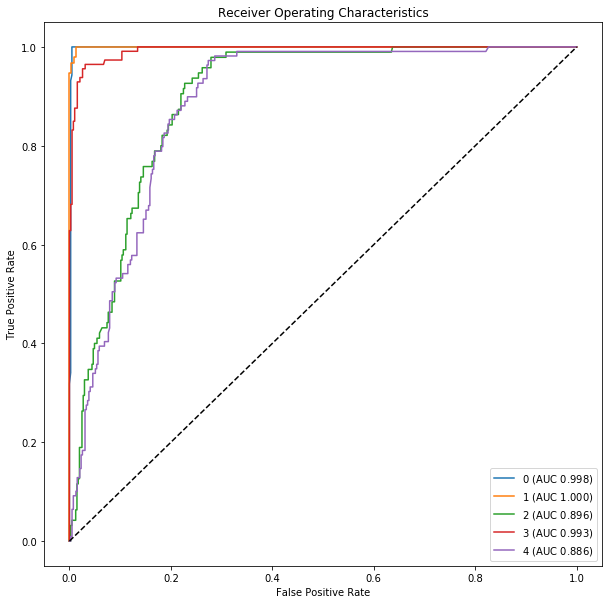

boosting  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

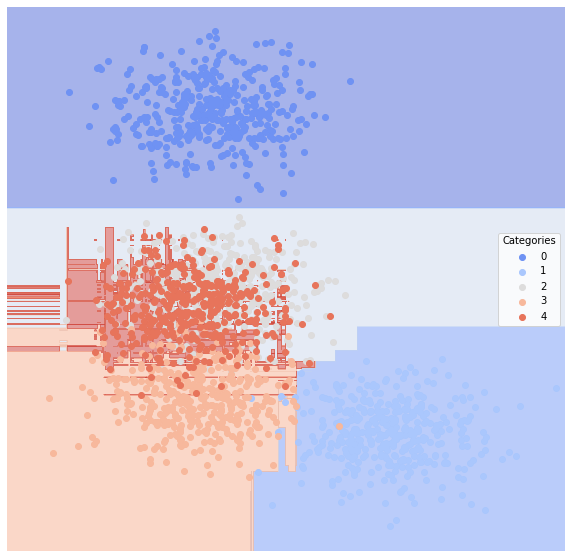

In [118]:
eval9 = all_model(dfTrain9, dfTest9)

In general, all classifers perform worse with the data points with more noise. Since with increasing noise, the pattern of dataset will tend to be more random, which will be more difficult to find a precise decision boundary.

As we states before, (dfTrain0, dfTest0), (dfTrain5, dfTest5) are random samples, generally all the methods have bad performance. The main reason for this is the data is randomly distributed and it hard to find the precise decision boundary according to any rules. 

The second group of datasets is (dfTrain1, dfTest1) and (dfTrain6, dfTest6) which are generated using andSplit. From the visualization of this typee of data, we can see the pattern that these data points can be divided into two clusters with some overlap in the middle. In this case, all the classifiers have close performance with roughly 0.1-0.2 error rate.

The third group of datasets is (dfTrain2, dfTest2) and (dfTrain7, dfTest7) which are generated using XorSplit. SVM_poly, KNN, decision tree, random forest, neural network and boosting perform much better classification compared with Bayes, SVM_linear and Classical Regression. This can be explained by the pattern of the datasets, we can see that it is very difficult for linear classifiers to sperate these data points. In this case, nonlinear classifiers will outperform than linear classifiers (same for noise1=0.3 and noise2=0.5).

The fourth group of datasets is (dfTrain3, dfTest3) and (dfTrain8, dfTest8) which are generated using targetSplit. Bayes, KNN, decision tree, random forest, neural network and boosting have much better performance compared with other classifers. With less noise, neural network is the best model while with more noise, boosting is the best model. The reason can be explained by the pattern of the data, we can see the data as concentric circles， which is impossible to seperate by linear classifers, and the classifiers performed well above all can be implemented in the nonlinear classification problem.

The fifth group of datasets is (dfTrain4, dfTest4) and (dfTrain9, dfTest9) are generated by multiBlobs. Decision tree has the worst performance and other classifiers have similar performance on the classification task.

Then we move to empirical datasets.

## Reddit

Loading Reddit data
Converting to vectors


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

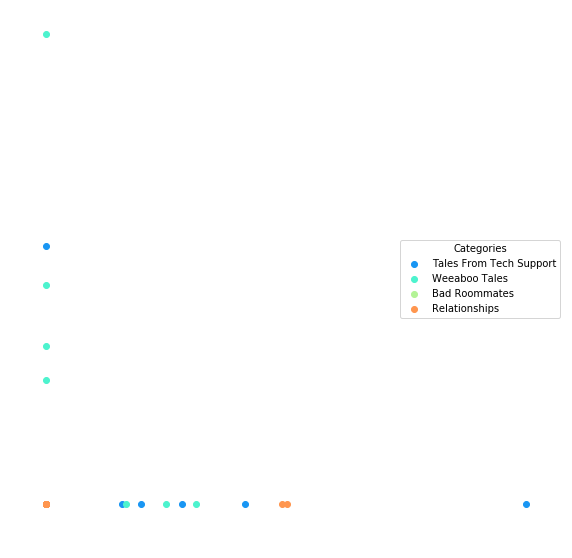

In [119]:
# Reddit, load the data and visualize the data
reddit_dfTrain, reddit_dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadReddit())
lucem_illud_2020.plotter(reddit_dfTrain)

bayes  Evaluation:
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.081505  0.863938   0.910448           0.748342   
Weeaboo Tales              0.172414  0.875991   0.601504           0.593103   
Bad Roommates              0.159875  0.765274   0.739130           0.552206   
Relationships              0.156740  0.721660   0.720000           0.472853   

                           Recall  
Category                           
Tales From Tech Support  0.753086  
Weeaboo Tales            0.975610  
Bad Roommates            0.607143  
Relationships            0.500000  
bayes  Confusion Matrix:


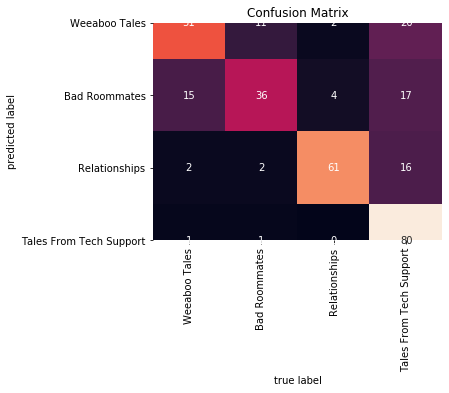

bayes  ROC:


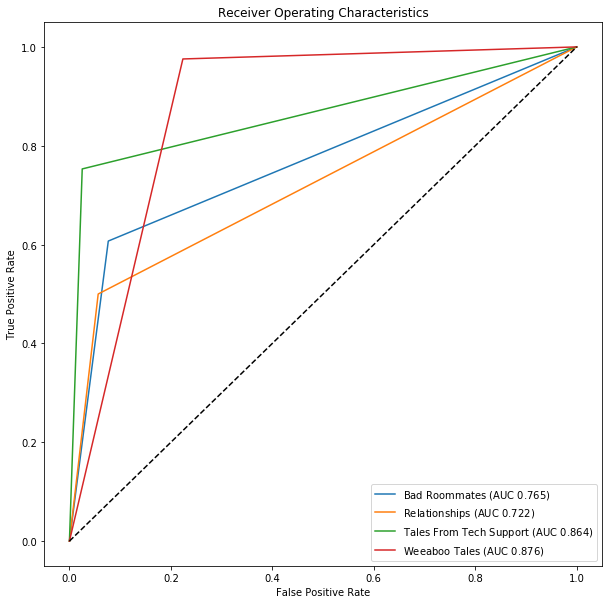

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

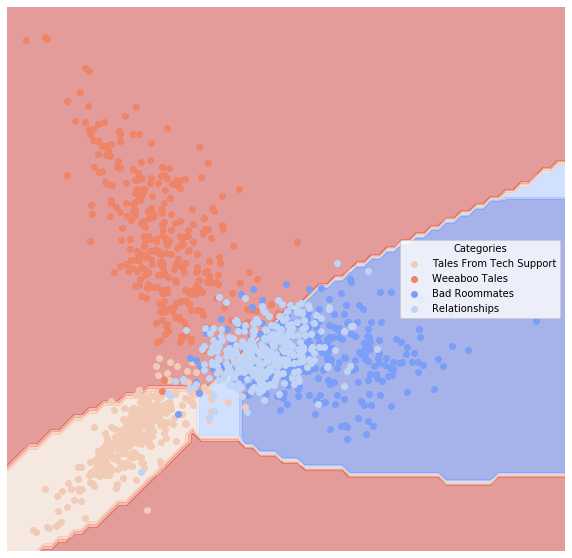

svm_linear  Evaluation:
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.009404  0.993697   0.964286           0.964286   
Weeaboo Tales              0.003135  0.997890   0.987952           0.987952   
Bad Roommates              0.009404  0.985968   0.987952           0.970699   
Relationships              0.009404  0.979167   1.000000           0.967738   

                           Recall  
Category                           
Tales From Tech Support  1.000000  
Weeaboo Tales            1.000000  
Bad Roommates            0.976190  
Relationships            0.958333  
svm_linear  Confusion Matrix:


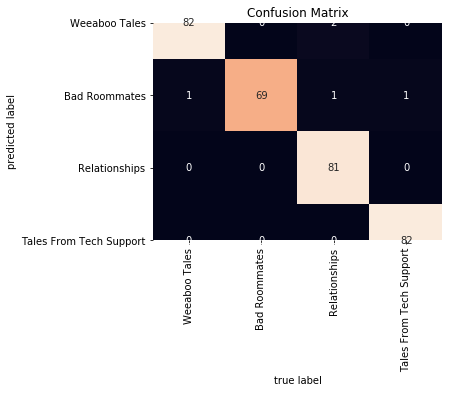

svm_linear  ROC:


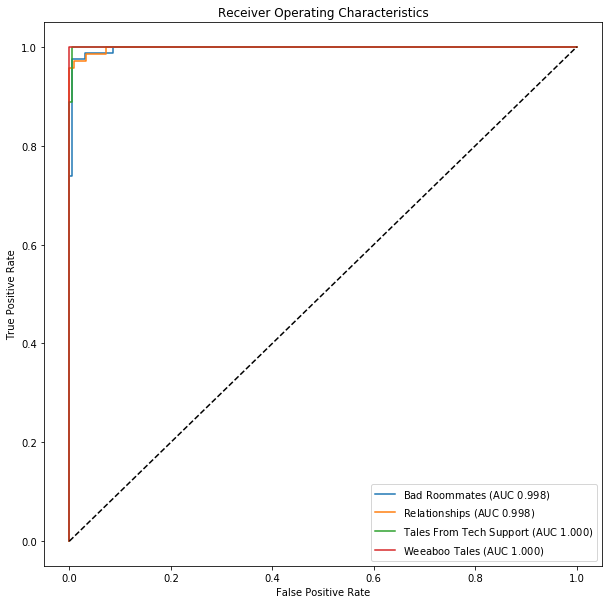

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

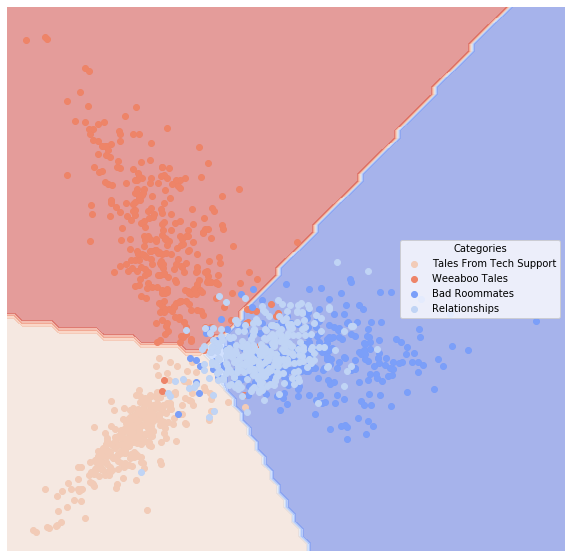

svm_poly  Evaluation:
                         Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                                      
Tales From Tech Support    0.253918  0.5   0.000000           0.253918     0.0
Weeaboo Tales              0.257053  0.5   0.000000           0.257053     0.0
Bad Roommates              0.263323  0.5   0.000000           0.263323     0.0
Relationships              0.774295  0.5   0.225705           0.225705     1.0
svm_poly  Confusion Matrix:


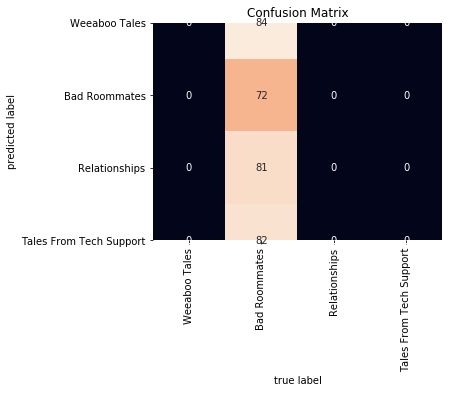

svm_poly  ROC:


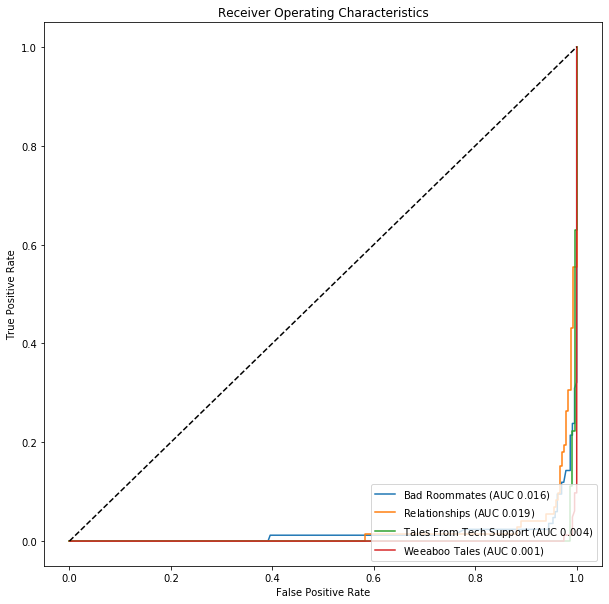

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

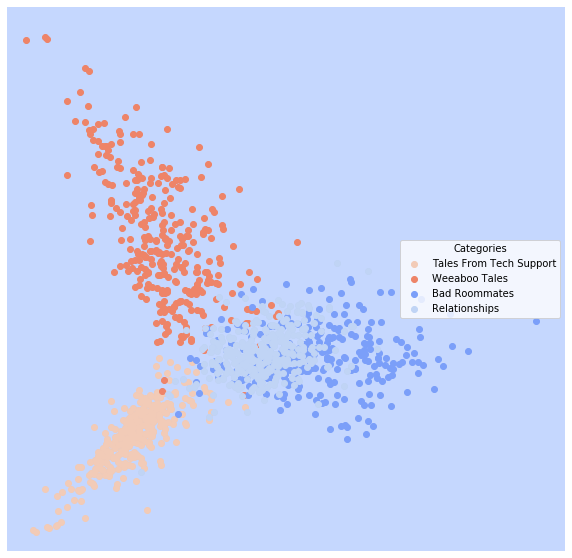

knn  Evaluation:
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.025078  0.966905   0.950617           0.916212   
Weeaboo Tales              0.056426  0.946074   0.847826           0.819008   
Bad Roommates              0.062696  0.907725   0.910256           0.810136   
Relationships              0.068966  0.891504   0.867647           0.751741   

                           Recall  
Category                           
Tales From Tech Support  0.950617  
Weeaboo Tales            0.951220  
Bad Roommates            0.845238  
Relationships            0.819444  
knn  Confusion Matrix:


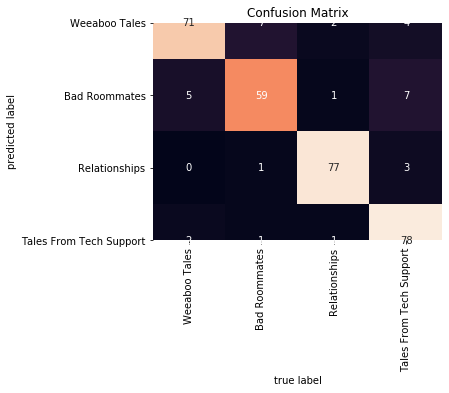

knn  ROC:


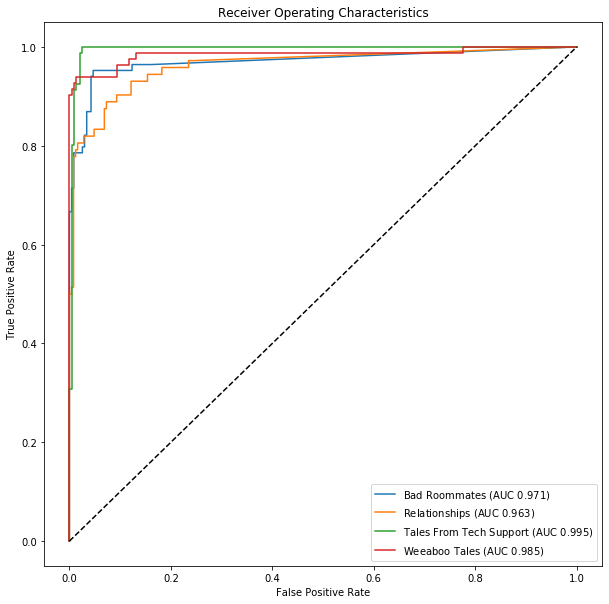

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

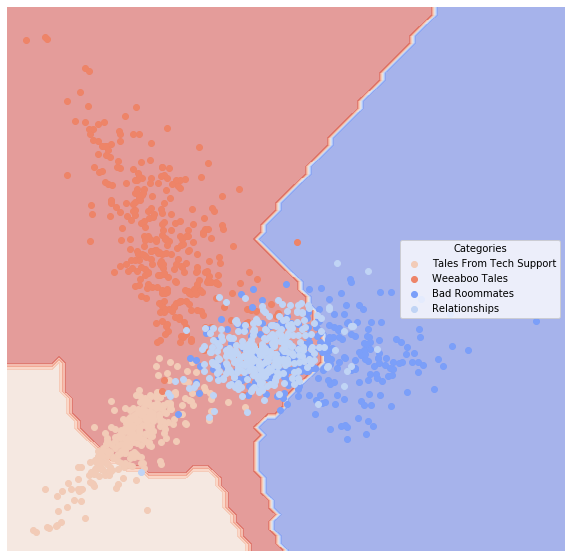

classical_reg  Evaluation:
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.012539  0.991597   0.952941           0.952941   
Weeaboo Tales              0.000000  1.000000   1.000000           1.000000   
Bad Roommates              0.015674  0.977888   0.975904           0.950454   
Relationships              0.015674  0.970198   0.985507           0.943296   

                           Recall  
Category                           
Tales From Tech Support  1.000000  
Weeaboo Tales            1.000000  
Bad Roommates            0.964286  
Relationships            0.944444  
classical_reg  Confusion Matrix:


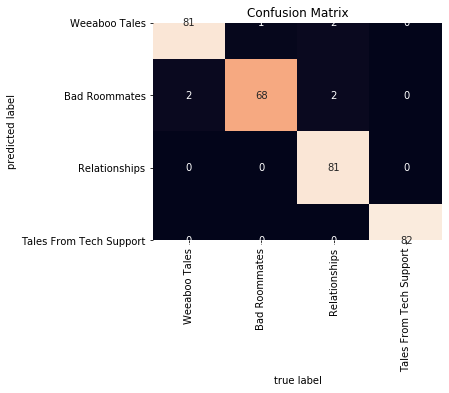

classical_reg  ROC:


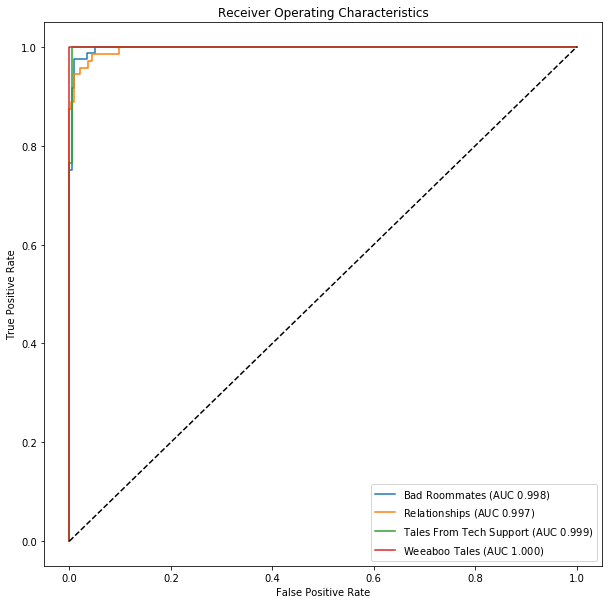

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

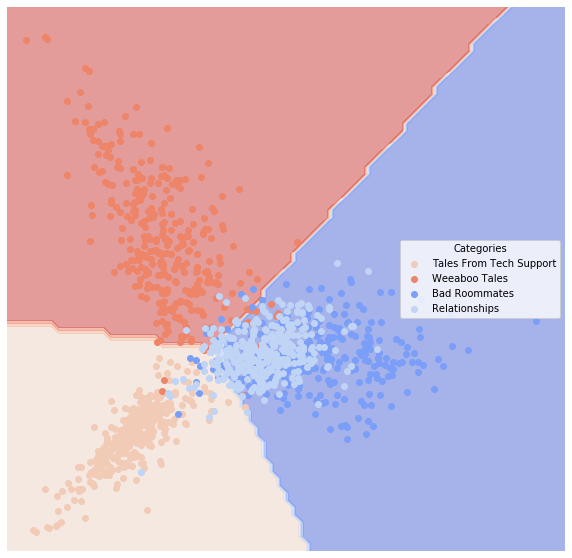

decision_tree  Evaluation:
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.078370  0.886399   0.868421           0.754624   
Weeaboo Tales              0.047022  0.956391   0.868132           0.845775   
Bad Roommates              0.078370  0.877964   0.904110           0.766798   
Relationships              0.053292  0.940986   0.848101           0.804879   

                           Recall  
Category                           
Tales From Tech Support  0.814815  
Weeaboo Tales            0.963415  
Bad Roommates            0.785714  
Relationships            0.930556  
decision_tree  Confusion Matrix:


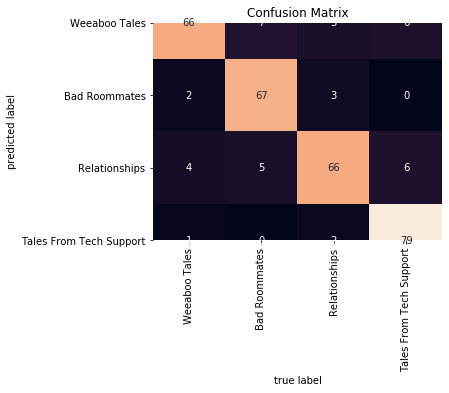

decision_tree  ROC:


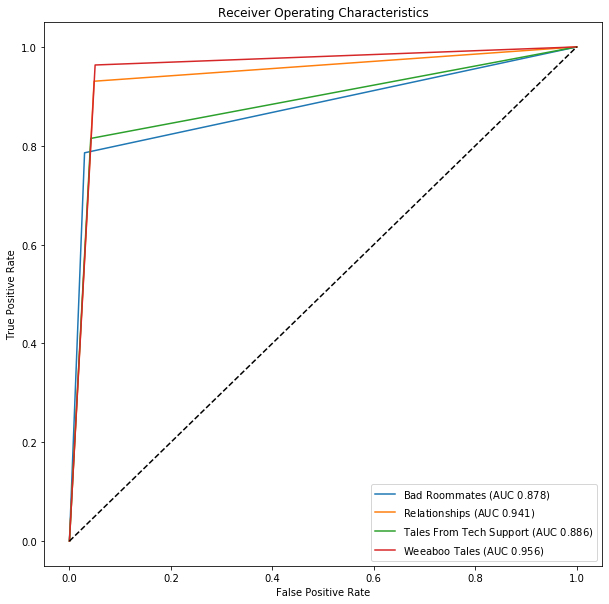

decision_tree  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

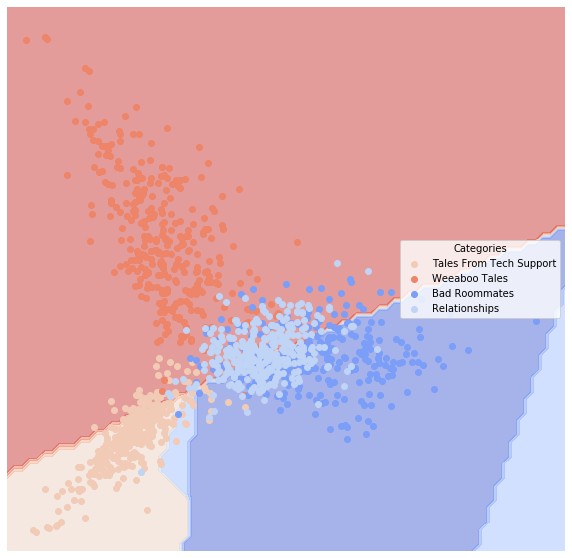

random_forest  Evaluation:
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.031348  0.966776   0.917647           0.893065   
Weeaboo Tales              0.021944  0.965293   0.974684           0.930926   
Bad Roommates              0.062696  0.915375   0.890244           0.808147   
Relationships              0.065831  0.908288   0.849315           0.762703   

                           Recall  
Category                           
Tales From Tech Support  0.962963  
Weeaboo Tales            0.939024  
Bad Roommates            0.869048  
Relationships            0.861111  
random_forest  Confusion Matrix:


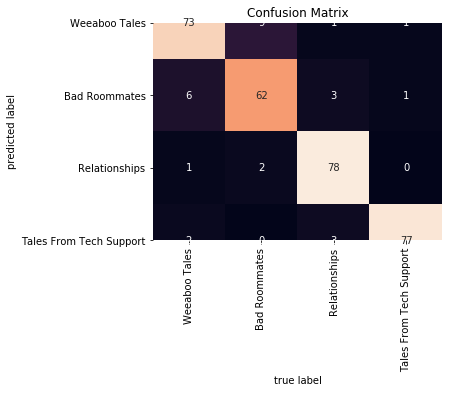

random_forest  ROC:


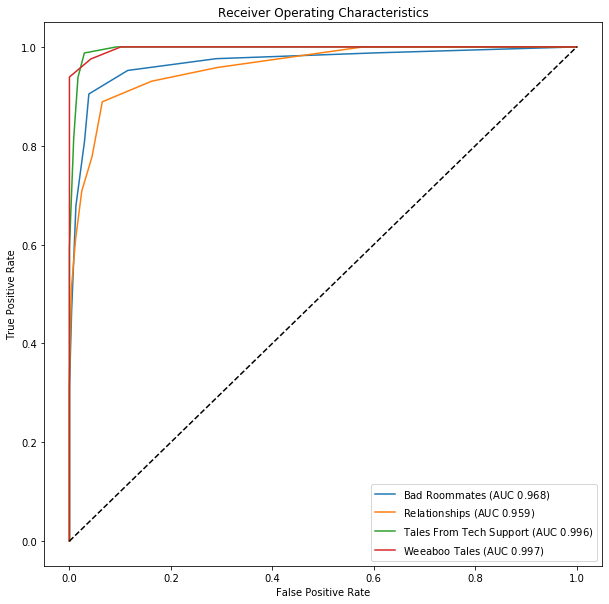

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

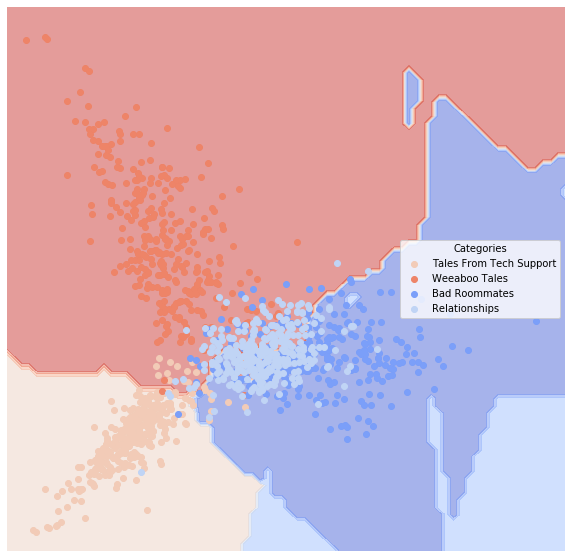

neural_network  Evaluation:
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.012539  0.991597   0.952941           0.952941   
Weeaboo Tales              0.006270  0.995781   0.976190           0.976190   
Bad Roommates              0.021944  0.965983   0.975309           0.932929   
Relationships              0.021944  0.961229   0.971014           0.919257   

                           Recall  
Category                           
Tales From Tech Support  1.000000  
Weeaboo Tales            1.000000  
Bad Roommates            0.940476  
Relationships            0.930556  
neural_network  Confusion Matrix:


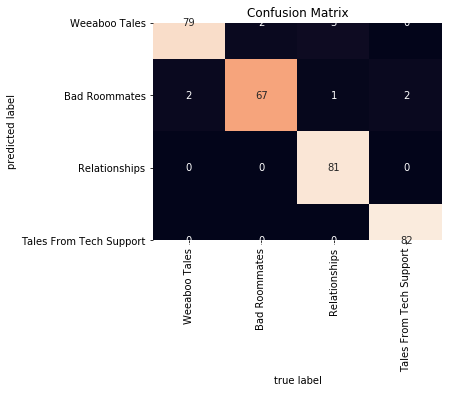

neural_network  ROC:


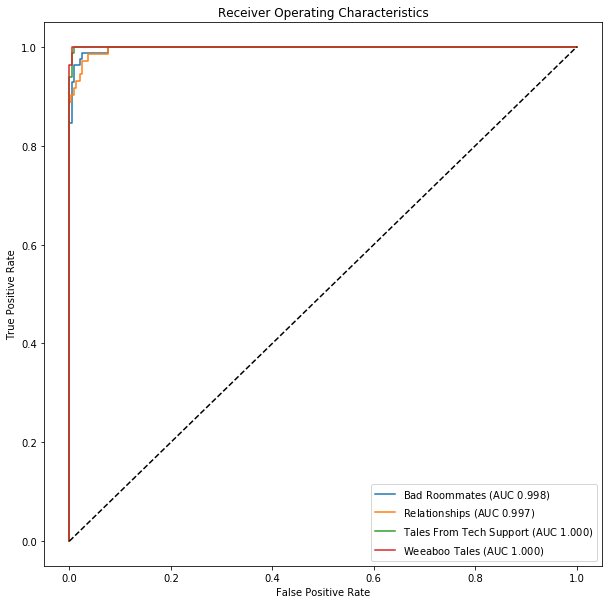

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

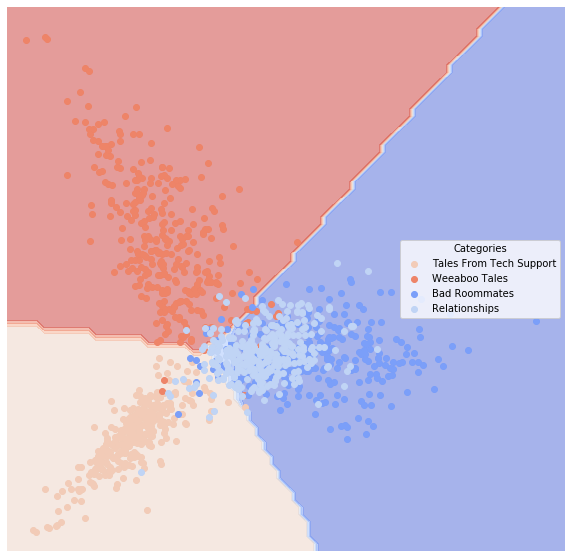

boosting  Evaluation:
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Tales From Tech Support    0.025078  0.975049   0.929412           0.912733   
Weeaboo Tales              0.003135  0.993902   1.000000           0.990940   
Bad Roommates              0.025078  0.956206   0.987179           0.926858   
Relationships              0.028213  0.967021   0.920000           0.891071   

                           Recall  
Category                           
Tales From Tech Support  0.975309  
Weeaboo Tales            0.987805  
Bad Roommates            0.916667  
Relationships            0.958333  
boosting  Confusion Matrix:


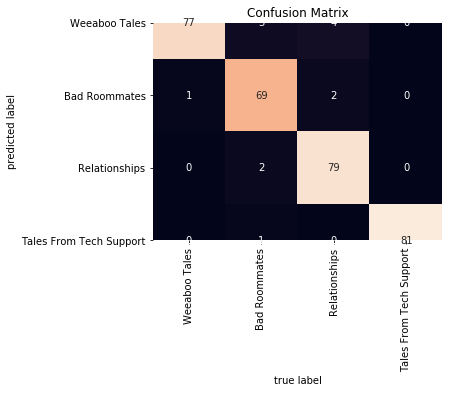

boosting  ROC:


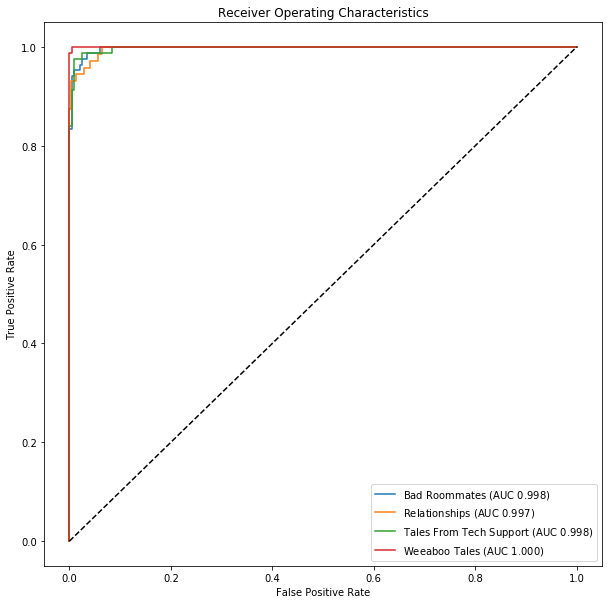

boosting  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

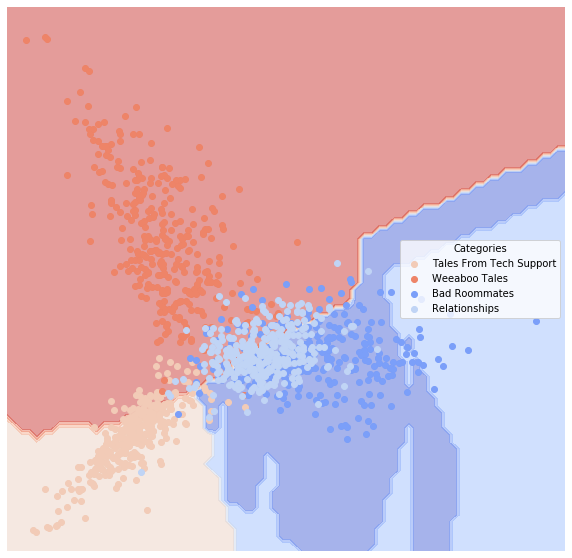

In [120]:
# eval all the models
eval_reddit = all_model(reddit_dfTrain, reddit_dfTest)

## Newsgroups

Loading data for: comp.sys.mac.hardware
Loading data for: comp.windows.x
Loading data for: misc.forsale
Loading data for: rec.autos
Converting to vectors


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

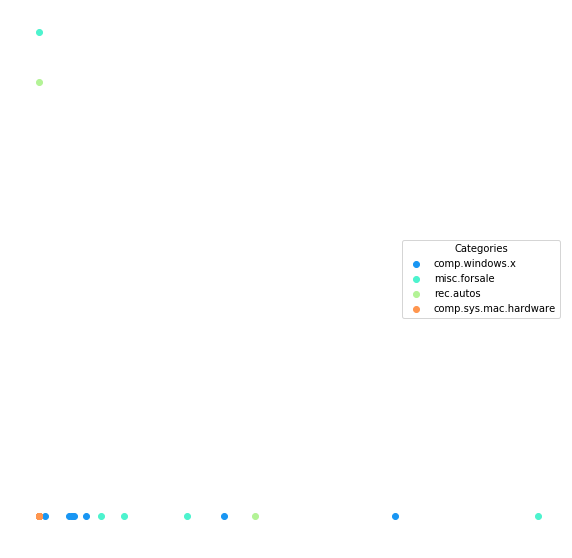

In [121]:
newsgroups_dfTrain, newsgroups_dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadNewsGroups())
lucem_illud_2020.plotter(newsgroups_dfTrain)

bayes  Evaluation:
                       Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                    
comp.windows.x           0.091489  0.881307   0.806723           0.710186   
misc.forsale             0.140426  0.822848   0.742188           0.621055   
rec.autos                0.087234  0.878402   0.807339           0.700385   
comp.sys.mac.hardware    0.161702  0.779372   0.684211           0.537381   

                         Recall  
Category                         
comp.windows.x         0.827586  
misc.forsale           0.742188  
rec.autos              0.814815  
comp.sys.mac.hardware  0.661017  
bayes  Confusion Matrix:


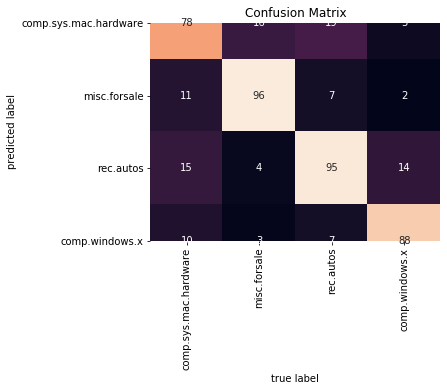

bayes  ROC:


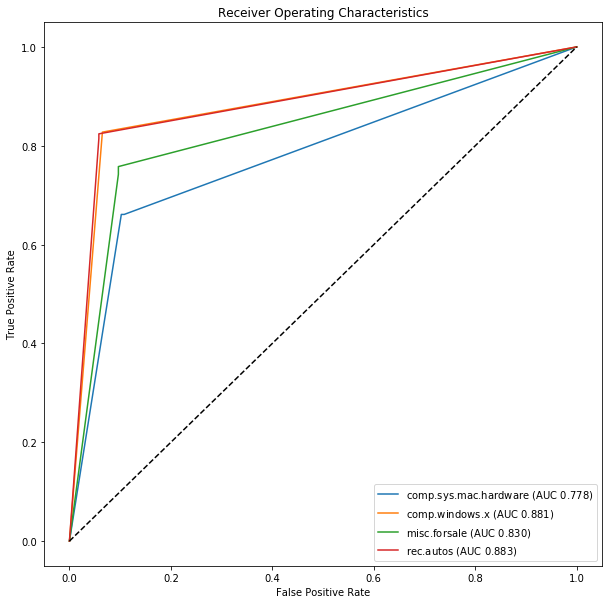

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

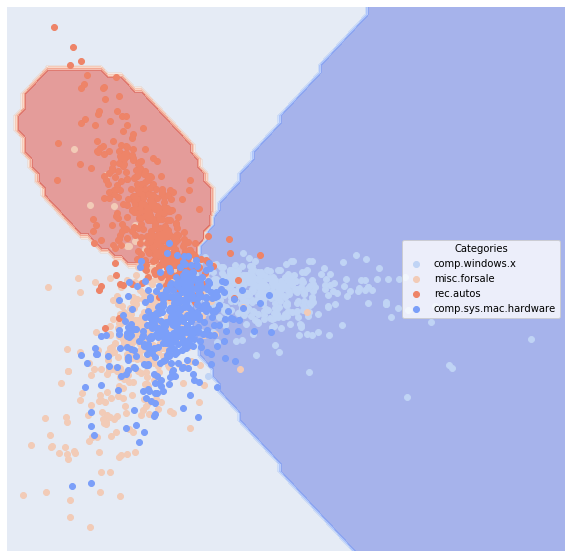

svm_linear  Evaluation:
                       Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                    
comp.windows.x           0.038298  0.936903   0.953704           0.874483   
misc.forsale             0.085106  0.877970   0.879310           0.756020   
rec.autos                0.095745  0.898864   0.744186           0.687031   
comp.sys.mac.hardware    0.070213  0.905239   0.863248           0.775052   

                         Recall  
Category                         
comp.windows.x         0.887931  
misc.forsale           0.796875  
rec.autos              0.888889  
comp.sys.mac.hardware  0.855932  
svm_linear  Confusion Matrix:


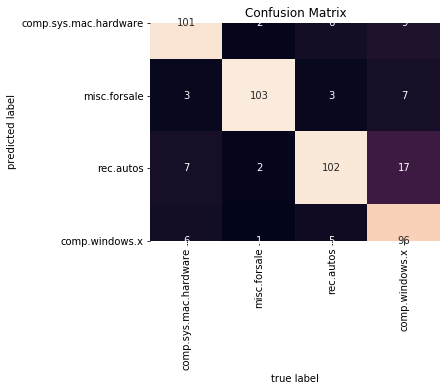

svm_linear  ROC:


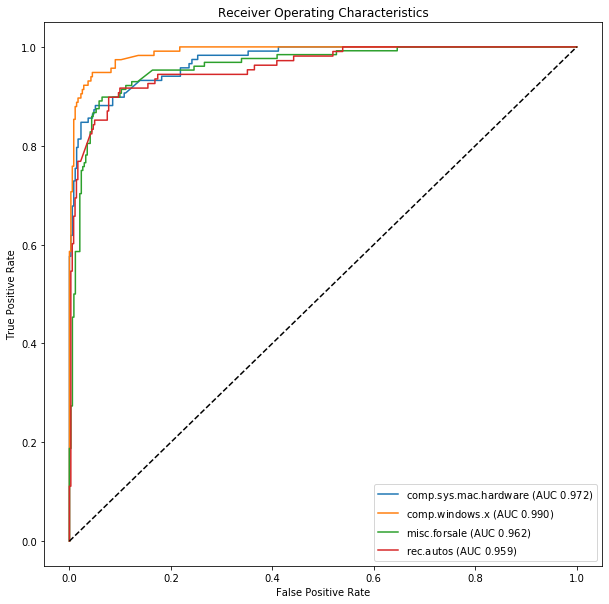

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

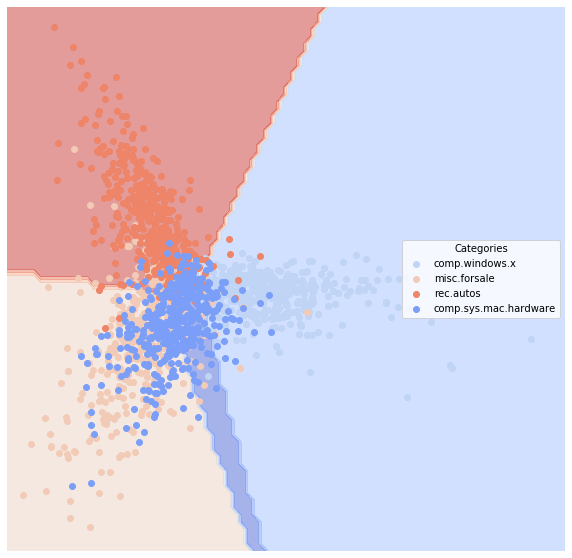

svm_poly  Evaluation:
                       Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                                    
comp.windows.x           0.246809  0.5   0.000000           0.246809     0.0
misc.forsale             0.272340  0.5   0.000000           0.272340     0.0
rec.autos                0.770213  0.5   0.229787           0.229787     1.0
comp.sys.mac.hardware    0.251064  0.5   0.000000           0.251064     0.0
svm_poly  Confusion Matrix:


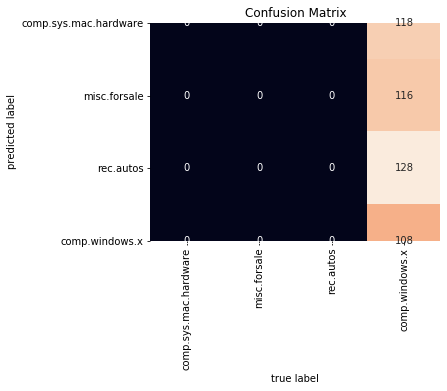

svm_poly  ROC:


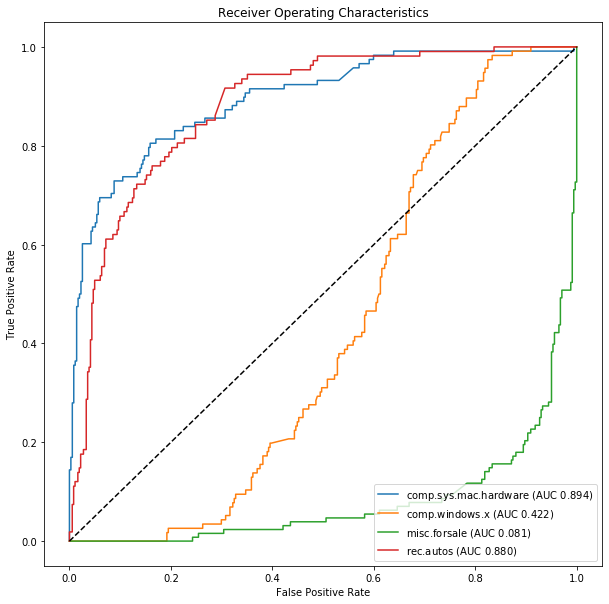

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

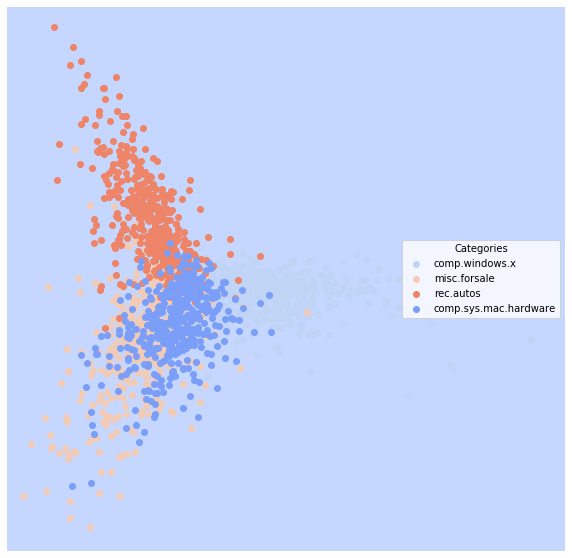

knn  Evaluation:
                       Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                    
comp.windows.x           0.221277  0.551724   1.000000           0.324725   
misc.forsale             0.251064  0.539062   1.000000           0.329189   
rec.autos                0.582979  0.524095   0.242236           0.238778   
comp.sys.mac.hardware    0.391489  0.490755   0.238095           0.247767   

                         Recall  
Category                         
comp.windows.x         0.103448  
misc.forsale           0.078125  
rec.autos              0.722222  
comp.sys.mac.hardware  0.254237  
knn  Confusion Matrix:


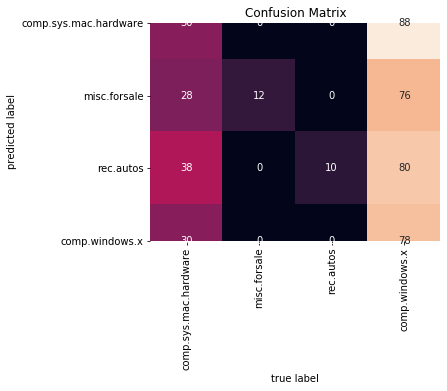

knn  ROC:


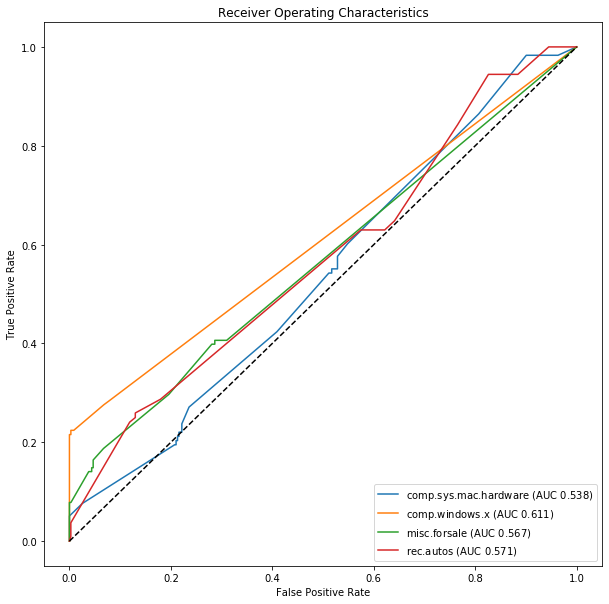

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

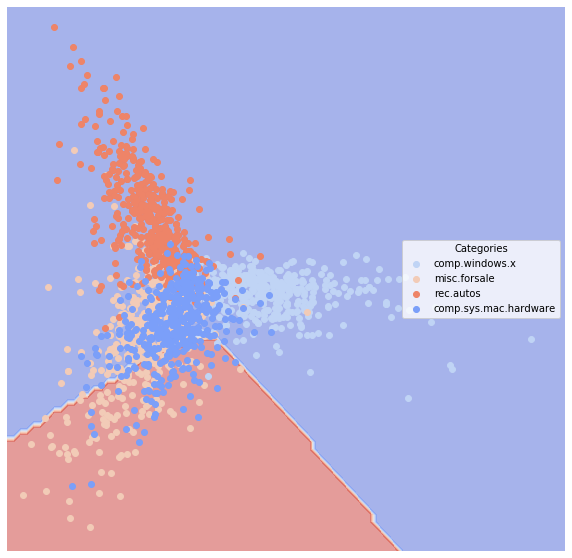

classical_reg  Evaluation:
                       Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                    
comp.windows.x           0.044681  0.929768   0.935780           0.852628   
misc.forsale             0.078723  0.882356   0.902655           0.774622   
rec.autos                0.093617  0.906742   0.742424           0.694958   
comp.sys.mac.hardware    0.063830  0.912317   0.879310           0.794124   

                         Recall  
Category                         
comp.windows.x         0.879310  
misc.forsale           0.796875  
rec.autos              0.907407  
comp.sys.mac.hardware  0.864407  
classical_reg  Confusion Matrix:


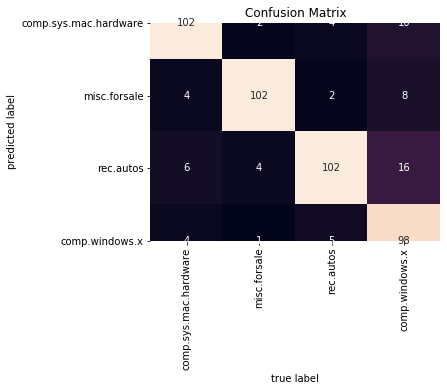

classical_reg  ROC:


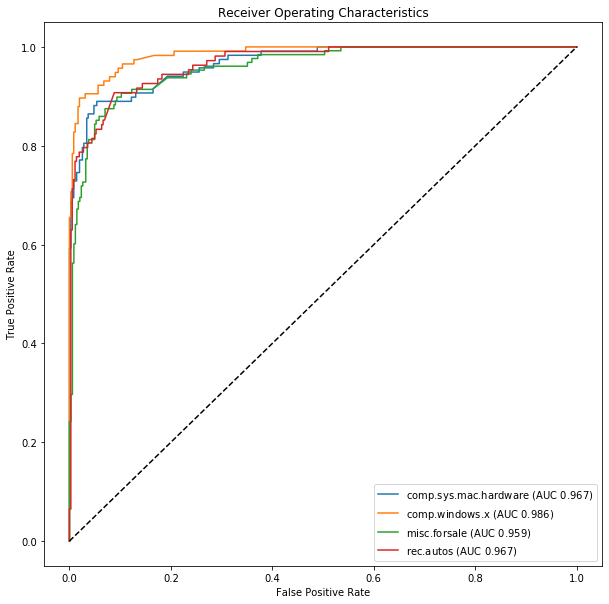

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

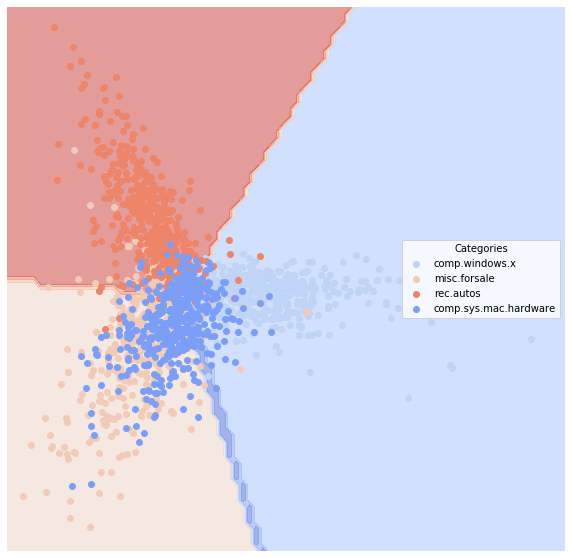

decision_tree  Evaluation:
                       Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                    
comp.windows.x           0.102128  0.848164   0.820755           0.677268   
misc.forsale             0.170213  0.777938   0.696721           0.554156   
rec.autos                0.146809  0.826734   0.651163           0.557524   
comp.sys.mac.hardware    0.138298  0.809081   0.734513           0.591117   

                         Recall  
Category                         
comp.windows.x         0.750000  
misc.forsale           0.664062  
rec.autos              0.777778  
comp.sys.mac.hardware  0.703390  
decision_tree  Confusion Matrix:


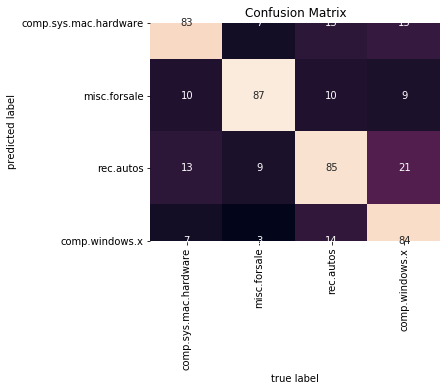

decision_tree  ROC:


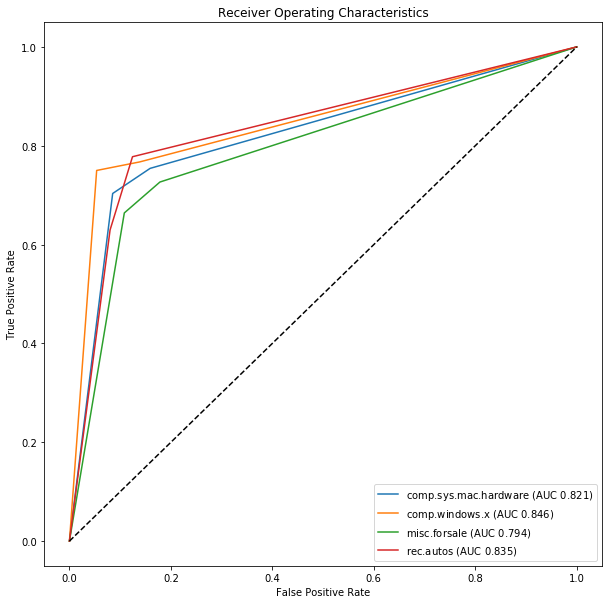

decision_tree  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

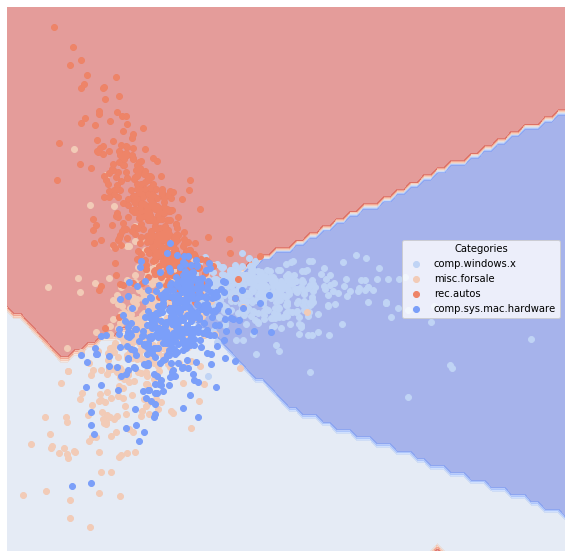

random_forest  Evaluation:
                       Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                    
comp.windows.x           0.089362  0.885618   0.808333           0.716359   
misc.forsale             0.108511  0.847222   0.834783           0.694172   
rec.autos                0.108511  0.867838   0.735537           0.646563   
comp.sys.mac.hardware    0.119149  0.835950   0.771930           0.639506   

                         Recall  
Category                         
comp.windows.x         0.836207  
misc.forsale           0.750000  
rec.autos              0.824074  
comp.sys.mac.hardware  0.745763  
random_forest  Confusion Matrix:


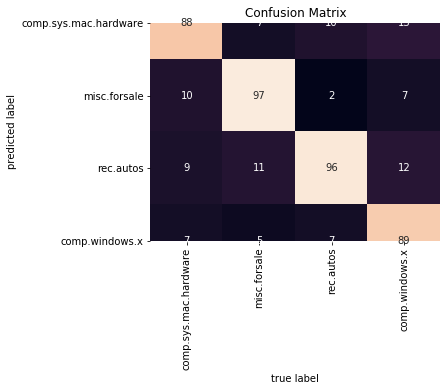

random_forest  ROC:


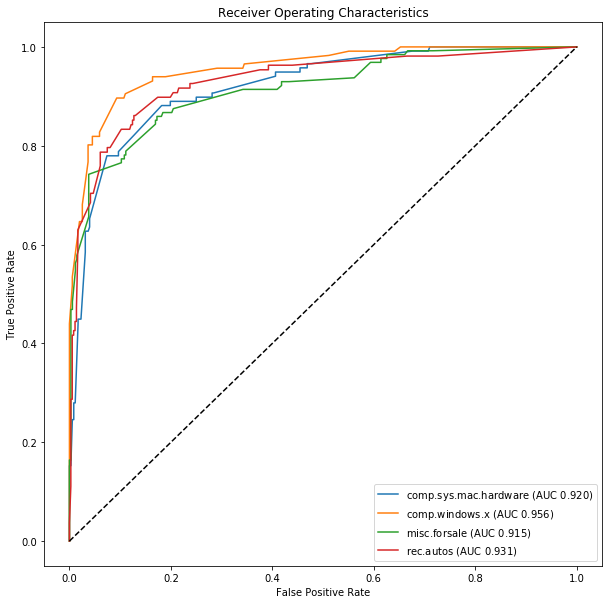

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

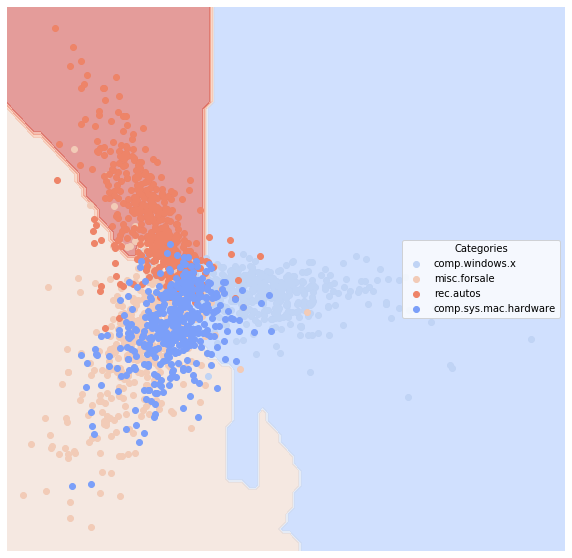

neural_network  Evaluation:
                       Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                    
comp.windows.x           0.038298  0.939801   0.945455           0.873181   
misc.forsale             0.078723  0.894577   0.869919           0.771879   
rec.autos                0.082979  0.907152   0.780488           0.719299   
comp.sys.mac.hardware    0.068085  0.903842   0.877193           0.781682   

                         Recall  
Category                         
comp.windows.x         0.896552  
misc.forsale           0.835938  
rec.autos              0.888889  
comp.sys.mac.hardware  0.847458  
neural_network  Confusion Matrix:


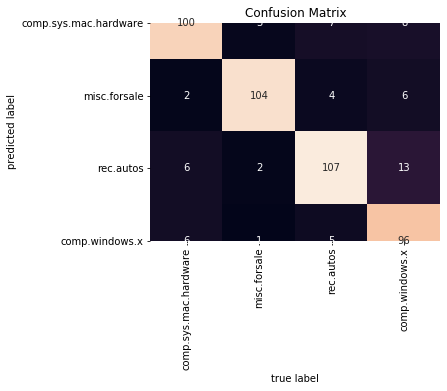

neural_network  ROC:


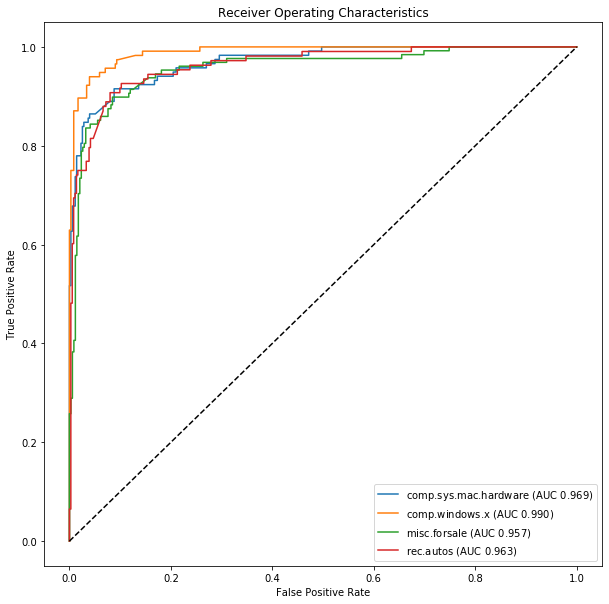

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

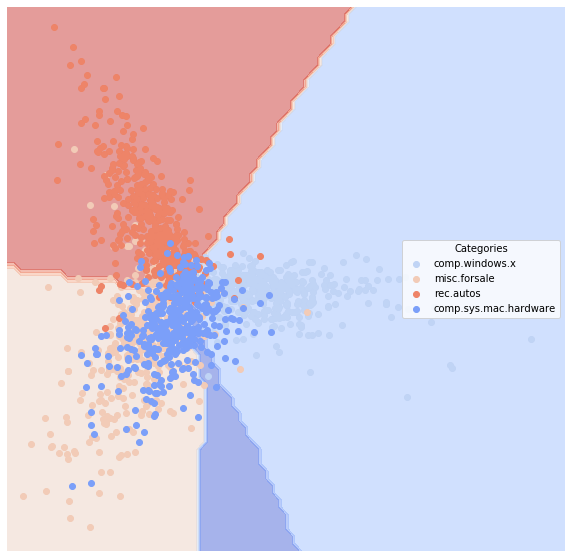

boosting  Evaluation:
                       Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                    
comp.windows.x           0.080851  0.882574   0.854545           0.739285   
misc.forsale             0.104255  0.847702   0.855856           0.705418   
rec.autos                0.102128  0.897969   0.723881           0.673556   
comp.sys.mac.hardware    0.095745  0.868476   0.817391           0.702206   

                         Recall  
Category                         
comp.windows.x         0.810345  
misc.forsale           0.742188  
rec.autos              0.898148  
comp.sys.mac.hardware  0.796610  
boosting  Confusion Matrix:


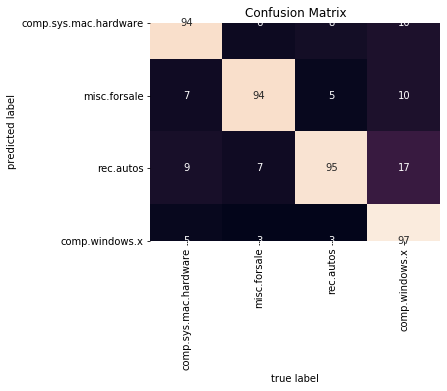

boosting  ROC:


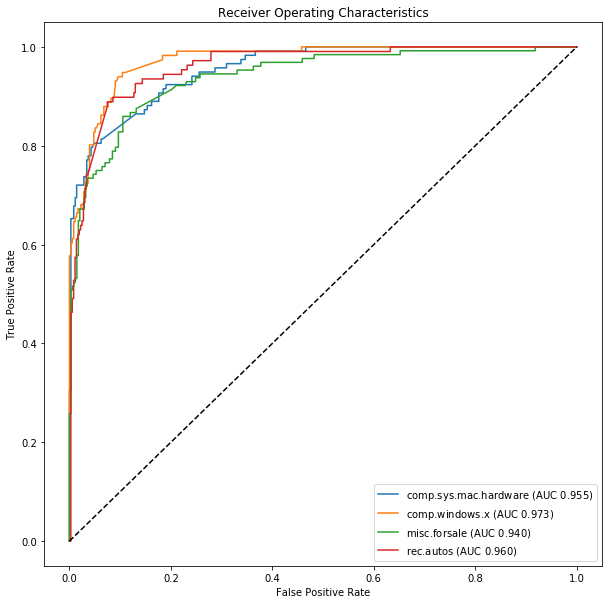

boosting  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

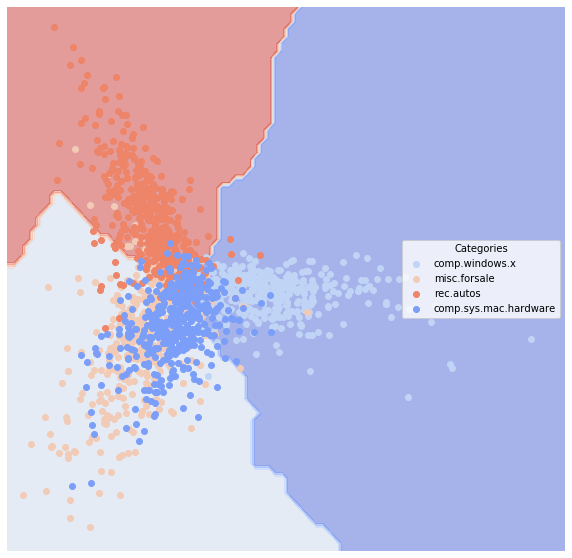

In [122]:
# evaluate all models
eval_newsgroups =  all_model(newsgroups_dfTrain, newsgroups_dfTest)

## Senate Small

Loading senate data
Converting to vectors


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


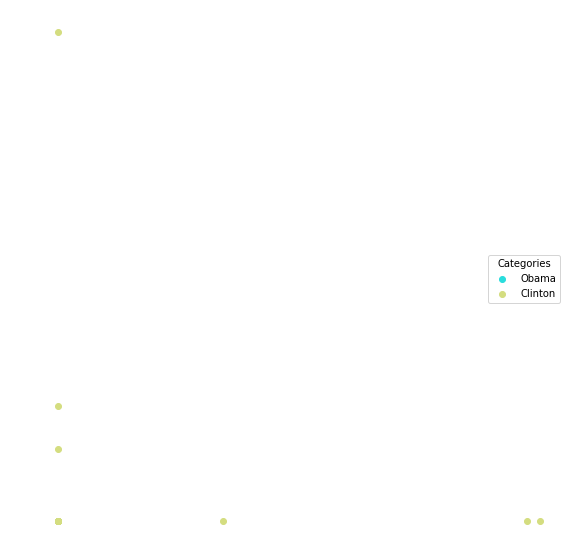

In [123]:
senate_small_dfTrain, senate__small_dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadSenateSmall())
lucem_illud_2020.plotter(senate_small_dfTrain)

bayes  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.167155  0.829032   0.835616           0.754485  0.787097
Clinton     0.167155  0.829032   0.830769           0.793954  0.870968
bayes  Confusion Matrix:


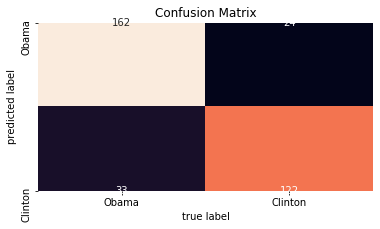

bayes  ROC:


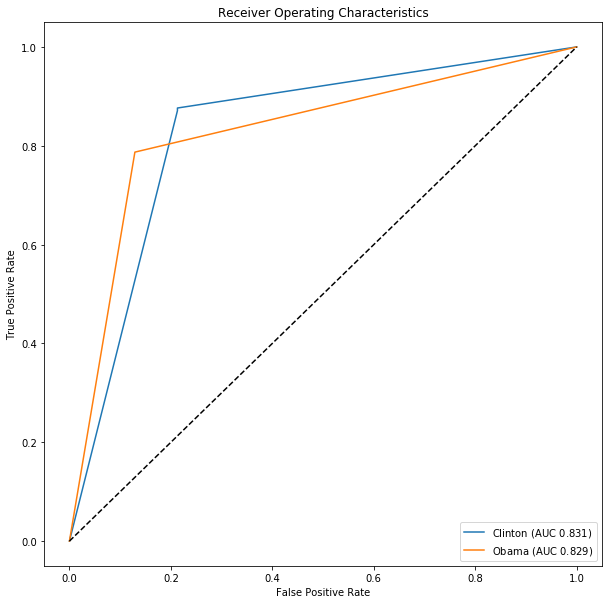

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


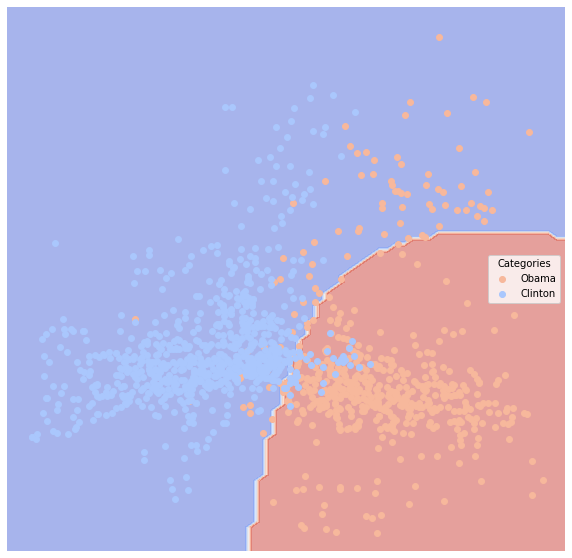

svm_linear  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama        0.01173  0.987097   1.000000           0.985924  0.974194
Clinton      0.01173  0.987097   0.978947           0.978947  1.000000
svm_linear  Confusion Matrix:


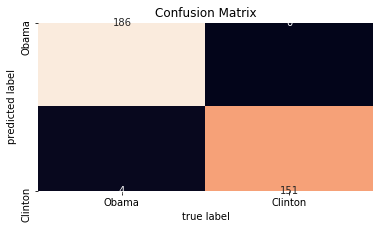

svm_linear  ROC:


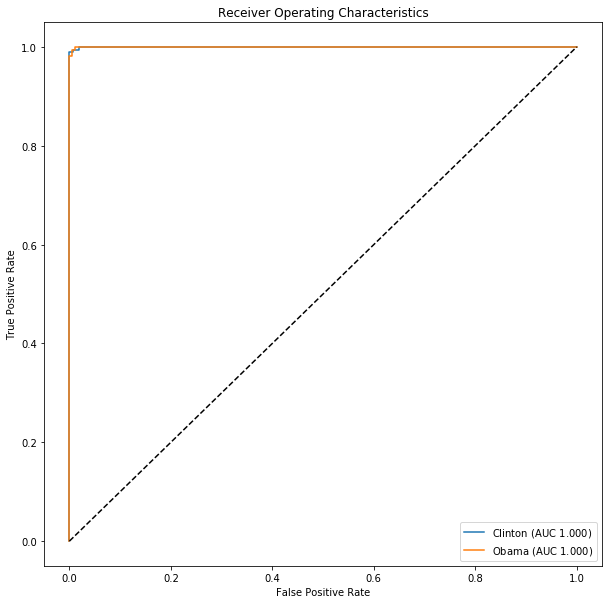

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


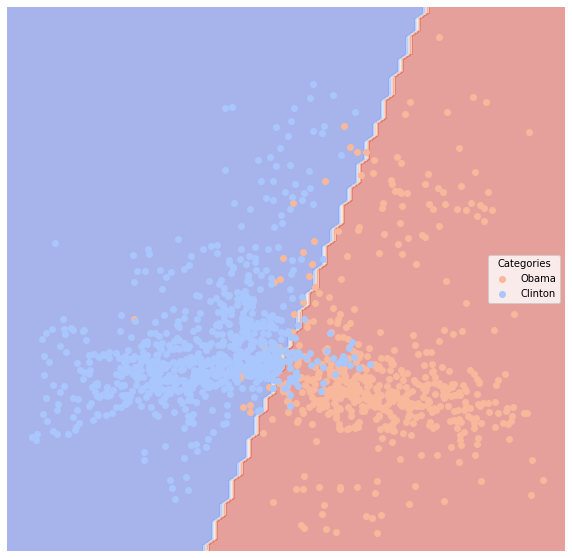

svm_poly  Evaluation:
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
Obama       0.454545  0.5   0.000000           0.454545     0.0
Clinton     0.454545  0.5   0.545455           0.545455     1.0
svm_poly  Confusion Matrix:


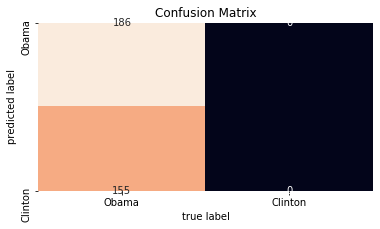

svm_poly  ROC:


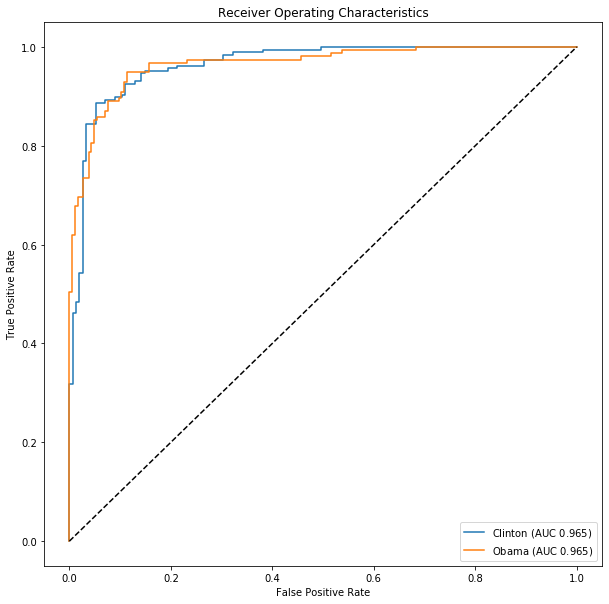

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


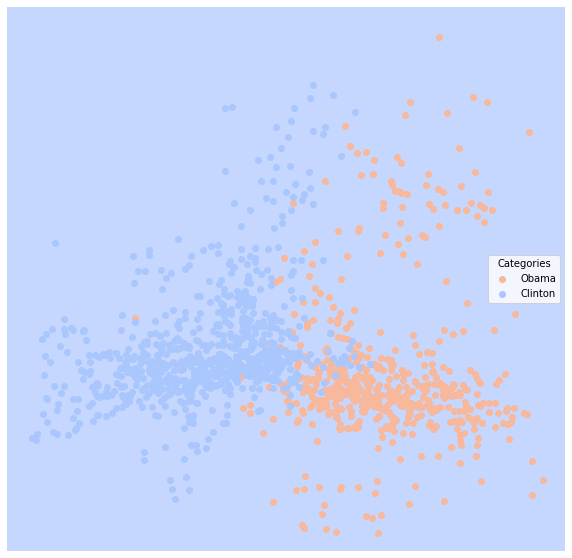

knn  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.129032  0.871505   0.844720           0.796893  0.877419
Clinton     0.129032  0.871505   0.894444           0.847537  0.865591
knn  Confusion Matrix:


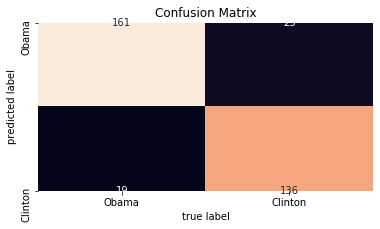

knn  ROC:


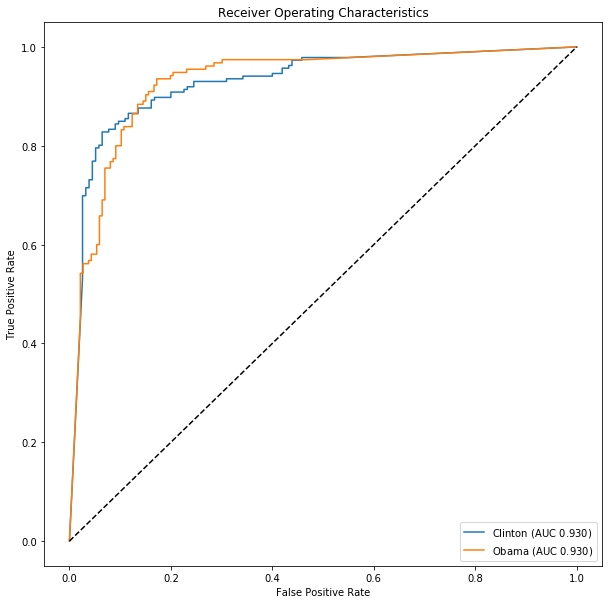

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


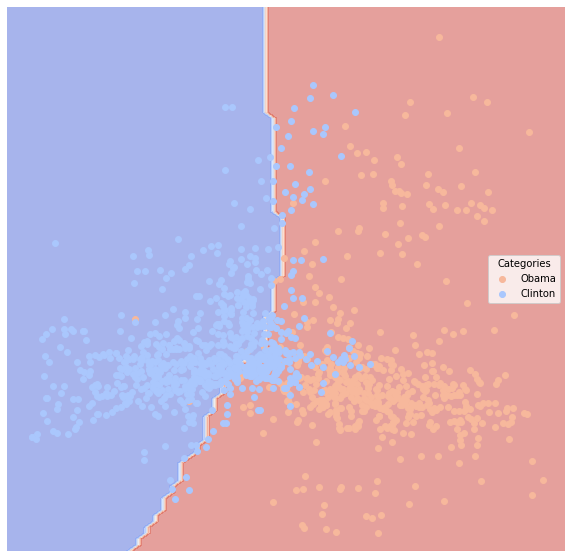

classical_reg  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.032258  0.964516   1.000000           0.961290  0.929032
Clinton     0.032258  0.964516   0.944162           0.944162  1.000000
classical_reg  Confusion Matrix:


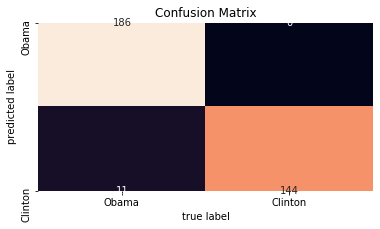

classical_reg  ROC:


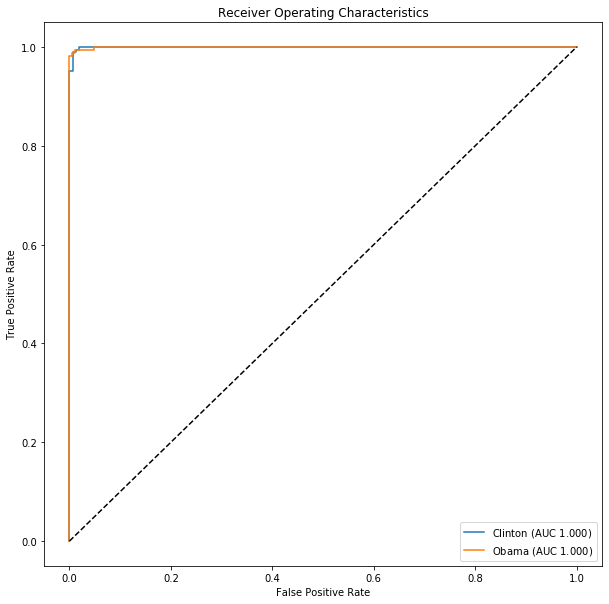

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


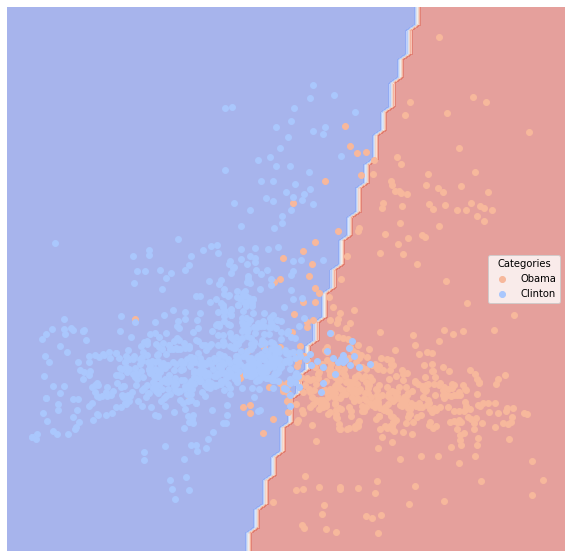

decision_tree  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.002933  0.997312    0.99359           0.993590  1.000000
Clinton     0.002933  0.997312    1.00000           0.997556  0.994624
decision_tree  Confusion Matrix:


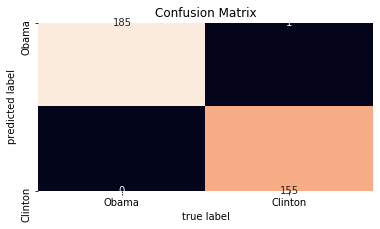

decision_tree  ROC:


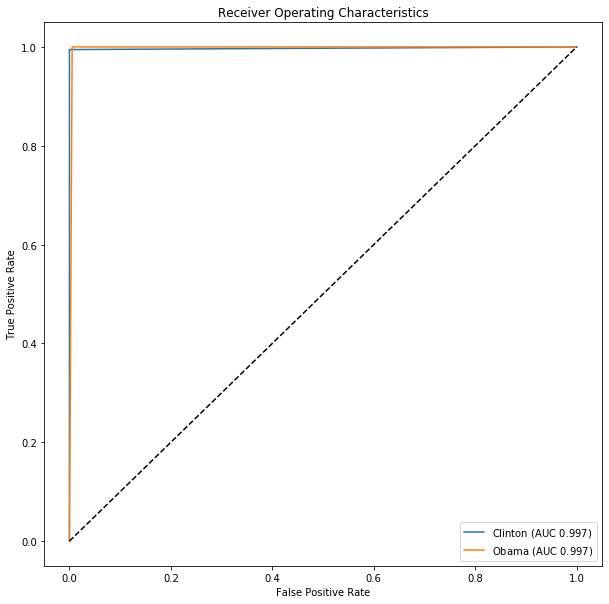

decision_tree  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


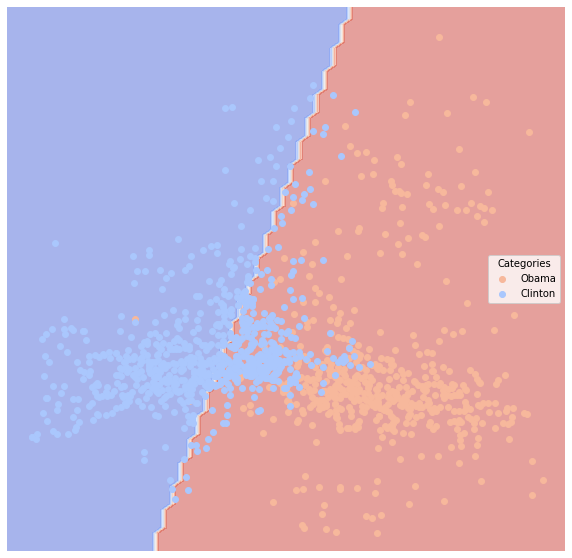

random_forest  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.005865  0.993548   1.000000           0.992962  0.987097
Clinton     0.005865  0.993548   0.989362           0.989362  1.000000
random_forest  Confusion Matrix:


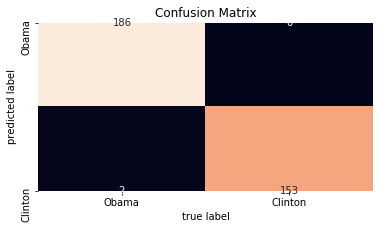

random_forest  ROC:


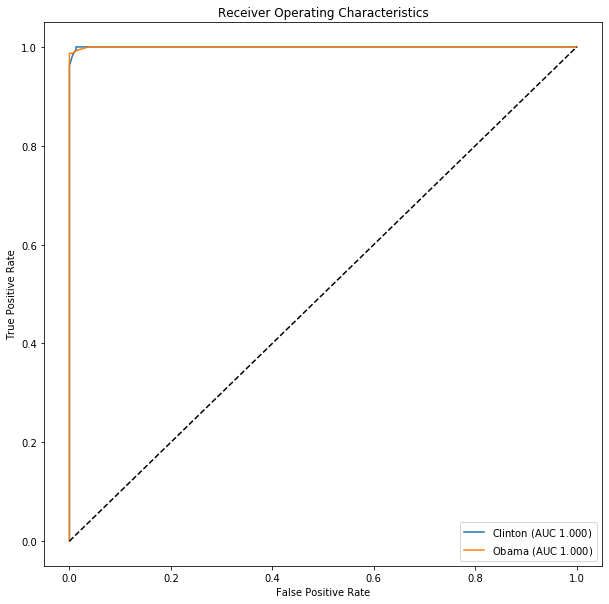

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


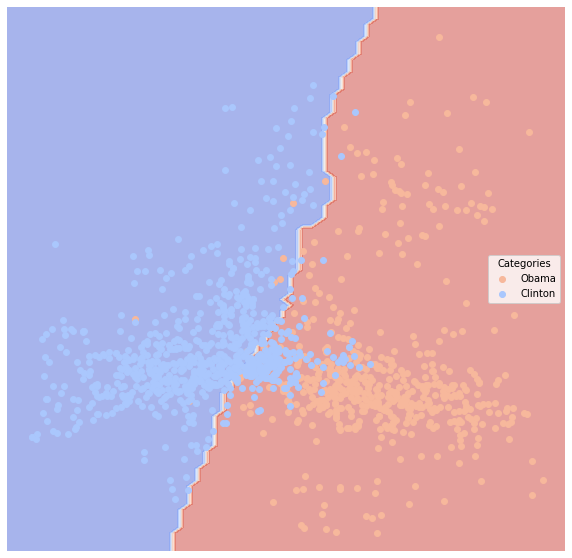

neural_network  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.052786  0.946774   0.941935           0.913635  0.941935
Clinton     0.052786  0.946774   0.951613           0.931960  0.951613
neural_network  Confusion Matrix:


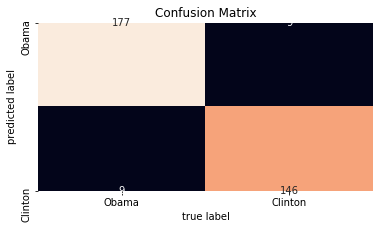

neural_network  ROC:


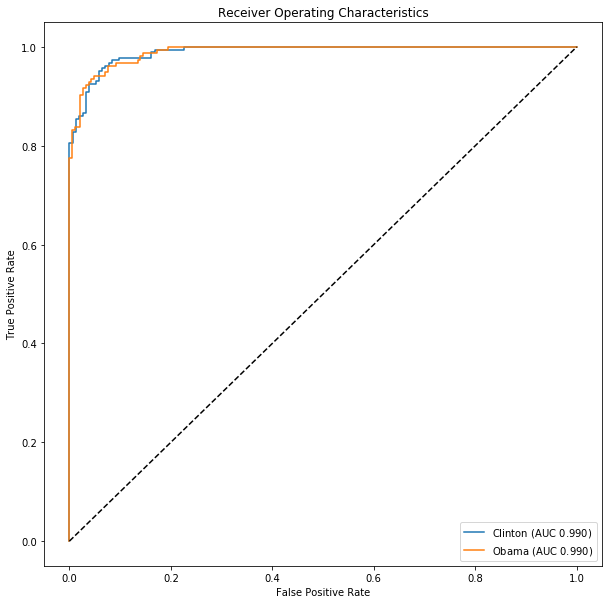

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


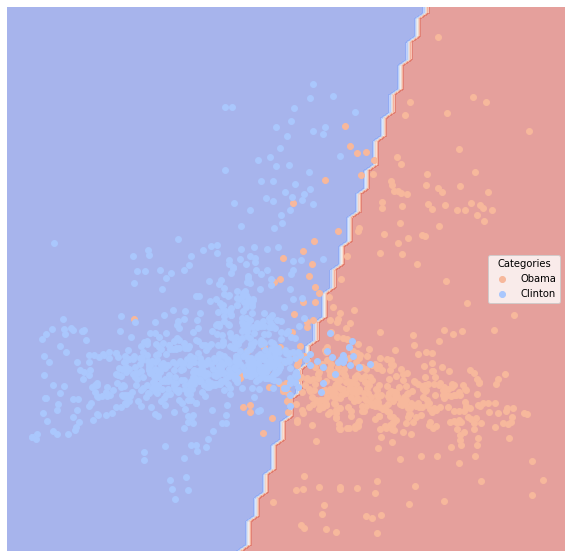

boosting  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Obama       0.002933  0.997312    0.99359           0.993590  1.000000
Clinton     0.002933  0.997312    1.00000           0.997556  0.994624
boosting  Confusion Matrix:


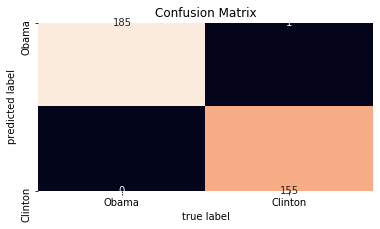

boosting  ROC:


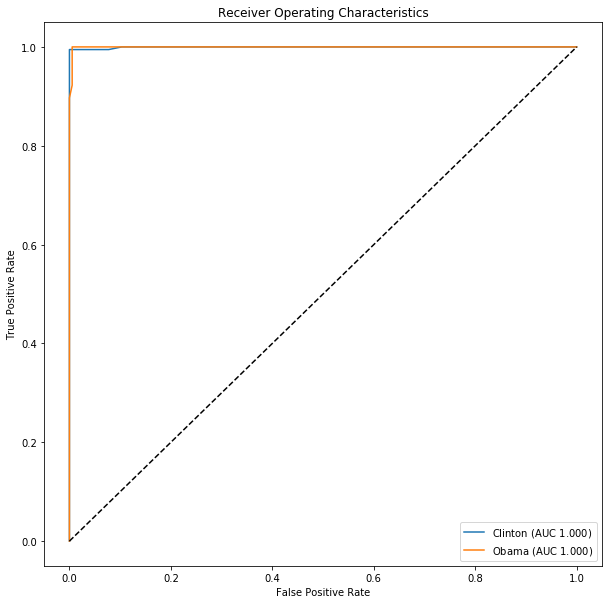

boosting  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


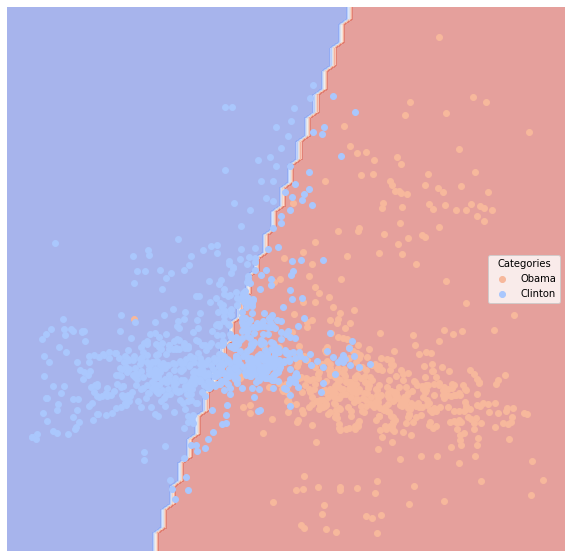

In [124]:
eval_senate_small= all_model(senate_small_dfTrain, senate__small_dfTest)

## Senate Large

Loading senator: Klobuchar
Loading senator: Kyl
Loading senator: Kerry
Loading senator: Kohl
Loading senator: Kennedy
Converting to vectors


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

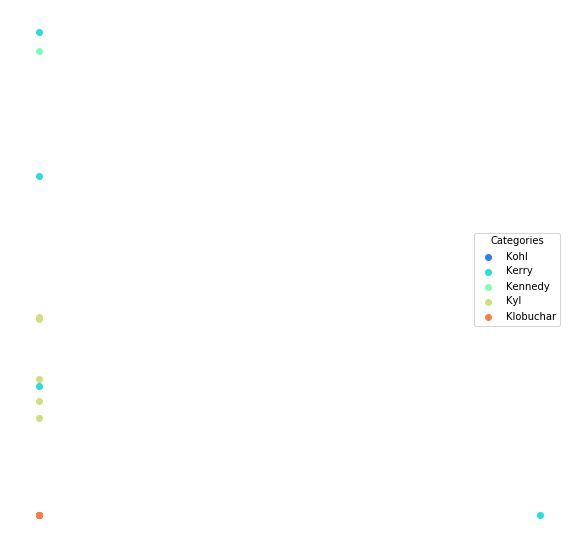

In [125]:
senate_large_dfTrain, senate_large_dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadSenateLarge())
lucem_illud_2020.plotter(senate_large_dfTrain)

bayes  Evaluation:
           Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                               
Kohl         0.053846  0.704478   0.933333           0.435596  0.411765
Kerry        0.182051  0.721389   0.684211           0.479896  0.525253
Kennedy      0.271795  0.750426   0.627767           0.612383  0.920354
Kyl          0.078205  0.738533   0.896552           0.506220  0.485981
Klobuchar    0.055128  0.743680   0.790698           0.438939  0.500000
bayes  Confusion Matrix:


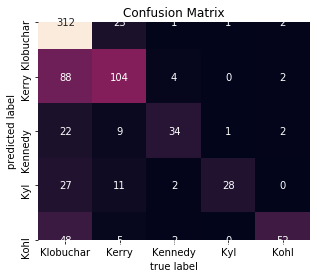

bayes  ROC:


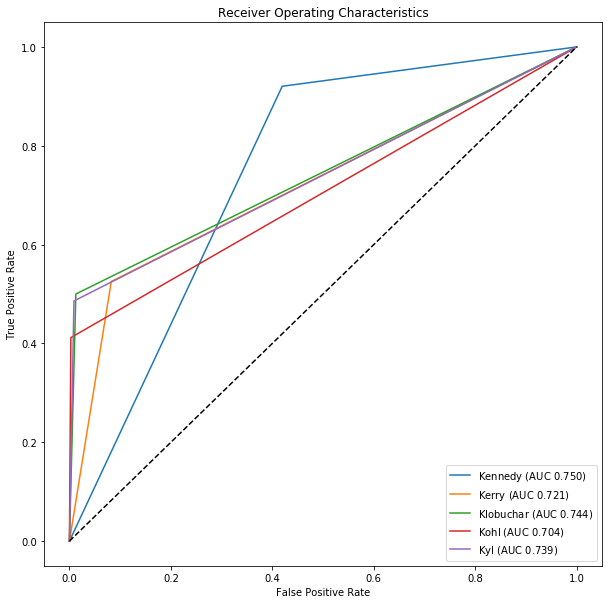

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

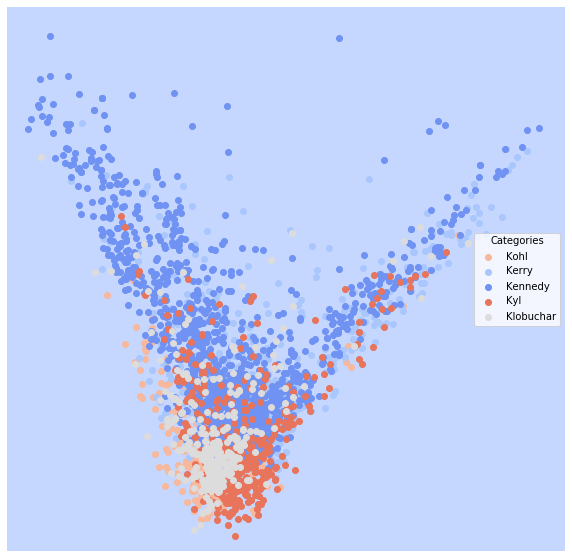

svm_linear  Evaluation:
           Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                               
Kohl         0.005128  0.977239   0.984848           0.945245  0.955882
Kerry        0.024359  0.963683   0.963731           0.920707  0.939394
Kennedy      0.026923  0.974485   0.954286           0.946621  0.985251
Kyl          0.002564  0.990654   1.000000           0.983873  0.981308
Klobuchar    0.005128  0.977239   0.984848           0.945245  0.955882
svm_linear  Confusion Matrix:


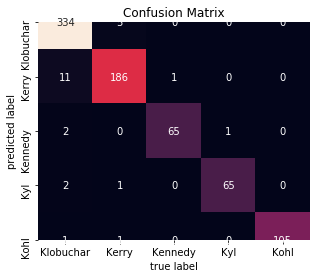

svm_linear  ROC:


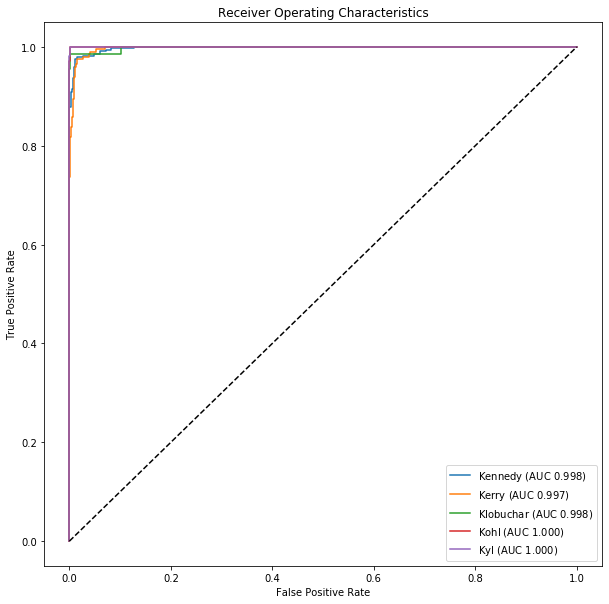

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

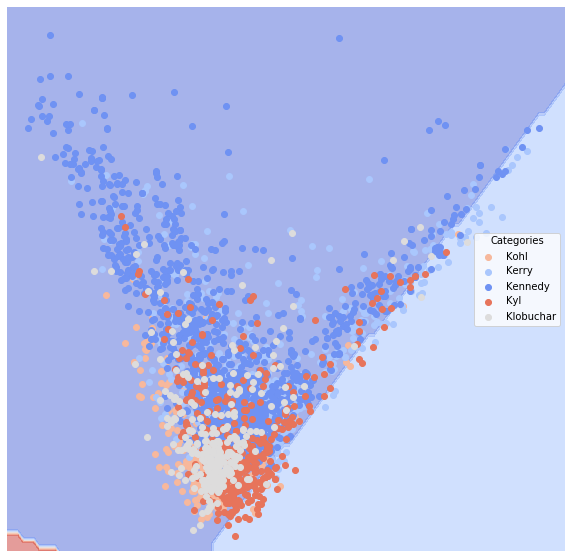

svm_poly  Evaluation:
           Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                        
Kohl         0.087179  0.5   0.000000           0.087179     0.0
Kerry        0.253846  0.5   0.000000           0.253846     0.0
Kennedy      0.565385  0.5   0.434615           0.434615     1.0
Kyl          0.137179  0.5   0.000000           0.137179     0.0
Klobuchar    0.087179  0.5   0.000000           0.087179     0.0
svm_poly  Confusion Matrix:


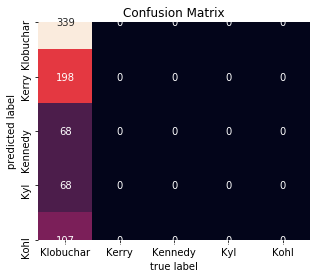

svm_poly  ROC:


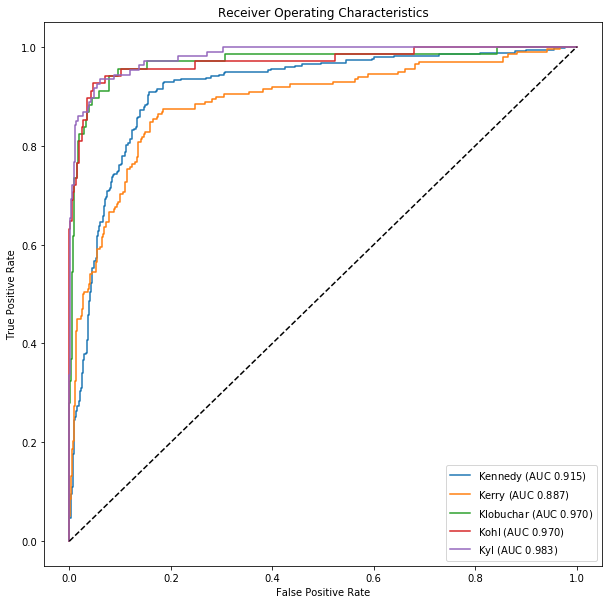

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

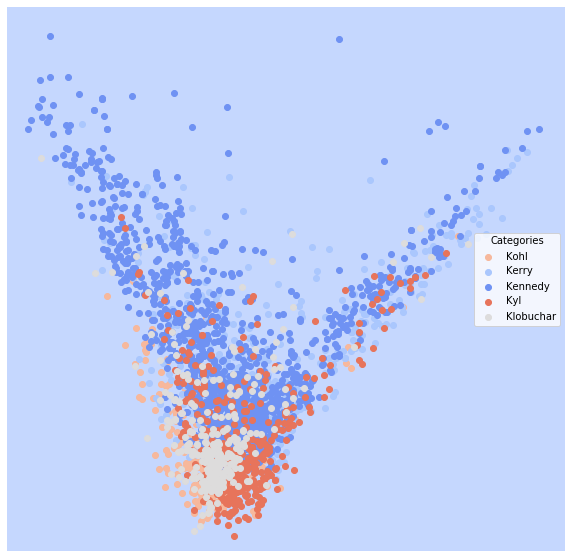

knn  Evaluation:
           Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                               
Kohl         0.041026  0.811261   0.860000           0.575875  0.632353
Kerry        0.161538  0.736801   0.760870           0.522722  0.530303
Kennedy      0.208974  0.807005   0.693833           0.675481  0.929204
Kyl          0.058974  0.816486   0.896104           0.626579  0.644860
Klobuchar    0.039744  0.851867   0.803279           0.603192  0.720588
knn  Confusion Matrix:


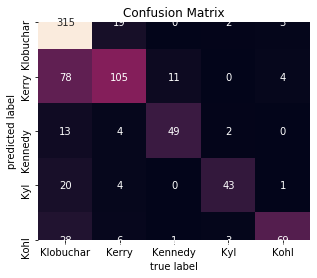

knn  ROC:


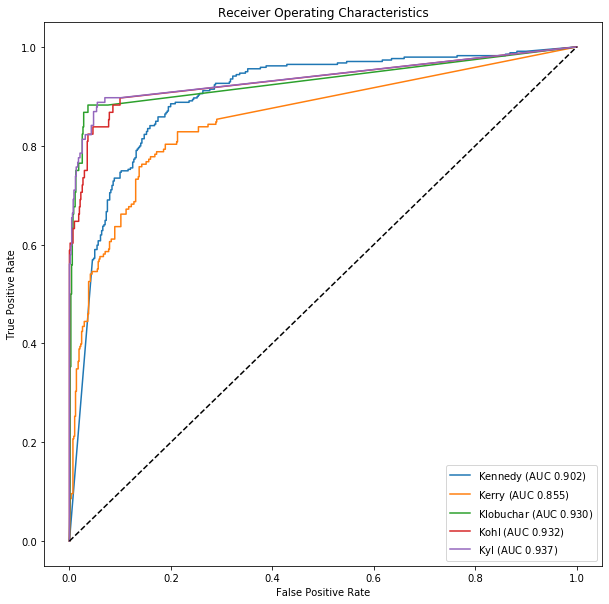

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

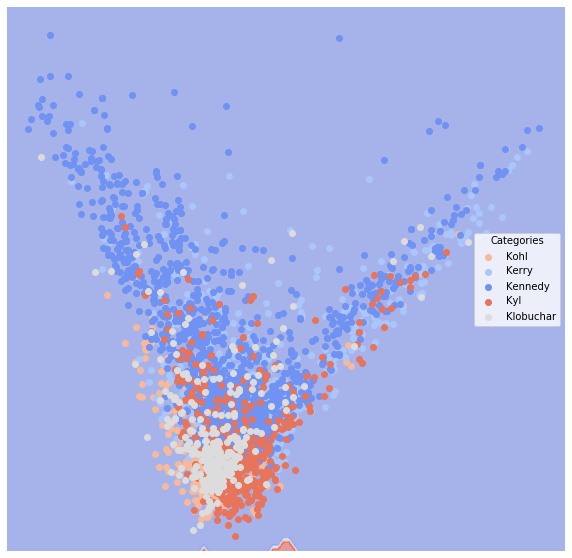

classical_reg  Evaluation:
           Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                               
Kohl         0.007692  0.962533   0.984375           0.918405  0.926471
Kerry        0.024359  0.957019   0.983784           0.924799  0.919192
Kennedy      0.053846  0.951358   0.896000           0.891917  0.991150
Kyl          0.015385  0.947855   0.989691           0.902049  0.897196
Klobuchar    0.011538  0.933824   1.000000           0.879186  0.867647
classical_reg  Confusion Matrix:


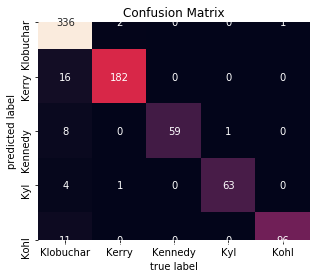

classical_reg  ROC:


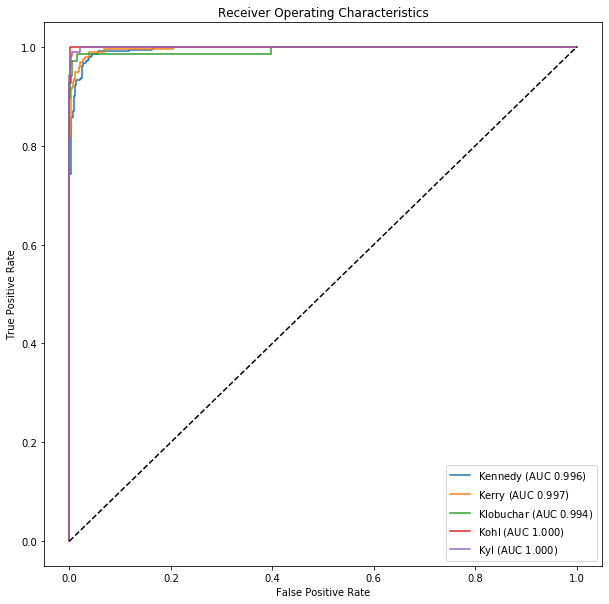

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

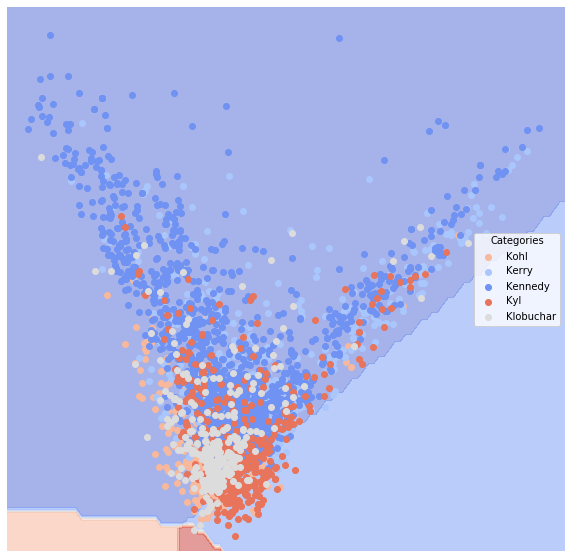

decision_tree  Evaluation:
           Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                               
Kohl         0.000000  1.000000   1.000000           1.000000  1.000000
Kerry        0.000000  1.000000   1.000000           1.000000  1.000000
Kennedy      0.002564  0.997732   0.994135           0.994135  1.000000
Kyl          0.002564  0.994584   0.990654           0.982678  0.990654
Klobuchar    0.002564  0.985294   1.000000           0.973152  0.970588
decision_tree  Confusion Matrix:


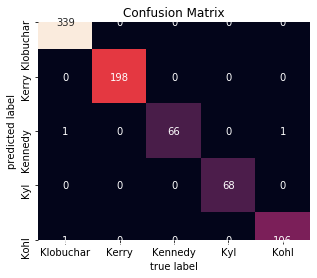

decision_tree  ROC:


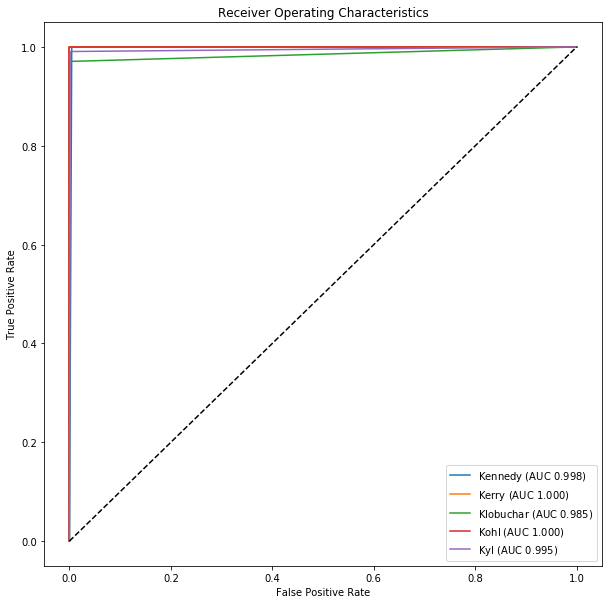

decision_tree  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

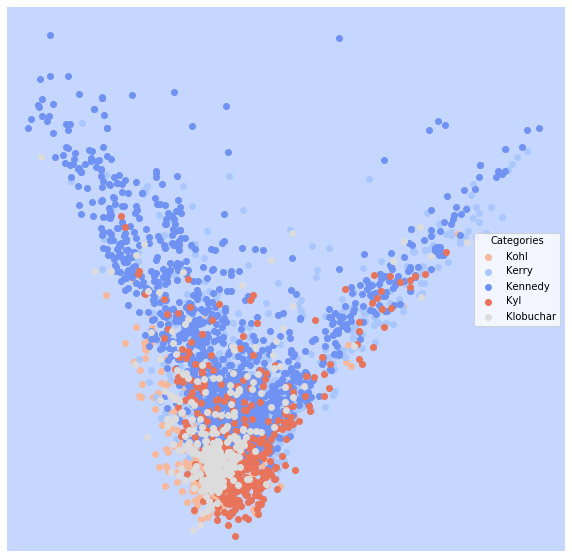

random_forest  Evaluation:
           Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                               
Kohl         0.002564  0.991945   0.985294           0.972087  0.985294
Kerry        0.024359  0.962017   0.968586           0.921659  0.934343
Kennedy      0.037179  0.965414   0.932961           0.925611  0.985251
Kyl          0.002564  0.990654   1.000000           0.983873  0.981308
Klobuchar    0.012821  0.926471   1.000000           0.865762  0.852941
random_forest  Confusion Matrix:


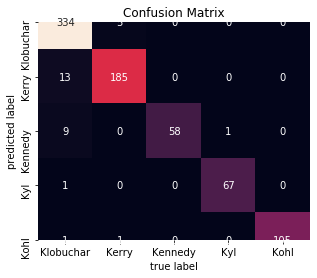

random_forest  ROC:


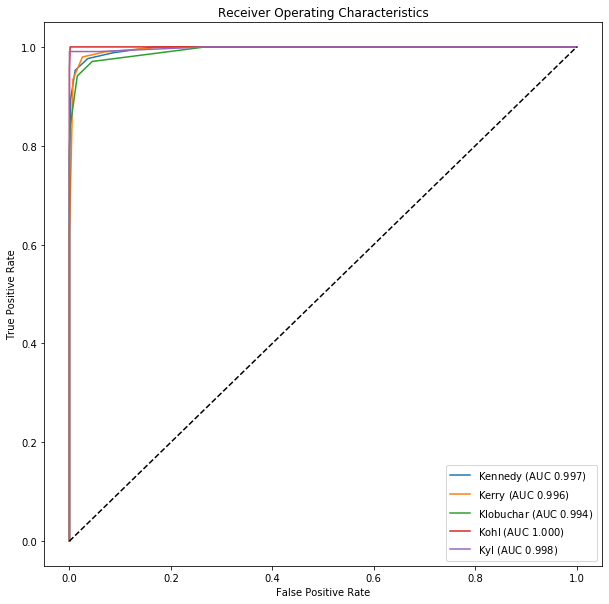

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

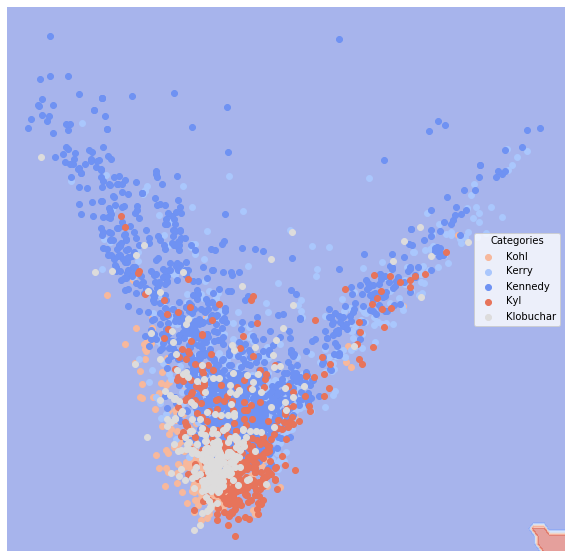

neural_network  Evaluation:
           Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                               
Kohl         0.001282  0.992647   1.000000           0.986576  0.985294
Kerry        0.043590  0.930803   0.945652           0.861797  0.878788
Kennedy      0.050000  0.952371   0.918994           0.904706  0.970501
Kyl          0.006410  0.980565   0.990385           0.958489  0.962617
Klobuchar    0.008974  0.968481   0.955224           0.904162  0.941176
neural_network  Confusion Matrix:


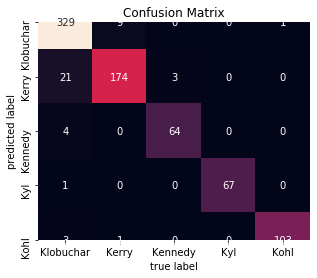

neural_network  ROC:


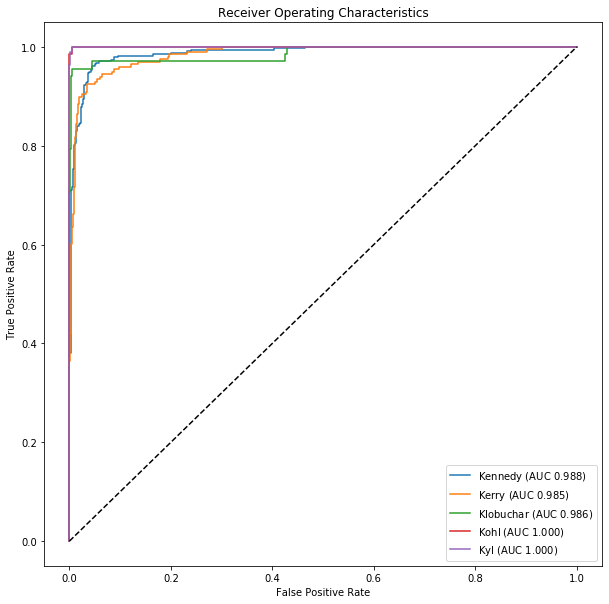

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

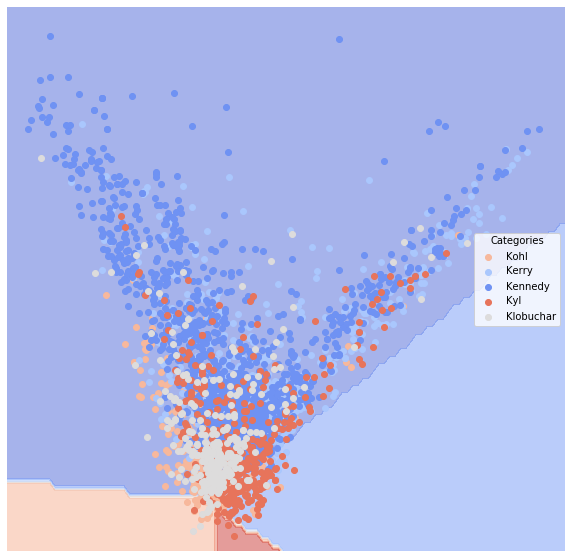

boosting  Evaluation:
           Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                               
Kohl         0.001282  0.992647   1.000000           0.986576  0.985294
Kerry        0.000000  1.000000   1.000000           1.000000  1.000000
Kennedy      0.003846  0.996599   0.991228           0.991228  1.000000
Kyl          0.001282  0.995327   1.000000           0.991936  0.990654
Klobuchar    0.001282  0.992647   1.000000           0.986576  0.985294
boosting  Confusion Matrix:


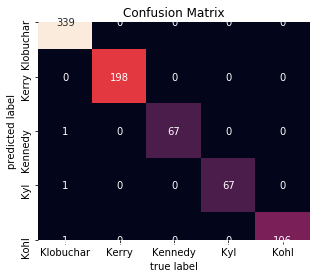

boosting  ROC:


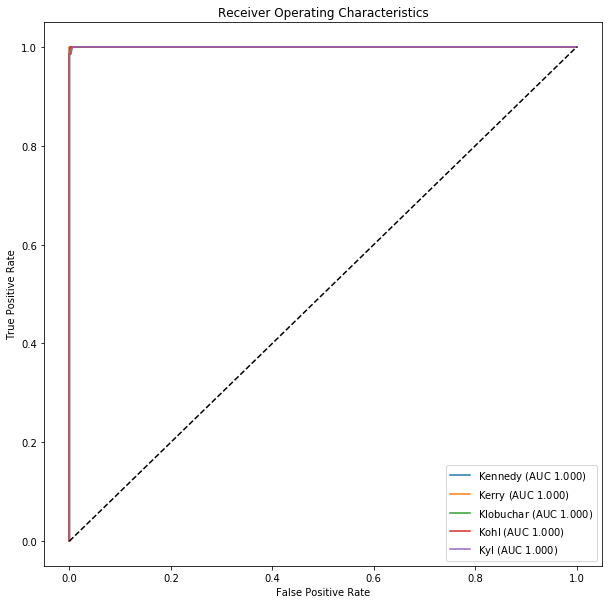

boosting  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

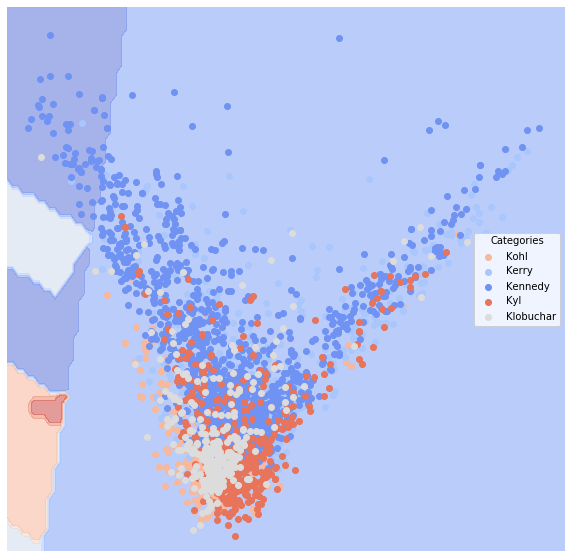

In [126]:
eval_senate_large = all_model(senate_large_dfTrain, senate_large_dfTest)

## Email Spam

Loading Spam
Loading Ham
Converting to vectors


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


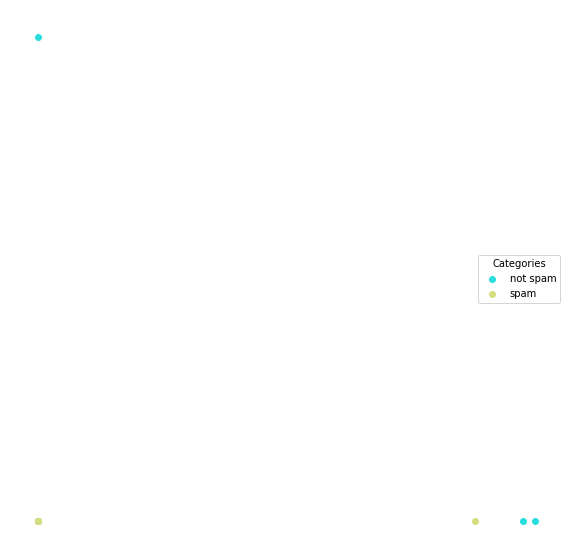

In [127]:
spam_dfTrain, spam_dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadSpam())
lucem_illud_2020.plotter(spam_dfTrain)

bayes  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
not spam    0.176901  0.793665   0.953307           0.937589  0.834753
spam        0.176901  0.793665   0.429412           0.358253  0.752577
bayes  Confusion Matrix:


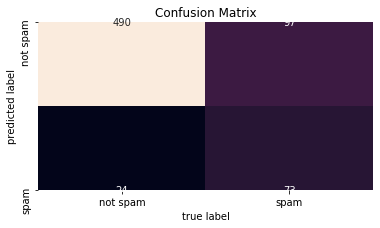

bayes  ROC:


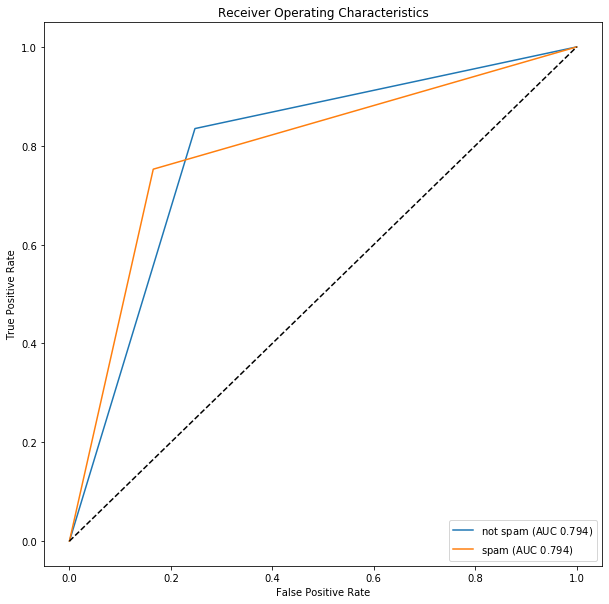

bayes  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


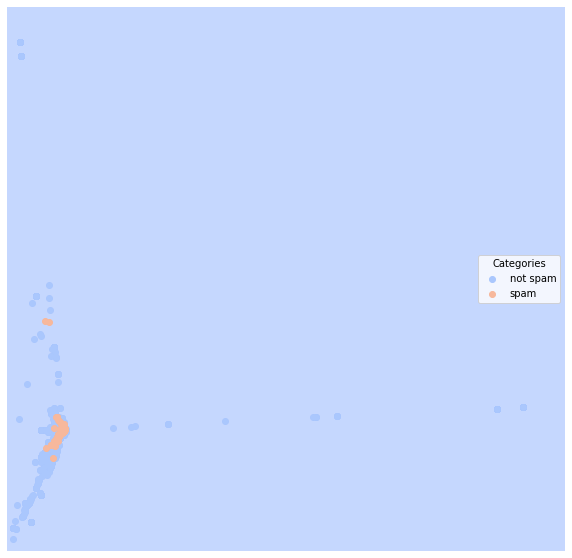

svm_linear  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
not spam    0.073099  0.763782   0.928230           0.927633  0.991482
spam        0.073099  0.763782   0.912281           0.554847  0.536082
svm_linear  Confusion Matrix:


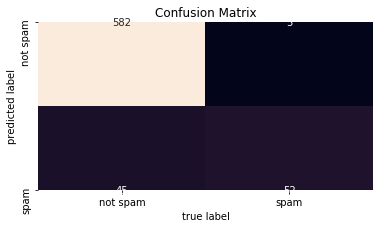

svm_linear  ROC:


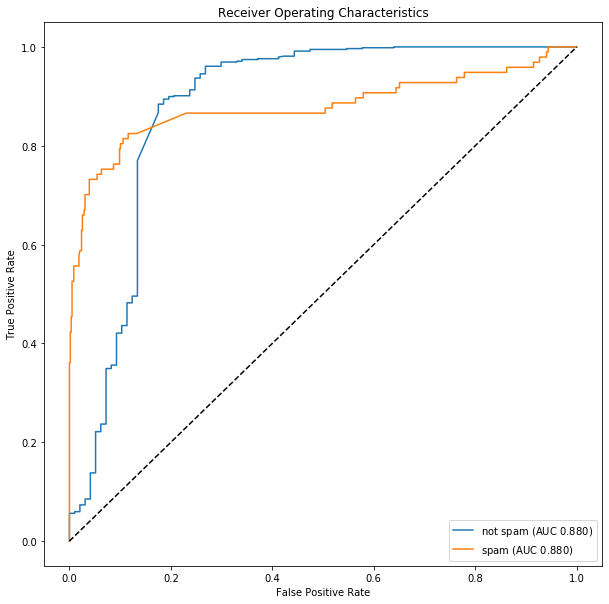

svm_linear  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


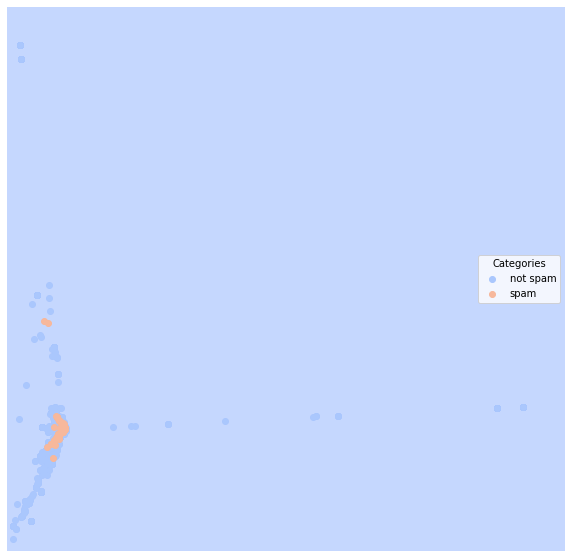

svm_poly  Evaluation:
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
not spam    0.141813  0.5   0.858187           0.858187     1.0
spam        0.141813  0.5   0.000000           0.141813     0.0
svm_poly  Confusion Matrix:


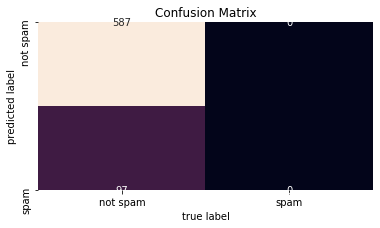

svm_poly  ROC:


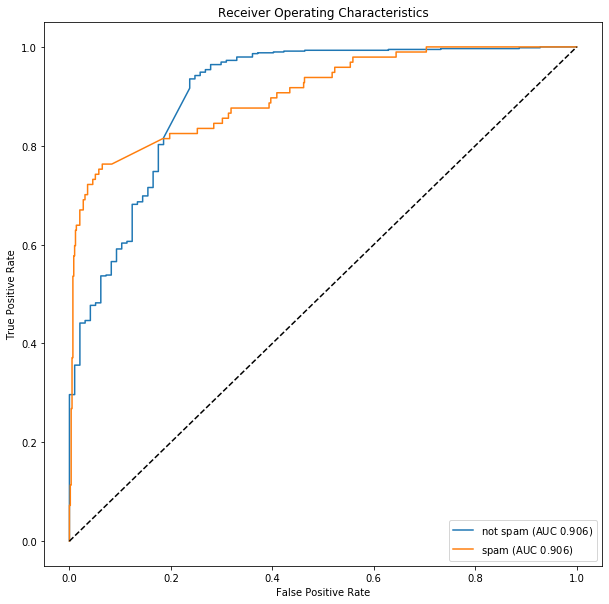

svm_poly  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


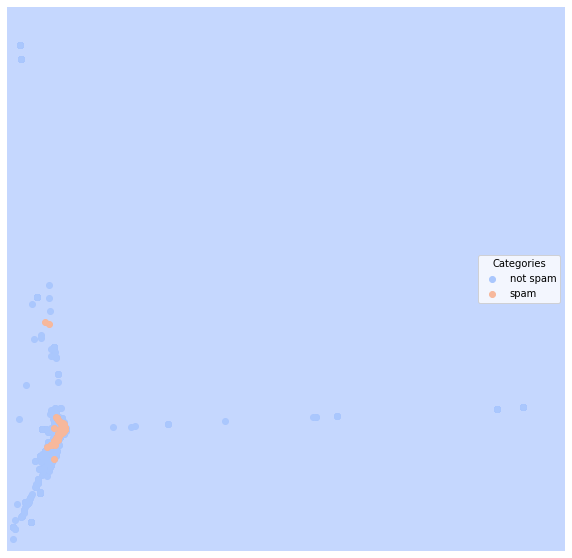

knn  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
not spam    0.077485  0.761227   0.927885           0.926935  0.986371
spam        0.077485  0.761227   0.866667           0.530394  0.536082
knn  Confusion Matrix:


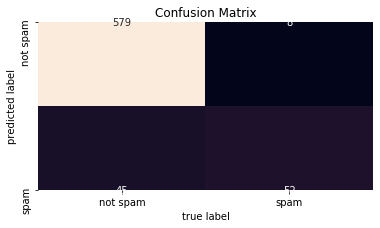

knn  ROC:


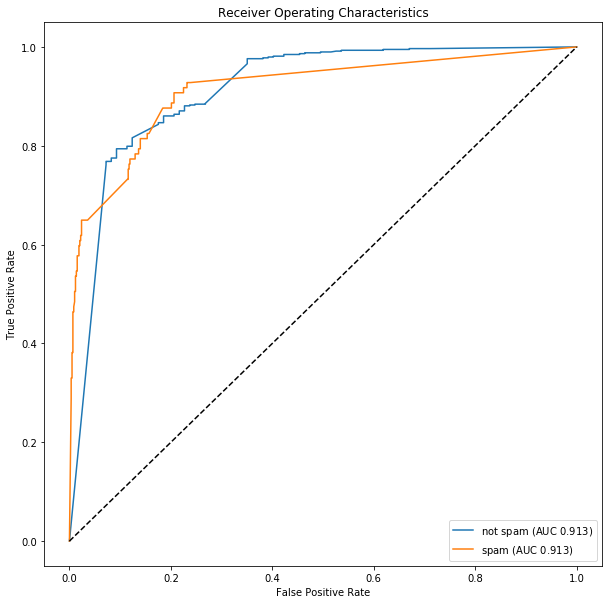

knn  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


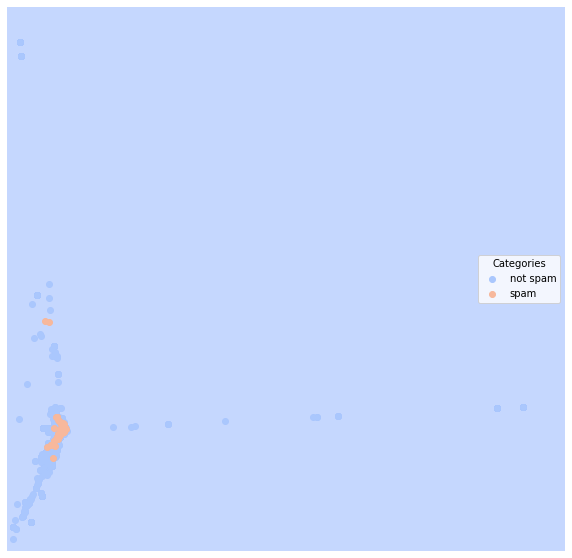

classical_reg  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
not spam    0.102339  0.647781   0.895865           0.895737  0.996593
spam        0.102339  0.647781   0.935484           0.379096  0.298969
classical_reg  Confusion Matrix:


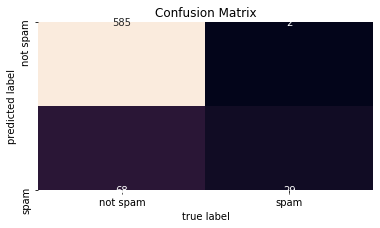

classical_reg  ROC:


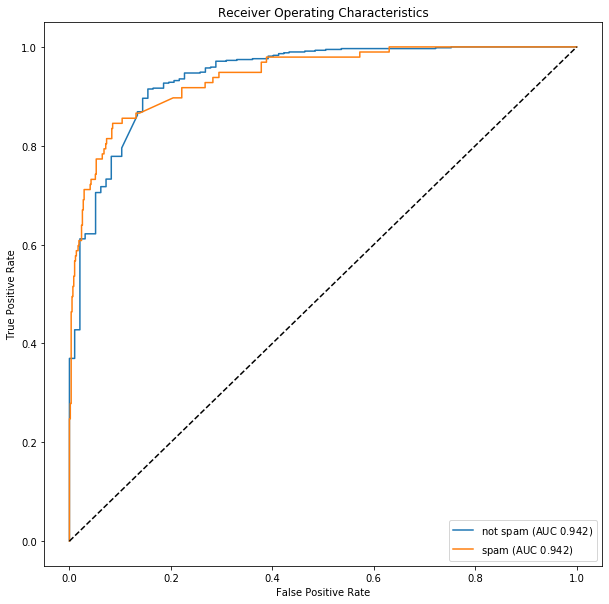

classical_reg  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


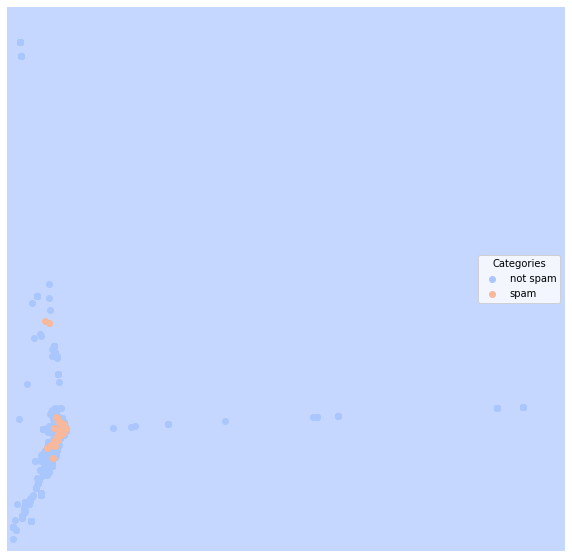

decision_tree  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
not spam    0.077485  0.830073   0.951014           0.947218  0.959114
spam        0.077485  0.830073   0.739130           0.560551  0.701031
decision_tree  Confusion Matrix:


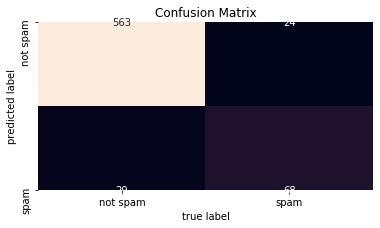

decision_tree  ROC:


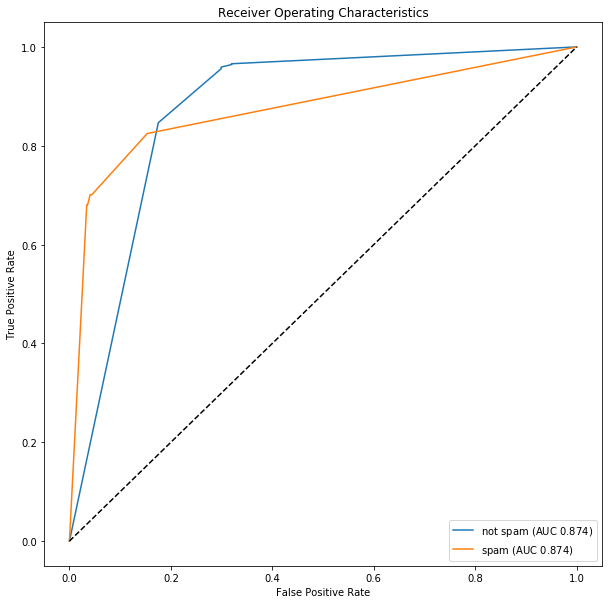

decision_tree  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


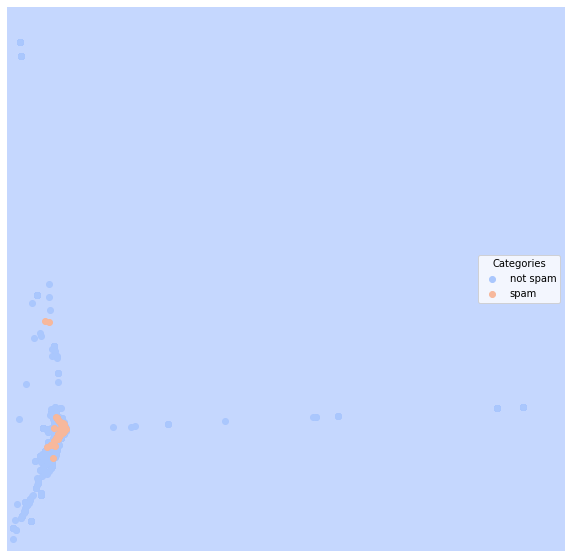

random_forest  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
not spam    0.070175  0.804212   0.941080           0.939386  0.979557
spam        0.070175  0.804212   0.835616           0.578122  0.628866
random_forest  Confusion Matrix:


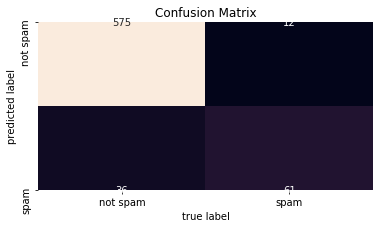

random_forest  ROC:


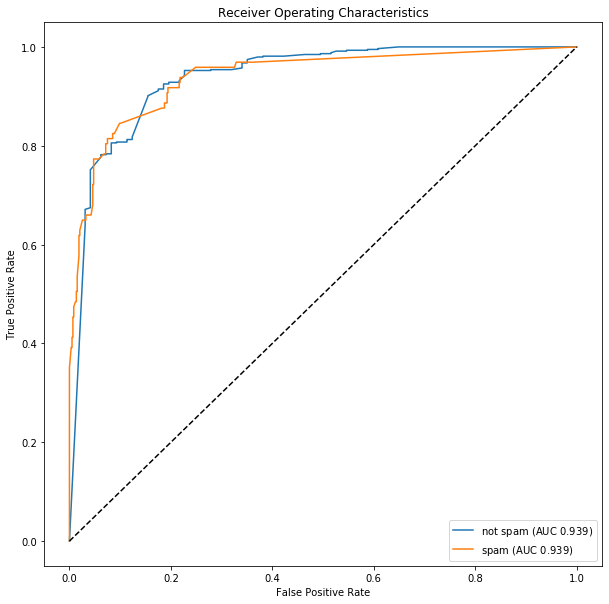

random_forest  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


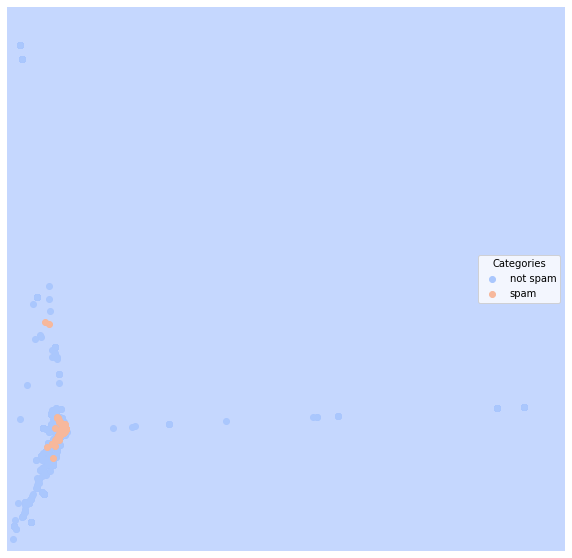

neural_network  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
not spam    0.090643  0.813801   0.947189           0.942489  0.947189
spam        0.090643  0.813801   0.680412           0.508283  0.680412
neural_network  Confusion Matrix:


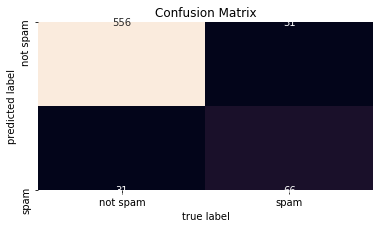

neural_network  ROC:


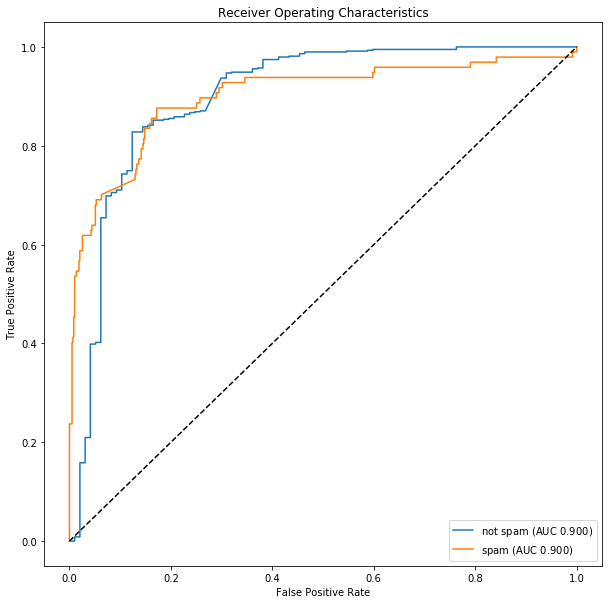

neural_network  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


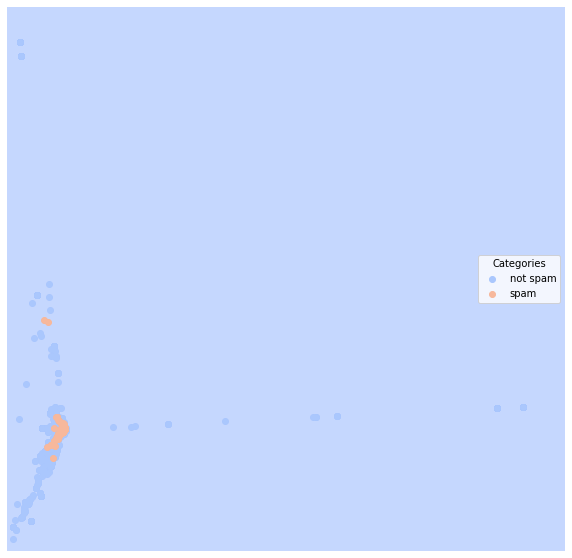

boosting  Evaluation:
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
not spam    0.100877  0.648633   0.896024           0.895960  0.998296
spam        0.100877  0.648633   0.966667           0.388419  0.298969
boosting  Confusion Matrix:


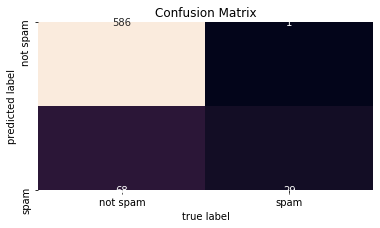

boosting  ROC:


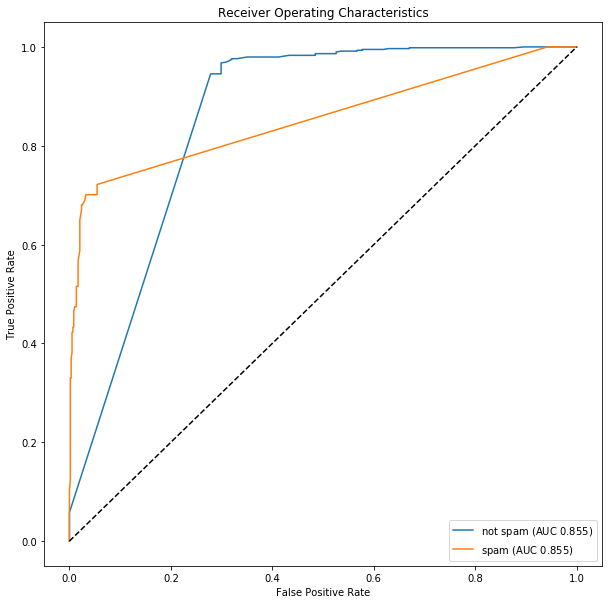

boosting  Regions:


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


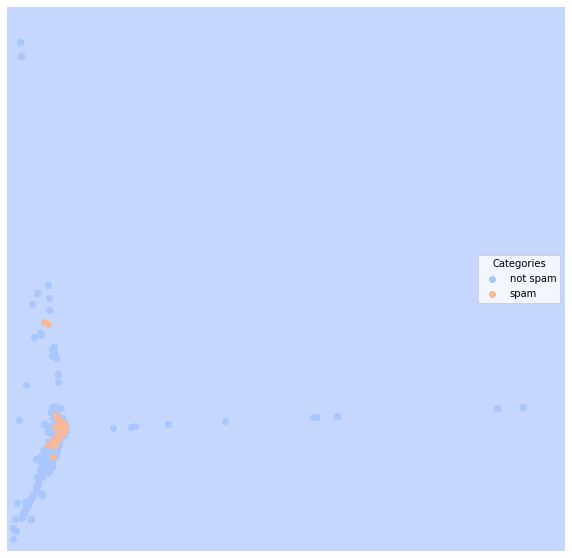

In [128]:
eval_spam = all_model(spam_dfTrain, spam_dfTest)

For the Reddit data, SVM with linear kernel, KNN, classical regression, random forest, neural network and boosting have better performance than other models since they have lower error rates of all categories.

For the  Newsgroups data , SVM with linear kernel, classical regression, neural network have better performance than other models since they have lower error rates of all categories.

For the Senate Small data, SVM with linear kernel, classical regression, decision tree, random forest, neural network and boosting have better performance than other models since they have lower error rates of all categories.

For the Senate Large data, SVM with linear kernel, classical regression, decision tree, random forest, neural network and boosting have better performance than other models.

For the Email Spam data, classical regression, random forest and neural network have better performance than the other methods.

## Stretch - AdaBoost

In [129]:
# artificial dataset -dfTrain0, dfTest0
clf_ada0 = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada0.fit(np.stack(dfTrain0['vect'], axis=0), dfTrain0['category'])
lucem_illud_2020.evaluateClassifier(clf_ada0, dfTest0)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.515,0.484598,0.478261,0.487560,0.444444
1,0.515,0.484598,0.490741,0.497517,0.524752


In [130]:
# real dataset - reddit -  reddit_dfTrain, reddit_dfTest
clf_ada_reddit = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada_reddit.fit(np.stack(reddit_dfTrain['vect'], axis=0), reddit_dfTrain['category'])
lucem_illud_2020.evaluateClassifier(clf_ada_reddit, reddit_dfTest)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
Tales From Tech Support,0.078370,0.943407,0.769231,0.762869,0.987654
Weeaboo Tales,0.025078,0.959195,0.974359,0.921873,0.926829
Bad Roommates,0.075235,0.872442,0.941176,0.779783,0.761905
Relationships,0.078370,0.880511,0.840580,0.721021,0.805556


According to the result above, we can see that AdaBoost does not have good performance on the first artificial dataset compared with other methods. Relatively speaking, its performance on Reddit dataset is better, but it is still not the best model compared with the methods we implemented before. The possible reason is that AdaBoost is sensitive to noise data and it is highly affected by outliers because it tries to fit each point perfectly.

# Clinton / Obama Press Releases

We often will not have nicely prepared data, so we will work though the proccess of cleaning and structuring in more detail here:

While the Clinton and Obama Senatorial Press Releases are not hand-coded, we can imagine that we have been given a stack of such press releases, but lost the metadata associated with which senatorial office issued which. If we label a few of them, how well can our classifier do at recovering the rest? 

In [17]:
ObamaClintonReleases = pandas.read_csv('../data/ObamaClintonReleases.csv', index_col=0)

Let's turn the 'targetSenator' column into a binary category variable.

In [18]:
ObamaClintonReleases['category'] = [s == 'Obama' for s in ObamaClintonReleases['targetSenator']]

Tokenize and normalize

In [19]:
ObamaClintonReleases['tokenized_text'] = ObamaClintonReleases['text'].apply(lambda x: lucem_illud_2020.word_tokenize(x))
ObamaClintonReleases['normalized_text'] = ObamaClintonReleases['tokenized_text'].apply(lambda x: lucem_illud_2020.normalizeTokens(x))

In [20]:
ObamaClintonReleases.head()

,download_url,html_url,name,path,text,targetSenator,category,tokenized_text,normalized_text
0,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Apr2007Obama430.txt,raw/Obama/10Apr2007Obama430.txt,Obama Calls on IRS to Protect Taxpayers ...,Obama,True,"[Obama, Calls, on, IRS, to, Protect, Taxpayers...","[obama, call, irs, protect, taxpayer, privacy,..."
1,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Apr2008Obama108.txt,raw/Obama/10Apr2008Obama108.txt,Statement from Senator Barack Obama on the ...,Obama,True,"[Statement, from, Senator, Barack, Obama, on, ...","[statement, senator, barack, obama, dodd, shel..."
2,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2005Obama674.txt,raw/Obama/10Aug2005Obama674.txt,Obama Says Bill Will Help Cut Off Supply of...,Obama,True,"[Obama, Says, Bill, Will, Help, Cut, Off, Supp...","[obama, say, bill, help, cut, supply, dangerou..."
3,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2005Obama675.txt,raw/Obama/10Aug2005Obama675.txt,Obama Durbin Say Illinois Will Receive 33 ...,Obama,True,"[Obama, Durbin, Say, Illinois, Will, Receive, ...","[obama, durbin, illinois, receive, percent, fu..."
4,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2006Obama508.txt,raw/Obama/10Aug2006Obama508.txt,Obama Introduces Bill to Help Tap Power of ...,Obama,True,"[Obama, Introduces, Bill, to, Help, Tap, Power...","[obama, introduce, bill, help, tap, power, gen..."


Let's split the data into training data and testing data.

In [21]:
holdBackFraction = .2
train_data_df, test_data_df = lucem_illud_2020.trainTestSplit(ObamaClintonReleases, holdBackFraction=holdBackFraction)

In [22]:
print(len(train_data_df))
print(len(test_data_df))

1368
341


## Logistic Regression

First, let's try with a logistic regression, which may be familiar to you from statistical methods classes. First, we must turn the training dataset into a tf-idf matrix (`lucem_illud_2020.generateVecs()` will help with this but for now we are doing it the long way):

In [23]:
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_data_df['text'])

Note that we can use the CountVectorizer instead, which simply produces a matrix of word counts.

In [24]:
TFVects.shape

(1368, 11313)

We can save this in the dataframe to make things easier

In [25]:
train_data_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In a regression, we cannot have more variables than cases. So, we need to first do a dimension reduction. First, we will approah this with PCA. You have previously seen this in week 3. Here we are not concerned about visualization, but rather classification and so all principal components are calculated. Watch out: we have to use `stack` not `sum` for combining the vectors. We note that you could also use topic loading and embedding dimensions as featured variables.

In [27]:
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_data_df['vect'], axis=0))

We can store the PCA space vectors in the dataframe too:

In [28]:
train_data_df['pca'] = [r for r in reduced_data]

Visualization in 2D:

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


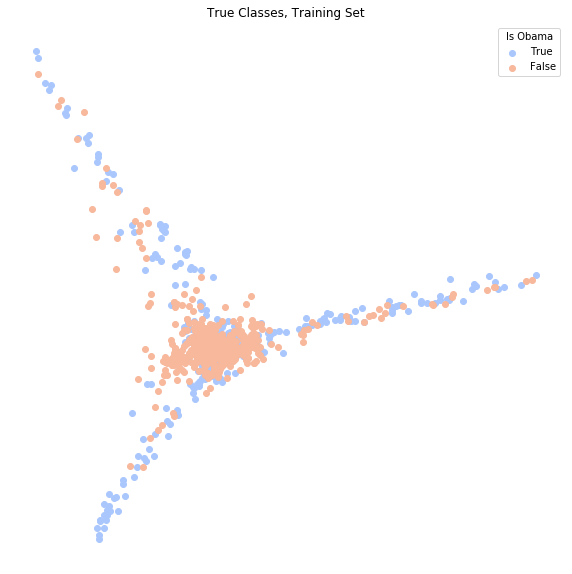

In [29]:
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot Obama
a = np.stack(train_data_df[train_data_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot not Obama
a = np.stack(train_data_df[train_data_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")
    
ax.legend(loc = 'upper right', title = 'Is Obama')
plt.title('True Classes, Training Set')
plt.show()

PCA cannot distinguish Obama very well. Let's perform a screeplot to see how many Principal Components we need.

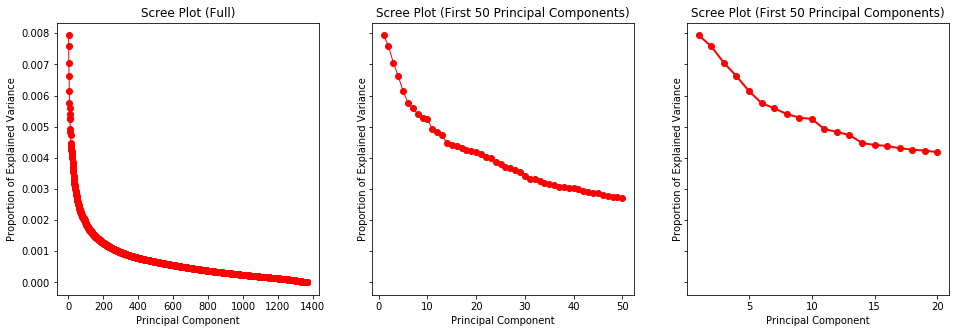

In [30]:
n = len(train_data_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 50 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

Let's choose the first 10 pricipal components as our covariates.

In [31]:
train_data_df['pca_reduced_10'] = train_data_df['pca'].apply(lambda x: x[:10])

Now we fit a logistic regression to our data.

In [32]:
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

Let's see how the logistic regression performs on the training dataset from which we develop the model. Unfortunately, the mean accuracy is only about 64%.

In [33]:
logistic.score(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

0.6593567251461988

How does it perform on the testing dataset, which we "held out" and did not use for model training? We need to repeat all the steps on the testing data, but without retraining:

In [34]:
#Create vectors
TFVects_test = TFVectorizer.transform(test_data_df['text'])
test_data_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_data_df['vect'], axis=0))
test_data_df['pca'] = [r for r in reduced_data_test]
test_data_df['pca_reduced_10'] = test_data_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_data_df['pca_reduced_10'], axis=0), test_data_df['category'])

0.6275659824046921

Slightly poorer. How about using more dimensions (40)?

In [35]:
train_data_df['pca_reduced_40'] = train_data_df['pca'].apply(lambda x: x[:40])
test_data_df['pca_reduced_40'] = test_data_df['pca'].apply(lambda x: x[:40])

logistic.fit(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_40'], axis=0), test_data_df['category']))

Training:
0.7441520467836257
Testing:
0.718475073313783


Or still more (100)?

In [36]:
train_data_df['pca_reduced_100'] = train_data_df['pca'].apply(lambda x: x[:100])
test_data_df['pca_reduced_100'] = test_data_df['pca'].apply(lambda x: x[:100])

logistic.fit(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_100'], axis=0), test_data_df['category']))

Training:
0.8165204678362573
Testing:
0.7653958944281525


Or even more (200)!

In [37]:
train_data_df['pca_reduced_200'] = train_data_df['pca'].apply(lambda x: x[:200])
test_data_df['pca_reduced_200'] = test_data_df['pca'].apply(lambda x: x[:200])

logistic.fit(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_200'], axis=0), test_data_df['category']))

Training:
0.8793859649122807
Testing:
0.7917888563049853


This is becoming ridiculous (400)!

In [38]:
train_data_df['pca_reduced_400'] = train_data_df['pca'].apply(lambda x: x[:400])
test_data_df['pca_reduced_400'] = test_data_df['pca'].apply(lambda x: x[:400])

logistic.fit(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_400'], axis=0), test_data_df['category']))

Training:
0.9217836257309941
Testing:
0.8357771260997068


Increasing the number of covariates would overfit our data, and it seems that using a logistic regression, our prediction accuracy is at best about 65%. We can, however, try a logistic regression that uses the TF-IDF scores for each word, but with an L1 regularization or L1-norm loss function, which is also known as least absolute deviations (LAD), least absolute errors (LAE) or L1 penalty. It minimizes the sum of the absolute differences (S) between the target value ($Y_i$) and the estimated values ($f(x_i)$) and prunes all insignificant variables (i.e., word TF-IDF scores):

$S=\sum^n_{i=1}|y_i=f(x_i)|$

The result is a model retaining only the most individually significant features.

In [39]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l1.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
print(logistic_l1.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))

0.9649122807017544


Train the model using training data, and then test it on the testing data.

In [40]:
print(logistic_l1.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

0.8475073313782991


81% accuracy seems like the best we can get by using a logistic regression.

Now let's try with Naive Bayes. Classically, it is trained with word counts, but TF-IDF vectors are also quite good:

In [41]:
naiveBayes = sklearn.naive_bayes.BernoulliNB()
naiveBayes.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])

BernoulliNB(alpha=1.0, binarize=0.0, class_prior=None, fit_prior=True)

In [42]:
print("Training:")
print(naiveBayes.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))
print("Testing:")
print(naiveBayes.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

Training:
0.9692982456140351
Testing:
0.8797653958944281


A bit better than the logit, but that's just looking at the accuracy. What about other measures? Let's first save the predictions in the dataframe to save use rerunning the model every time:

In [43]:
test_data_df['nb_predict'] = naiveBayes.predict(np.stack(test_data_df['vect'], axis=0))
test_data_df['nb_predict_prob_true'] = naiveBayes.predict_proba(np.stack(test_data_df['vect'], axis=0))[:,0] #other is prop false

Precision:

In [44]:
sklearn.metrics.precision_score(test_data_df['category'], test_data_df['nb_predict'])

0.8716216216216216

Recall:

In [45]:
sklearn.metrics.recall_score(test_data_df['category'], test_data_df['nb_predict'])

0.8543046357615894

F1-measure:

In [46]:
sklearn.metrics.f1_score( test_data_df['category'], test_data_df['nb_predict'])

0.862876254180602

Let's take a look at how well our posterior distribution looks relative to the truth.

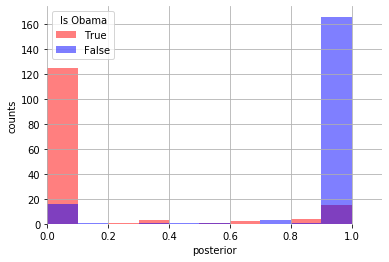

In [47]:
fig, ax = plt.subplots()
ax.grid(False)
ax.set_frame_on(False)
test_data_df[test_data_df['category'].eq(True)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'True', color = 'red')
test_data_df[test_data_df['category'].eq(False)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'False', color = 'blue')
ax.set_xlim((0,1.1))
ax.legend(title = "Is Obama")
ax.set_xlabel('posterior')
ax.set_ylabel('counts')
plt.show()

The classification is suprisingly accurate. We can even look at what words are most influential with a bit of simple math:

In [48]:
#Top indices
trueVals, falseVals = naiveBayes.feature_log_prob_

words_dict = {
    'Obama' : [],
    'Obama_log_prob' : [],
    'Clinton' : [],
    'Clinton_log_prob' : [],
}

for i, prob in sorted(enumerate(trueVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['Obama'].append(TFVectorizer.get_feature_names()[i])
    words_dict['Obama_log_prob'].append(prob)

for i, prob in sorted(enumerate(falseVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['Clinton'].append(TFVectorizer.get_feature_names()[i])
    words_dict['Clinton_log_prob'].append(prob)
    
pandas.DataFrame(words_dict)

,Obama,Obama_log_prob,Clinton,Clinton_log_prob
0,signature,-2.177712,5566,-1.722767
1,welcomed,-2.233592,dick,-1.784642
2,announcement,-2.280660,amy,-1.828127
3,fy,-2.292781,monday,-1.862029
4,island,-2.305051,brundage,-1.909096
5,urging,-2.355695,chicago,-1.984131
6,welcome,-2.382012,interests,-2.217063
7,created,-2.395435,temporary,-2.217063
8,growing,-2.409041,location,-2.233592
9,honor,-2.422834,reform,-2.233592


## Multinomial Naive Bayes

What if we want to classify our text into one of *many* classes? The multinomial Naive Bayes generating model assumes that document features (e.g., words) are generated by draws from a multinomial distribution (recall this gives the probability to observe a particular pattern of counts across features). 

Let's use again the dataset we used in week 3, the 20 newsgroup dataset.

In [49]:
newsgroups = sklearn.datasets.fetch_20newsgroups(data_home = '../data') #Free data to play with: documents from a newsgroup corpus.
newsgroups.target_names #Possible categories, i.e., the newsgroups

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

We can pick specific categories, and pull the relevant training and testing sets. 

In [50]:
target_categories = ['talk.religion.misc', 'soc.religion.christian', 'sci.space', 'comp.graphics'] #Can change these of course

newsgroupsDF = pandas.DataFrame(columns = ['text', 'category', 'source_file'])
for category in target_categories:
    print("Loading data for: {}".format(category))
    ng = sklearn.datasets.fetch_20newsgroups(categories = [category], remove=['headers', 'footers', 'quotes'], data_home = '../data')
    newsgroupsDF = newsgroupsDF.append(pandas.DataFrame({'text' : ng.data, 'category' : [category] * len(ng.data), 'source_file' : ng.filenames}), ignore_index=True)

Loading data for: talk.religion.misc
Loading data for: soc.religion.christian
Loading data for: sci.space
Loading data for: comp.graphics


Now we need to tokenize, and make a training and testing set:

In [51]:
newsgroupsDF['tokenized_text'] = newsgroupsDF['text'].apply(lambda x: lucem_illud_2020.word_tokenize(x))
newsgroupsDF['normalized_text'] = newsgroupsDF['tokenized_text'].apply(lambda x: lucem_illud_2020.normalizeTokens(x))

In [52]:
holdBackFraction = .2
train_ng_df, test_ng_df = lucem_illud_2020.trainTestSplit(newsgroupsDF, holdBackFraction=holdBackFraction)

In [53]:
print(len(train_ng_df))
print(len(test_ng_df))

1723
430


We need to extract features from the text. We can use built-in feature extraction to do so. We will use a tf-idf vectorizer, which converts the document into a vector of words with tf-idf weights (term-frequency inverse-document frequency). This gives high weight to words that show up a lot in a given document, but rarely across documents in the corpus (more distinctive). 

In [54]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

Now we can train the model:

In [55]:
MultinomialNB_ng = sklearn.naive_bayes.MultinomialNB()
MultinomialNB_ng.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

...and save predictions to the dataframe:

In [56]:
train_ng_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(train_ng_df['vect'], axis=0))
print("Training score:")
print(MultinomialNB_ng.score(np.stack(train_ng_df['vect'], axis=0), train_ng_df['category']))

Training score:
0.8926291352292514


In [57]:
train_ng_df[['category', 'nb_predict']][:10]

,category,nb_predict
1032,sci.space,sci.space
576,soc.religion.christian,soc.religion.christian
355,talk.religion.misc,soc.religion.christian
1237,sci.space,sci.space
1798,comp.graphics,comp.graphics
5,talk.religion.misc,soc.religion.christian
808,soc.religion.christian,soc.religion.christian
103,talk.religion.misc,soc.religion.christian
988,sci.space,sci.space
545,soc.religion.christian,soc.religion.christian


Looks pretty good, lets examine the testing dataset:

In [58]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(MultinomialNB_ng.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Testing score:
0.772093023255814


We can even use a confusion matrix, like we used last week for evaluating human coders relative to one another. Now we are evaluating our classifier relative to human coding. We'll just use the one in `lucem_illud_2020`, which requres a classifier and a dataframe with `'vect'` and `'category'` columns, like we have in the examples:

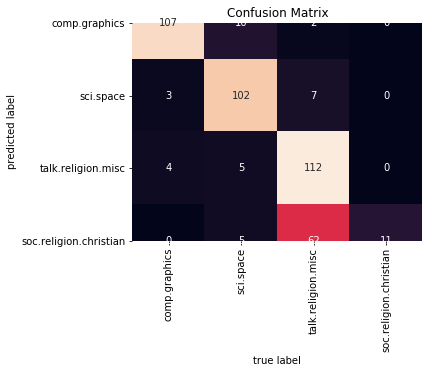

In [59]:
lucem_illud_2020.plotConfusionMatrix(MultinomialNB_ng, test_ng_df)

Let's calculate the precision, recall, and F-measures.

In [60]:
print(sklearn.metrics.precision_score(test_ng_df['category'], test_ng_df['nb_predict'], average = 'weighted')) #precision
print(sklearn.metrics.recall_score(test_ng_df['category'], test_ng_df['nb_predict'], average = 'weighted')) #recall
print(sklearn.metrics.f1_score(test_ng_df['category'], test_ng_df['nb_predict'], average = 'weighted')) #F-1 measure

0.8311324919236712
0.772093023255814
0.733432457193786


We can evaluate these per catagory. This has the same requiments as `plotConfusionMatrix`:

In [61]:
lucem_illud_2020.metrics.evaluateClassifier(MultinomialNB_ng, test_ng_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
sci.space,0.069767,0.923911,0.836066,0.784673,0.910714
comp.graphics,0.044186,0.938326,0.938596,0.871855,0.899160
soc.religion.christian,0.186047,0.847923,0.612022,0.587430,0.925620
talk.religion.misc,0.155814,0.570513,1.000000,0.296840,0.141026


We can also plot the ROC curves. This has the same requiments as `plotConfusionMatrix`:

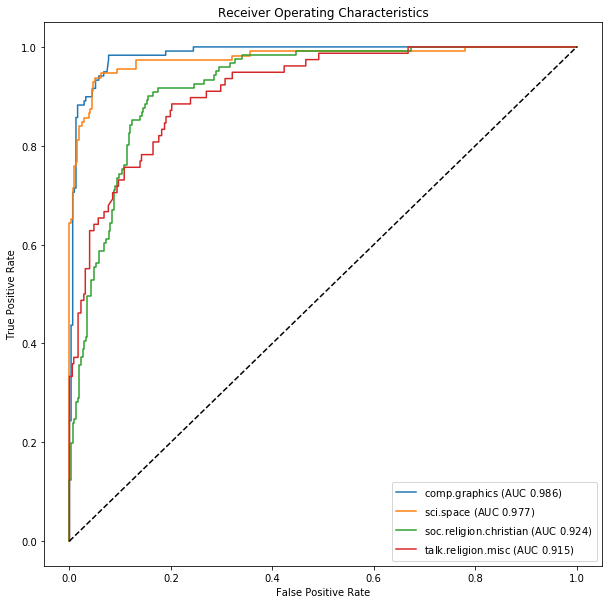

In [62]:
lucem_illud_2020.plotMultiROC(MultinomialNB_ng, test_ng_df)

And we can plot the PCA space visualization:

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

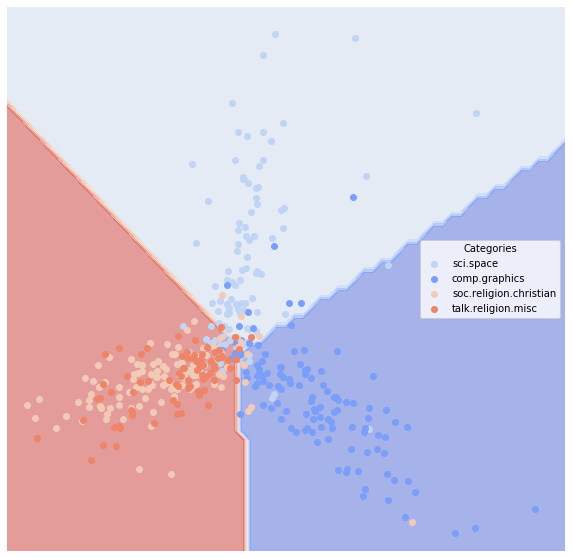

In [63]:
lucem_illud_2020.plotregions(MultinomialNB_ng, test_ng_df)

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">In the cells immediately following, perform Logistic and Naïve Bayes classification (binary or multinomial) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project (e.g., these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week). Visualize the confusion matrix for training and testing sets. Calculate precision, recall, the F-measure, and AUC, then perform an ROC visualization. How do these classifiers perform? Exrapolate codes from these models to all uncoded data.


For this homework, I use a dataset downloaded from kaggle: a Women’s Clothing E-Commerce dataset revolving around the reviews written by customers (https://www.kaggle.com/nicapotato/womens-ecommerce-clothing-reviews)

In [131]:
import pandas as pd

review_raw = pd.read_csv("review.csv")
review_raw.head()

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [132]:
# form the analysis dataset
review = review_raw[['Review Text','Rating','Class Name','Age']]
review.head()

,Review Text,Rating,Class Name,Age
0,Absolutely wonderful - silky and sexy and comf...,4,Intimates,33
1,Love this dress! it's sooo pretty. i happene...,5,Dresses,34
2,I had such high hopes for this dress and reall...,3,Dresses,60
3,"I love, love, love this jumpsuit. it's fun, fl...",5,Pants,50
4,This shirt is very flattering to all due to th...,5,Blouses,47


In [133]:
# fill NA values by space
review['Review Text'] = review['Review Text'].fillna('')

Then we need to add a column "category" to represent the positive or negative reviews based on the rating. If the rating is 4 or higher, we can regard it as a positive review. If the rating is 2 or lower, we can regard it as a negative review. I plan to implement binary classification here so I only retain the record with negative or positive sentiment.

In [134]:
b_df = review[review['Rating'] != 3]
b_df['category'] = b_df['Rating'] >=4
b_df.head()

,Review Text,Rating,Class Name,Age,category
0,Absolutely wonderful - silky and sexy and comf...,4,Intimates,33,True
1,Love this dress! it's sooo pretty. i happene...,5,Dresses,34,True
3,"I love, love, love this jumpsuit. it's fun, fl...",5,Pants,50,True
4,This shirt is very flattering to all due to th...,5,Blouses,47,True
5,"I love tracy reese dresses, but this one is no...",2,Dresses,49,False


Since the process of tokenize and normalize is quite slow, so we can only keep 2000 records for higher speed.

In [135]:
b_df = b_df[:2000]
b_df.shape

(2000, 5)

In [136]:
# tokenize and normalize
b_df['tokenized_text'] = b_df['Review Text'].apply(lambda x: lucem_illud_2020.word_tokenize(x))
b_df['normalized_text'] = b_df['tokenized_text'].apply(lambda x: lucem_illud_2020.normalizeTokens(x))

In [137]:
b_df.head()

,Review Text,Rating,Class Name,Age,category,tokenized_text,normalized_text
0,Absolutely wonderful - silky and sexy and comf...,4,Intimates,33,True,"[Absolutely, wonderful, silky, and, sexy, and,...","[absolutely, wonderful, silky, sexy, comfortable]"
1,Love this dress! it's sooo pretty. i happene...,5,Dresses,34,True,"[Love, this, dress, it, 's, sooo, pretty, i, h...","[love, dress, sooo, pretty, happen, find, stor..."
3,"I love, love, love this jumpsuit. it's fun, fl...",5,Pants,50,True,"[I, love, love, love, this, jumpsuit, it, 's, ...","[love, love, love, jumpsuit, fun, flirty, fabu..."
4,This shirt is very flattering to all due to th...,5,Blouses,47,True,"[This, shirt, is, very, flattering, to, all, d...","[shirt, flattering, adjustable, tie, perfect, ..."
5,"I love tracy reese dresses, but this one is no...",2,Dresses,49,False,"[I, love, tracy, reese, dresses, but, this, on...","[love, tracy, reese, dress, petite, foot, tall..."


In [138]:
# split the dataset into training data and testing data
holdBackFraction = .2
train_df, test_df = lucem_illud_2020.trainTestSplit(b_df, holdBackFraction=holdBackFraction)

## Implement Logistic Classification

In [139]:
# turn the training dataset into a tf-idf matrix
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_df['Review Text'])

In [140]:
TFVects.shape

(1600, 2144)

In [141]:
# save it into a dataframe
train_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [142]:
# implement PCA
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_df['vect'], axis=0))

In [143]:
# store the pca space vectors in the dataframe
train_df['pca'] = [r for r in reduced_data]

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


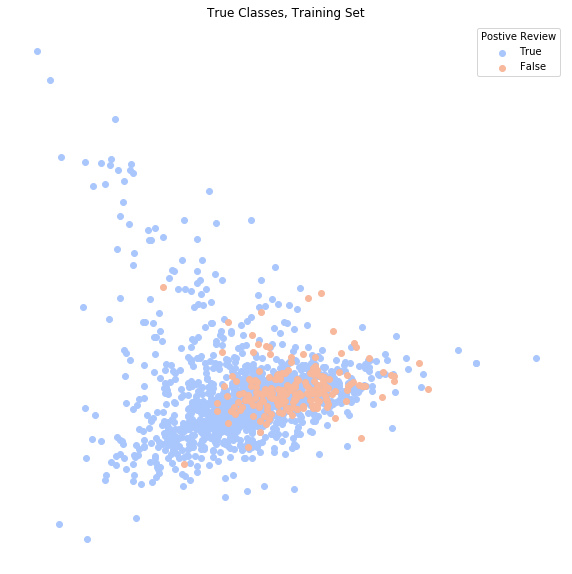

In [144]:
# visualize
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot positive
a = np.stack(train_df[train_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot negative
a = np.stack(train_df[train_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")
    
ax.legend(loc = 'upper right', title = 'Postive Review')
plt.title('True Classes, Training Set')
plt.show()

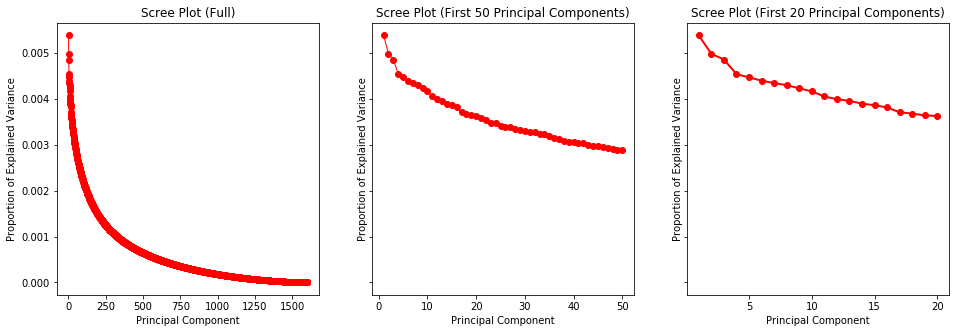

In [145]:
# find the optimal number of principle components
n = len(train_df)
# Initialize
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)
# 1
eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')
# 2
eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')
# 3
eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')
# Plot
plt.show()

In [146]:
# So we can choose the first 10 principle components
train_df['pca_reduced_10'] = train_df['pca'].apply(lambda x: x[:10])

In [147]:
# fit a logistic regression
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_df['pca_reduced_10'], axis=0), train_df['category'])

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [148]:
# See the performance on the training dataset
logistic.score(np.stack(train_df['pca_reduced_10'], axis=0), train_df['category'])

0.8775

It seems good so we can move to testing dataset.

In [149]:
# apply model on testing dataset

#Create vectors
TFVects_test = TFVectorizer.transform(test_df['Review Text'])
test_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_df['vect'], axis=0))
test_df['pca'] = [r for r in reduced_data_test]
test_df['pca_reduced_10'] = test_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_df['pca_reduced_10'], axis=0), test_df['category'])

0.8825

It also works fine on the testing dataset.

In [150]:
## With panelty
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l1')
logistic_l1.fit(np.stack(train_df['vect'], axis=0), train_df['category'])
# Training data
print(logistic_l1.score(np.stack(train_df['vect'], axis=0), train_df['category']))
# Testing data
print(logistic_l1.score(np.stack(test_df['vect'], axis=0), test_df['category']))

0.896875
0.885


In [151]:
lucem_illud_2020.evaluateClassifier(logistic_l1, test_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.115,0.538304,0.571429,0.156132,0.085106
True,0.115,0.538304,0.890585,0.890517,0.991501


In [152]:
test_df['logistic_penalty_predict'] = logistic_l1.predict(np.stack(test_df['vect'], axis=0))

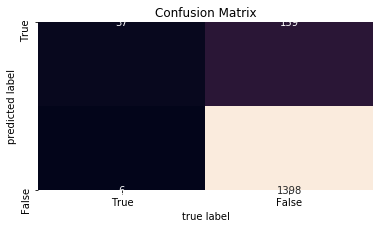

In [153]:
# Confusion Matrix for Training Data
lucem_illud_2020.plotConfusionMatrix(logistic_l1, train_df)

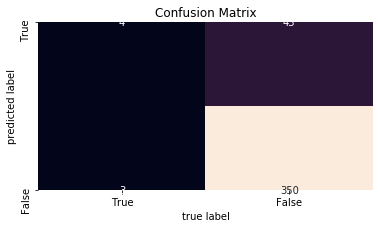

In [154]:
# Confusion Matrix for Testing Data
lucem_illud_2020.plotConfusionMatrix(logistic_l1, test_df)

In [155]:
# More Evaluation
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['logistic_penalty_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['logistic_penalty_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(test_df['category'], test_df['logistic_penalty_predict'],average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['logistic_penalty_predict'],average = 'weighted'))

Accuracy Score:  0.885
Precision Score:  0.8530843329698291
Recall:  0.885
F1 Score:  0.8454905173269784


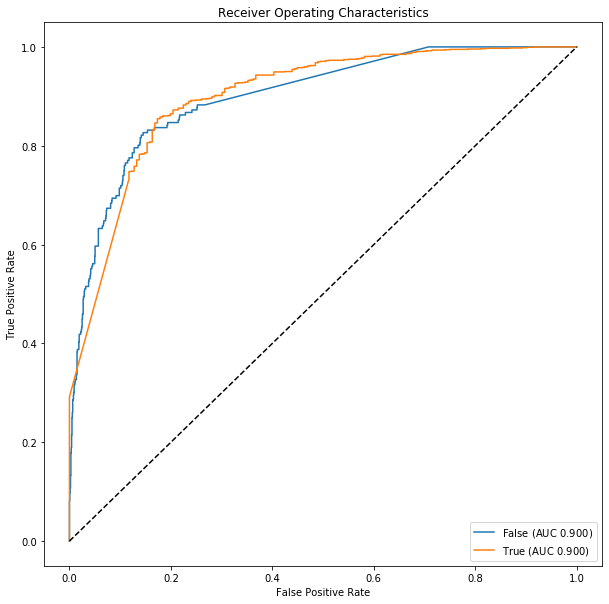

In [156]:
# ROC for Training Data
lucem_illud_2020.plotMultiROC(logistic_l1, train_df)

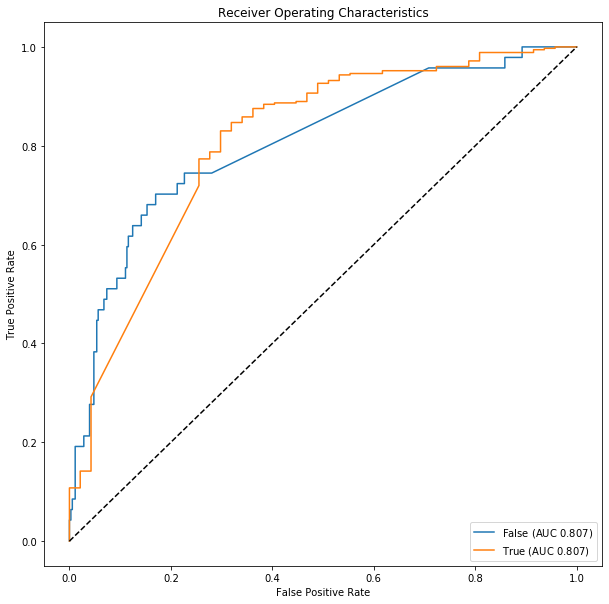

In [157]:
# ROC for Testing Data
lucem_illud_2020.plotMultiROC(logistic_l1, test_df)

# Implement Naïve Bayes classification

In [158]:
naiveBayes = sklearn.naive_bayes.BernoulliNB()
naiveBayes.fit(np.stack(train_df['vect'], axis=0), train_df['category'])

BernoulliNB(alpha=1.0, binarize=0.0, class_prior=None, fit_prior=True)

In [159]:
print("Training:")
print(naiveBayes.score(np.stack(train_df['vect'], axis=0), train_df['category']))
print("Testing:")
print(naiveBayes.score(np.stack(test_df['vect'], axis=0), test_df['category']))

Training:
0.93625
Testing:
0.9


In [160]:
test_df['nb_predict'] = naiveBayes.predict(np.stack(test_df['vect'], axis=0))
test_df['nb_predict_prob_true'] = naiveBayes.predict_proba(np.stack(test_df['vect'], axis=0))[:,0] #other is prop false

In [161]:
print("Precision:")
sklearn.metrics.precision_score(test_df['category'], test_df['nb_predict'])

Precision:


0.9129287598944591

In [162]:
print("Recall:")
sklearn.metrics.recall_score(test_df['category'], test_df['nb_predict'])

Recall:


0.9801699716713881

In [163]:
print("F1-measure:")
sklearn.metrics.f1_score(test_df['category'], test_df['nb_predict'])    

F1-measure:


0.9453551912568305

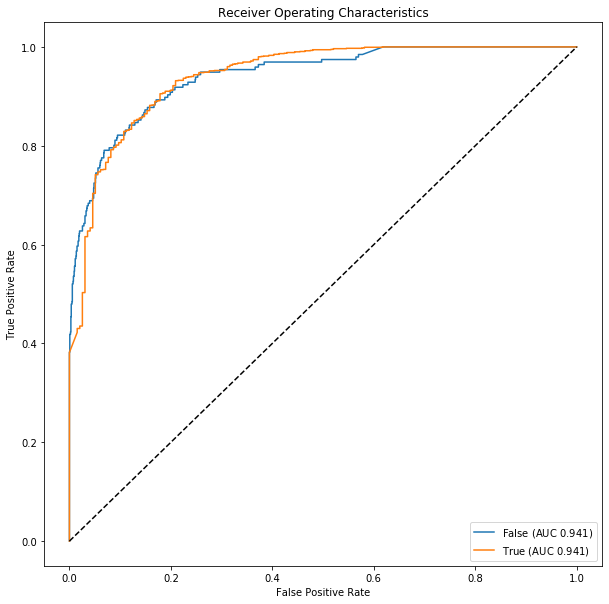

In [164]:
# ROC visualization on training dataset
lucem_illud_2020.plotMultiROC(naiveBayes, train_df)

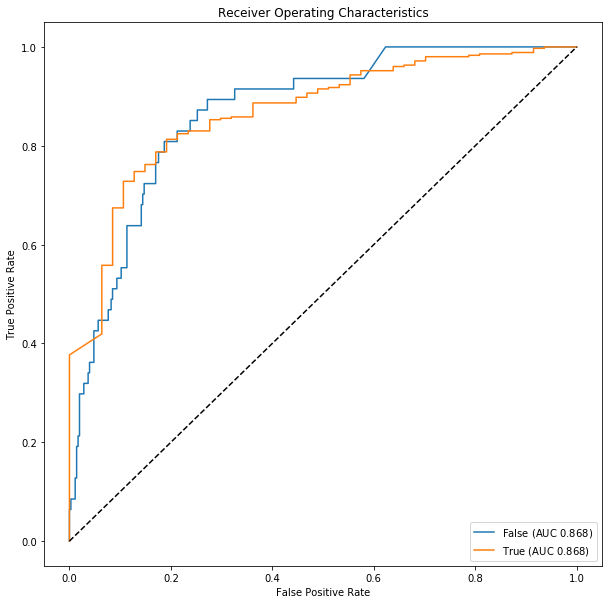

In [165]:
# ROC visualization on testing dataset
lucem_illud_2020.plotMultiROC(naiveBayes, test_df)

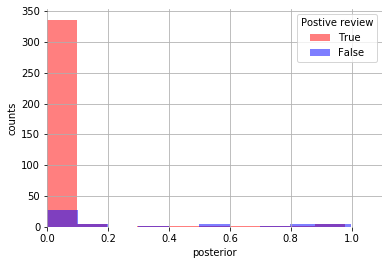

In [166]:
# posterior distribution vs truth
fig, ax = plt.subplots()
ax.grid(False)
ax.set_frame_on(False)
test_df[test_df['category'].eq(True)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'True', color = 'red')
test_df[test_df['category'].eq(False)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'False', color = 'blue')
ax.set_xlim((0,1.1))
ax.legend(title = "Postive review")
ax.set_xlabel('posterior')
ax.set_ylabel('counts')
plt.show()

Based on the evaluation results above, it just works fine.

# Decision Trees

Decision trees can be used to predict both categorical/class labels (i.e., classification) and continuous labels (i.e., regression).

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

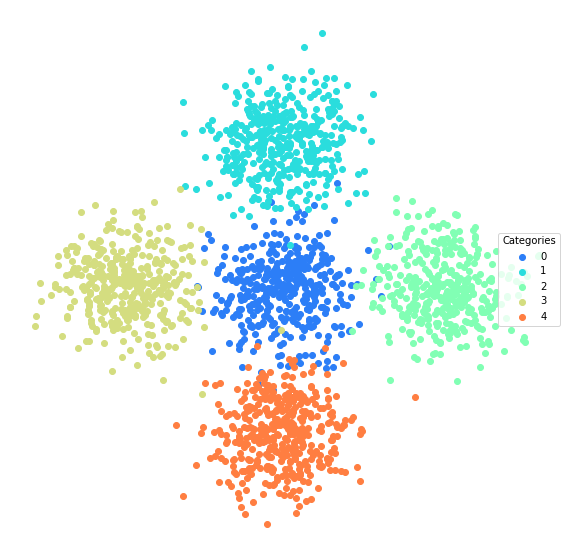

In [167]:
blobs_df = lucem_illud_2020.multiBlobs(noise=.2, centers=[(0,0), (0,5), (5,0), (-5,0), (0,-5)])
df_exampleTree_train, df_exampleTree_test = lucem_illud_2020.trainTestSplit(blobs_df)
lucem_illud_2020.plotter(df_exampleTree_train)

Now we import our Decision Tree classifier from sklearn.tree (familiar syntax) and fit it using the fit method.

In [65]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=4,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=0, splitter='best')

To see what's going on visually with the classification: 

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

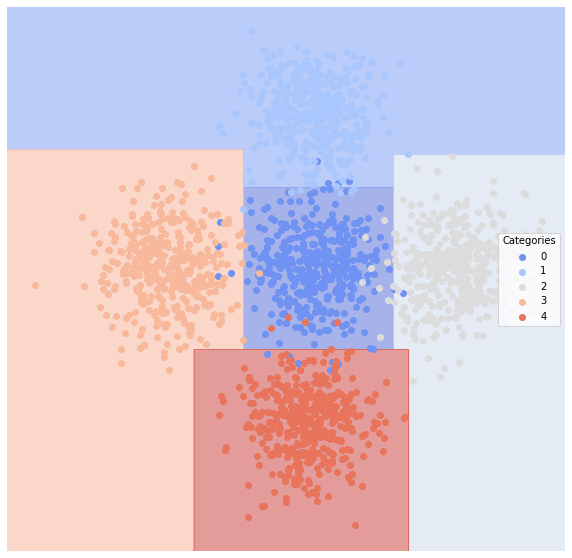

In [66]:
lucem_illud_2020.plotregions(clf_tree, df_exampleTree_train)

In [67]:
lucem_illud_2020.evaluateClassifier(clf_tree, df_exampleTree_test)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.024,0.973236,0.911765,0.889272,0.968750
1,0.008,0.984709,0.990476,0.968706,0.971963
2,0.008,0.985318,0.990909,0.970367,0.973214
3,0.002,0.998762,0.989691,0.989691,1.000000
4,0.006,0.983146,1.000000,0.972292,0.966292


Lets look at accuracy:

In [68]:
sklearn.metrics.accuracy_score(df_exampleTree_test['category'],clf_tree.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))

0.976

What happens if we trim the tree?

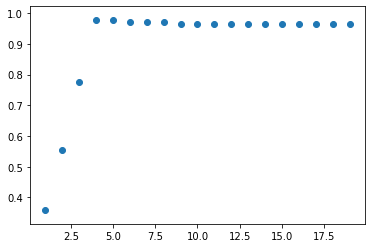

In [69]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])
    score = sklearn.metrics.accuracy_score(df_exampleTree_test['category'], tree2.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

We can select different layers of the decision tree or "prune" it. At approximately four layers down in the decision tree, the shape is somewhat odd, suggesting that our model is overfitting beyond those four layers.

Combining multiple overfitting estimators turns out to be a key idea in machine learning. This is called **bagging** and is a type of **ensemble** method. The idea is to make many randomized estimators--each can overfit, as decision trees are wont to do--but then to combine them, ultimately producing a better classification. A **random forest** is produced by bagging decision trees.

In [70]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10) #Create an instance of our decision tree classifier.

bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data

In [71]:
bag.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category']) #Fit the bagged classifier

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight=None,
                                                        criterion='gini',
                                                        max_depth=10,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=2,
                                                        min_weight_fraction_leaf=0.0,
                                                        presort=False,
                                                        random_state=None,
                                                        splitter='best'),
      

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

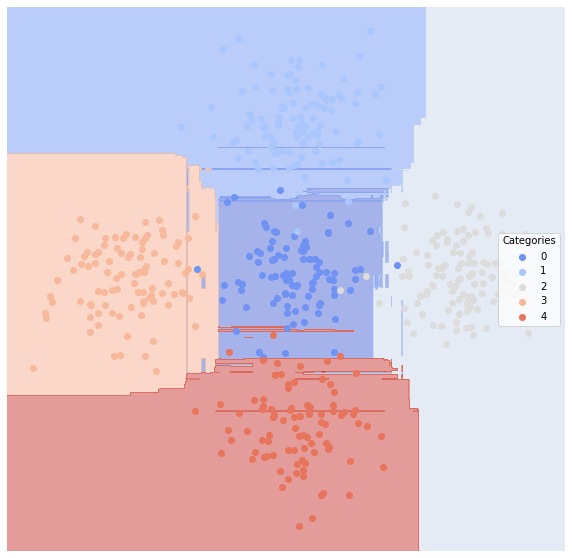

In [72]:
lucem_illud_2020.plotregions(bag, df_exampleTree_test)

In [73]:
lucem_illud_2020.evaluateClassifier(bag, df_exampleTree_test)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.028,0.962820,0.910000,0.872604,0.947917
1,0.008,0.988110,0.981308,0.966966,0.981308
2,0.006,0.989783,0.990991,0.977295,0.982143
3,0.002,0.998762,0.989691,0.989691,1.000000
4,0.012,0.970694,0.988235,0.942716,0.943820


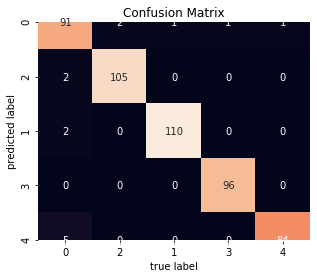

In [74]:
lucem_illud_2020.plotConfusionMatrix(bag, df_exampleTree_test)

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">In the cells immediately following, perform decision tree and random forest classification (binary, multinomial or continuous) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. As with ***Exercise 2***, these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week. Visualize the classification of data points. Calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Now build an ensemble classifier by bagging trees into a random forest. Visualize the result. How do these classifiers perform? What does ensemble learning do?

## Implement Decision Tree

In [168]:
# Train the model
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(train_df['vect'], axis =0), train_df['category'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=4,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=0, splitter='best')

In [169]:
#Add to dataframe
test_df['decision_tree_predict'] = clf_tree.predict(np.stack(test_df['vect'], axis=0))

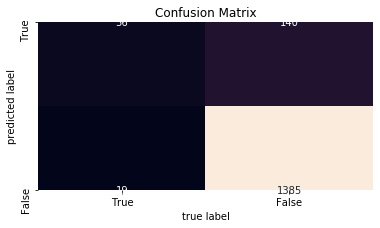

In [170]:
# Confusion Matrix for training dataset
lucem_illud_2020.plotConfusionMatrix(clf_tree, train_df)

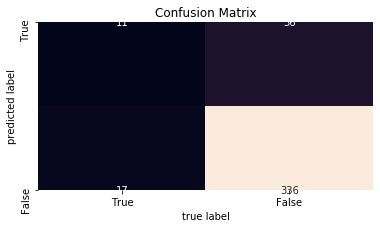

In [171]:
# Confusion Matrix for testing dataset
lucem_illud_2020.plotConfusionMatrix(clf_tree, test_df)

In [172]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['decision_tree_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['decision_tree_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(test_df['category'], test_df['decision_tree_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['decision_tree_predict'], average = 'weighted'))

Accuracy Score:  0.8675
Precision Score:  0.8432574884792626
Recall:  0.8675
F1 Score:  0.8524528735632185


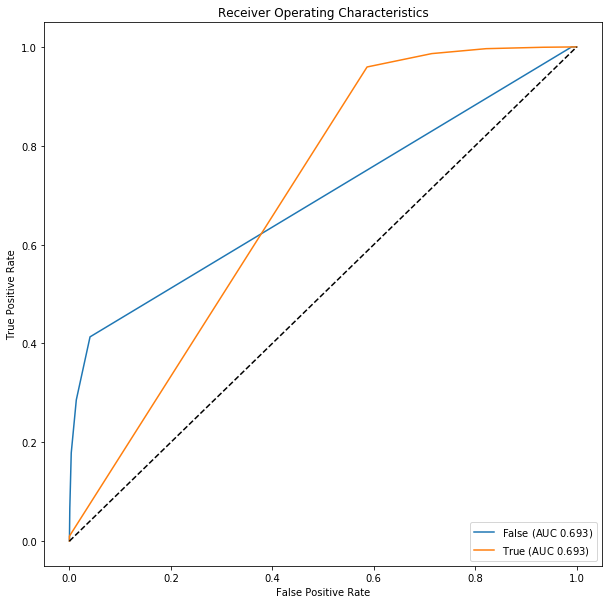

In [173]:
# ROC for training dataset
lucem_illud_2020.plotMultiROC(clf_tree, train_df)

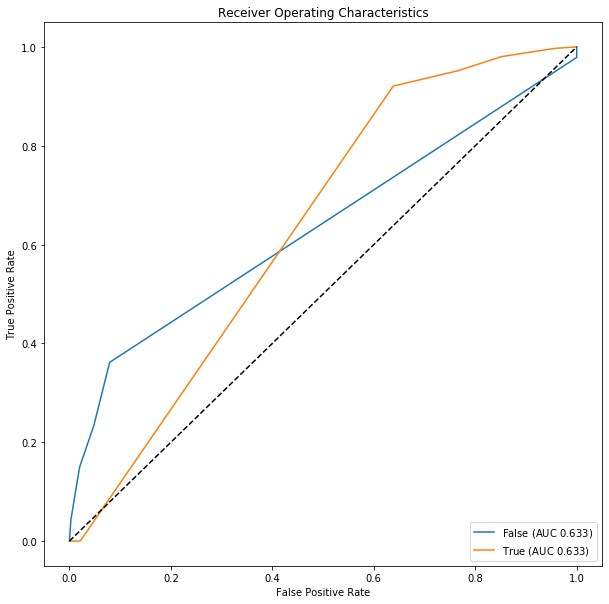

In [174]:
# ROC for testing dataset
lucem_illud_2020.plotMultiROC(clf_tree, test_df)

## Implement Random Forest

In [175]:
# Train the model
clf_rf = sklearn.ensemble.RandomForestClassifier() # use default settings
clf_rf.fit(np.stack(train_df['vect'], axis =0), train_df['category'])

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [176]:
#Add to dataframe
test_df['rf_not_bagging'] = clf_rf.predict(np.stack(test_df['vect'], axis=0))

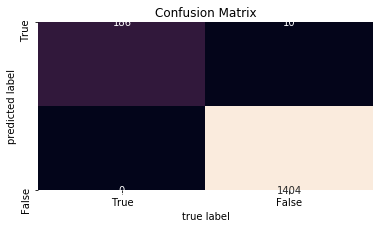

In [177]:
# Confusion Matrix for training dataset
lucem_illud_2020.plotConfusionMatrix(clf_rf, train_df)

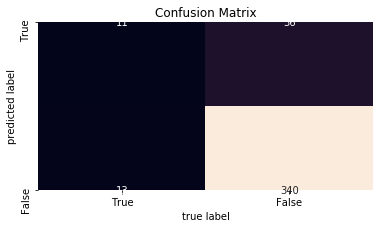

In [178]:
# Confusion Matrix for testing dataset
lucem_illud_2020.plotConfusionMatrix(clf_rf, test_df)

In [179]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['rf_not_bagging']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['rf_not_bagging'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(test_df['category'], test_df['rf_not_bagging'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['rf_not_bagging'], average = 'weighted'))

Accuracy Score:  0.8775
Precision Score:  0.851859485815603
Recall:  0.8775
F1 Score:  0.8595908924051854


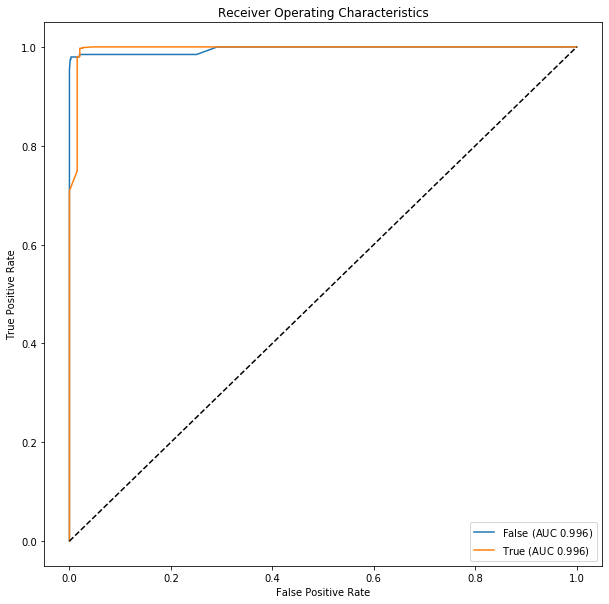

In [180]:
# ROC for training dataset
lucem_illud_2020.plotMultiROC(clf_rf, train_df)

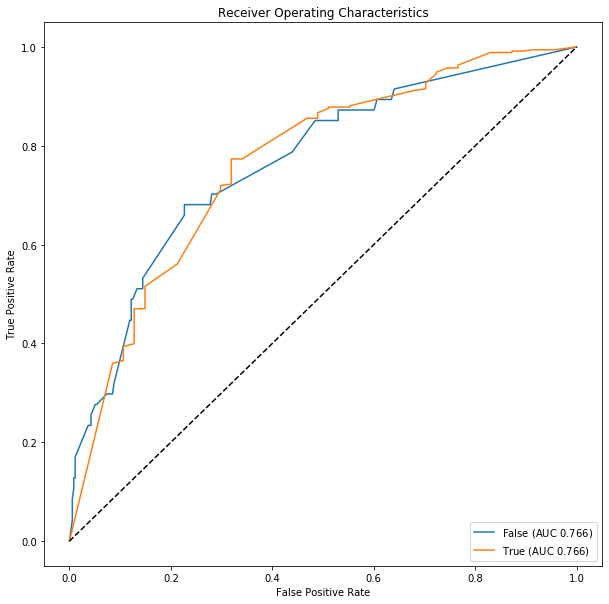

In [181]:
# ROC for testing dataset
lucem_illud_2020.plotMultiROC(clf_rf, test_df)

## Implement bagging trees

In [182]:
# Train the model
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10)
bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1)
bag.fit(np.stack(train_df['vect'], axis =0), train_df['category'])

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight=None,
                                                        criterion='gini',
                                                        max_depth=10,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=2,
                                                        min_weight_fraction_leaf=0.0,
                                                        presort=False,
                                                        random_state=None,
                                                        splitter='best'),
      

In [183]:
#Add to dataframe
test_df['random_forest_predict'] = bag.predict(np.stack(test_df['vect'], axis=0))

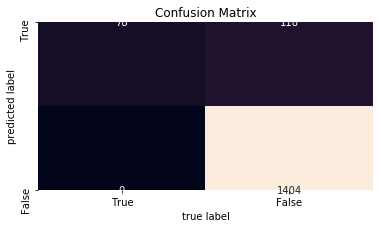

In [184]:
# Confusion Matrix with training dataset
lucem_illud_2020.plotConfusionMatrix(bag, train_df)

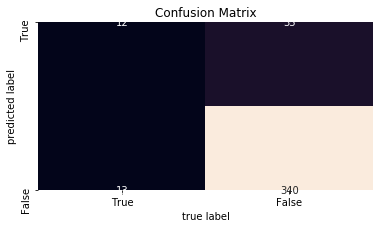

In [185]:
# Confusion Matrix with testing dataset
lucem_illud_2020.plotConfusionMatrix(bag, test_df)

In [186]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['random_forest_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['random_forest_predict'], average = 'weighted')) #precision
print('Recall: ', sklearn.metrics.recall_score(test_df['category'], test_df['random_forest_predict'], average = 'weighted')) #recall
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['random_forest_predict'], average = 'weighted')) #F-1 measure

Accuracy Score:  0.88
Precision Score:  0.8565333333333334
Recall:  0.88
F1 Score:  0.8634798534798536


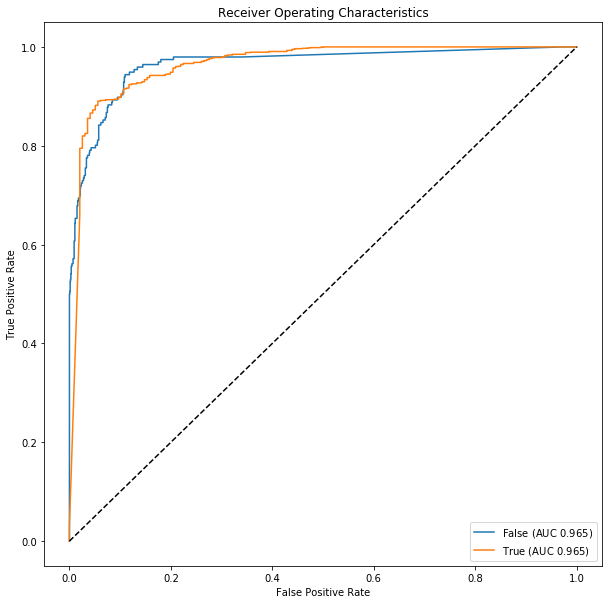

In [187]:
# ROC for traing dataset
lucem_illud_2020.plotMultiROC(bag, train_df)

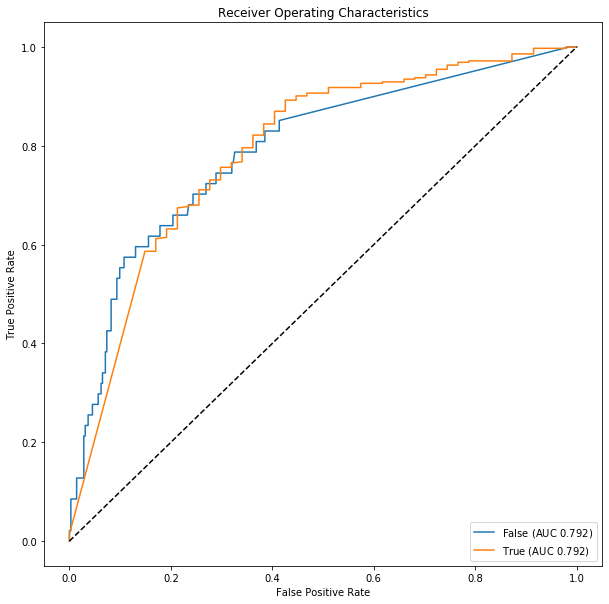

In [188]:
# ROC for testing dataset
lucem_illud_2020.plotMultiROC(bag, test_df)

For my dataset,random forest performs better than decision tree. And random forest implemented by the built-in package has similar performance with bagging decison trees. 

# K-Nearest Neighbors

The K-Nearest neighbors classifier takes a simpler premise than those before: Find the closest labeled datapoint in set and "borrow" its label.

Let's use newsgroup data again.

In [75]:
newsgroupsDF[:5]

,text,category,source_file,tokenized_text,normalized_text
0,\n\nParadise and salvation are not the same th...,talk.religion.misc,../data/20news_home/20news-bydate-train/talk.r...,"[Paradise, and, salvation, are, not, the, same...","[paradise, salvation, thing, salvation, better..."
1,\nYou're admitting a lot more than that. You ...,talk.religion.misc,../data/20news_home/20news-bydate-train/talk.r...,"[You, 're, admitting, a, lot, more, than, that...","[admit, lot, admit, moral, situational, admit,..."
2,"\n\nJesus also recognized other holy days, lik...",talk.religion.misc,../data/20news_home/20news-bydate-train/talk.r...,"[Jesus, also, recognized, other, holy, days, l...","[jesus, recognize, holy, day, like, passover, ..."
3,In <lsjc8cINNmc1@saltillo.cs.utexas.edu> turpi...,talk.religion.misc,../data/20news_home/20news-bydate-train/talk.r...,"[In, <, lsjc8cINNmc1@saltillo.cs.utexas.edu, >...","[<, lsjc8cinnmc1@saltillo.cs.utexas.edu, >, tu..."
4,"\nI'm sorry, but He does not! Ever read the F...",talk.religion.misc,../data/20news_home/20news-bydate-train/talk.r...,"[I, 'm, sorry, but, He, does, not, Ever, read,...","[m, sorry, read, commandment]"


Make a testing and training set:

In [76]:
holdBackFraction = .2
train_ng_df, test_ng_df = lucem_illud_2020.trainTestSplit(newsgroupsDF, holdBackFraction=holdBackFraction)

Let's initialize our k-nearest neighbors classifier:

In [77]:
n_neighbors = 15
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

Let's try to classify using the TF-IDF vectors:

In [78]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

In [79]:
clf_knearest.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=15, p=2,
                     weights='uniform')

In [80]:
lucem_illud_2020.evaluateClassifier(clf_knearest, train_ng_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
sci.space,0.348230,0.617767,0.408451,0.349561,0.540373
comp.graphics,0.337783,0.627542,0.412698,0.350375,0.550847
talk.religion.misc,0.259431,0.634114,0.331002,0.248498,0.470199
soc.religion.christian,0.255949,0.526824,1.000000,0.309597,0.053648


And lets look at the testing data

In [81]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = clf_knearest.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(clf_knearest.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Testing score:
0.2372093023255814


Let's produce another confusion matrix:

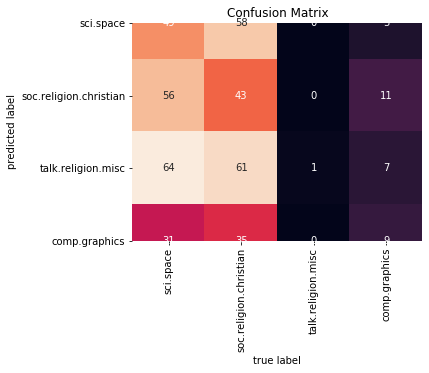

In [82]:
lucem_illud_2020.plotConfusionMatrix(clf_knearest, test_ng_df)

You can produce the PCA space visual if you want, altough it can take a very long time, so we'll leave it optionally commented out:

In [83]:
#lucem_illud_2020.plotregions(clf_knearest, test_ng_df)

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">In the cells immediately following, perform and visualize k-nearest neighbor classification using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. Visualize the classification of data points and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Articulate how the *k*-nearest neighbor approach relates to *k*-means clustering explored in ***week 3***?

## Implement KNN

In [189]:
n_neighbors = 5
weights = "uniform"
clf_knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
clf_knn.fit(np.stack(train_df['vect'], axis = 0), train_df['category'])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [190]:
#Add to dataframe
test_df['knn_predict'] = clf_knn.predict(np.stack(test_df['vect'], axis=0))

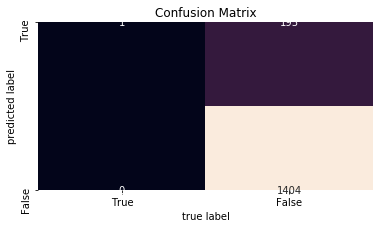

In [191]:
# Confusion Matrix with training dataset
lucem_illud_2020.plotConfusionMatrix(clf_knn, train_df)

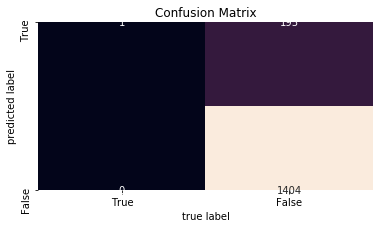

In [192]:
# Confusion Matrix with testing dataset
lucem_illud_2020.plotConfusionMatrix(clf_knn, train_df)

In [193]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['knn_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['knn_predict'], average = 'weighted')) #precision
print('Recall: ', sklearn.metrics.recall_score(test_df['category'], test_df['knn_predict'], average = 'weighted')) #recall
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['knn_predict'], average = 'weighted')) #F-1 measure

Accuracy Score:  0.8825
Precision Score:  0.7788062499999999
Recall:  0.8825
F1 Score:  0.8274169986719788


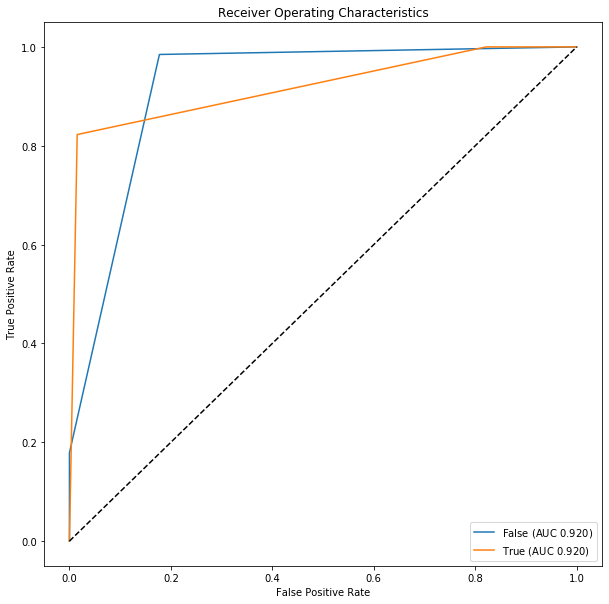

In [194]:
# ROC for training dataset
lucem_illud_2020.plotMultiROC(clf_knn, train_df)

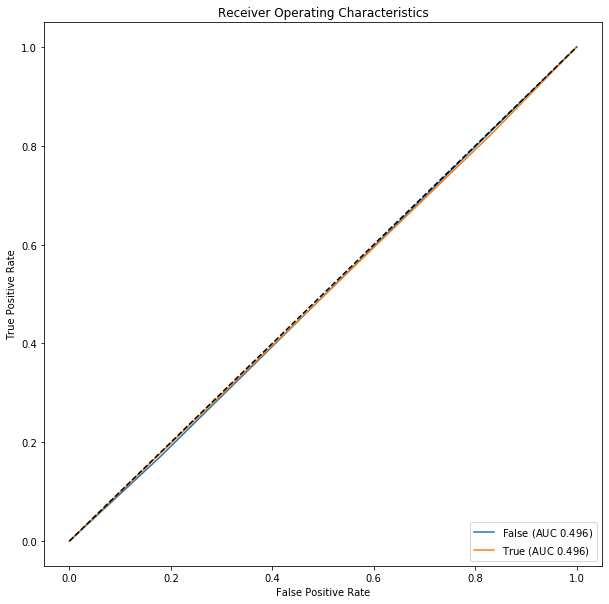

In [195]:
# ROC for testing dataset
lucem_illud_2020.plotMultiROC(clf_knn, test_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


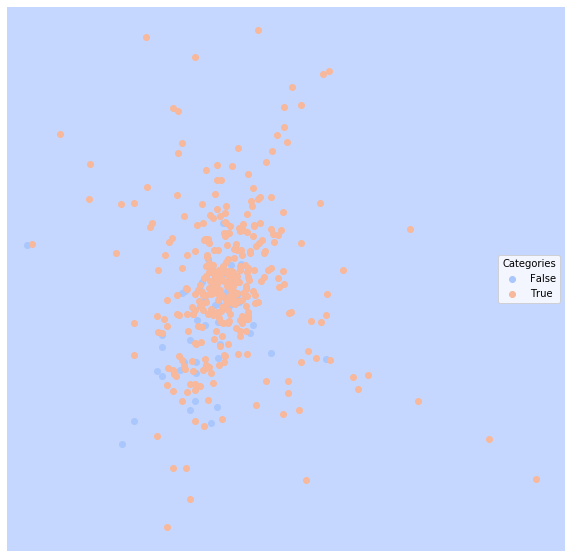

In [196]:
lucem_illud_2020.plotregions(clf_knn, test_df)

Based on the results above, KNN doesn't perform well on my dataset. KNN is a supervised algorithm used for classification. What this means is that we have some labeled data upfront which we provide to the model for it to understand the dynamics within that data i.e. train. It then uses those learnings to make inferences on the unseen data i.e. test. In the case of classification this labeled data is discrete in nature. While k-Means is an unsupervised algorithm used for clustering. By unsupervised we mean that we don’t have any labeled data upfront to train the model. Hence the algorithm just relies on the dynamics of the independent features to make inferences on unseen data.

# SVMs

Now we will examine Support Vector Machines, an approach that creates the partition that preserves the "maximum margin" between classes.

We will use a few sub forums from reddit--which tend to share text rather than memes--namely `talesfromtechsupport`, `badroommates`, `weeabootales` and `relationships`. The top 100 text posts from each have been saved to `data/reddit.csv`.

In [84]:
redditDf = pandas.read_csv('../data/reddit.csv', index_col = 0)

#Drop a couple missing values

redditDf = redditDf.dropna()

#Set category

redditDf['category'] = redditDf['subreddit']

#tokenize and normalize
redditDf['tokenized_text'] = redditDf['text'].apply(lambda x: lucem_illud_2020.word_tokenize(x))
redditDf['normalized_text'] = redditDf['tokenized_text'].apply(lambda x: lucem_illud_2020.normalizeTokens(x))

We will tf.idf the data to make our vectors:

In [85]:
redditTFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.5, min_df=3, stop_words='english', norm='l2')
redditTFVects = redditTFVectorizer.fit_transform([' '.join(l) for l in redditDf['normalized_text']])
redditDf['vect'] = [np.array(v).flatten() for v in redditTFVects.todense()]

Initilize the model and make a train test split:

In [86]:
holdBackFraction = .2
train_redditDf, test_redditDf = lucem_illud_2020.trainTestSplit(redditDf, holdBackFraction=holdBackFraction)

In [87]:
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
#probability = True is slower but  lets you call predict_proba()
clf_svm.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='linear', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

...and consider the results:

In [88]:
lucem_illud_2020.evaluateClassifier(clf_svm, test_redditDf)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
Tales From Tech Support,0.015674,0.985424,0.952381,0.943758,0.987654
Relationships,0.028213,0.959650,0.948052,0.902953,0.935897
Weeaboo Tales: stories about the extreme fans of japanese culture,0.009404,0.989440,0.974684,0.965322,0.987179
Bad Roommates: Tales of Irritation,0.021944,0.965293,0.974684,0.930926,0.939024


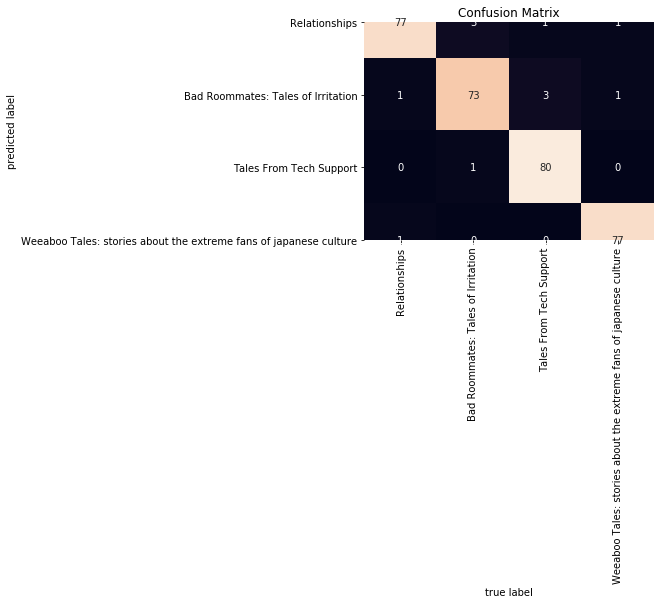

In [89]:
lucem_illud_2020.plotConfusionMatrix(clf_svm, test_redditDf)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

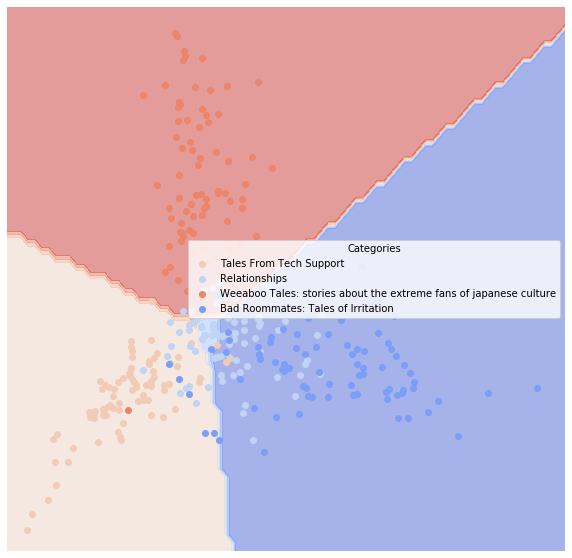

In [90]:
lucem_illud_2020.plotregions(clf_svm, test_redditDf)

# Neural Nets

We include an example of a simple neural network, the Multi-layer Perceptron (MLP) that learns a function $f(\cdot): R^m \rightarrow R^o$ by training on a dataset, where $m$ is the number of dimensions for input and $o$ is the number of dimensions for output. Given a set of features $X = {x_1, x_2, ..., x_m}$ and a target $y$, it can learn a non-linear function approximator for either classification or regression. It is different from logistic regression, in that between the input and the output layer, there can be one or more non-linear layers, called hidden layers. The following figure shows a one hidden layer MLP with scalar output. ![title](../data/multilayerperceptron_network.png) The leftmost layer, known as the input layer, consists of a set of "neurons" $\{x_i | x_1, x_2, ..., x_m\}$ representing the input features (e.g., weighted words). Each neuron in the hidden layer transforms the values from the previous layer with a weighted linear summation $w_1x_1 + w_2x_2 + ... + w_mx_m$, followed by a non-linear activation function $g(\cdot):R \rightarrow R$ - like the logistic or hyperbolic tan function. The output layer receives the values from the last hidden layer and transforms them into output values.

In [91]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)

In [92]:
lucem_illud_2020.evaluateClassifier(clf_nn, test_redditDf)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
Tales From Tech Support,0.012539,0.983453,0.975309,0.957497,0.975309
Relationships,0.037618,0.949090,0.923077,0.870880,0.923077
Weeaboo Tales: stories about the extreme fans of japanese culture,0.009404,0.989440,0.974684,0.965322,0.987179
Bad Roommates: Tales of Irritation,0.028213,0.961073,0.950617,0.908327,0.939024


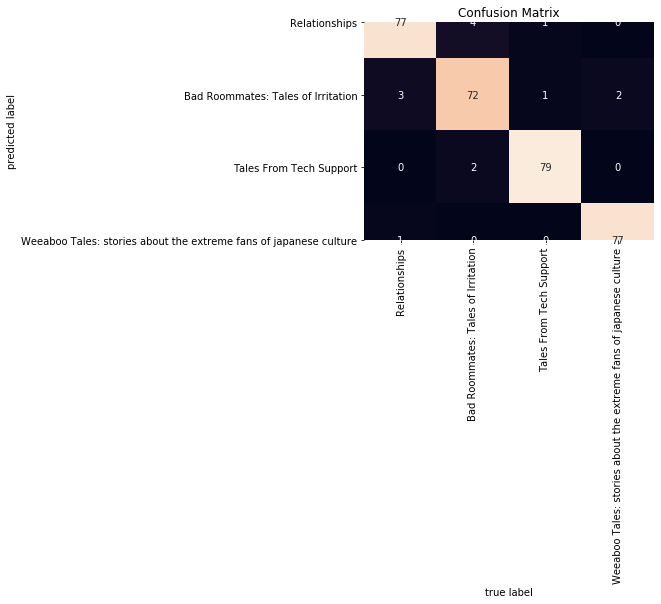

In [93]:
lucem_illud_2020.plotConfusionMatrix(clf_nn, test_redditDf)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

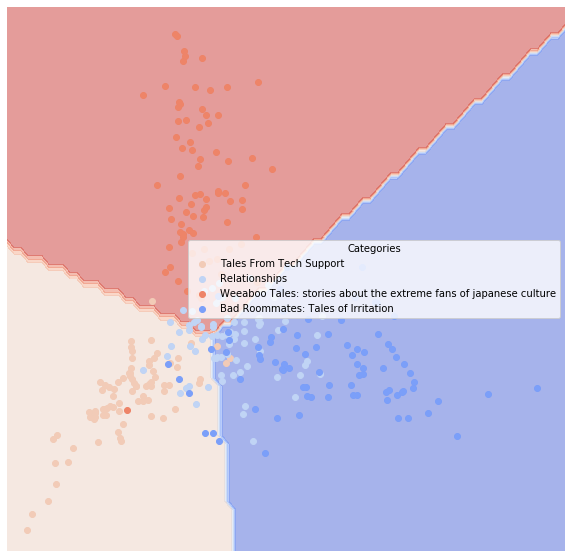

In [94]:
lucem_illud_2020.plotregions(clf_nn, test_redditDf)

It performs very well.

## <span style="color:red">*Exercise 5*</span>

<span style="color:red">In the cells immediately following, perform a neural network classification and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). How does this classify relevant to *k*-nearest neighbor, Naive Bayes, logistic and decision-tree approaches?

In [197]:
# Train the model
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_df['vect'], axis=0), train_df['category'])

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)

In [198]:
#Add to dataframe
test_df['nn_predict'] = clf_nn.predict(np.stack(test_df['vect'], axis=0))

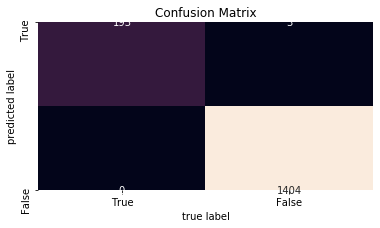

In [199]:
# Confusion Matrix with training dataset
lucem_illud_2020.plotConfusionMatrix(clf_nn, train_df)

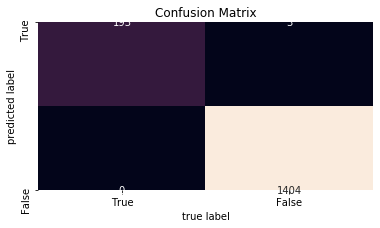

In [200]:
# Confusion Matrix with testing dataset
lucem_illud_2020.plotConfusionMatrix(clf_nn, train_df)

In [201]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['nn_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['nn_predict'], average = 'weighted')) #precision
print('Recall: ', sklearn.metrics.recall_score(test_df['category'], test_df['nn_predict'], average = 'weighted')) #recall
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['nn_predict'], average = 'weighted')) #F-1 measure

Accuracy Score:  0.895
Precision Score:  0.8767737285203552
Recall:  0.895
F1 Score:  0.8787260273972602


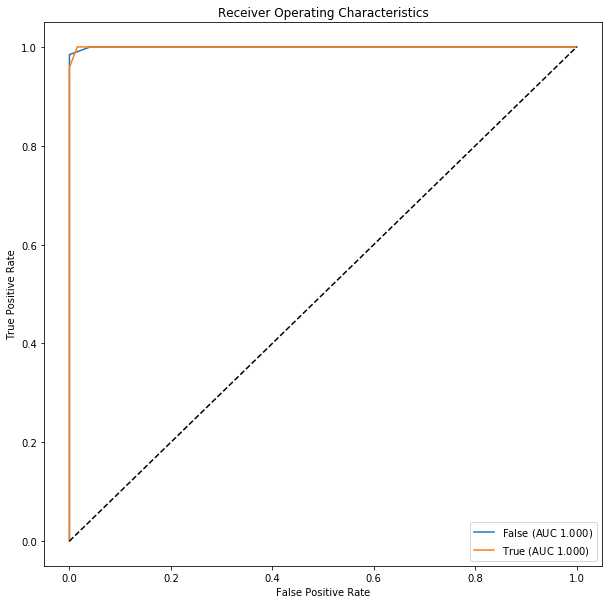

In [202]:
# ROC for training dataset
lucem_illud_2020.plotMultiROC(clf_nn, train_df)

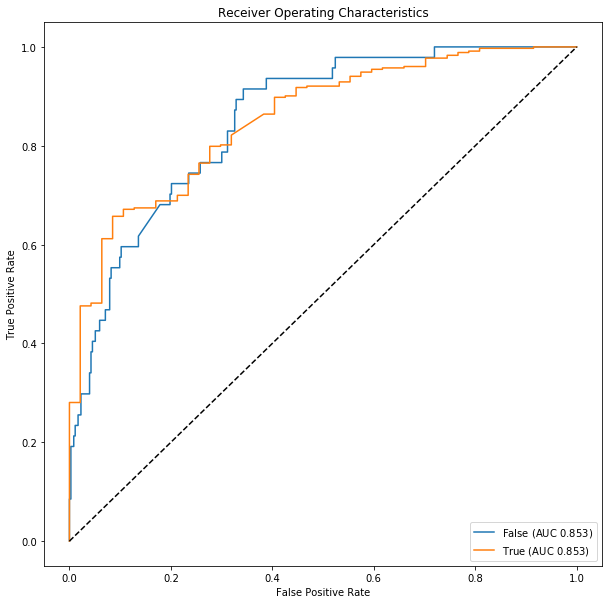

In [203]:
# ROC for Testing dataset
lucem_illud_2020.plotMultiROC(clf_nn, test_df)

For my dataset, neural network performs better than KNN, Naive Bayes, logistic and decision-tree.